# TODO
## Creating pipeline
- research docs and forums:
  - how to store meta/extra data like training performance and final performance (accuracy)
  - how to perserve tree of inference (so we be able in any moment could experiment with range of hyper parameters and choose better values)
  - how could we store tf model that we be able to get it by tensorflow.js? ([store keras model](https://keras.io/getting-started/faq/#how-can-i-save-a-keras-model), [import keras model to tensorflow.js](https://js.tensorflow.org/tutorials/import-keras.html))
- snapshots (be able to store and continue from any point of training)
  - https://www.tensorflow.org/guide/saved_model
  - https://www.tensorflow.org/guide/checkpoints
  - https://datascience.stackexchange.com/questions/20506/tensorflow-resume-training-in-middle-of-an-epoch save and restore to resume stoped model training

## Other
- it seems cnn filters train too slow
  - it is normal speed?
  - how could we increase speed?
- much deeper cnn
- statistics of the layers: distribution, dynamic of distribution, zeros (dead nodes), speed of accuracy (delta accuracy to delta time) and etc
- after each epoch calculate and store accuracy for (training and validation dataset)
- take a look on tensorflow board
- can I use kaggle? it has GPU: 
  - examples of usage: https://www.kaggle.com/kmader/attention-on-pretrained-vgg16-for-bone-age/notebook
  - https://www.kaggle.com/mrisdal/intro-to-lstms-w-keras-gpu-for-text-generation/notebook
  - [other](https://www.kaggle.com/kernels?sortBy=relevance&group=everyone&search=GPU&page=1&pageSize=20&utm_medium=email&utm_source=mailchimp&utm_campaign=gpu+launch+1)
- take a look on other implementations
  - [resnet + densenet](https://chatbotslife.com/resnets-highwaynets-and-densenets-oh-my-9bb15918ee32)

# Theory
- https://www.youtube.com/watch?v=Xogn6veSyxA Convolutional Networks by Ian Goodfellow

# DONE
- should batchnorm comes before rule or after? And does it matter? And what about dropout?

# Additional
- heat map of importancy of image region, set mask and hide different regions of image (track alternative categories)

# Similar to Keras
- fit return history with training and validation accuracy dynamic, what is similar to what we do in run_model + estimate_model methods.

In [2]:
import tensorflow as tf
import numpy as np
import math
import time
import timeit
import matplotlib.pyplot as plt
%matplotlib inline
import pandas as pd
from IPython.display import display, HTML

import cifar.loader
from nn.affine import affine
from nn.cnn import cnn
from nn_visualization.draw_cnn_layer import draw_layers_of_models
from nn_visualization.graphics import show_graphs
from nn_visualization.tables import show_tables
from runner.estimate_model import estimate_model
from runner.model_runner import run_model

# for auto-reloading external modules
# see http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 2

/opt/conda/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [3]:
# Invoke the above function to get our data.
X_train, y_train, X_val, y_val, X_test, y_test = cifar.loader.get_CIFAR10_data()
print('Train data shape: ', X_train.shape)
print('Train labels shape: ', y_train.shape)
print('Validation data shape: ', X_val.shape)
print('Validation labels shape: ', y_val.shape)
print('Test data shape: ', X_test.shape)
print('Test labels shape: ', y_test.shape)

Train data shape:  (49000, 32, 32, 3)
Train labels shape:  (49000,)
Validation data shape:  (1000, 32, 32, 3)
Validation labels shape:  (1000,)
Test data shape:  (10000, 32, 32, 3)
Test labels shape:  (10000,)


In [21]:
def simple_model_1(X, y, is_training, dropout=None, **kwars):
    """
    define our graph (e.g. two_layer_convnet)
    """
    # CNN -> rule
    out = X

    out, [W1, b1] = cnn(idx=1, X=out, filters=32, kernel_size=(7,7), is_training=is_training, padding='VALID', use_batchnorm=False)

    if dropout is not None:    
        out = tf.layers.dropout(out, rate=dropout, training=is_training)
   
    out, _ = affine(1, out, output_size=10)
    # return variabes which we'd like to evaluate
    return out, [W1,]

local_models = []
local_models.append(estimate_model({
    'group': 'simple',
    'name': 'without dropout',
    'scheme': ['CNN', 'relu', 'FC'],
    'learning_rate': 1e-4,
    'model_builder': simple_model_1,
    'num_of_epochs': 1,
}, X_train, y_train, X_val, y_val))

local_models.append(estimate_model({
    'group': 'simple',
    'name': 'Dropout 0.2',
    'scheme': ['CNN', 'relu', 'FC'],
    'learning_rate': 1e-4,
    'model_builder': simple_model_1,
    'dropout': 0.2,
    'num_of_epochs': 1,
}, X_train, y_train, X_val, y_val))

local_models.append(estimate_model({
    'group': 'simple',
    'name': 'Dropout 0.4',
    'scheme': ['CNN', 'relu', 'FC'],
    'learning_rate': 1e-4,
    'model_builder': simple_model_1,
    'dropout': 0.4,
    'num_of_epochs': 1,
}, X_train, y_train, X_val, y_val))

Training
INFO:tensorflow:Restoring parameters from ./snapshots/simple/without-dropout/model
haven't restore snapshot ./snapshots/simple/without-dropout/model
Iteration 0: with minibatch training loss = 33 and accuracy of 0.094
Iteration 100: with minibatch training loss = 8.89 and accuracy of 0.36
Iteration 200: with minibatch training loss = 9.89 and accuracy of 0.19
Iteration 300: with minibatch training loss = 7.46 and accuracy of 0.23
Iteration 400: with minibatch training loss = 5.91 and accuracy of 0.34


KeyboardInterrupt: 

Model without dropout


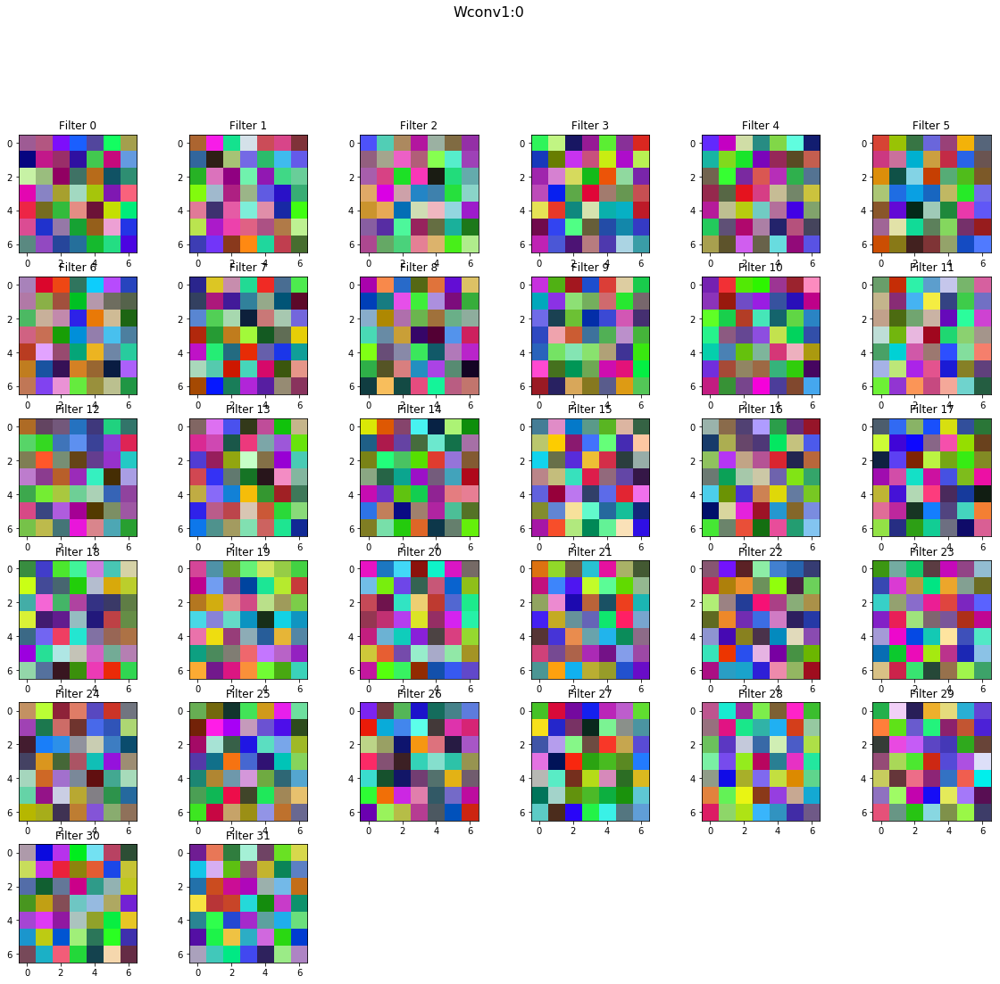

Model Dropout 0.2


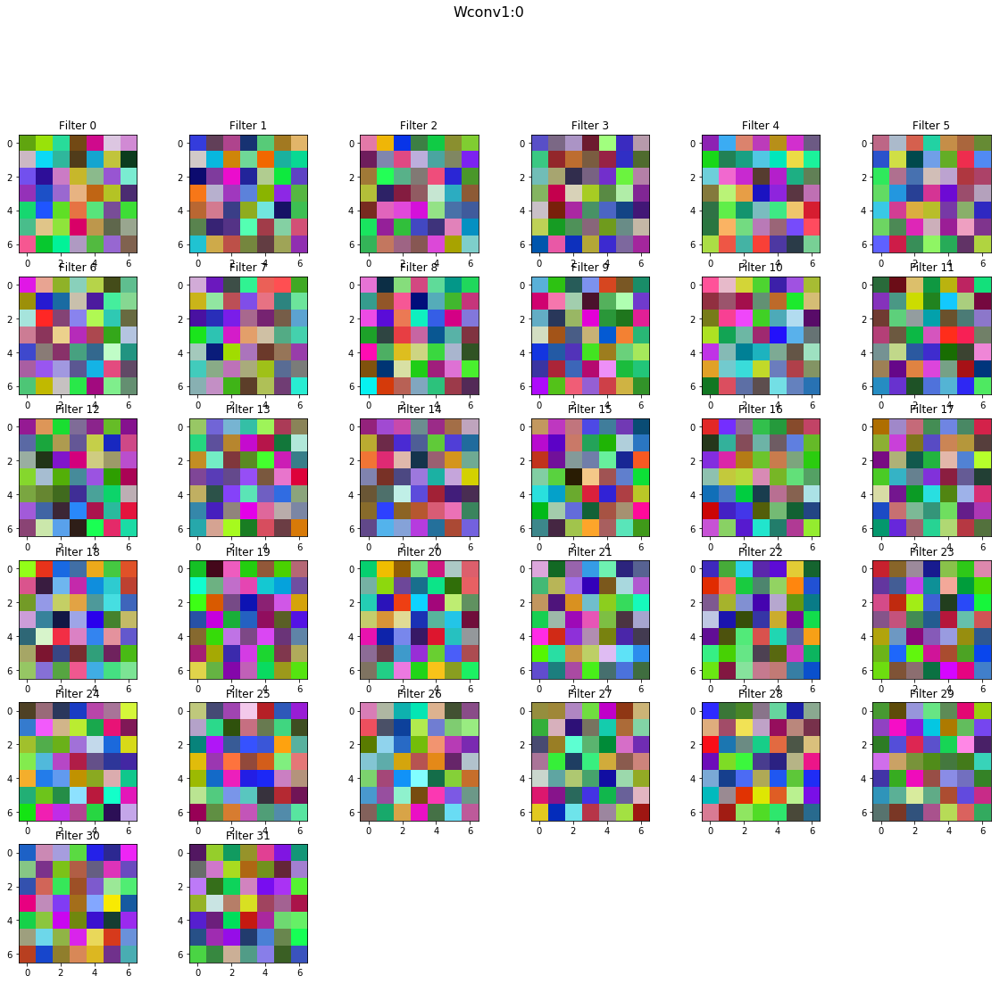

Model Dropout 0.4


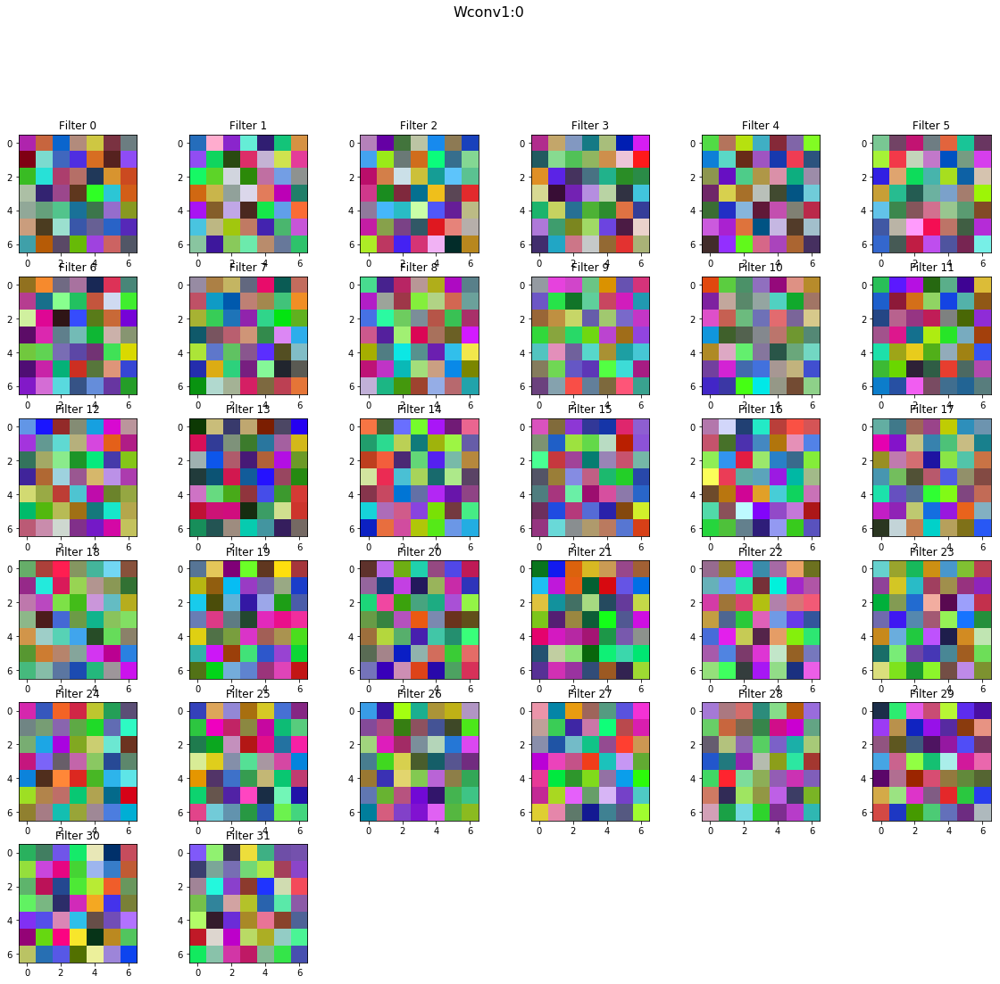

In [12]:
draw_layers_of_models(local_models)

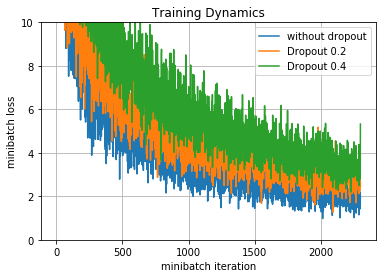

model: without dropout


,predict,training,validation
total_correct,NaN,0.518653,0.46
total_lost,NaN,2.17747,2.74122
time,0.04339,187.924,0.870778


model: Dropout 0.2


,predict,training,validation
total_correct,NaN,0.458367,0.47
total_lost,NaN,3.01181,2.53164
time,0.04196,193.869,0.626914


model: Dropout 0.4


,predict,training,validation
total_correct,NaN,0.429184,0.488
total_lost,NaN,3.81293,2.62836
time,0.048394,182.551,0.516966


In [102]:
show_graphs(local_models, ymax=10)
show_tables(local_models)

Training
Iteration 0: with minibatch training loss = 3.19 and accuracy of 0.14
Iteration 100: with minibatch training loss = 2.17 and accuracy of 0.23
Iteration 200: with minibatch training loss = 1.41 and accuracy of 0.53
Iteration 300: with minibatch training loss = 1.59 and accuracy of 0.41
Iteration 400: with minibatch training loss = 1.48 and accuracy of 0.55
Iteration 500: with minibatch training loss = 1.52 and accuracy of 0.55
Iteration 600: with minibatch training loss = 1.36 and accuracy of 0.58
Iteration 700: with minibatch training loss = 1.59 and accuracy of 0.47
Epoch 1, Overall loss = 1.63 and accuracy of 0.448


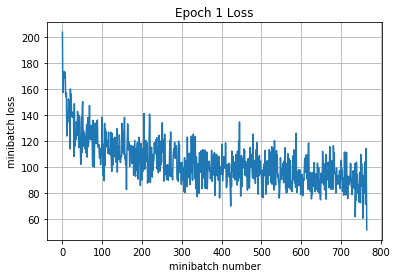

Iteration 800: with minibatch training loss = 1.32 and accuracy of 0.53
Iteration 900: with minibatch training loss = 1.37 and accuracy of 0.44
Iteration 1000: with minibatch training loss = 1.19 and accuracy of 0.61
Iteration 1100: with minibatch training loss = 1.68 and accuracy of 0.48
Iteration 1200: with minibatch training loss = 1.17 and accuracy of 0.58
Iteration 1300: with minibatch training loss = 1.22 and accuracy of 0.64
Iteration 1400: with minibatch training loss = 1.08 and accuracy of 0.66
Iteration 1500: with minibatch training loss = 1.08 and accuracy of 0.62
Epoch 2, Overall loss = 1.28 and accuracy of 0.559


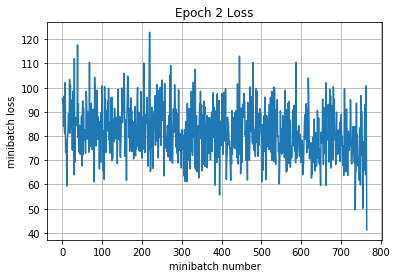

Iteration 1600: with minibatch training loss = 1.5 and accuracy of 0.48
Iteration 1700: with minibatch training loss = 1.36 and accuracy of 0.55
Iteration 1800: with minibatch training loss = 1.25 and accuracy of 0.61
Iteration 1900: with minibatch training loss = 0.964 and accuracy of 0.64
Iteration 2000: with minibatch training loss = 1.16 and accuracy of 0.62
Iteration 2100: with minibatch training loss = 0.975 and accuracy of 0.66
Iteration 2200: with minibatch training loss = 1.33 and accuracy of 0.53
Epoch 3, Overall loss = 1.13 and accuracy of 0.61


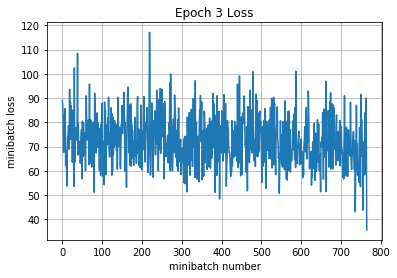

training time (seconds) 364.85383200000797
Validation
Epoch 1, Overall loss = 1.24 and accuracy of 0.586
validation time (seconds) 0.9450718000007328
predict
Epoch 1, Overall loss = 0.179 and accuracy of 1
Training
Iteration 0: with minibatch training loss = 3.43 and accuracy of 0.094
Iteration 100: with minibatch training loss = 2 and accuracy of 0.27
Iteration 200: with minibatch training loss = 1.96 and accuracy of 0.41
Iteration 300: with minibatch training loss = 1.84 and accuracy of 0.42
Iteration 400: with minibatch training loss = 1.84 and accuracy of 0.38
Iteration 500: with minibatch training loss = 1.39 and accuracy of 0.52
Iteration 600: with minibatch training loss = 1.57 and accuracy of 0.52
Iteration 700: with minibatch training loss = 1.7 and accuracy of 0.42
Epoch 1, Overall loss = 1.78 and accuracy of 0.418


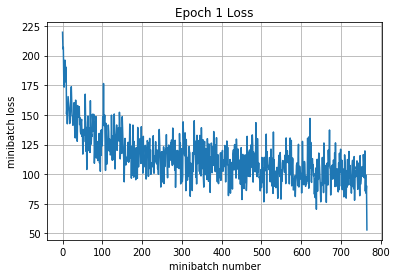

Iteration 800: with minibatch training loss = 1.2 and accuracy of 0.61
Iteration 900: with minibatch training loss = 1.46 and accuracy of 0.53
Iteration 1000: with minibatch training loss = 1.63 and accuracy of 0.42
Iteration 1100: with minibatch training loss = 1.36 and accuracy of 0.52
Iteration 1200: with minibatch training loss = 1.4 and accuracy of 0.45
Iteration 1300: with minibatch training loss = 1.2 and accuracy of 0.56
Iteration 1400: with minibatch training loss = 1.3 and accuracy of 0.58
Iteration 1500: with minibatch training loss = 1.11 and accuracy of 0.62
Epoch 2, Overall loss = 1.39 and accuracy of 0.53


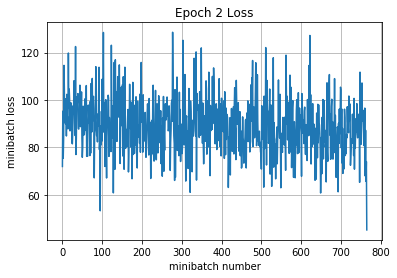

Iteration 1600: with minibatch training loss = 1.14 and accuracy of 0.53
Iteration 1700: with minibatch training loss = 1.24 and accuracy of 0.52
Iteration 1800: with minibatch training loss = 1.33 and accuracy of 0.56
Iteration 1900: with minibatch training loss = 1.56 and accuracy of 0.55
Iteration 2000: with minibatch training loss = 1.17 and accuracy of 0.62
Iteration 2100: with minibatch training loss = 1.31 and accuracy of 0.56
Iteration 2200: with minibatch training loss = 1.19 and accuracy of 0.52
Epoch 3, Overall loss = 1.24 and accuracy of 0.579


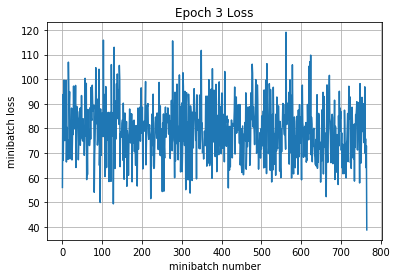

training time (seconds) 339.1118780000106
Validation
Epoch 1, Overall loss = 1.22 and accuracy of 0.592
validation time (seconds) 1.077205599998706
predict
Epoch 1, Overall loss = 0.11 and accuracy of 1
Training
Iteration 0: with minibatch training loss = 3.52 and accuracy of 0.078
Iteration 100: with minibatch training loss = 2.28 and accuracy of 0.19
Iteration 200: with minibatch training loss = 2.42 and accuracy of 0.34
Iteration 300: with minibatch training loss = 1.98 and accuracy of 0.5
Iteration 400: with minibatch training loss = 1.85 and accuracy of 0.44
Iteration 500: with minibatch training loss = 2.02 and accuracy of 0.42
Iteration 600: with minibatch training loss = 1.86 and accuracy of 0.5
Iteration 700: with minibatch training loss = 1.89 and accuracy of 0.42
Epoch 1, Overall loss = 2.03 and accuracy of 0.38


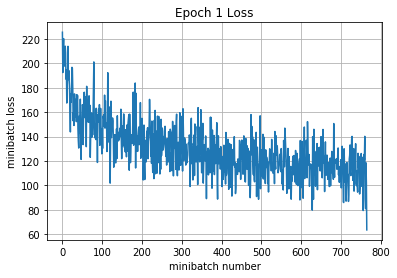

Iteration 800: with minibatch training loss = 1.96 and accuracy of 0.39
Iteration 900: with minibatch training loss = 1.65 and accuracy of 0.47
Iteration 1000: with minibatch training loss = 1.05 and accuracy of 0.69
Iteration 1100: with minibatch training loss = 1.89 and accuracy of 0.47
Iteration 1200: with minibatch training loss = 1.55 and accuracy of 0.55
Iteration 1300: with minibatch training loss = 1.85 and accuracy of 0.45
Iteration 1400: with minibatch training loss = 1.21 and accuracy of 0.61
Iteration 1500: with minibatch training loss = 1.57 and accuracy of 0.45
Epoch 2, Overall loss = 1.61 and accuracy of 0.481


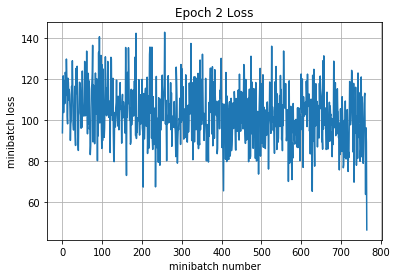

Iteration 1600: with minibatch training loss = 1.68 and accuracy of 0.44
Iteration 1700: with minibatch training loss = 1.3 and accuracy of 0.56
Iteration 1800: with minibatch training loss = 1.39 and accuracy of 0.56
Iteration 1900: with minibatch training loss = 1.55 and accuracy of 0.48
Iteration 2000: with minibatch training loss = 0.991 and accuracy of 0.67
Iteration 2100: with minibatch training loss = 1.31 and accuracy of 0.66
Iteration 2200: with minibatch training loss = 1.2 and accuracy of 0.52
Epoch 3, Overall loss = 1.44 and accuracy of 0.525


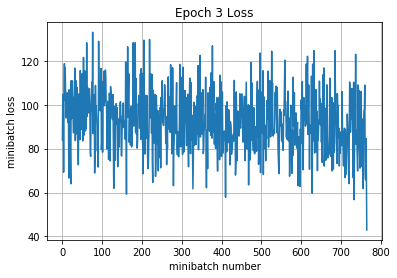

training time (seconds) 321.7798523000092
Validation
Epoch 1, Overall loss = 1.3 and accuracy of 0.562
validation time (seconds) 0.7462287999951513
predict
Epoch 1, Overall loss = 0.0562 and accuracy of 1


In [104]:
def simple_model_2(X, y, is_training, dropout=None, **kwars):
    """
    define our graph (e.g. two_layer_convnet)
    """
    # CNN -> rule
    out = X

    out, [W1, b1] = cnn(idx=1, X=out, filters=32, kernel_size=(5,5), is_training=is_training, padding='VALID')

    if dropout is not None:    
        out = tf.layers.dropout(out, rate=dropout, training=is_training)
   
    out, _ = affine(1, out, output_size=10)
    return out, [W1]

local_models = []
local_models.append(estimate_model({
    'name': 'without dropout',
    'scheme': ['CNN', 'relu', 'FC'],
    'learning_rate': 1e-4,
    'model_builder': simple_model_2,
    'num_of_epochs': 3,
}, X_train, y_train, X_val, y_val))

local_models.append(estimate_model({
    'name': 'Dropout 0.2',
    'scheme': ['CNN', 'relu', 'FC'],
    'learning_rate': 1e-4,
    'model_builder': simple_model_2,
    'dropout': 0.2,
    'num_of_epochs': 3,
}, X_train, y_train, X_val, y_val))

local_models.append(estimate_model({
    'name': 'Dropout 0.4',
    'scheme': ['CNN', 'relu', 'FC'],
    'learning_rate': 1e-4,
    'model_builder': simple_model_2,
    'dropout': 0.4,
    'num_of_epochs': 3,
}, X_train, y_train, X_val, y_val))

Model without dropout


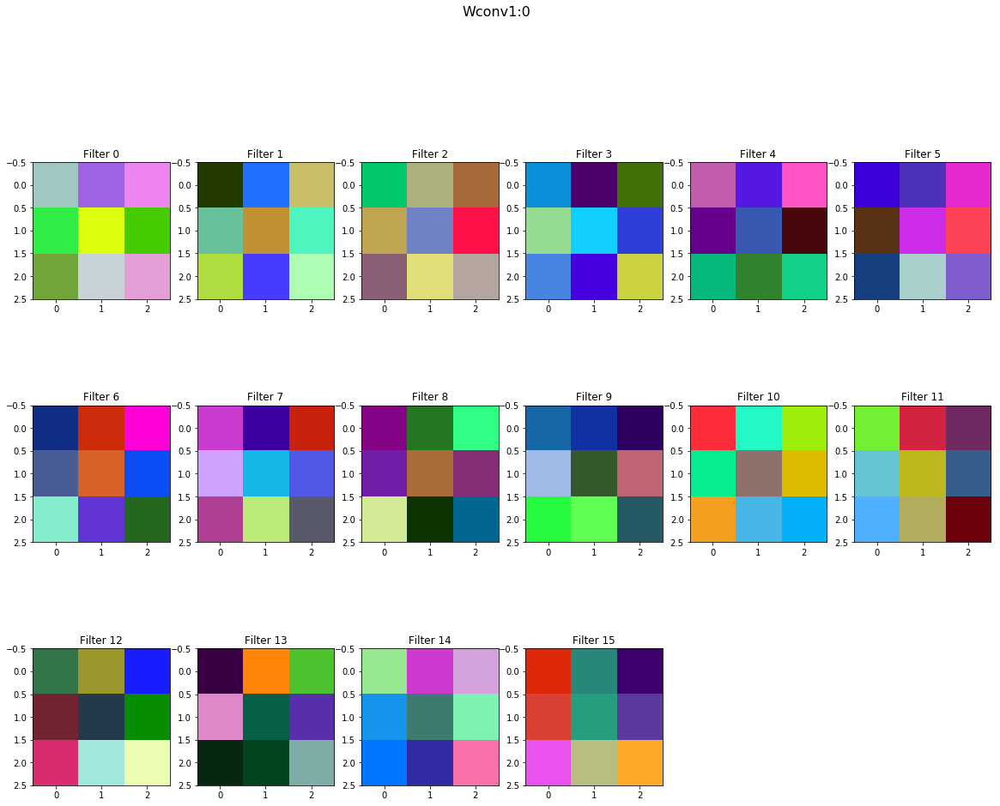

Model Dropout 0.2


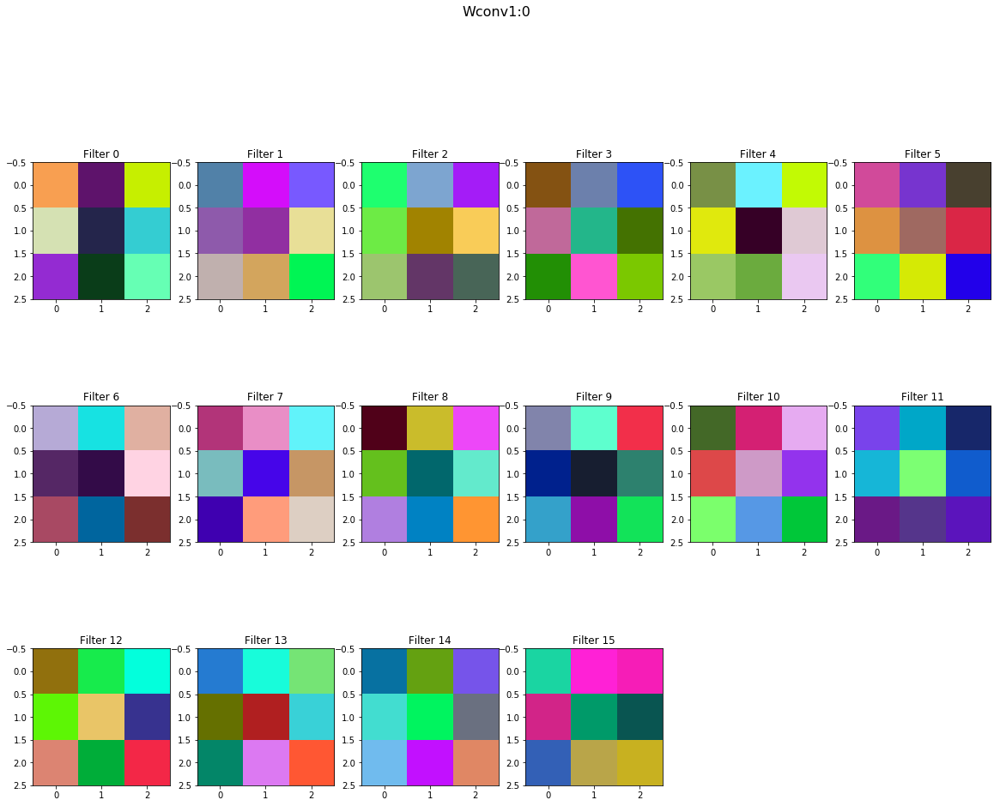

Model Dropout 0.3


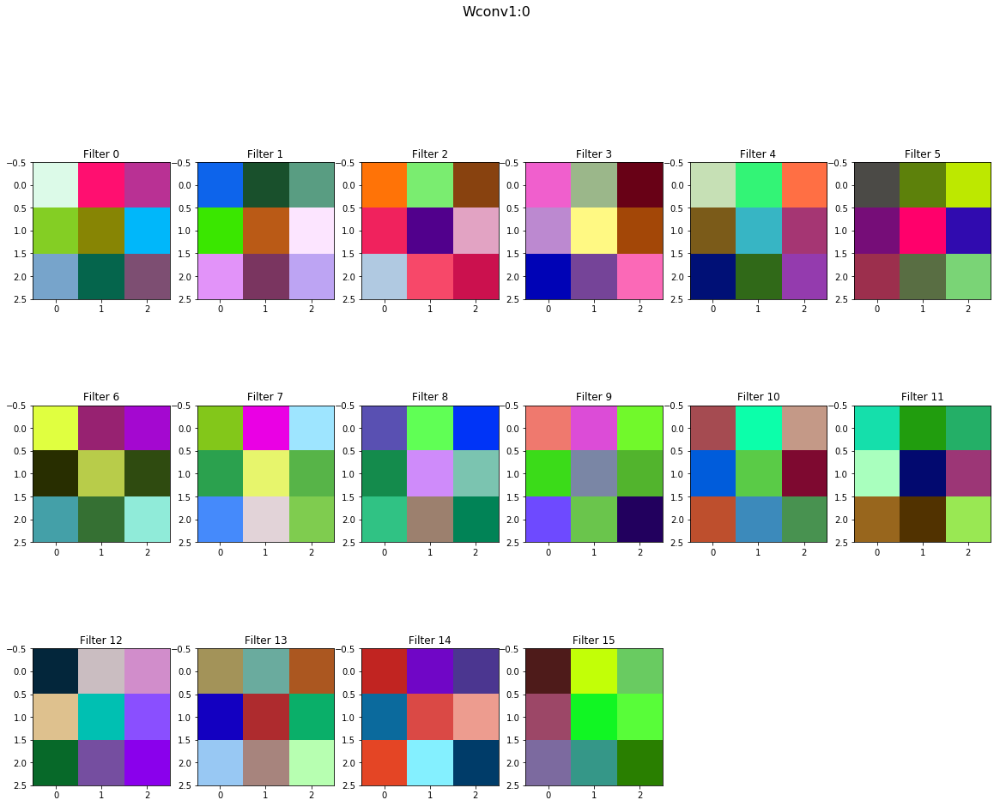

In [113]:
draw_layers_of_models(local_models)

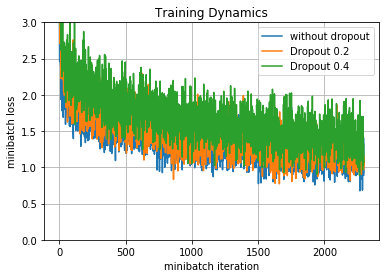

model: without dropout


,predict,training,validation
total_correct,NaN,0.609898,0.586
total_lost,NaN,1.13403,1.23728
time,0.070301,364.854,0.945072


model: Dropout 0.2


,predict,training,validation
total_correct,NaN,0.579082,0.592
total_lost,NaN,1.23939,1.22419
time,0.084295,339.112,1.07721


model: Dropout 0.4


,predict,training,validation
total_correct,NaN,0.52451,0.562
total_lost,NaN,1.44096,1.29825
time,0.063476,321.78,0.746229


In [108]:
show_graphs(local_models, ymax=3)
show_tables(local_models)

Training
Iteration 0: with minibatch training loss = 3.14 and accuracy of 0.078
Iteration 100: with minibatch training loss = 1.73 and accuracy of 0.47
Iteration 200: with minibatch training loss = 1.57 and accuracy of 0.41
Iteration 300: with minibatch training loss = 1.82 and accuracy of 0.39
Iteration 400: with minibatch training loss = 1.79 and accuracy of 0.36
Iteration 500: with minibatch training loss = 1.31 and accuracy of 0.56
Iteration 600: with minibatch training loss = 1.57 and accuracy of 0.48
Iteration 700: with minibatch training loss = 1.34 and accuracy of 0.52
Epoch 1, Overall loss = 1.71 and accuracy of 0.415


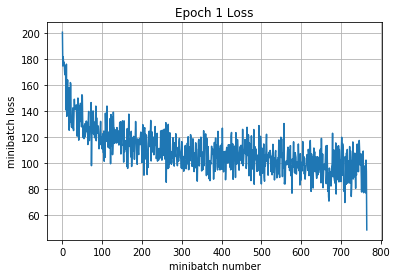

Iteration 800: with minibatch training loss = 1.64 and accuracy of 0.42
Iteration 900: with minibatch training loss = 1.68 and accuracy of 0.5
Iteration 1000: with minibatch training loss = 1.51 and accuracy of 0.39
Iteration 1100: with minibatch training loss = 1.14 and accuracy of 0.62
Iteration 1200: with minibatch training loss = 1.38 and accuracy of 0.52
Iteration 1300: with minibatch training loss = 1.2 and accuracy of 0.64
Iteration 1400: with minibatch training loss = 1.44 and accuracy of 0.47
Iteration 1500: with minibatch training loss = 1.24 and accuracy of 0.56
Epoch 2, Overall loss = 1.37 and accuracy of 0.522


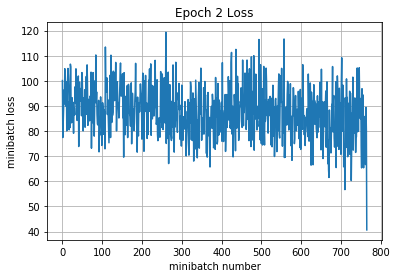

Iteration 1600: with minibatch training loss = 1.15 and accuracy of 0.62
Iteration 1700: with minibatch training loss = 1.26 and accuracy of 0.53
Iteration 1800: with minibatch training loss = 1.37 and accuracy of 0.47
Iteration 1900: with minibatch training loss = 1.12 and accuracy of 0.53
Iteration 2000: with minibatch training loss = 1.47 and accuracy of 0.52
Iteration 2100: with minibatch training loss = 1.32 and accuracy of 0.52
Iteration 2200: with minibatch training loss = 1.1 and accuracy of 0.62
Epoch 3, Overall loss = 1.25 and accuracy of 0.567


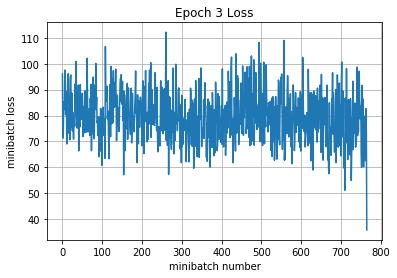

training time (seconds) 203.1102755000029
Validation
Epoch 1, Overall loss = 1.3 and accuracy of 0.54
validation time (seconds) 0.6318706999882124
predict
Epoch 1, Overall loss = 0.216 and accuracy of 1
Training
Iteration 0: with minibatch training loss = 3.73 and accuracy of 0.016
Iteration 100: with minibatch training loss = 2.06 and accuracy of 0.3
Iteration 200: with minibatch training loss = 2.1 and accuracy of 0.39
Iteration 300: with minibatch training loss = 1.73 and accuracy of 0.52
Iteration 400: with minibatch training loss = 1.7 and accuracy of 0.38
Iteration 500: with minibatch training loss = 1.72 and accuracy of 0.44
Iteration 600: with minibatch training loss = 2.33 and accuracy of 0.31
Iteration 700: with minibatch training loss = 1.64 and accuracy of 0.45
Epoch 1, Overall loss = 1.9 and accuracy of 0.375


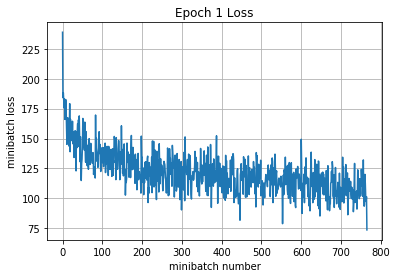

Iteration 800: with minibatch training loss = 1.35 and accuracy of 0.53
Iteration 900: with minibatch training loss = 1.47 and accuracy of 0.55
Iteration 1000: with minibatch training loss = 1.31 and accuracy of 0.61
Iteration 1100: with minibatch training loss = 1.8 and accuracy of 0.44
Iteration 1200: with minibatch training loss = 1.38 and accuracy of 0.45
Iteration 1300: with minibatch training loss = 1.8 and accuracy of 0.42
Iteration 1400: with minibatch training loss = 1.8 and accuracy of 0.42
Iteration 1500: with minibatch training loss = 1.59 and accuracy of 0.52
Epoch 2, Overall loss = 1.52 and accuracy of 0.481


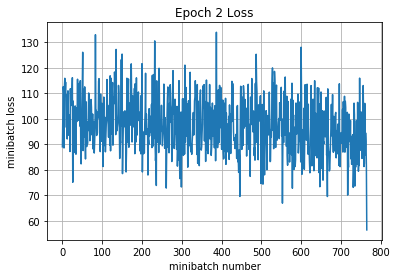

Iteration 1600: with minibatch training loss = 1.27 and accuracy of 0.55
Iteration 1700: with minibatch training loss = 1.5 and accuracy of 0.47
Iteration 1800: with minibatch training loss = 1.26 and accuracy of 0.52
Iteration 1900: with minibatch training loss = 1.33 and accuracy of 0.61
Iteration 2000: with minibatch training loss = 1.34 and accuracy of 0.48
Iteration 2100: with minibatch training loss = 1.11 and accuracy of 0.61
Iteration 2200: with minibatch training loss = 1.36 and accuracy of 0.45
Epoch 3, Overall loss = 1.36 and accuracy of 0.531


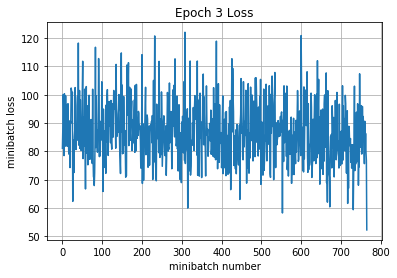

training time (seconds) 192.87286920000042
Validation
Epoch 1, Overall loss = 1.32 and accuracy of 0.557
validation time (seconds) 0.43055470001127105
predict
Epoch 1, Overall loss = 0.213 and accuracy of 1
Training
Iteration 0: with minibatch training loss = 3.2 and accuracy of 0.094
Iteration 100: with minibatch training loss = 1.85 and accuracy of 0.38
Iteration 200: with minibatch training loss = 2.34 and accuracy of 0.27
Iteration 300: with minibatch training loss = 2.03 and accuracy of 0.25
Iteration 400: with minibatch training loss = 1.69 and accuracy of 0.47
Iteration 500: with minibatch training loss = 1.99 and accuracy of 0.52
Iteration 600: with minibatch training loss = 1.76 and accuracy of 0.41
Iteration 700: with minibatch training loss = 1.82 and accuracy of 0.34
Epoch 1, Overall loss = 2.03 and accuracy of 0.35


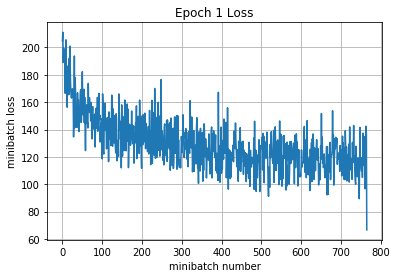

Iteration 800: with minibatch training loss = 1.79 and accuracy of 0.39
Iteration 900: with minibatch training loss = 1.63 and accuracy of 0.38
Iteration 1000: with minibatch training loss = 1.57 and accuracy of 0.38
Iteration 1100: with minibatch training loss = 1.48 and accuracy of 0.47
Iteration 1200: with minibatch training loss = 1.64 and accuracy of 0.41
Iteration 1300: with minibatch training loss = 1.51 and accuracy of 0.45
Iteration 1400: with minibatch training loss = 1.83 and accuracy of 0.47
Iteration 1500: with minibatch training loss = 1.56 and accuracy of 0.55
Epoch 2, Overall loss = 1.67 and accuracy of 0.441


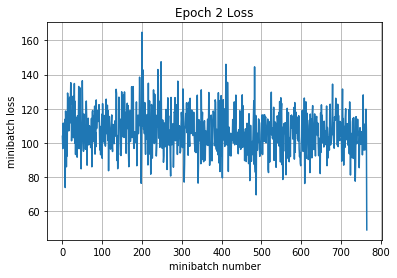

Iteration 1600: with minibatch training loss = 1.45 and accuracy of 0.52
Iteration 1700: with minibatch training loss = 1.78 and accuracy of 0.45
Iteration 1800: with minibatch training loss = 1.24 and accuracy of 0.56
Iteration 1900: with minibatch training loss = 1.65 and accuracy of 0.47
Iteration 2000: with minibatch training loss = 1.43 and accuracy of 0.53
Iteration 2100: with minibatch training loss = 1.47 and accuracy of 0.5
Iteration 2200: with minibatch training loss = 1.32 and accuracy of 0.48
Epoch 3, Overall loss = 1.52 and accuracy of 0.483


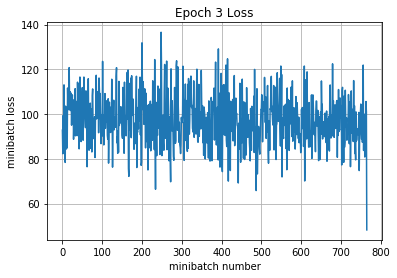

training time (seconds) 181.7252531999984
Validation
Epoch 1, Overall loss = 1.41 and accuracy of 0.526
validation time (seconds) 0.44304149999516085
predict
Epoch 1, Overall loss = 0.379 and accuracy of 1


In [110]:
def simple_model_3(X, y, is_training, dropout=None, **kwars):
    """
    define our graph (e.g. two_layer_convnet)
    """
    # CNN -> rule
    out = X

    out, [W1, b1] = cnn(idx=1, X=out, filters=16, kernel_size=(3,3), is_training=is_training, padding='VALID')

    if dropout is not None:    
        out = tf.layers.dropout(out, rate=dropout, training=is_training)
   
    out, _ = affine(1, out, output_size=10)
    return out, [W1]

local_models = []
local_models.append(estimate_model({
    'name': 'without dropout',
    'learning_rate': 1e-4,
    'model_builder': simple_model_3,
    'num_of_epochs': 3,
}, X_train, y_train, X_val, y_val))

local_models.append(estimate_model({
    'name': 'Dropout 0.2',
    'learning_rate': 1e-4,
    'model_builder': simple_model_3,
    'dropout': 0.2,
    'num_of_epochs': 3,
}, X_train, y_train, X_val, y_val))

local_models.append(estimate_model({
    'name': 'Dropout 0.3',
    'learning_rate': 1e-4,
    'model_builder': simple_model_3,
    'dropout': 0.3,
    'num_of_epochs': 3,
}, X_train, y_train, X_val, y_val))


Model without dropout


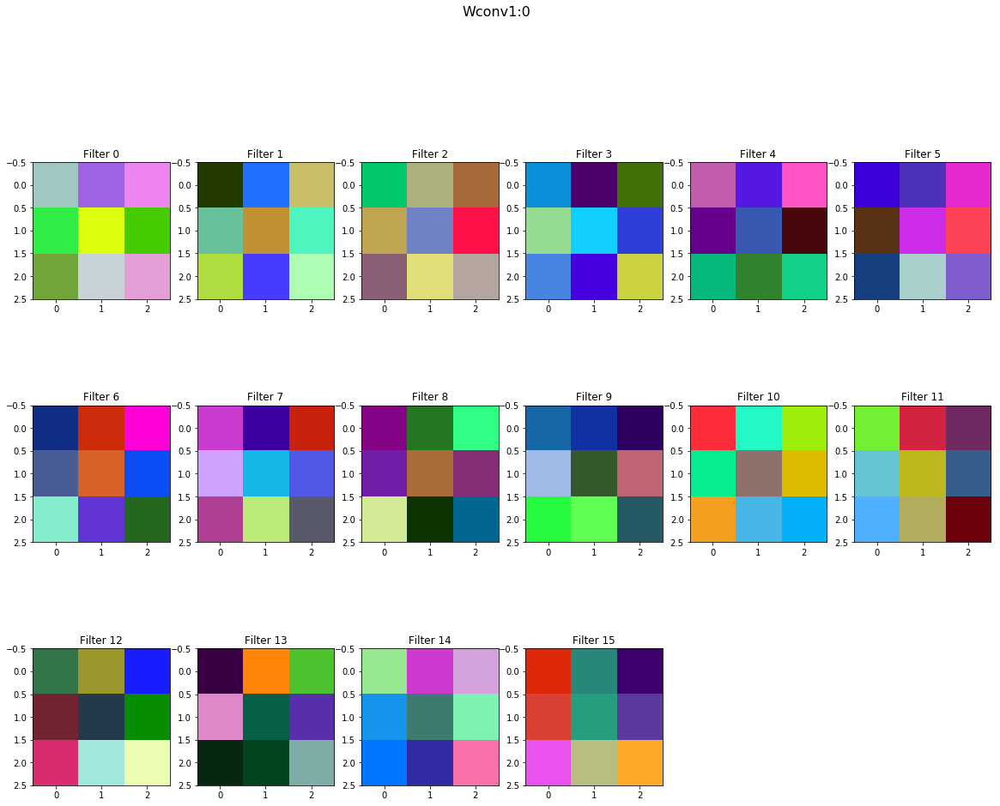

Model Dropout 0.2


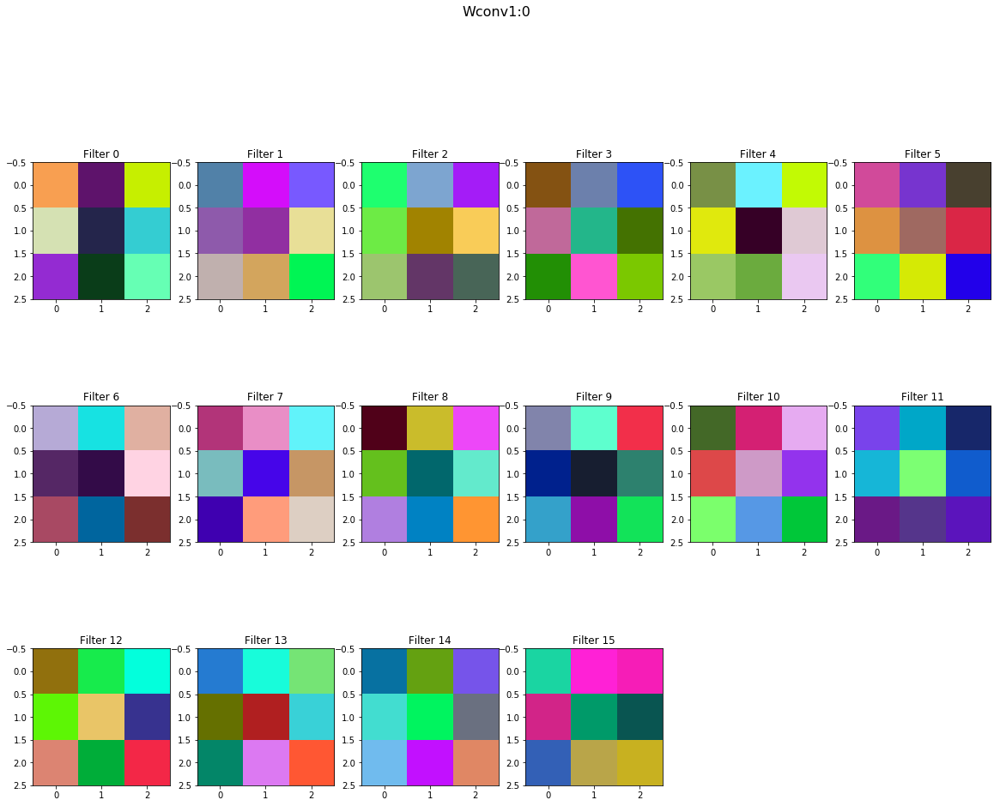

Model Dropout 0.3


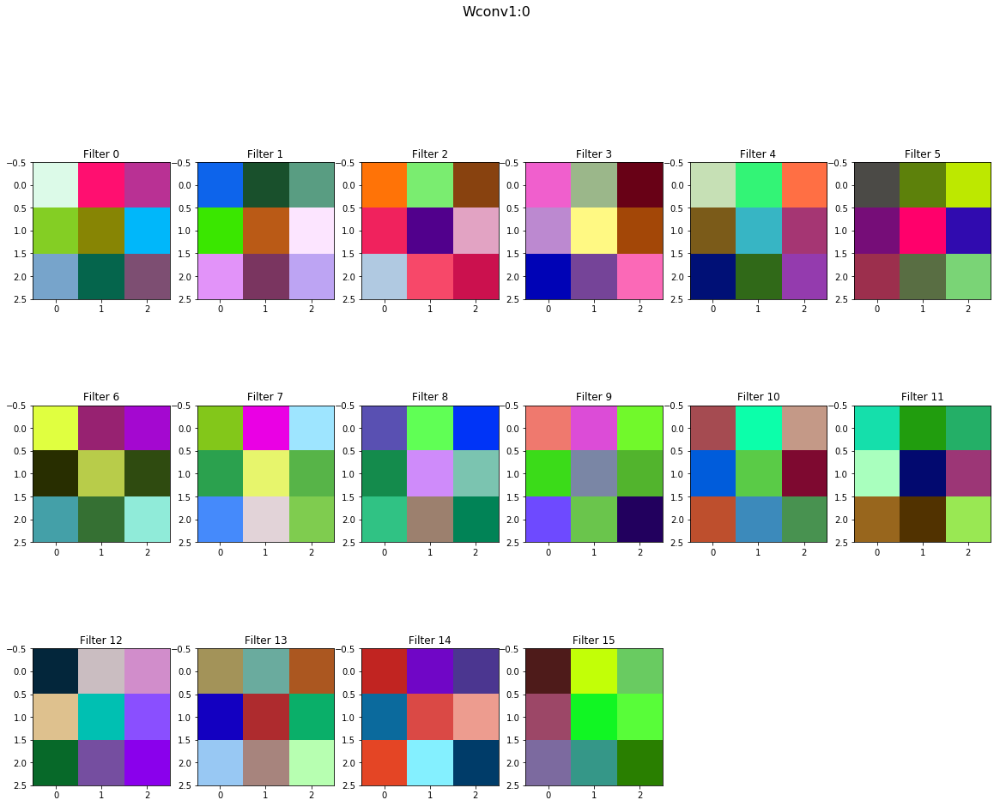

In [111]:
draw_layers_of_models(local_models)

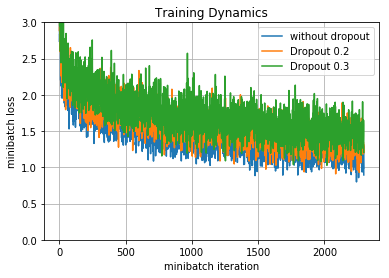

model: without dropout


,num_of_trainable,predict,training,validation
time,144490,0.06329,203.11,0.631871
total_correct,144490,NaN,0.566898,0.54
total_lost,144490,NaN,1.24931,1.30498


model: Dropout 0.2


,num_of_trainable,predict,training,validation
time,144490,0.062318,192.873,0.430555
total_correct,144490,NaN,0.531245,0.557
total_lost,144490,NaN,1.35755,1.32436


model: Dropout 0.3


,num_of_trainable,predict,training,validation
time,144490,0.058782,181.725,0.443041
total_correct,144490,NaN,0.482531,0.526
total_lost,144490,NaN,1.52245,1.41436


In [118]:
show_graphs(local_models, ymax=3)
show_tables(local_models)

Training
Iteration 0: with minibatch training loss = 3.48 and accuracy of 0.031
Iteration 100: with minibatch training loss = 1.58 and accuracy of 0.52
Iteration 200: with minibatch training loss = 1.56 and accuracy of 0.44
Iteration 300: with minibatch training loss = 1.71 and accuracy of 0.41
Iteration 400: with minibatch training loss = 1.3 and accuracy of 0.48
Iteration 500: with minibatch training loss = 1.33 and accuracy of 0.55
Iteration 600: with minibatch training loss = 1.1 and accuracy of 0.56
Iteration 700: with minibatch training loss = 1.19 and accuracy of 0.59
Epoch 1, Overall loss = 1.5 and accuracy of 0.493


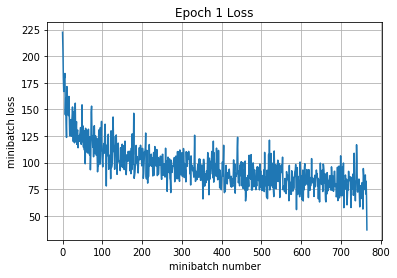

Iteration 800: with minibatch training loss = 0.999 and accuracy of 0.64
Iteration 900: with minibatch training loss = 1.11 and accuracy of 0.59
Iteration 1000: with minibatch training loss = 1 and accuracy of 0.66
Iteration 1100: with minibatch training loss = 0.799 and accuracy of 0.78
Iteration 1200: with minibatch training loss = 0.788 and accuracy of 0.72
Iteration 1300: with minibatch training loss = 0.954 and accuracy of 0.64
Iteration 1400: with minibatch training loss = 0.999 and accuracy of 0.7
Iteration 1500: with minibatch training loss = 0.848 and accuracy of 0.7
Epoch 2, Overall loss = 0.923 and accuracy of 0.682


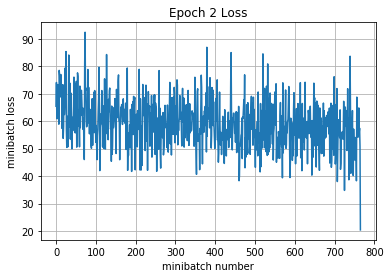

Iteration 1600: with minibatch training loss = 0.657 and accuracy of 0.77
Iteration 1700: with minibatch training loss = 0.701 and accuracy of 0.78
Iteration 1800: with minibatch training loss = 0.574 and accuracy of 0.84
Iteration 1900: with minibatch training loss = 0.471 and accuracy of 0.86
Iteration 2000: with minibatch training loss = 0.476 and accuracy of 0.84
Iteration 2100: with minibatch training loss = 0.532 and accuracy of 0.84
Iteration 2200: with minibatch training loss = 0.65 and accuracy of 0.81
Epoch 3, Overall loss = 0.59 and accuracy of 0.813


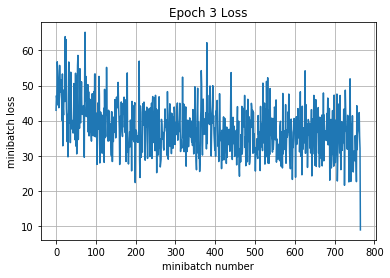

Iteration 2300: with minibatch training loss = 0.455 and accuracy of 0.91
Iteration 2400: with minibatch training loss = 0.444 and accuracy of 0.89
Iteration 2500: with minibatch training loss = 0.311 and accuracy of 0.92
Iteration 2600: with minibatch training loss = 0.341 and accuracy of 0.89
Iteration 2700: with minibatch training loss = 0.353 and accuracy of 0.94
Iteration 2800: with minibatch training loss = 0.207 and accuracy of 0.97
Iteration 2900: with minibatch training loss = 0.156 and accuracy of 1
Iteration 3000: with minibatch training loss = 0.245 and accuracy of 0.94
Epoch 4, Overall loss = 0.325 and accuracy of 0.919


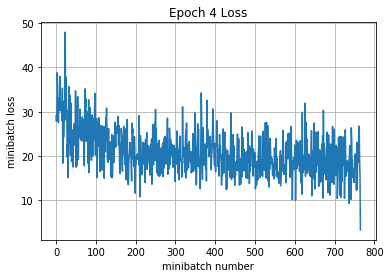

Iteration 3100: with minibatch training loss = 0.178 and accuracy of 0.95
Iteration 3200: with minibatch training loss = 0.163 and accuracy of 0.97
Iteration 3300: with minibatch training loss = 0.133 and accuracy of 0.98
Iteration 3400: with minibatch training loss = 0.134 and accuracy of 0.98
Iteration 3500: with minibatch training loss = 0.103 and accuracy of 1
Iteration 3600: with minibatch training loss = 0.173 and accuracy of 0.97
Iteration 3700: with minibatch training loss = 0.131 and accuracy of 0.97
Iteration 3800: with minibatch training loss = 0.0579 and accuracy of 1
Epoch 5, Overall loss = 0.158 and accuracy of 0.975


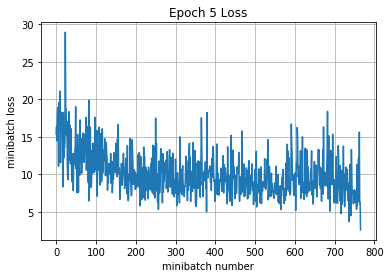

training time (seconds) 2280.596955899993
Validation
Epoch 1, Overall loss = 1.3 and accuracy of 0.621
validation time (seconds) 2.8864893999998458
predict
Epoch 1, Overall loss = 0.0527 and accuracy of 1
Training
Iteration 0: with minibatch training loss = 3.17 and accuracy of 0.12
Iteration 100: with minibatch training loss = 2.07 and accuracy of 0.33
Iteration 200: with minibatch training loss = 1.75 and accuracy of 0.39
Iteration 300: with minibatch training loss = 1.4 and accuracy of 0.52
Iteration 400: with minibatch training loss = 1.5 and accuracy of 0.55
Iteration 500: with minibatch training loss = 1.75 and accuracy of 0.47
Iteration 600: with minibatch training loss = 1.37 and accuracy of 0.56
Iteration 700: with minibatch training loss = 1.45 and accuracy of 0.48
Epoch 1, Overall loss = 1.64 and accuracy of 0.454


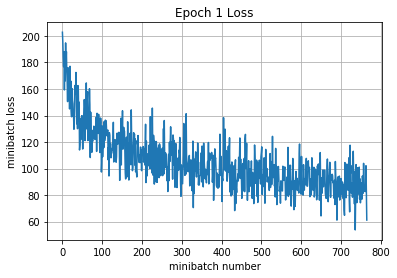

Iteration 800: with minibatch training loss = 1.49 and accuracy of 0.48
Iteration 900: with minibatch training loss = 1.29 and accuracy of 0.55
Iteration 1000: with minibatch training loss = 1.19 and accuracy of 0.55
Iteration 1100: with minibatch training loss = 0.932 and accuracy of 0.73
Iteration 1200: with minibatch training loss = 1.26 and accuracy of 0.62
Iteration 1300: with minibatch training loss = 1.22 and accuracy of 0.55
Iteration 1400: with minibatch training loss = 0.961 and accuracy of 0.69
Iteration 1500: with minibatch training loss = 1.07 and accuracy of 0.58
Epoch 2, Overall loss = 1.14 and accuracy of 0.604


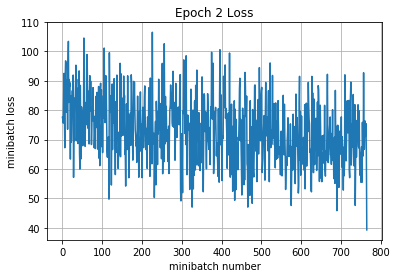

Iteration 1600: with minibatch training loss = 1.11 and accuracy of 0.66
Iteration 1700: with minibatch training loss = 0.637 and accuracy of 0.78
Iteration 1800: with minibatch training loss = 0.777 and accuracy of 0.77
Iteration 1900: with minibatch training loss = 0.812 and accuracy of 0.69
Iteration 2000: with minibatch training loss = 0.835 and accuracy of 0.7
Iteration 2100: with minibatch training loss = 0.822 and accuracy of 0.64
Iteration 2200: with minibatch training loss = 0.769 and accuracy of 0.66
Epoch 3, Overall loss = 0.924 and accuracy of 0.679


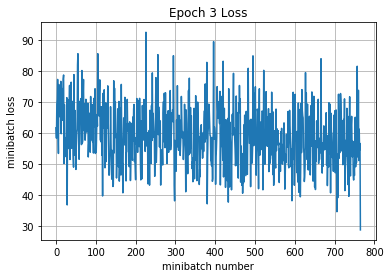

Iteration 2300: with minibatch training loss = 0.855 and accuracy of 0.78
Iteration 2400: with minibatch training loss = 0.785 and accuracy of 0.69
Iteration 2500: with minibatch training loss = 0.739 and accuracy of 0.69
Iteration 2600: with minibatch training loss = 0.504 and accuracy of 0.83
Iteration 2700: with minibatch training loss = 0.778 and accuracy of 0.73
Iteration 2800: with minibatch training loss = 0.648 and accuracy of 0.73
Iteration 2900: with minibatch training loss = 0.709 and accuracy of 0.8
Iteration 3000: with minibatch training loss = 0.653 and accuracy of 0.75
Epoch 4, Overall loss = 0.759 and accuracy of 0.733


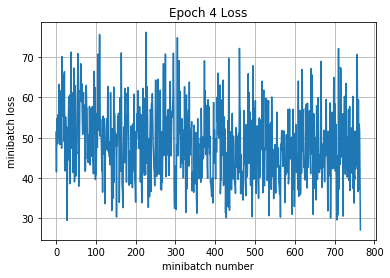

Iteration 3100: with minibatch training loss = 0.805 and accuracy of 0.78
Iteration 3200: with minibatch training loss = 0.584 and accuracy of 0.78
Iteration 3300: with minibatch training loss = 0.732 and accuracy of 0.72
Iteration 3400: with minibatch training loss = 0.569 and accuracy of 0.72
Iteration 3500: with minibatch training loss = 0.487 and accuracy of 0.84
Iteration 3600: with minibatch training loss = 0.604 and accuracy of 0.75
Iteration 3700: with minibatch training loss = 0.684 and accuracy of 0.75
Iteration 3800: with minibatch training loss = 0.365 and accuracy of 0.89
Epoch 5, Overall loss = 0.622 and accuracy of 0.785


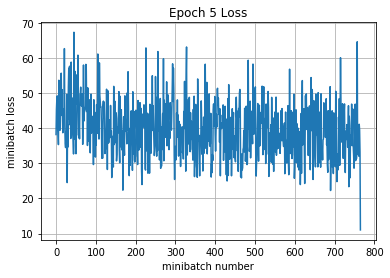

training time (seconds) 2330.585120500007
Validation
Epoch 1, Overall loss = 0.939 and accuracy of 0.693
validation time (seconds) 2.4852830000018002
predict
Epoch 1, Overall loss = 0.00102 and accuracy of 1
Training
Iteration 0: with minibatch training loss = 3.26 and accuracy of 0.12
Iteration 100: with minibatch training loss = 2.29 and accuracy of 0.31
Iteration 200: with minibatch training loss = 2.3 and accuracy of 0.33
Iteration 300: with minibatch training loss = 1.53 and accuracy of 0.44
Iteration 400: with minibatch training loss = 1.82 and accuracy of 0.42
Iteration 500: with minibatch training loss = 1.46 and accuracy of 0.5
Iteration 600: with minibatch training loss = 1.2 and accuracy of 0.55
Iteration 700: with minibatch training loss = 1.45 and accuracy of 0.48
Epoch 1, Overall loss = 1.79 and accuracy of 0.422


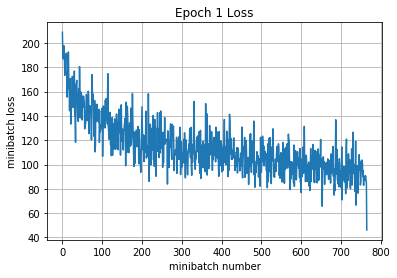

Iteration 800: with minibatch training loss = 1.39 and accuracy of 0.52
Iteration 900: with minibatch training loss = 1.4 and accuracy of 0.53
Iteration 1000: with minibatch training loss = 1.27 and accuracy of 0.58
Iteration 1100: with minibatch training loss = 1.16 and accuracy of 0.66
Iteration 1200: with minibatch training loss = 1.39 and accuracy of 0.53
Iteration 1300: with minibatch training loss = 1.21 and accuracy of 0.55
Iteration 1400: with minibatch training loss = 1.06 and accuracy of 0.61
Iteration 1500: with minibatch training loss = 1.13 and accuracy of 0.62
Epoch 2, Overall loss = 1.28 and accuracy of 0.56


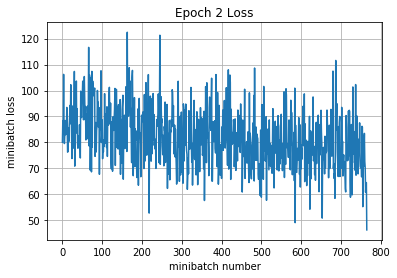

Iteration 1600: with minibatch training loss = 1.65 and accuracy of 0.55
Iteration 1700: with minibatch training loss = 1.13 and accuracy of 0.62
Iteration 1800: with minibatch training loss = 1.05 and accuracy of 0.67
Iteration 1900: with minibatch training loss = 0.96 and accuracy of 0.64
Iteration 2000: with minibatch training loss = 0.714 and accuracy of 0.77
Iteration 2100: with minibatch training loss = 1.23 and accuracy of 0.61
Iteration 2200: with minibatch training loss = 1.09 and accuracy of 0.62
Epoch 3, Overall loss = 1.07 and accuracy of 0.625


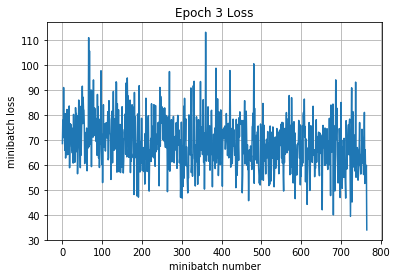

Iteration 2300: with minibatch training loss = 0.823 and accuracy of 0.69
Iteration 2400: with minibatch training loss = 0.827 and accuracy of 0.73
Iteration 2500: with minibatch training loss = 1.03 and accuracy of 0.69
Iteration 2600: with minibatch training loss = 0.857 and accuracy of 0.73
Iteration 2700: with minibatch training loss = 0.763 and accuracy of 0.64
Iteration 2800: with minibatch training loss = 0.993 and accuracy of 0.64
Iteration 2900: with minibatch training loss = 0.784 and accuracy of 0.72
Iteration 3000: with minibatch training loss = 1.03 and accuracy of 0.66
Epoch 4, Overall loss = 0.933 and accuracy of 0.674


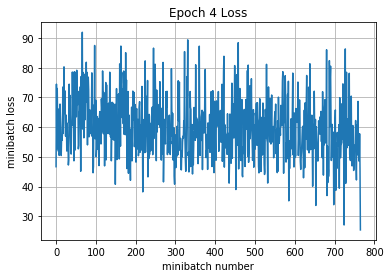

Iteration 3100: with minibatch training loss = 0.731 and accuracy of 0.78
Iteration 3200: with minibatch training loss = 0.968 and accuracy of 0.72
Iteration 3300: with minibatch training loss = 1.01 and accuracy of 0.66
Iteration 3400: with minibatch training loss = 0.853 and accuracy of 0.72
Iteration 3500: with minibatch training loss = 0.635 and accuracy of 0.78
Iteration 3600: with minibatch training loss = 0.722 and accuracy of 0.77
Iteration 3700: with minibatch training loss = 0.852 and accuracy of 0.72
Iteration 3800: with minibatch training loss = 0.791 and accuracy of 0.72
Epoch 5, Overall loss = 0.821 and accuracy of 0.711


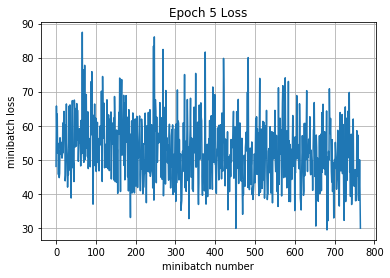

training time (seconds) 2299.9321349000093
Validation
Epoch 1, Overall loss = 0.932 and accuracy of 0.676
validation time (seconds) 2.7870932999940123
predict
Epoch 1, Overall loss = 0.00479 and accuracy of 1


In [128]:
def cnn_model_5x5x32_5x5x64_7x7x128_with_dropout_after_each_layer_batchnorm_after_affine_valid_padding(X, y, is_training, 
                                                                               dropout=None,
                                                                               **kwargs):
    out = X

    #32
    out, [W1, b1] = cnn(idx=1, X=out, filters=32, kernel_size=(5,5), is_training=is_training, padding='VALID')
    #28
    if dropout is not None:
        out = tf.layers.dropout(out, rate=dropout, training=is_training)
    out, _ = cnn(idx=2, X=out, filters=64, kernel_size=(5,5), is_training=is_training, padding='VALID')
    #24
    out = tf.nn.max_pool(out, ksize=(1,2,2,1), strides=(1,2,2,1), padding='SAME')
    #12
    if dropout is not None:    
        out = tf.layers.dropout(out, rate=dropout, training=is_training)
    out, _ = cnn(idx=3, X=out, filters=128, kernel_size=(7,7), is_training=is_training, padding='VALID')
    #6
    if dropout is not None:    
        out = tf.layers.dropout(out, rate=dropout, training=is_training)

    # Affine layer from 6x6x128 = 4,608 to 1024 outputs
    out, _ = affine(1, out, output_size=1024)

    # ReLU Activation Layer
    out = tf.nn.relu(out)

    out = tf.layers.batch_normalization(out, training=is_training)
    if dropout is not None:    
        out = tf.layers.dropout(out, rate=dropout, training=is_training)
    # 5)
    # Affine layer from 1024 input units to 10 outputs
    out, _ = affine(2, out, output_size=10)
    return out, [W1]

local_models_3_cnn = []

local_models_3_cnn.append(estimate_model({
    'name': 'dropout: none',
    'model_builder': cnn_model_5x5x32_5x5x64_7x7x128_with_dropout_after_each_layer_batchnorm_after_affine_valid_padding,
    'learning_rate': 1e-4,
    'num_of_epochs': 5,
}, X_train, y_train, X_val, y_val))

local_models_3_cnn.append(estimate_model({
    'name': 'dropout: 0.1',
    'dropout': 0.1,
    'model_builder': cnn_model_5x5x32_5x5x64_7x7x128_with_dropout_after_each_layer_batchnorm_after_affine_valid_padding,
    'learning_rate': 1e-4,
    'num_of_epochs': 5,
}, X_train, y_train, X_val, y_val))

local_models_3_cnn.append(estimate_model({
    'name': 'dropout: 0.2',
    'dropout': 0.2,
    'model_builder': cnn_model_5x5x32_5x5x64_7x7x128_with_dropout_after_each_layer_batchnorm_after_affine_valid_padding,
    'learning_rate': 1e-4,
    'num_of_epochs': 5,
}, X_train, y_train, X_val, y_val))


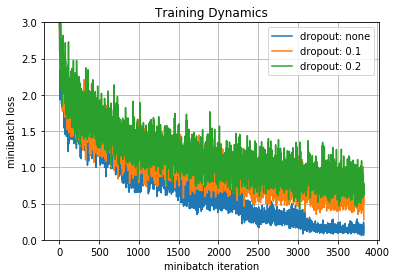

model: dropout: none


,num_of_trainable,predict,training,validation
time,5187594,0.118469,2280.6,2.88649
total_correct,5187594,NaN,0.974898,0.621
total_lost,5187594,NaN,0.158285,1.30476


model: dropout: 0.1


,num_of_trainable,predict,training,validation
time,5187594,0.143435,2330.59,2.48528
total_correct,5187594,NaN,0.784653,0.693
total_lost,5187594,NaN,0.621732,0.938613


model: dropout: 0.2


,num_of_trainable,predict,training,validation
time,5187594,0.133182,2299.93,2.78709
total_correct,5187594,NaN,0.711122,0.676
total_lost,5187594,NaN,0.821184,0.932127


Model dropout: none


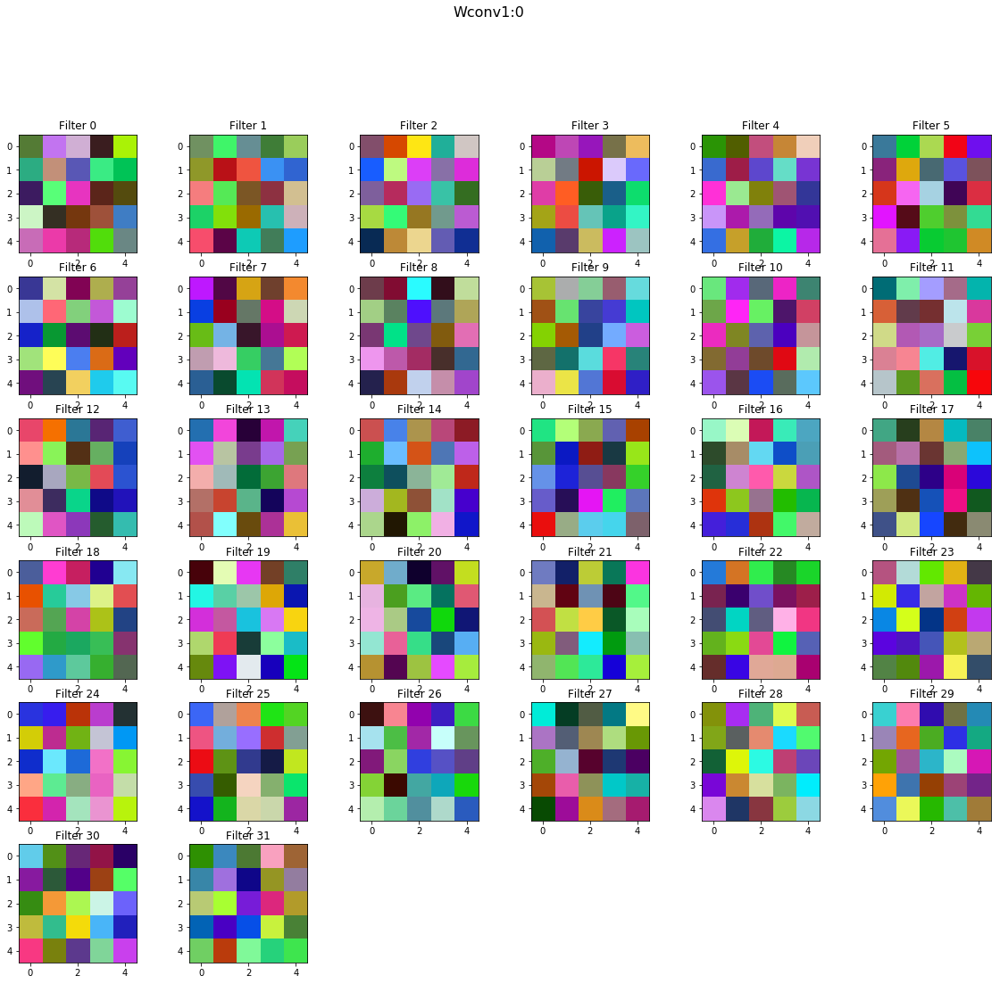

Model dropout: 0.1


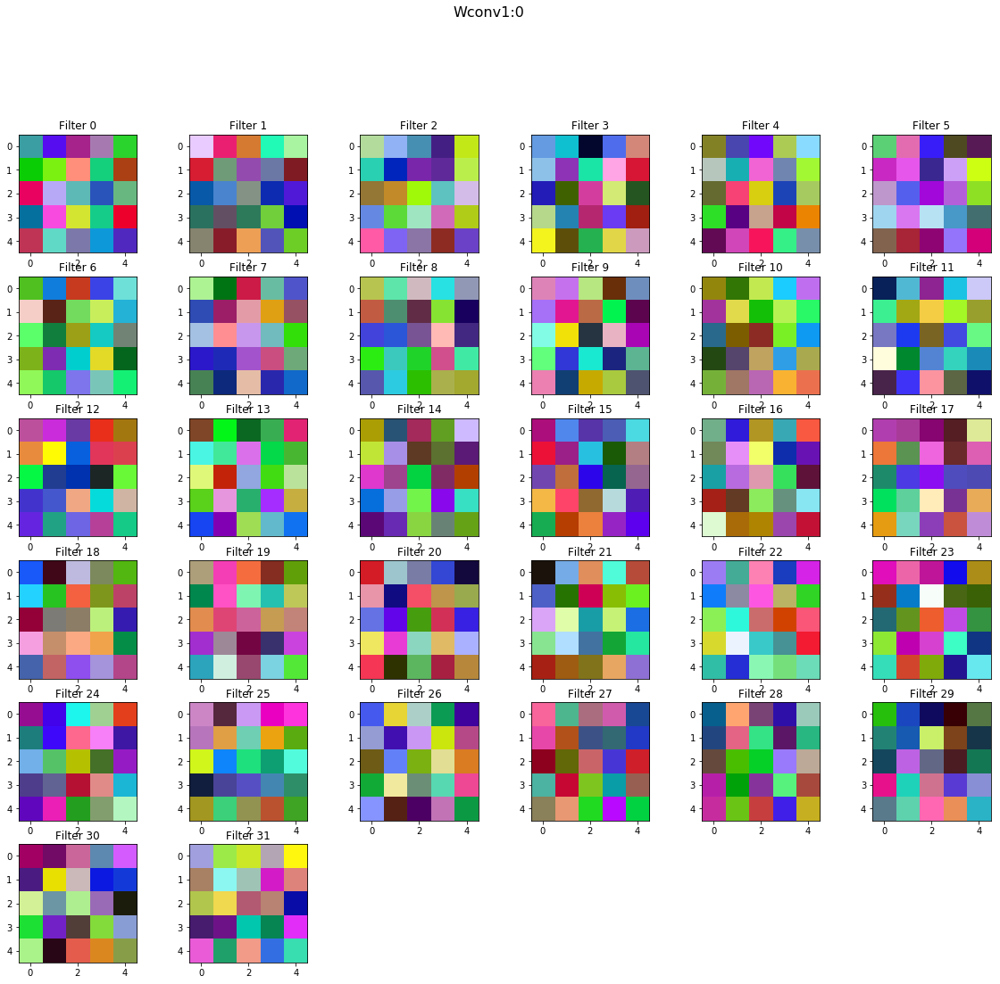

Model dropout: 0.2


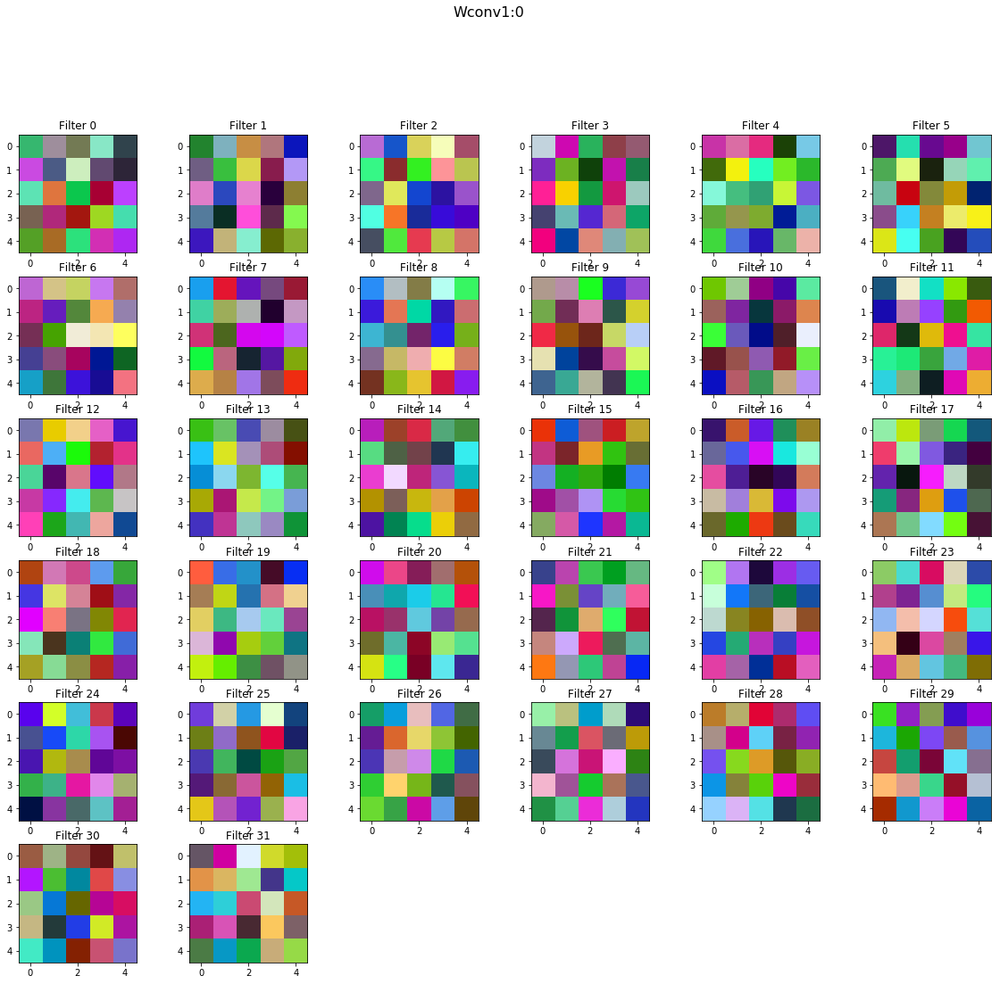

In [129]:
show_graphs(local_models_3_cnn, ymax=3)
show_tables(local_models_3_cnn)
draw_layers_of_models(local_models_3_cnn)

Training
Iteration 0: with minibatch training loss = 3.17 and accuracy of 0.12
Iteration 100: with minibatch training loss = 1.89 and accuracy of 0.36
Iteration 200: with minibatch training loss = 1.64 and accuracy of 0.38
Iteration 300: with minibatch training loss = 1.61 and accuracy of 0.44
Iteration 400: with minibatch training loss = 1.42 and accuracy of 0.48
Iteration 500: with minibatch training loss = 1.41 and accuracy of 0.48
Iteration 600: with minibatch training loss = 1.54 and accuracy of 0.47
Iteration 700: with minibatch training loss = 1.2 and accuracy of 0.58
Epoch 1, Overall loss = 1.67 and accuracy of 0.433


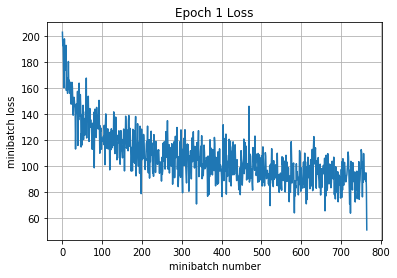

Iteration 800: with minibatch training loss = 1.39 and accuracy of 0.44
Iteration 900: with minibatch training loss = 1.3 and accuracy of 0.55
Iteration 1000: with minibatch training loss = 0.928 and accuracy of 0.67
Iteration 1100: with minibatch training loss = 1.16 and accuracy of 0.59
Iteration 1200: with minibatch training loss = 1.33 and accuracy of 0.61
Iteration 1300: with minibatch training loss = 0.911 and accuracy of 0.66
Iteration 1400: with minibatch training loss = 1.4 and accuracy of 0.61
Iteration 1500: with minibatch training loss = 1.19 and accuracy of 0.53
Epoch 2, Overall loss = 1.11 and accuracy of 0.612


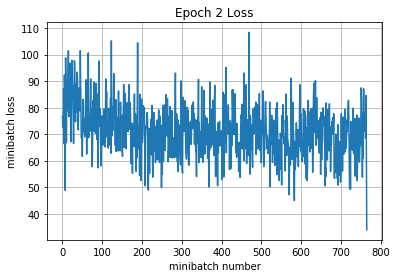

Iteration 1600: with minibatch training loss = 0.781 and accuracy of 0.72
Iteration 1700: with minibatch training loss = 0.898 and accuracy of 0.66
Iteration 1800: with minibatch training loss = 0.898 and accuracy of 0.66
Iteration 1900: with minibatch training loss = 0.589 and accuracy of 0.77
Iteration 2000: with minibatch training loss = 0.692 and accuracy of 0.8
Iteration 2100: with minibatch training loss = 0.687 and accuracy of 0.75
Iteration 2200: with minibatch training loss = 0.951 and accuracy of 0.69
Epoch 3, Overall loss = 0.831 and accuracy of 0.719


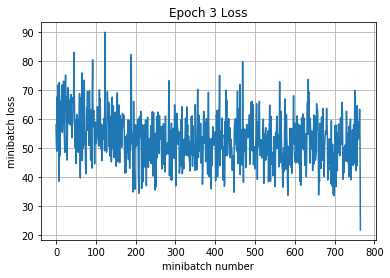

Iteration 2300: with minibatch training loss = 0.516 and accuracy of 0.89
Iteration 2400: with minibatch training loss = 0.626 and accuracy of 0.77
Iteration 2500: with minibatch training loss = 0.619 and accuracy of 0.81
Iteration 2600: with minibatch training loss = 0.531 and accuracy of 0.91
Iteration 2700: with minibatch training loss = 0.433 and accuracy of 0.88
Iteration 2800: with minibatch training loss = 0.525 and accuracy of 0.8
Iteration 2900: with minibatch training loss = 0.553 and accuracy of 0.81
Iteration 3000: with minibatch training loss = 0.496 and accuracy of 0.88
Epoch 4, Overall loss = 0.598 and accuracy of 0.815


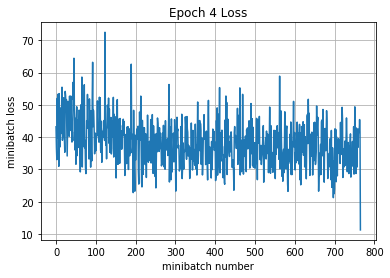

Iteration 3100: with minibatch training loss = 0.458 and accuracy of 0.84
Iteration 3200: with minibatch training loss = 0.495 and accuracy of 0.92
Iteration 3300: with minibatch training loss = 0.385 and accuracy of 0.88
Iteration 3400: with minibatch training loss = 0.258 and accuracy of 0.97
Iteration 3500: with minibatch training loss = 0.331 and accuracy of 0.91
Iteration 3600: with minibatch training loss = 0.353 and accuracy of 0.91
Iteration 3700: with minibatch training loss = 0.444 and accuracy of 0.84
Iteration 3800: with minibatch training loss = 0.301 and accuracy of 0.97
Epoch 5, Overall loss = 0.401 and accuracy of 0.898


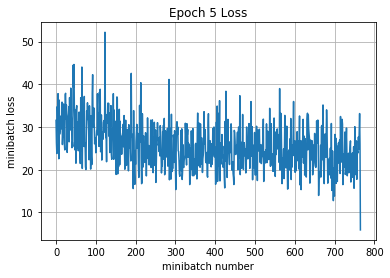

training time (seconds) 1578.5545751000027
Validation
Epoch 1, Overall loss = 1.3 and accuracy of 0.573
validation time (seconds) 2.010170100009418
predict
Epoch 1, Overall loss = 0.527 and accuracy of 1
Training
Iteration 0: with minibatch training loss = 3.03 and accuracy of 0.16
Iteration 100: with minibatch training loss = 2.31 and accuracy of 0.3
Iteration 200: with minibatch training loss = 1.75 and accuracy of 0.42
Iteration 300: with minibatch training loss = 2.39 and accuracy of 0.28
Iteration 400: with minibatch training loss = 1.67 and accuracy of 0.44
Iteration 500: with minibatch training loss = 1.72 and accuracy of 0.45
Iteration 600: with minibatch training loss = 1.59 and accuracy of 0.48
Iteration 700: with minibatch training loss = 1.73 and accuracy of 0.39
Epoch 1, Overall loss = 1.82 and accuracy of 0.396


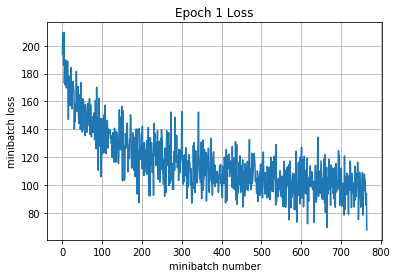

Iteration 800: with minibatch training loss = 1.41 and accuracy of 0.53
Iteration 900: with minibatch training loss = 1.04 and accuracy of 0.62
Iteration 1000: with minibatch training loss = 1.48 and accuracy of 0.5
Iteration 1100: with minibatch training loss = 1.23 and accuracy of 0.61
Iteration 1200: with minibatch training loss = 1.27 and accuracy of 0.58
Iteration 1300: with minibatch training loss = 1.19 and accuracy of 0.59
Iteration 1400: with minibatch training loss = 1.22 and accuracy of 0.56
Iteration 1500: with minibatch training loss = 1.14 and accuracy of 0.59
Epoch 2, Overall loss = 1.33 and accuracy of 0.534


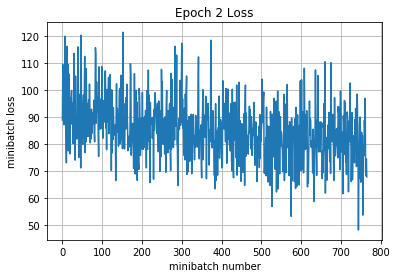

Iteration 1600: with minibatch training loss = 1.26 and accuracy of 0.59
Iteration 1700: with minibatch training loss = 0.975 and accuracy of 0.61
Iteration 1800: with minibatch training loss = 0.934 and accuracy of 0.69
Iteration 1900: with minibatch training loss = 0.928 and accuracy of 0.69
Iteration 2000: with minibatch training loss = 1.04 and accuracy of 0.62
Iteration 2100: with minibatch training loss = 1.1 and accuracy of 0.56
Iteration 2200: with minibatch training loss = 1 and accuracy of 0.62
Epoch 3, Overall loss = 1.13 and accuracy of 0.605


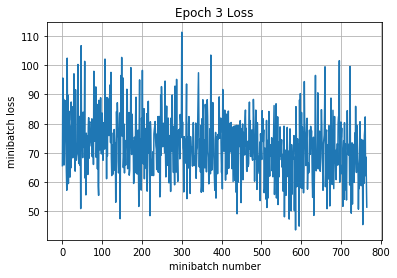

Iteration 2300: with minibatch training loss = 0.991 and accuracy of 0.56
Iteration 2400: with minibatch training loss = 1.05 and accuracy of 0.61
Iteration 2500: with minibatch training loss = 0.964 and accuracy of 0.67
Iteration 2600: with minibatch training loss = 1.16 and accuracy of 0.61
Iteration 2700: with minibatch training loss = 0.792 and accuracy of 0.67
Iteration 2800: with minibatch training loss = 1.21 and accuracy of 0.55
Iteration 2900: with minibatch training loss = 0.803 and accuracy of 0.66
Iteration 3000: with minibatch training loss = 0.862 and accuracy of 0.67
Epoch 4, Overall loss = 0.995 and accuracy of 0.65


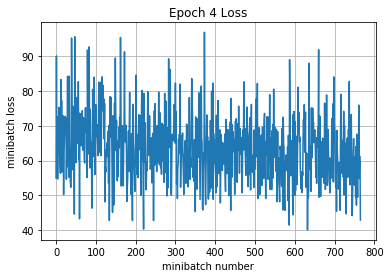

Iteration 3100: with minibatch training loss = 0.796 and accuracy of 0.73
Iteration 3200: with minibatch training loss = 1.1 and accuracy of 0.62
Iteration 3300: with minibatch training loss = 1.03 and accuracy of 0.61
Iteration 3400: with minibatch training loss = 0.864 and accuracy of 0.62
Iteration 3500: with minibatch training loss = 0.941 and accuracy of 0.72
Iteration 3600: with minibatch training loss = 1.04 and accuracy of 0.62
Iteration 3700: with minibatch training loss = 1.28 and accuracy of 0.55
Iteration 3800: with minibatch training loss = 0.711 and accuracy of 0.72
Epoch 5, Overall loss = 0.892 and accuracy of 0.685


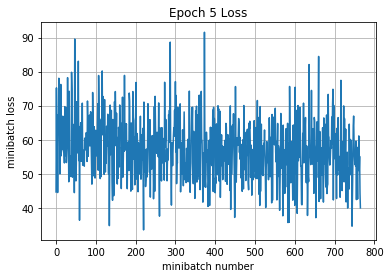

training time (seconds) 1673.6345211000007
Validation
Epoch 1, Overall loss = 0.97 and accuracy of 0.661
validation time (seconds) 2.36020580001059
predict
Epoch 1, Overall loss = 0.0541 and accuracy of 1
Training
Iteration 0: with minibatch training loss = 3.18 and accuracy of 0.11
Iteration 100: with minibatch training loss = 2.36 and accuracy of 0.25
Iteration 200: with minibatch training loss = 2 and accuracy of 0.31
Iteration 300: with minibatch training loss = 2.05 and accuracy of 0.34
Iteration 400: with minibatch training loss = 2.1 and accuracy of 0.36
Iteration 500: with minibatch training loss = 1.82 and accuracy of 0.39
Iteration 600: with minibatch training loss = 1.84 and accuracy of 0.38
Iteration 700: with minibatch training loss = 1.62 and accuracy of 0.48
Epoch 1, Overall loss = 2 and accuracy of 0.351


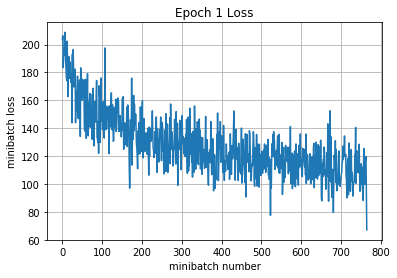

Iteration 800: with minibatch training loss = 1.79 and accuracy of 0.34
Iteration 900: with minibatch training loss = 2 and accuracy of 0.33
Iteration 1000: with minibatch training loss = 1.51 and accuracy of 0.44
Iteration 1100: with minibatch training loss = 1.54 and accuracy of 0.55
Iteration 1200: with minibatch training loss = 1.41 and accuracy of 0.5
Iteration 1300: with minibatch training loss = 1.37 and accuracy of 0.52
Iteration 1400: with minibatch training loss = 1.34 and accuracy of 0.59
Iteration 1500: with minibatch training loss = 1.58 and accuracy of 0.48
Epoch 2, Overall loss = 1.54 and accuracy of 0.463


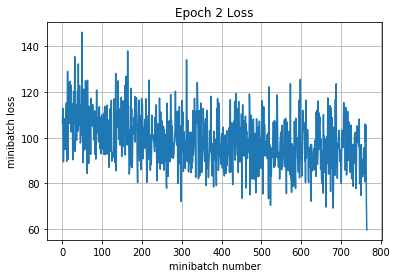

Iteration 1600: with minibatch training loss = 1.48 and accuracy of 0.53
Iteration 1700: with minibatch training loss = 1.19 and accuracy of 0.56
Iteration 1800: with minibatch training loss = 1.43 and accuracy of 0.47
Iteration 1900: with minibatch training loss = 1.1 and accuracy of 0.61
Iteration 2000: with minibatch training loss = 1.16 and accuracy of 0.56
Iteration 2100: with minibatch training loss = 1.34 and accuracy of 0.56
Iteration 2200: with minibatch training loss = 1.29 and accuracy of 0.44
Epoch 3, Overall loss = 1.36 and accuracy of 0.526


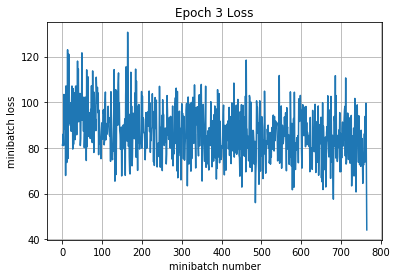

Iteration 2300: with minibatch training loss = 1.24 and accuracy of 0.58
Iteration 2400: with minibatch training loss = 1.19 and accuracy of 0.59
Iteration 2500: with minibatch training loss = 1.19 and accuracy of 0.59
Iteration 2600: with minibatch training loss = 1.21 and accuracy of 0.5
Iteration 2700: with minibatch training loss = 1.04 and accuracy of 0.64
Iteration 2800: with minibatch training loss = 1.25 and accuracy of 0.59
Iteration 2900: with minibatch training loss = 0.856 and accuracy of 0.72
Iteration 3000: with minibatch training loss = 1.12 and accuracy of 0.64
Epoch 4, Overall loss = 1.22 and accuracy of 0.57


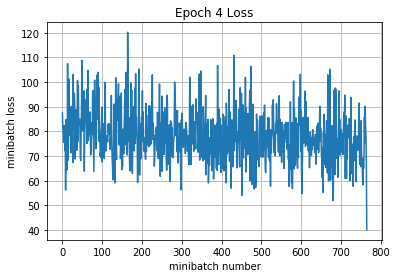

Iteration 3100: with minibatch training loss = 1.09 and accuracy of 0.55
Iteration 3200: with minibatch training loss = 1.04 and accuracy of 0.69
Iteration 3300: with minibatch training loss = 1.16 and accuracy of 0.55
Iteration 3400: with minibatch training loss = 1.34 and accuracy of 0.48
Iteration 3500: with minibatch training loss = 1.2 and accuracy of 0.56
Iteration 3600: with minibatch training loss = 1.07 and accuracy of 0.56
Iteration 3700: with minibatch training loss = 1.17 and accuracy of 0.59
Iteration 3800: with minibatch training loss = 1.12 and accuracy of 0.67
Epoch 5, Overall loss = 1.12 and accuracy of 0.603


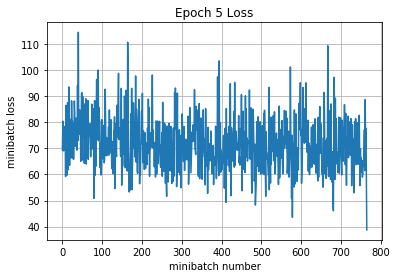

training time (seconds) 1636.9762875000015
Validation
Epoch 1, Overall loss = 1.07 and accuracy of 0.639
validation time (seconds) 2.0246289999922737
predict
Epoch 1, Overall loss = 0.0851 and accuracy of 1


In [130]:
def cnn_model_5x5x32_5x5x32_5x5x64_5x5x128_with_dropout_after_each_layer_batchnorm_after_affine_valid_padding(X, y, is_training, 
                                                                               dropout=None,
                                                                               **kwargs):
    out = X

    #32
    out, [W1, b1] = cnn(idx=1, X=out, filters=32, kernel_size=(5,5), is_training=is_training, padding='VALID')
    #28
    if dropout is not None:
        out = tf.layers.dropout(out, rate=dropout, training=is_training)
    out, _ = cnn(idx=2, X=out, filters=32, kernel_size=(5,5), is_training=is_training, padding='VALID')
    #24
    out = tf.nn.max_pool(out, ksize=(1,2,2,1), strides=(1,2,2,1), padding='SAME')
    #12
    if dropout is not None:    
        out = tf.layers.dropout(out, rate=dropout, training=is_training)
    out, _ = cnn(idx=3, X=out, filters=64, kernel_size=(5,5), is_training=is_training, padding='VALID')
    #8
    if dropout is not None:    
        out = tf.layers.dropout(out, rate=dropout, training=is_training)
    out, _ = cnn(idx=4, X=out, filters=128, kernel_size=(5,5), is_training=is_training, padding='VALID')
    #4
    if dropout is not None:    
        out = tf.layers.dropout(out, rate=dropout, training=is_training)

    # Affine layer from 4x4x128 = 2,048 to 1024 outputs
    out, _ = affine(1, out, output_size=1024)

    # ReLU Activation Layer
    out = tf.nn.relu(out)

    out = tf.layers.batch_normalization(out, training=is_training)
    if dropout is not None:    
        out = tf.layers.dropout(out, rate=dropout, training=is_training)
    # 5)
    # Affine layer from 1024 input units to 10 outputs
    out, _ = affine(2, out, output_size=10)
    return out, [W1]

local_models_max_polling = []

local_models_max_polling.append(estimate_model({
    'name': 'dropout: none',
    'model_builder': cnn_model_5x5x32_5x5x32_5x5x64_5x5x128_with_dropout_after_each_layer_batchnorm_after_affine_valid_padding,
    'learning_rate': 1e-4,
    'num_of_epochs': 5,
}, X_train, y_train, X_val, y_val))

local_models_max_polling.append(estimate_model({
    'name': 'dropout: 0.1',
    'dropout': 0.1,
    'model_builder': cnn_model_5x5x32_5x5x32_5x5x64_5x5x128_with_dropout_after_each_layer_batchnorm_after_affine_valid_padding,
    'learning_rate': 1e-4,
    'num_of_epochs': 5,
}, X_train, y_train, X_val, y_val))

local_models_max_polling.append(estimate_model({
    'name': 'dropout: 0.2',
    'dropout': 0.2,
    'model_builder': cnn_model_5x5x32_5x5x32_5x5x64_5x5x128_with_dropout_after_each_layer_batchnorm_after_affine_valid_padding,
    'learning_rate': 1e-4,
    'num_of_epochs': 5,
}, X_train, y_train, X_val, y_val))

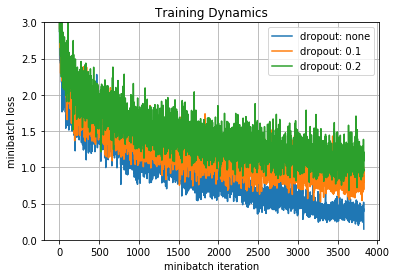

model: dropout: none


,num_of_trainable,predict,training,validation
time,2395242,0.123729,1578.55,2.01017
total_correct,2395242,NaN,0.897612,0.573
total_lost,2395242,NaN,0.400817,1.29542


model: dropout: 0.1


,num_of_trainable,predict,training,validation
time,2395242,0.155683,1673.63,2.36021
total_correct,2395242,NaN,0.684878,0.661
total_lost,2395242,NaN,0.892195,0.970083


model: dropout: 0.2


,num_of_trainable,predict,training,validation
time,2395242,0.156526,1636.98,2.02463
total_correct,2395242,NaN,0.603163,0.639
total_lost,2395242,NaN,1.12198,1.06869


Model dropout: none


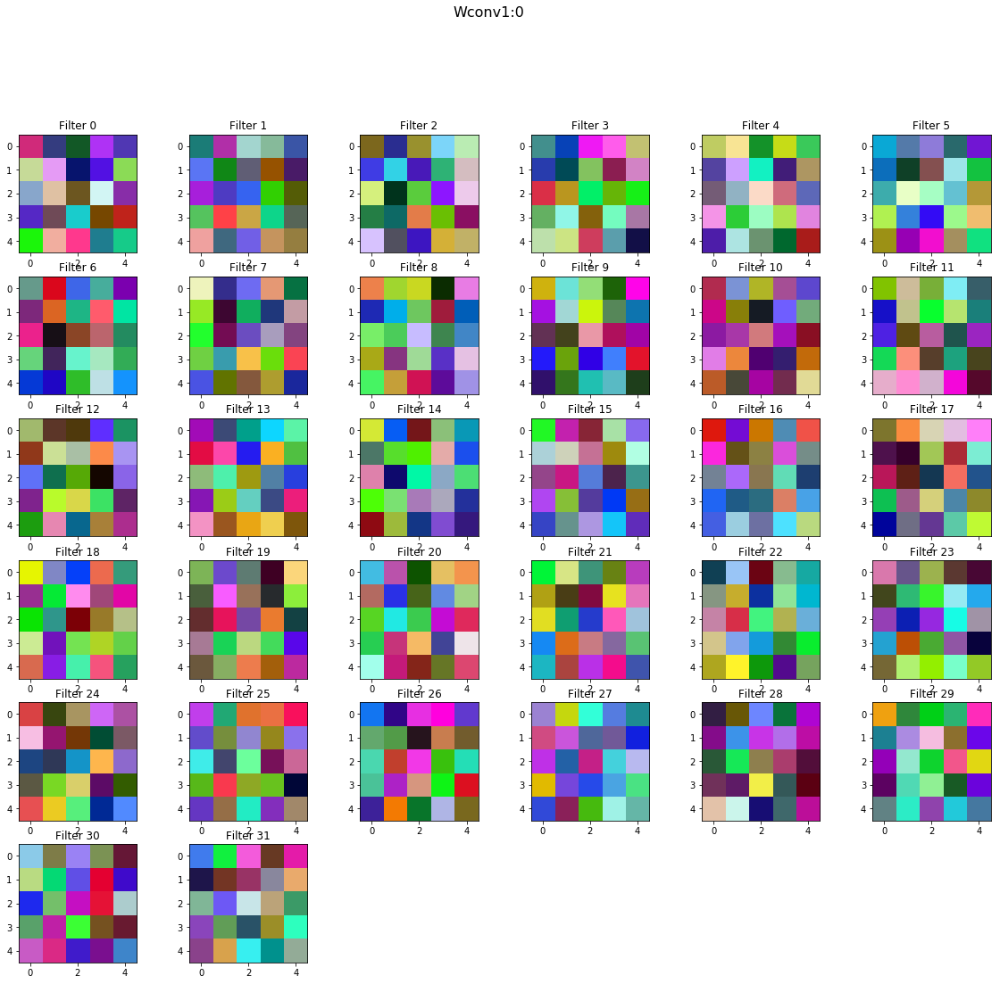

Model dropout: 0.1


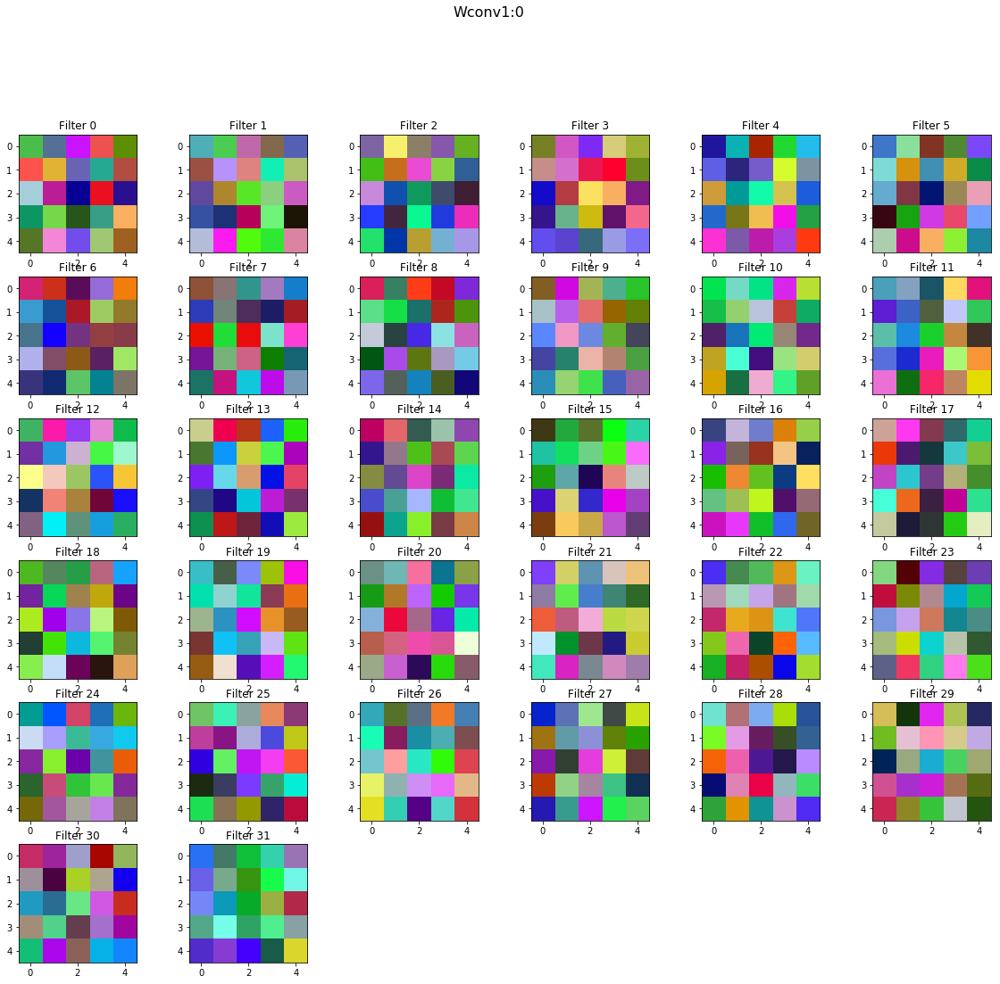

Model dropout: 0.2


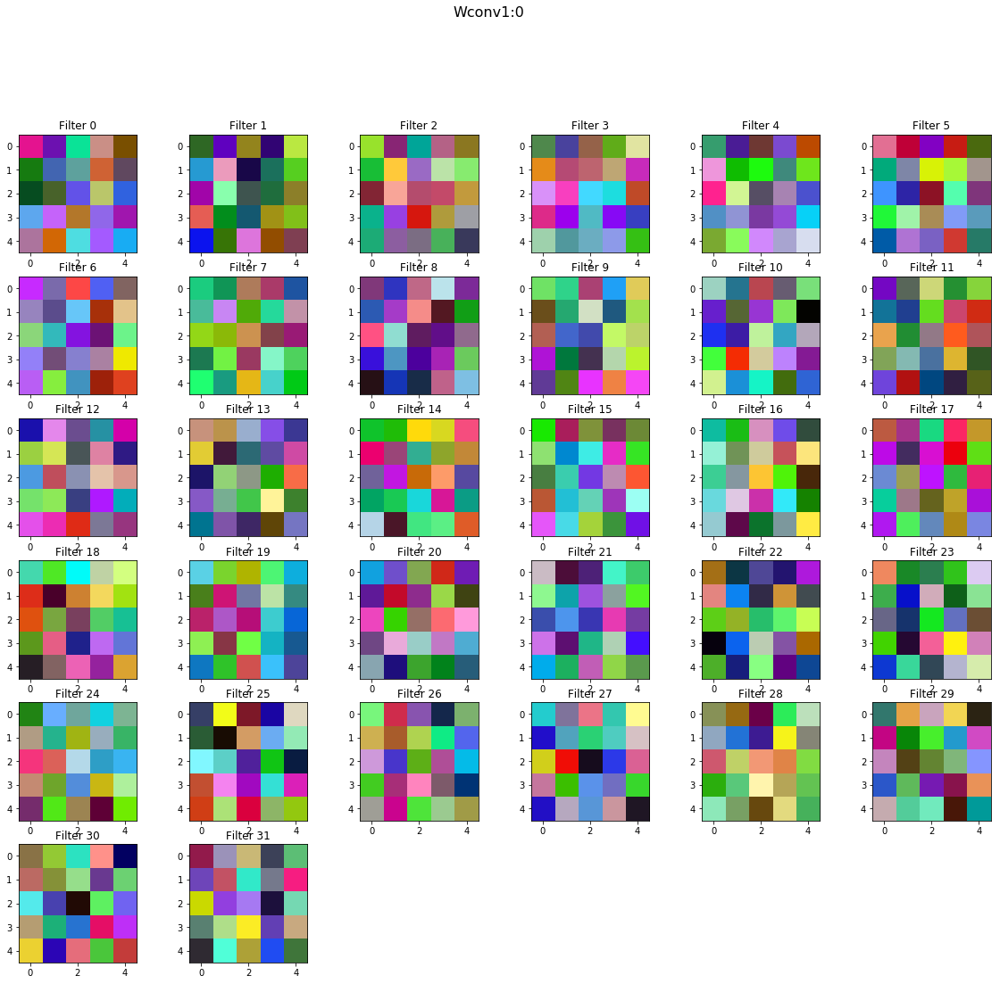

In [131]:
show_graphs(local_models_max_polling, ymax=3)
show_tables(local_models_max_polling)
draw_layers_of_models(local_models_max_polling)

Training
Iteration 0: with minibatch training loss = 3.08 and accuracy of 0.062
Iteration 100: with minibatch training loss = 1.86 and accuracy of 0.41
Iteration 200: with minibatch training loss = 1.59 and accuracy of 0.44
Iteration 300: with minibatch training loss = 1.57 and accuracy of 0.38
Iteration 400: with minibatch training loss = 1.23 and accuracy of 0.56
Iteration 500: with minibatch training loss = 1.25 and accuracy of 0.61
Iteration 600: with minibatch training loss = 1.18 and accuracy of 0.56
Iteration 700: with minibatch training loss = 1.26 and accuracy of 0.59
Epoch 1, Overall loss = 1.56 and accuracy of 0.481


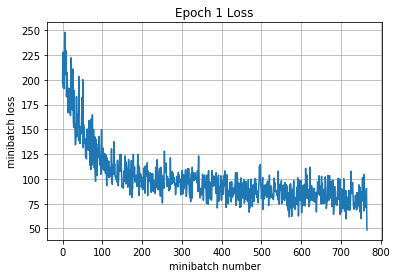

Iteration 800: with minibatch training loss = 1.05 and accuracy of 0.64
Iteration 900: with minibatch training loss = 0.845 and accuracy of 0.69
Iteration 1000: with minibatch training loss = 1.16 and accuracy of 0.62
Iteration 1100: with minibatch training loss = 1.1 and accuracy of 0.62
Iteration 1200: with minibatch training loss = 1.06 and accuracy of 0.64
Iteration 1300: with minibatch training loss = 1.09 and accuracy of 0.67
Iteration 1400: with minibatch training loss = 0.881 and accuracy of 0.69
Iteration 1500: with minibatch training loss = 0.771 and accuracy of 0.78
Epoch 2, Overall loss = 0.92 and accuracy of 0.684


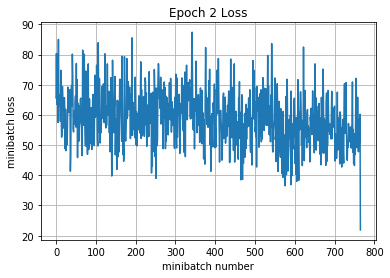

Iteration 1600: with minibatch training loss = 0.498 and accuracy of 0.81
Iteration 1700: with minibatch training loss = 0.267 and accuracy of 0.91
Iteration 1800: with minibatch training loss = 0.547 and accuracy of 0.84
Iteration 1900: with minibatch training loss = 0.348 and accuracy of 0.91
Iteration 2000: with minibatch training loss = 0.229 and accuracy of 0.94
Iteration 2100: with minibatch training loss = 0.307 and accuracy of 0.95
Iteration 2200: with minibatch training loss = 0.425 and accuracy of 0.84
Epoch 3, Overall loss = 0.4 and accuracy of 0.879


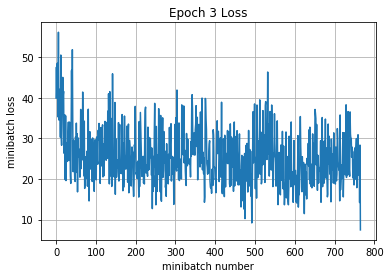

Iteration 2300: with minibatch training loss = 0.282 and accuracy of 0.92
Iteration 2400: with minibatch training loss = 0.158 and accuracy of 0.95
Iteration 2500: with minibatch training loss = 0.148 and accuracy of 0.97
Iteration 2600: with minibatch training loss = 0.245 and accuracy of 0.92
Iteration 2700: with minibatch training loss = 0.0903 and accuracy of 0.97
Iteration 2800: with minibatch training loss = 0.191 and accuracy of 0.94
Iteration 2900: with minibatch training loss = 0.229 and accuracy of 0.94
Iteration 3000: with minibatch training loss = 0.171 and accuracy of 0.97
Epoch 4, Overall loss = 0.178 and accuracy of 0.95


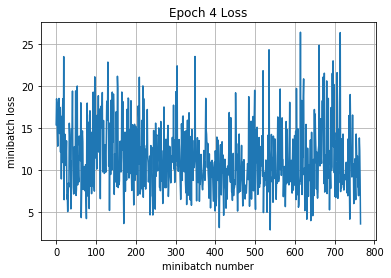

Iteration 3100: with minibatch training loss = 0.165 and accuracy of 0.97
Iteration 3200: with minibatch training loss = 0.0943 and accuracy of 0.97
Iteration 3300: with minibatch training loss = 0.208 and accuracy of 0.92
Iteration 3400: with minibatch training loss = 0.202 and accuracy of 0.92
Iteration 3500: with minibatch training loss = 0.0958 and accuracy of 0.98
Iteration 3600: with minibatch training loss = 0.102 and accuracy of 0.97
Iteration 3700: with minibatch training loss = 0.15 and accuracy of 0.95
Iteration 3800: with minibatch training loss = 0.115 and accuracy of 0.95
Epoch 5, Overall loss = 0.106 and accuracy of 0.97


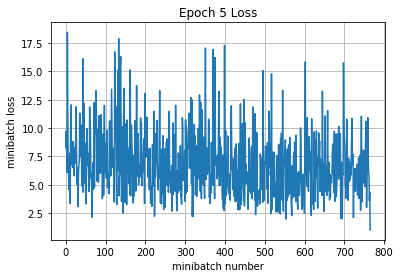

training time (seconds) 4165.14038360001
Validation
Epoch 1, Overall loss = 1.86 and accuracy of 0.543
validation time (seconds) 5.126193600008264
predict
Epoch 1, Overall loss = 0.000977 and accuracy of 1
Training
Iteration 0: with minibatch training loss = 2.82 and accuracy of 0.094
Iteration 100: with minibatch training loss = 1.89 and accuracy of 0.45
Iteration 200: with minibatch training loss = 1.61 and accuracy of 0.31
Iteration 300: with minibatch training loss = 1.66 and accuracy of 0.28
Iteration 400: with minibatch training loss = 1.41 and accuracy of 0.55
Iteration 500: with minibatch training loss = 1.5 and accuracy of 0.45
Iteration 600: with minibatch training loss = 1.48 and accuracy of 0.53
Iteration 700: with minibatch training loss = 1.49 and accuracy of 0.44
Epoch 1, Overall loss = 1.67 and accuracy of 0.451


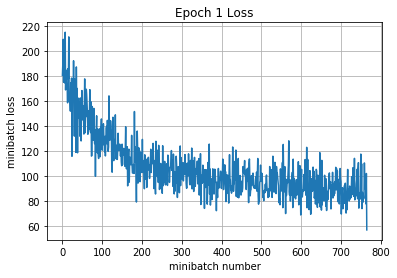

Iteration 800: with minibatch training loss = 1.07 and accuracy of 0.53
Iteration 900: with minibatch training loss = 1.03 and accuracy of 0.58
Iteration 1000: with minibatch training loss = 0.842 and accuracy of 0.77
Iteration 1100: with minibatch training loss = 1.02 and accuracy of 0.58
Iteration 1200: with minibatch training loss = 1.26 and accuracy of 0.5
Iteration 1300: with minibatch training loss = 1.42 and accuracy of 0.56
Iteration 1400: with minibatch training loss = 1.06 and accuracy of 0.59
Iteration 1500: with minibatch training loss = 1.5 and accuracy of 0.5
Epoch 2, Overall loss = 1.14 and accuracy of 0.607


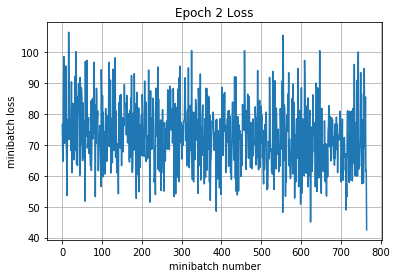

Iteration 1600: with minibatch training loss = 0.68 and accuracy of 0.75
Iteration 1700: with minibatch training loss = 0.77 and accuracy of 0.78
Iteration 1800: with minibatch training loss = 0.99 and accuracy of 0.64
Iteration 1900: with minibatch training loss = 0.659 and accuracy of 0.73
Iteration 2000: with minibatch training loss = 0.868 and accuracy of 0.69
Iteration 2100: with minibatch training loss = 0.864 and accuracy of 0.67
Iteration 2200: with minibatch training loss = 0.955 and accuracy of 0.69
Epoch 3, Overall loss = 0.876 and accuracy of 0.697


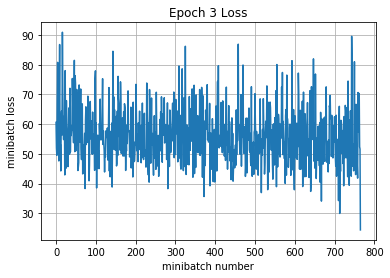

Iteration 2300: with minibatch training loss = 0.666 and accuracy of 0.72
Iteration 2400: with minibatch training loss = 0.496 and accuracy of 0.83
Iteration 2500: with minibatch training loss = 0.653 and accuracy of 0.72
Iteration 2600: with minibatch training loss = 0.729 and accuracy of 0.73
Iteration 2700: with minibatch training loss = 0.637 and accuracy of 0.8
Iteration 2800: with minibatch training loss = 0.613 and accuracy of 0.8
Iteration 2900: with minibatch training loss = 0.557 and accuracy of 0.81
Iteration 3000: with minibatch training loss = 0.676 and accuracy of 0.8
Epoch 4, Overall loss = 0.642 and accuracy of 0.778


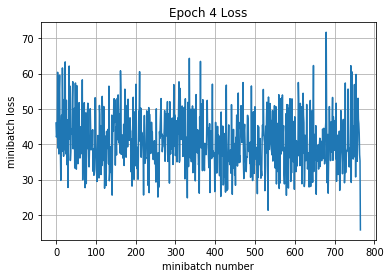

Iteration 3100: with minibatch training loss = 0.442 and accuracy of 0.84
Iteration 3200: with minibatch training loss = 0.339 and accuracy of 0.91
Iteration 3300: with minibatch training loss = 0.425 and accuracy of 0.88
Iteration 3400: with minibatch training loss = 0.513 and accuracy of 0.83
Iteration 3500: with minibatch training loss = 0.39 and accuracy of 0.84
Iteration 3600: with minibatch training loss = 0.62 and accuracy of 0.81
Iteration 3700: with minibatch training loss = 0.44 and accuracy of 0.81
Iteration 3800: with minibatch training loss = 0.292 and accuracy of 0.88
Epoch 5, Overall loss = 0.455 and accuracy of 0.847


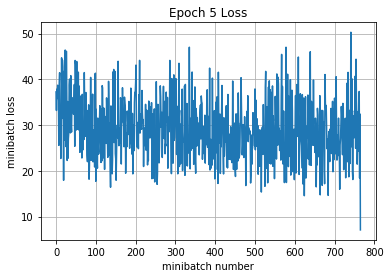

training time (seconds) 4351.141421699998
Validation
Epoch 1, Overall loss = 1.23 and accuracy of 0.637
validation time (seconds) 5.340535900002578
predict
Epoch 1, Overall loss = 0.159 and accuracy of 1
Training
Iteration 0: with minibatch training loss = 3.77 and accuracy of 0.078
Iteration 100: with minibatch training loss = 2.11 and accuracy of 0.36
Iteration 200: with minibatch training loss = 1.71 and accuracy of 0.5
Iteration 300: with minibatch training loss = 1.67 and accuracy of 0.44
Iteration 400: with minibatch training loss = 1.43 and accuracy of 0.48
Iteration 500: with minibatch training loss = 1.49 and accuracy of 0.41
Iteration 600: with minibatch training loss = 1.48 and accuracy of 0.47
Iteration 700: with minibatch training loss = 1.74 and accuracy of 0.42
Epoch 1, Overall loss = 1.81 and accuracy of 0.408


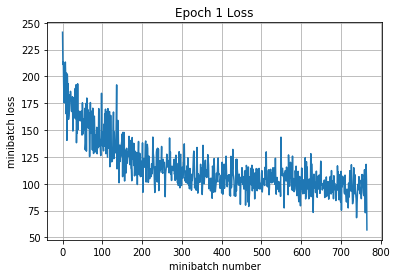

Iteration 800: with minibatch training loss = 1.62 and accuracy of 0.44
Iteration 900: with minibatch training loss = 1.27 and accuracy of 0.56
Iteration 1000: with minibatch training loss = 1.37 and accuracy of 0.47
Iteration 1100: with minibatch training loss = 1.29 and accuracy of 0.53
Iteration 1200: with minibatch training loss = 1.1 and accuracy of 0.59
Iteration 1300: with minibatch training loss = 1.33 and accuracy of 0.48
Iteration 1400: with minibatch training loss = 1.31 and accuracy of 0.62
Iteration 1500: with minibatch training loss = 1.36 and accuracy of 0.53
Epoch 2, Overall loss = 1.34 and accuracy of 0.536


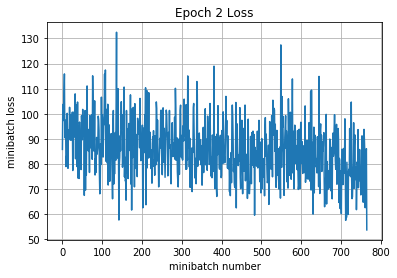

Iteration 1600: with minibatch training loss = 1.02 and accuracy of 0.59
Iteration 1700: with minibatch training loss = 1.22 and accuracy of 0.67
Iteration 1800: with minibatch training loss = 1 and accuracy of 0.64
Iteration 1900: with minibatch training loss = 1.13 and accuracy of 0.61
Iteration 2000: with minibatch training loss = 0.883 and accuracy of 0.64
Iteration 2100: with minibatch training loss = 1.49 and accuracy of 0.5
Iteration 2200: with minibatch training loss = 1.04 and accuracy of 0.58
Epoch 3, Overall loss = 1.13 and accuracy of 0.608


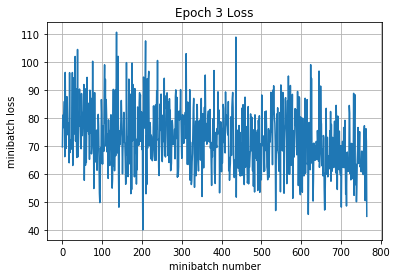

Iteration 2300: with minibatch training loss = 1.08 and accuracy of 0.59
Iteration 2400: with minibatch training loss = 1.03 and accuracy of 0.61
Iteration 2500: with minibatch training loss = 0.757 and accuracy of 0.73
Iteration 2600: with minibatch training loss = 1.14 and accuracy of 0.55
Iteration 2700: with minibatch training loss = 1.02 and accuracy of 0.62
Iteration 2800: with minibatch training loss = 0.9 and accuracy of 0.7
Iteration 2900: with minibatch training loss = 0.778 and accuracy of 0.73
Iteration 3000: with minibatch training loss = 0.884 and accuracy of 0.73
Epoch 4, Overall loss = 0.965 and accuracy of 0.665


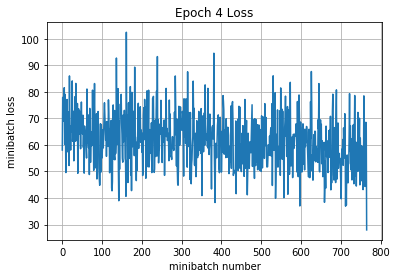

Iteration 3100: with minibatch training loss = 0.819 and accuracy of 0.73
Iteration 3200: with minibatch training loss = 1.23 and accuracy of 0.59
Iteration 3300: with minibatch training loss = 0.756 and accuracy of 0.72
Iteration 3400: with minibatch training loss = 0.726 and accuracy of 0.8
Iteration 3500: with minibatch training loss = 1.01 and accuracy of 0.66
Iteration 3600: with minibatch training loss = 0.561 and accuracy of 0.78
Iteration 3700: with minibatch training loss = 0.895 and accuracy of 0.69
Iteration 3800: with minibatch training loss = 0.819 and accuracy of 0.73
Epoch 5, Overall loss = 0.82 and accuracy of 0.716


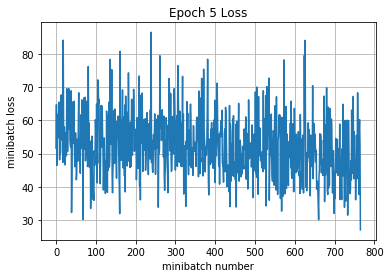

training time (seconds) 4405.7895401999995
Validation
Epoch 1, Overall loss = 0.971 and accuracy of 0.702
validation time (seconds) 5.390342599988799
predict
Epoch 1, Overall loss = 0.0102 and accuracy of 1


In [132]:
def cnn_model_5x5x32_5x5x32_5x5x64_5x5x128_with_dropout_after_each_layer_batchnorm_after_affine_without_maxpull_valid_padding(X, y, is_training, 
                                                                               dropout=None,
                                                                               **kwargs):
    out = X

    #32
    out, [W1, b1] = cnn(idx=1, X=out, filters=32, kernel_size=(5,5), is_training=is_training, padding='VALID')
    #28
    if dropout is not None:
        out = tf.layers.dropout(out, rate=dropout, training=is_training)
    out, _ = cnn(idx=2, X=out, filters=32, kernel_size=(5,5), is_training=is_training, padding='VALID')
    #24
    if dropout is not None:    
        out = tf.layers.dropout(out, rate=dropout, training=is_training)
    out, _ = cnn(idx=3, X=out, filters=64, kernel_size=(5,5), is_training=is_training, padding='VALID')
    #20
    if dropout is not None:    
        out = tf.layers.dropout(out, rate=dropout, training=is_training)
    out, _ = cnn(idx=4, X=out, filters=128, kernel_size=(5,5), is_training=is_training, padding='VALID')
    #16
    if dropout is not None:    
        out = tf.layers.dropout(out, rate=dropout, training=is_training)

    # Affine layer from 16x16x128 = 32,768 to 1024 outputs
    out, _ = affine(1, out, output_size=1024)

    # ReLU Activation Layer
    out = tf.nn.relu(out)

    out = tf.layers.batch_normalization(out, training=is_training)
    if dropout is not None:    
        out = tf.layers.dropout(out, rate=dropout, training=is_training)

    # Affine layer from 1024 input units to 10 outputs
    out, _ = affine(2, out, output_size=10)
    return out, [W1]

local_models = []

local_models.append(estimate_model({
    'name': 'dropout: none',
    'model_builder': cnn_model_5x5x32_5x5x32_5x5x64_5x5x128_with_dropout_after_each_layer_batchnorm_after_affine_without_maxpull_valid_padding,
    'learning_rate': 1e-4,
    'num_of_epochs': 5,
}, X_train, y_train, X_val, y_val))

local_models.append(estimate_model({
    'name': 'dropout: 0.1',
    'dropout': 0.1,
    'model_builder': cnn_model_5x5x32_5x5x32_5x5x64_5x5x128_with_dropout_after_each_layer_batchnorm_after_affine_without_maxpull_valid_padding,
    'learning_rate': 1e-4,
    'num_of_epochs': 5,
}, X_train, y_train, X_val, y_val))

local_models.append(estimate_model({
    'name': 'dropout: 0.2',
    'dropout': 0.2,
    'model_builder': cnn_model_5x5x32_5x5x32_5x5x64_5x5x128_with_dropout_after_each_layer_batchnorm_after_affine_without_maxpull_valid_padding,
    'learning_rate': 1e-4,
    'num_of_epochs': 5,
}, X_train, y_train, X_val, y_val))

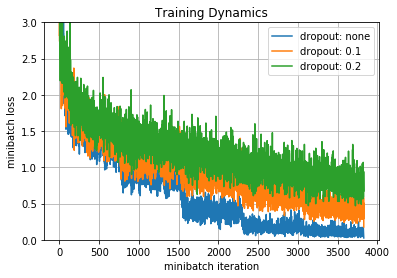

model: dropout: none


,num_of_trainable,predict,training,validation
time,33852522,0.135624,4165.14,5.12619
total_correct,33852522,NaN,0.970245,0.543
total_lost,33852522,NaN,0.106252,1.85926


model: dropout: 0.1


,num_of_trainable,predict,training,validation
time,33852522,0.202647,4351.14,5.34054
total_correct,33852522,NaN,0.846918,0.637
total_lost,33852522,NaN,0.454594,1.22511


model: dropout: 0.2


,num_of_trainable,predict,training,validation
time,33852522,0.176743,4405.79,5.39034
total_correct,33852522,NaN,0.715939,0.702
total_lost,33852522,NaN,0.820366,0.970549


In [133]:
show_graphs(local_models, ymax=3)
show_tables(local_models)

Model dropout: none


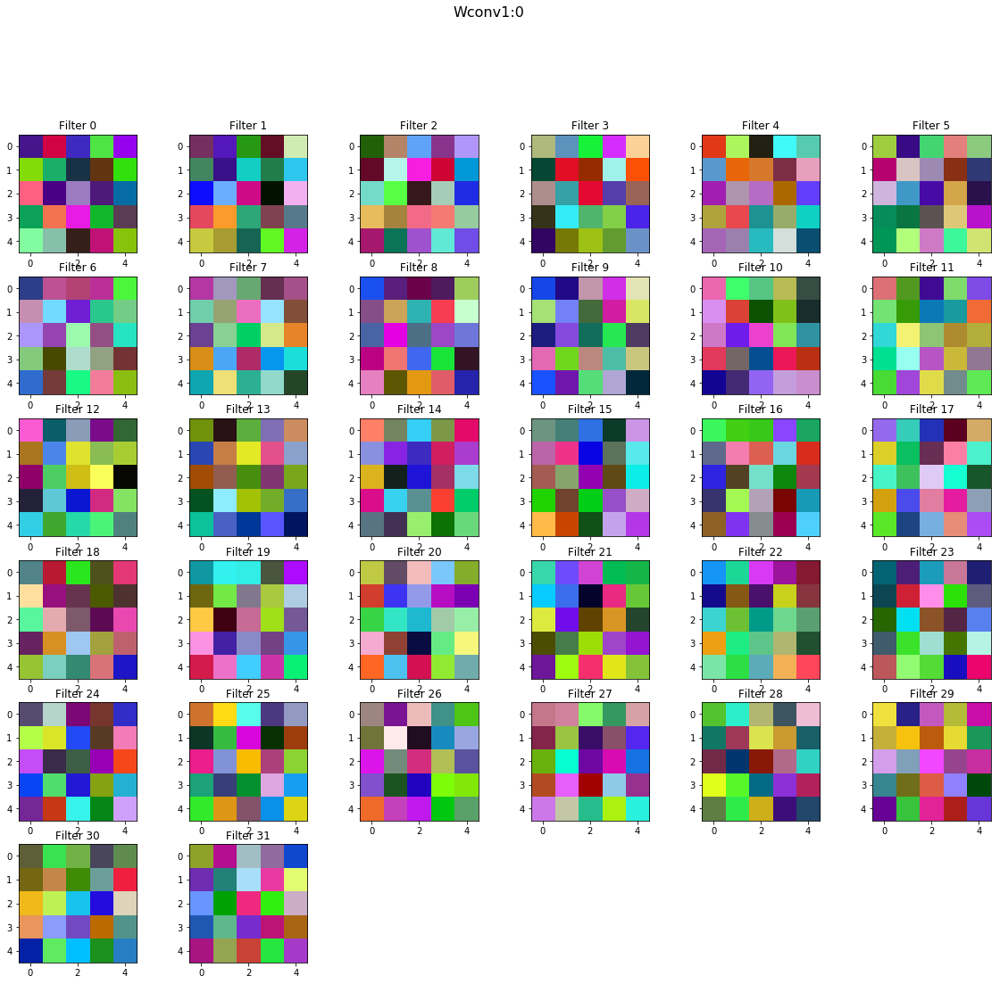

Model dropout: 0.1


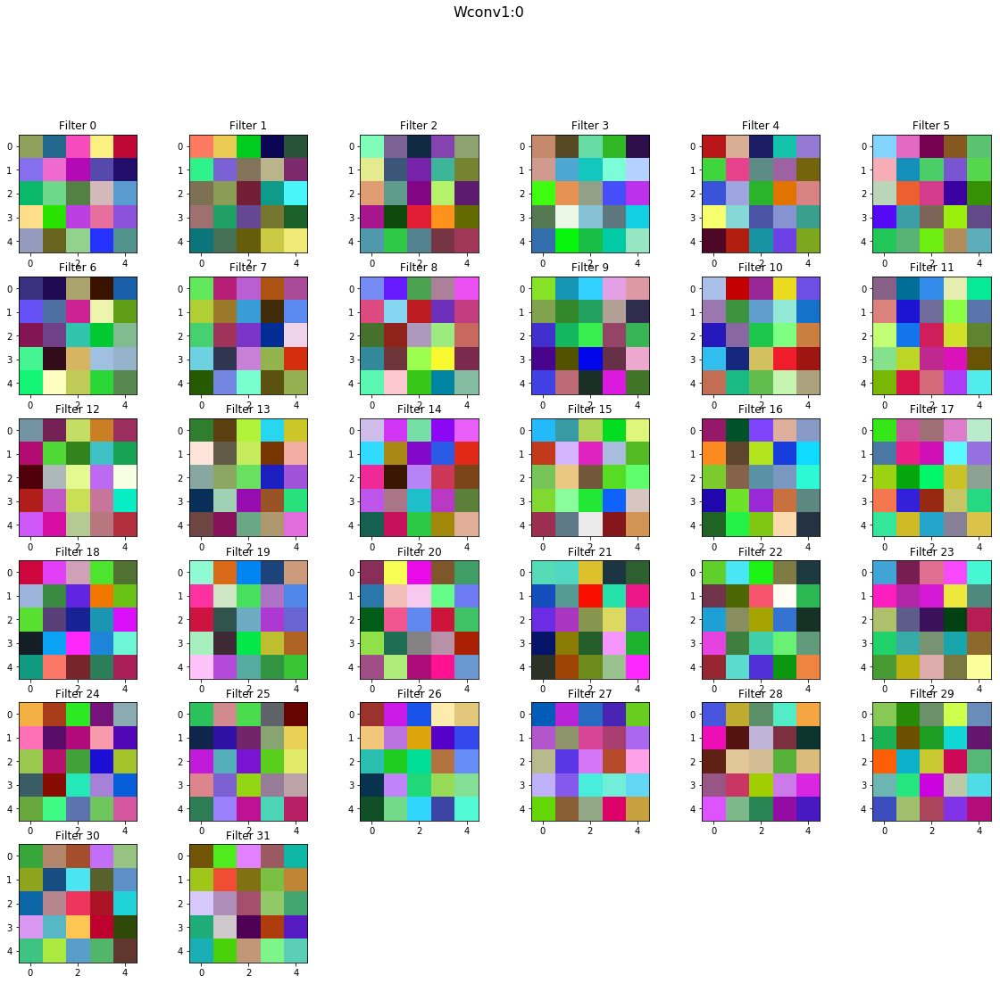

Model dropout: 0.2


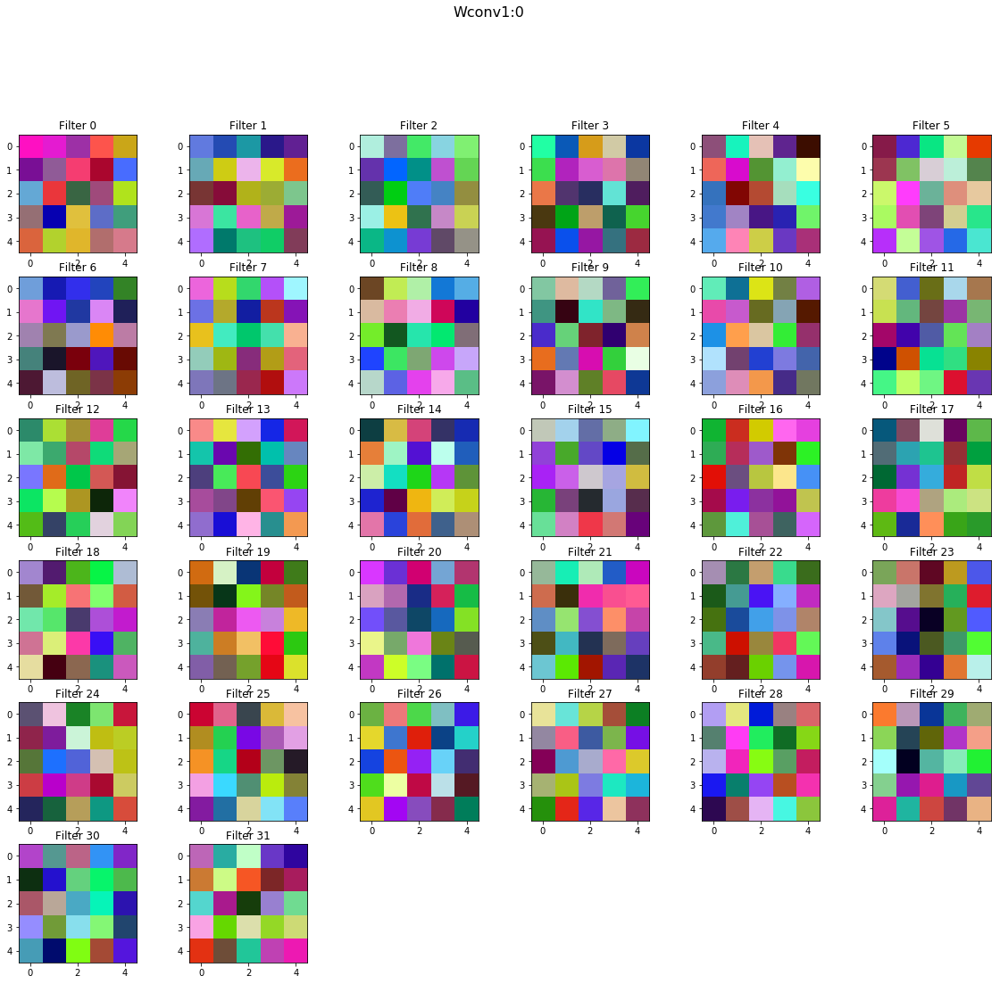

In [134]:
draw_layers_of_models(local_models)

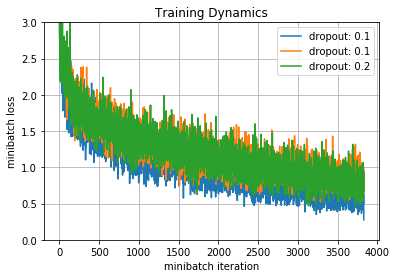

model: dropout: 0.1


,num_of_trainable,predict,training,validation
time,5187594,0.143435,2330.59,2.48528
total_correct,5187594,NaN,0.784653,0.693
total_lost,5187594,NaN,0.621732,0.938613


model: dropout: 0.1


,num_of_trainable,predict,training,validation
time,2395242,0.155683,1673.63,2.36021
total_correct,2395242,NaN,0.684878,0.661
total_lost,2395242,NaN,0.892195,0.970083


model: dropout: 0.2


,num_of_trainable,predict,training,validation
time,33852522,0.176743,4405.79,5.39034
total_correct,33852522,NaN,0.715939,0.702
total_lost,33852522,NaN,0.820366,0.970549


Model dropout: 0.1


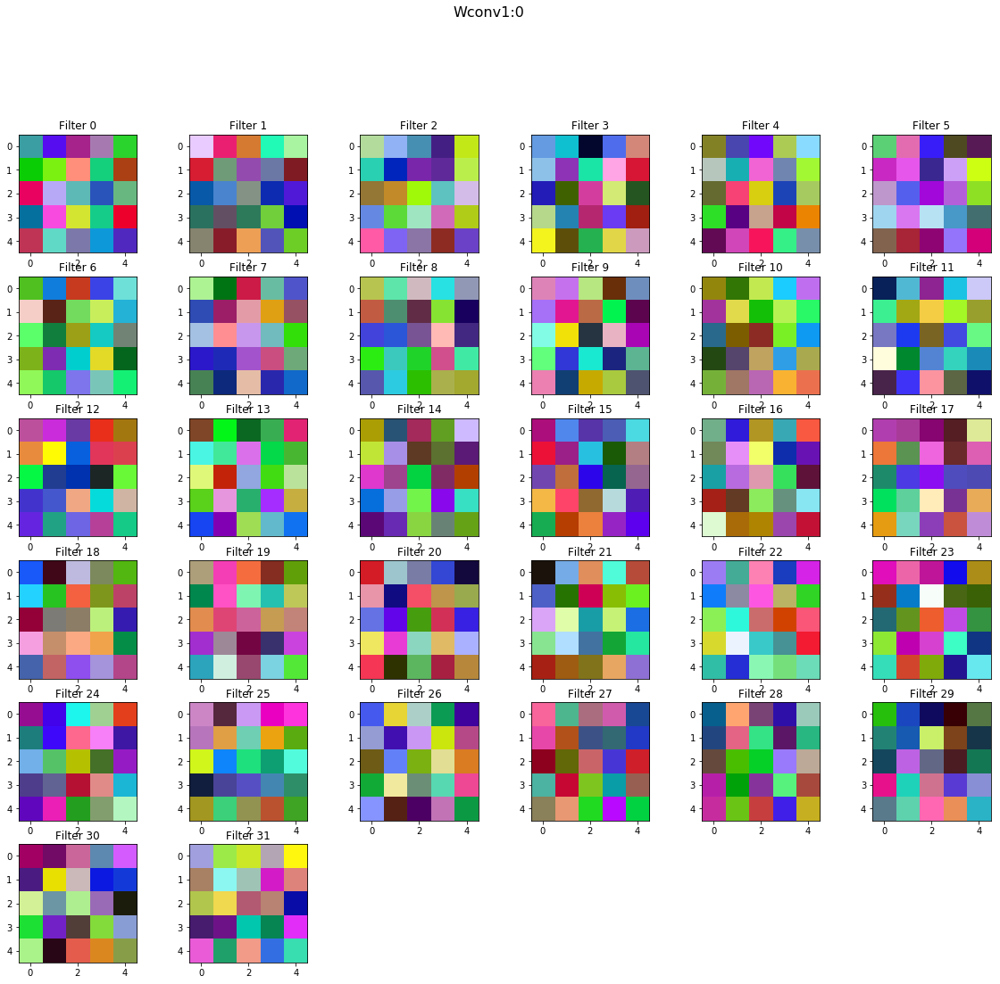

Model dropout: 0.1


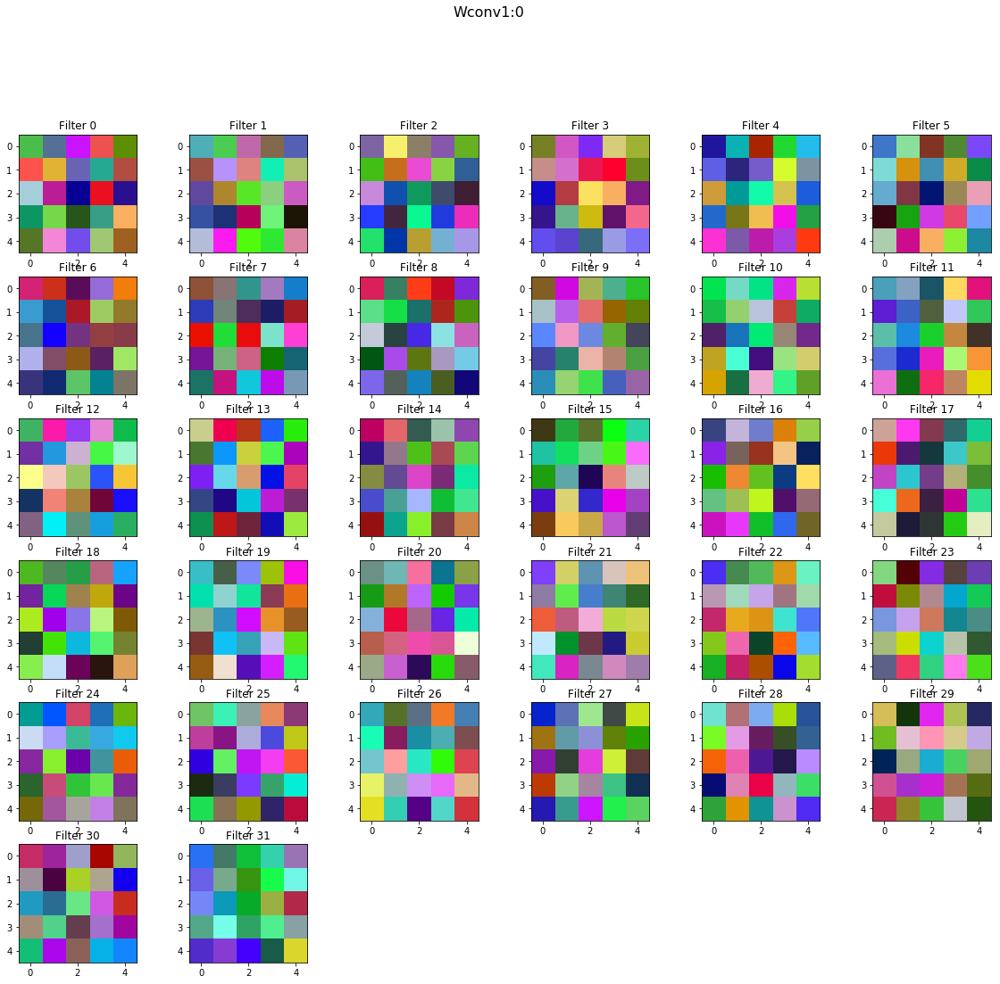

Model dropout: 0.2


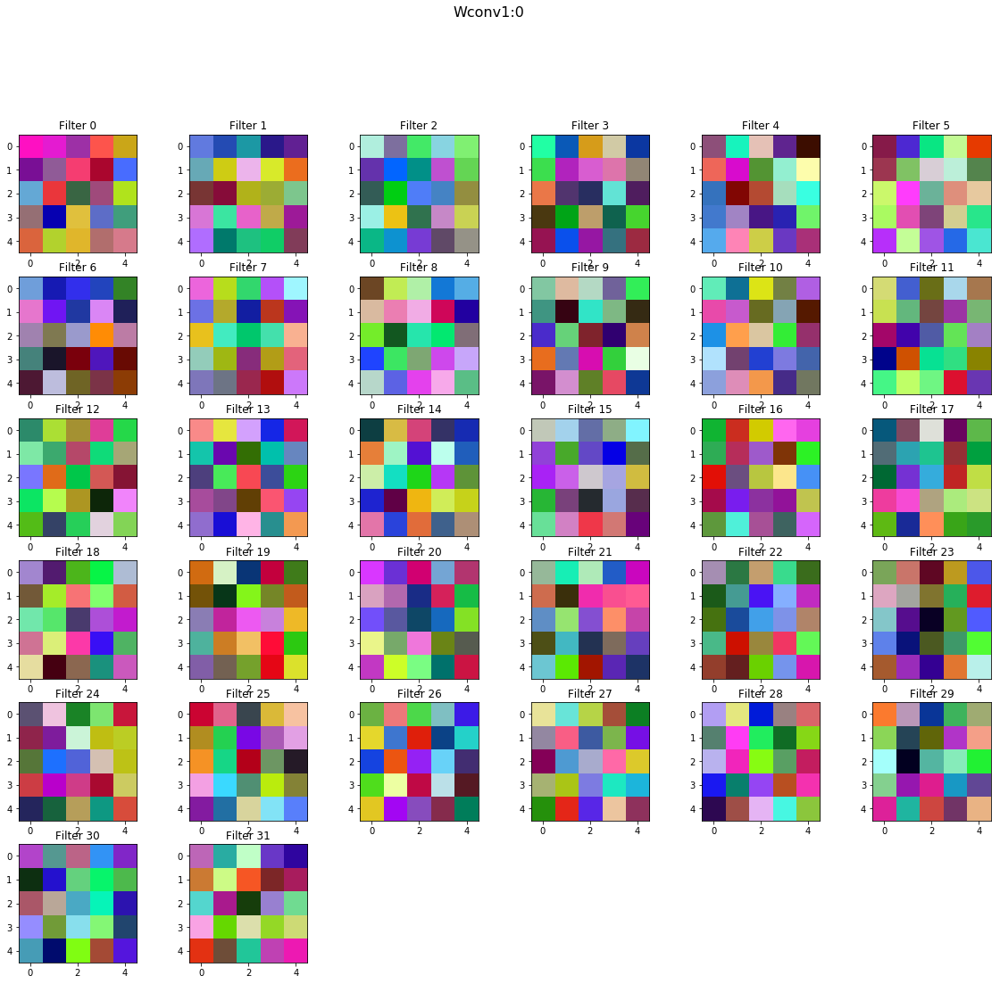

In [135]:
meta_models = [local_models_3_cnn[1], local_models_max_polling[1], local_models[2]]
show_graphs(meta_models, ymax=3)
show_tables(meta_models)
draw_layers_of_models(meta_models)

Training
Iteration 0: with minibatch training loss = 3.48 and accuracy of 0.078
Iteration 100: with minibatch training loss = 1.99 and accuracy of 0.38
Iteration 200: with minibatch training loss = 1.87 and accuracy of 0.41
Iteration 300: with minibatch training loss = 1.52 and accuracy of 0.5
Iteration 400: with minibatch training loss = 1.37 and accuracy of 0.48
Iteration 500: with minibatch training loss = 1.44 and accuracy of 0.61
Iteration 600: with minibatch training loss = 1.49 and accuracy of 0.58
Iteration 700: with minibatch training loss = 1.44 and accuracy of 0.48
Epoch 1, Overall loss = 1.67 and accuracy of 0.436


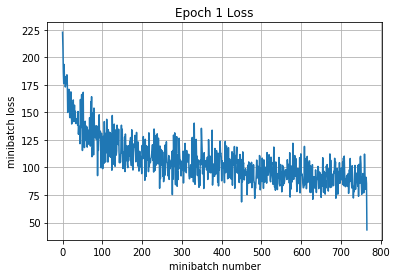

Iteration 800: with minibatch training loss = 1.11 and accuracy of 0.53
Iteration 900: with minibatch training loss = 1.24 and accuracy of 0.53
Iteration 1000: with minibatch training loss = 1.33 and accuracy of 0.59
Iteration 1100: with minibatch training loss = 0.938 and accuracy of 0.67
Iteration 1200: with minibatch training loss = 1.1 and accuracy of 0.62
Iteration 1300: with minibatch training loss = 1.02 and accuracy of 0.62
Iteration 1400: with minibatch training loss = 0.961 and accuracy of 0.66
Iteration 1500: with minibatch training loss = 1.15 and accuracy of 0.58
Epoch 2, Overall loss = 1.09 and accuracy of 0.619


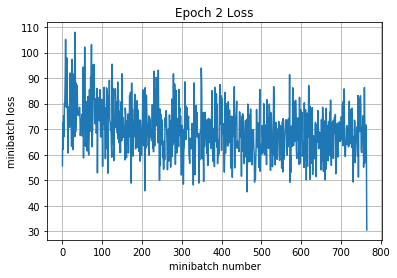

Iteration 1600: with minibatch training loss = 0.984 and accuracy of 0.69
Iteration 1700: with minibatch training loss = 0.828 and accuracy of 0.73
Iteration 1800: with minibatch training loss = 0.61 and accuracy of 0.8
Iteration 1900: with minibatch training loss = 0.657 and accuracy of 0.8
Iteration 2000: with minibatch training loss = 0.922 and accuracy of 0.73
Iteration 2100: with minibatch training loss = 0.887 and accuracy of 0.66
Iteration 2200: with minibatch training loss = 0.663 and accuracy of 0.81
Epoch 3, Overall loss = 0.797 and accuracy of 0.734


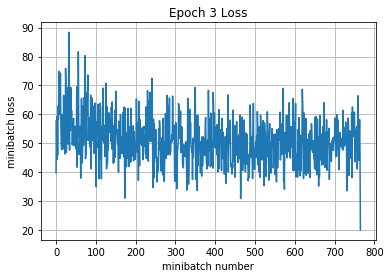

Iteration 2300: with minibatch training loss = 0.471 and accuracy of 0.91
Iteration 2400: with minibatch training loss = 0.658 and accuracy of 0.83
Iteration 2500: with minibatch training loss = 0.801 and accuracy of 0.75
Iteration 2600: with minibatch training loss = 0.564 and accuracy of 0.8
Iteration 2700: with minibatch training loss = 0.518 and accuracy of 0.8
Iteration 2800: with minibatch training loss = 0.575 and accuracy of 0.83
Iteration 2900: with minibatch training loss = 0.794 and accuracy of 0.75
Iteration 3000: with minibatch training loss = 0.565 and accuracy of 0.81
Epoch 4, Overall loss = 0.562 and accuracy of 0.835


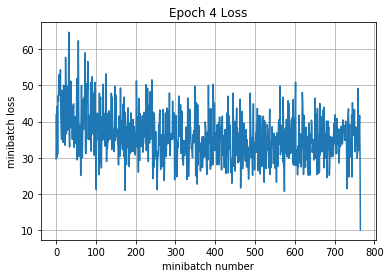

Iteration 3100: with minibatch training loss = 0.397 and accuracy of 0.92
Iteration 3200: with minibatch training loss = 0.424 and accuracy of 0.91
Iteration 3300: with minibatch training loss = 0.494 and accuracy of 0.81
Iteration 3400: with minibatch training loss = 0.452 and accuracy of 0.83
Iteration 3500: with minibatch training loss = 0.353 and accuracy of 0.89
Iteration 3600: with minibatch training loss = 0.335 and accuracy of 0.92
Iteration 3700: with minibatch training loss = 0.395 and accuracy of 0.84
Iteration 3800: with minibatch training loss = 0.247 and accuracy of 0.97
Epoch 5, Overall loss = 0.368 and accuracy of 0.914


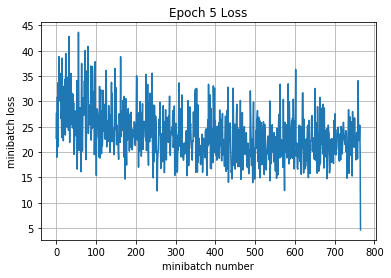

Iteration 3900: with minibatch training loss = 0.287 and accuracy of 0.94
Iteration 4000: with minibatch training loss = 0.164 and accuracy of 0.98
Iteration 4100: with minibatch training loss = 0.229 and accuracy of 0.98
Iteration 4200: with minibatch training loss = 0.232 and accuracy of 0.95
Iteration 4300: with minibatch training loss = 0.197 and accuracy of 0.95
Iteration 4400: with minibatch training loss = 0.155 and accuracy of 1
Iteration 4500: with minibatch training loss = 0.167 and accuracy of 1
Epoch 6, Overall loss = 0.222 and accuracy of 0.967


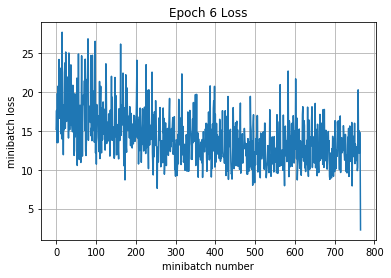

Iteration 4600: with minibatch training loss = 0.135 and accuracy of 1
Iteration 4700: with minibatch training loss = 0.144 and accuracy of 0.98
Iteration 4800: with minibatch training loss = 0.138 and accuracy of 0.98
Iteration 4900: with minibatch training loss = 0.095 and accuracy of 1
Iteration 5000: with minibatch training loss = 0.131 and accuracy of 0.98
Iteration 5100: with minibatch training loss = 0.111 and accuracy of 1
Iteration 5200: with minibatch training loss = 0.113 and accuracy of 1
Iteration 5300: with minibatch training loss = 0.0905 and accuracy of 1
Epoch 7, Overall loss = 0.129 and accuracy of 0.989


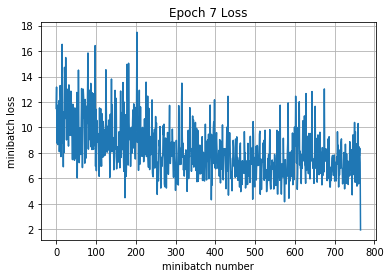

Iteration 5400: with minibatch training loss = 0.0976 and accuracy of 1
Iteration 5500: with minibatch training loss = 0.081 and accuracy of 1
Iteration 5600: with minibatch training loss = 0.0963 and accuracy of 0.98
Iteration 5700: with minibatch training loss = 0.0838 and accuracy of 1
Iteration 5800: with minibatch training loss = 0.0824 and accuracy of 1
Iteration 5900: with minibatch training loss = 0.0714 and accuracy of 1
Iteration 6000: with minibatch training loss = 0.0978 and accuracy of 0.98
Iteration 6100: with minibatch training loss = 0.101 and accuracy of 1
Epoch 8, Overall loss = 0.0852 and accuracy of 0.994


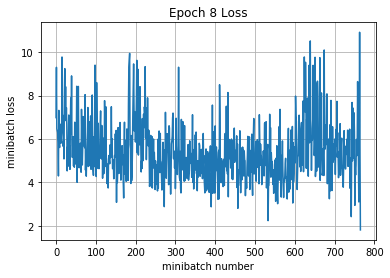

Iteration 6200: with minibatch training loss = 0.111 and accuracy of 0.98
Iteration 6300: with minibatch training loss = 0.041 and accuracy of 1
Iteration 6400: with minibatch training loss = 0.0469 and accuracy of 1
Iteration 6500: with minibatch training loss = 0.0921 and accuracy of 0.98
Iteration 6600: with minibatch training loss = 0.0876 and accuracy of 0.98
Iteration 6700: with minibatch training loss = 0.0836 and accuracy of 1
Iteration 6800: with minibatch training loss = 0.0923 and accuracy of 1
Epoch 9, Overall loss = 0.0762 and accuracy of 0.991


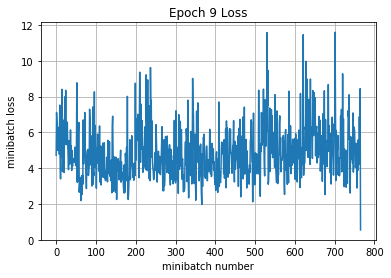

Iteration 6900: with minibatch training loss = 0.0739 and accuracy of 1
Iteration 7000: with minibatch training loss = 0.0664 and accuracy of 1
Iteration 7100: with minibatch training loss = 0.101 and accuracy of 0.98
Iteration 7200: with minibatch training loss = 0.0684 and accuracy of 0.97
Iteration 7300: with minibatch training loss = 0.0726 and accuracy of 0.97
Iteration 7400: with minibatch training loss = 0.0747 and accuracy of 1
Iteration 7500: with minibatch training loss = 0.0591 and accuracy of 0.97
Iteration 7600: with minibatch training loss = 0.101 and accuracy of 0.98
Epoch 10, Overall loss = 0.0772 and accuracy of 0.986


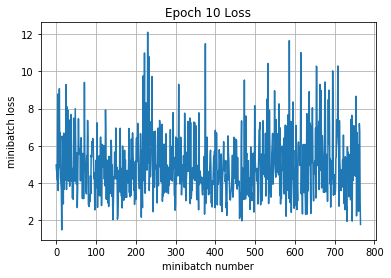

training time (seconds) 3473.1286832000187
Validation
Epoch 1, Overall loss = 1.75 and accuracy of 0.576
validation time (seconds) 3.0920719999994617
predict
Epoch 1, Overall loss = 0.000406 and accuracy of 1
Training
Iteration 0: with minibatch training loss = 3.57 and accuracy of 0.078
Iteration 100: with minibatch training loss = 2.1 and accuracy of 0.34
Iteration 200: with minibatch training loss = 1.83 and accuracy of 0.41
Iteration 300: with minibatch training loss = 1.84 and accuracy of 0.34
Iteration 400: with minibatch training loss = 1.56 and accuracy of 0.42
Iteration 500: with minibatch training loss = 1.51 and accuracy of 0.48
Iteration 600: with minibatch training loss = 1.44 and accuracy of 0.48
Iteration 700: with minibatch training loss = 1.45 and accuracy of 0.5
Epoch 1, Overall loss = 1.81 and accuracy of 0.391


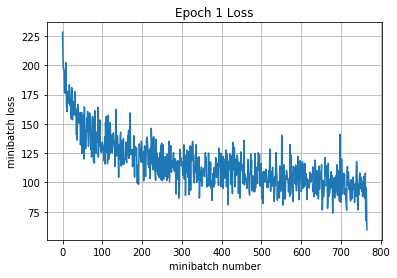

Iteration 800: with minibatch training loss = 1.74 and accuracy of 0.42
Iteration 900: with minibatch training loss = 1.65 and accuracy of 0.48
Iteration 1000: with minibatch training loss = 1.31 and accuracy of 0.55
Iteration 1100: with minibatch training loss = 1.55 and accuracy of 0.44
Iteration 1200: with minibatch training loss = 1.33 and accuracy of 0.52
Iteration 1300: with minibatch training loss = 1.35 and accuracy of 0.56
Iteration 1400: with minibatch training loss = 1.22 and accuracy of 0.55
Iteration 1500: with minibatch training loss = 1.09 and accuracy of 0.64
Epoch 2, Overall loss = 1.36 and accuracy of 0.522


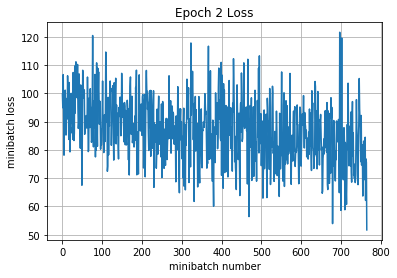

Iteration 1600: with minibatch training loss = 1.16 and accuracy of 0.5
Iteration 1700: with minibatch training loss = 0.938 and accuracy of 0.64
Iteration 1800: with minibatch training loss = 1.46 and accuracy of 0.52
Iteration 1900: with minibatch training loss = 0.962 and accuracy of 0.66
Iteration 2000: with minibatch training loss = 1.15 and accuracy of 0.66
Iteration 2100: with minibatch training loss = 1.1 and accuracy of 0.58
Iteration 2200: with minibatch training loss = 1.28 and accuracy of 0.61
Epoch 3, Overall loss = 1.17 and accuracy of 0.586


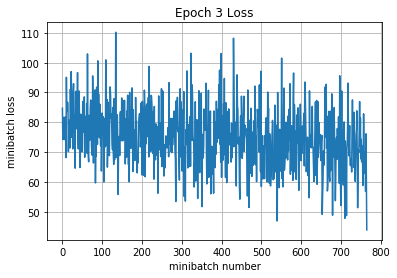

Iteration 2300: with minibatch training loss = 1.13 and accuracy of 0.62
Iteration 2400: with minibatch training loss = 1.09 and accuracy of 0.56
Iteration 2500: with minibatch training loss = 0.972 and accuracy of 0.66
Iteration 2600: with minibatch training loss = 1.11 and accuracy of 0.66
Iteration 2700: with minibatch training loss = 0.951 and accuracy of 0.73
Iteration 2800: with minibatch training loss = 1.05 and accuracy of 0.61
Iteration 2900: with minibatch training loss = 1.04 and accuracy of 0.64
Iteration 3000: with minibatch training loss = 1.28 and accuracy of 0.56
Epoch 4, Overall loss = 1.04 and accuracy of 0.635


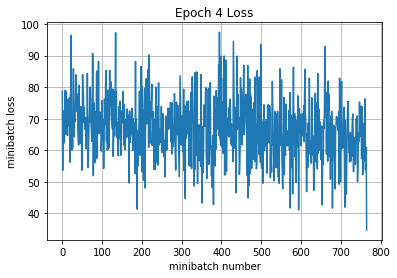

Iteration 3100: with minibatch training loss = 1.07 and accuracy of 0.64
Iteration 3200: with minibatch training loss = 1.16 and accuracy of 0.62
Iteration 3300: with minibatch training loss = 0.83 and accuracy of 0.75
Iteration 3400: with minibatch training loss = 0.921 and accuracy of 0.62
Iteration 3500: with minibatch training loss = 0.974 and accuracy of 0.67
Iteration 3600: with minibatch training loss = 1.08 and accuracy of 0.64
Iteration 3700: with minibatch training loss = 1.11 and accuracy of 0.64
Iteration 3800: with minibatch training loss = 0.608 and accuracy of 0.77
Epoch 5, Overall loss = 0.938 and accuracy of 0.669


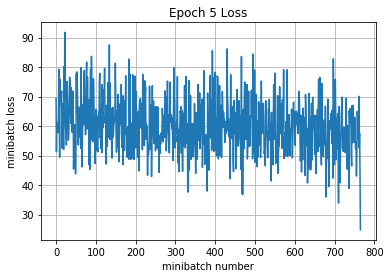

Iteration 3900: with minibatch training loss = 1.01 and accuracy of 0.66
Iteration 4000: with minibatch training loss = 0.779 and accuracy of 0.75
Iteration 4100: with minibatch training loss = 0.71 and accuracy of 0.8
Iteration 4200: with minibatch training loss = 0.839 and accuracy of 0.69
Iteration 4300: with minibatch training loss = 0.74 and accuracy of 0.7
Iteration 4400: with minibatch training loss = 0.79 and accuracy of 0.77
Iteration 4500: with minibatch training loss = 0.973 and accuracy of 0.58
Epoch 6, Overall loss = 0.846 and accuracy of 0.703


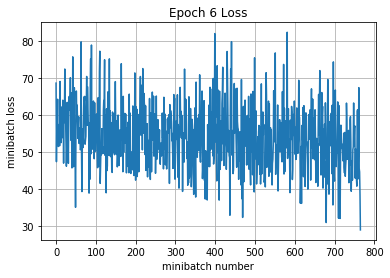

Iteration 4600: with minibatch training loss = 0.822 and accuracy of 0.7
Iteration 4700: with minibatch training loss = 0.71 and accuracy of 0.72
Iteration 4800: with minibatch training loss = 0.679 and accuracy of 0.75
Iteration 4900: with minibatch training loss = 0.925 and accuracy of 0.64
Iteration 5000: with minibatch training loss = 0.665 and accuracy of 0.72
Iteration 5100: with minibatch training loss = 0.655 and accuracy of 0.78
Iteration 5200: with minibatch training loss = 0.835 and accuracy of 0.67
Iteration 5300: with minibatch training loss = 0.664 and accuracy of 0.78
Epoch 7, Overall loss = 0.761 and accuracy of 0.731


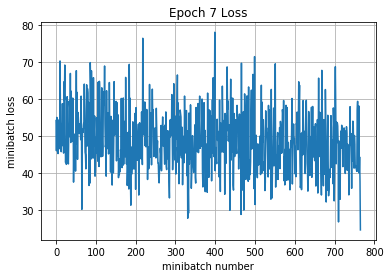

Iteration 5400: with minibatch training loss = 0.851 and accuracy of 0.67
Iteration 5500: with minibatch training loss = 0.759 and accuracy of 0.77
Iteration 5600: with minibatch training loss = 0.858 and accuracy of 0.69
Iteration 5700: with minibatch training loss = 0.766 and accuracy of 0.73
Iteration 5800: with minibatch training loss = 0.65 and accuracy of 0.72
Iteration 5900: with minibatch training loss = 0.7 and accuracy of 0.77
Iteration 6000: with minibatch training loss = 0.667 and accuracy of 0.75
Iteration 6100: with minibatch training loss = 0.617 and accuracy of 0.77
Epoch 8, Overall loss = 0.695 and accuracy of 0.756


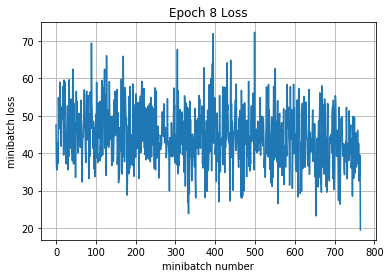

Iteration 6200: with minibatch training loss = 0.665 and accuracy of 0.81
Iteration 6300: with minibatch training loss = 0.655 and accuracy of 0.73
Iteration 6400: with minibatch training loss = 0.697 and accuracy of 0.75
Iteration 6500: with minibatch training loss = 0.832 and accuracy of 0.69
Iteration 6600: with minibatch training loss = 0.54 and accuracy of 0.78
Iteration 6700: with minibatch training loss = 0.767 and accuracy of 0.75
Iteration 6800: with minibatch training loss = 0.487 and accuracy of 0.83
Epoch 9, Overall loss = 0.632 and accuracy of 0.778


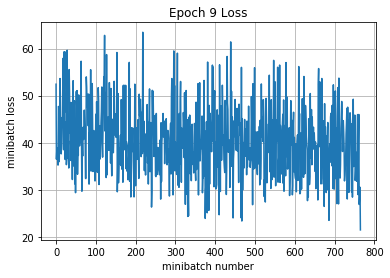

Iteration 6900: with minibatch training loss = 0.618 and accuracy of 0.81
Iteration 7000: with minibatch training loss = 0.622 and accuracy of 0.78
Iteration 7100: with minibatch training loss = 0.561 and accuracy of 0.77
Iteration 7200: with minibatch training loss = 0.456 and accuracy of 0.83
Iteration 7300: with minibatch training loss = 0.602 and accuracy of 0.75
Iteration 7400: with minibatch training loss = 0.535 and accuracy of 0.77
Iteration 7500: with minibatch training loss = 0.717 and accuracy of 0.81
Iteration 7600: with minibatch training loss = 0.556 and accuracy of 0.77
Epoch 10, Overall loss = 0.572 and accuracy of 0.797


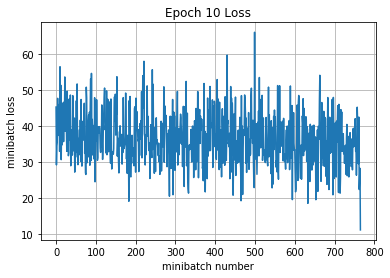

training time (seconds) 3447.268551999994
Validation
Epoch 1, Overall loss = 0.947 and accuracy of 0.694
validation time (seconds) 2.2611970999860205
predict
Epoch 1, Overall loss = 0.0595 and accuracy of 1
Training
Iteration 0: with minibatch training loss = 3.35 and accuracy of 0.11
Iteration 100: with minibatch training loss = 2.37 and accuracy of 0.2
Iteration 200: with minibatch training loss = 2.3 and accuracy of 0.36
Iteration 300: with minibatch training loss = 1.88 and accuracy of 0.33
Iteration 400: with minibatch training loss = 1.77 and accuracy of 0.28
Iteration 500: with minibatch training loss = 1.98 and accuracy of 0.33
Iteration 600: with minibatch training loss = 1.68 and accuracy of 0.44
Iteration 700: with minibatch training loss = 1.7 and accuracy of 0.39
Epoch 1, Overall loss = 2.03 and accuracy of 0.346


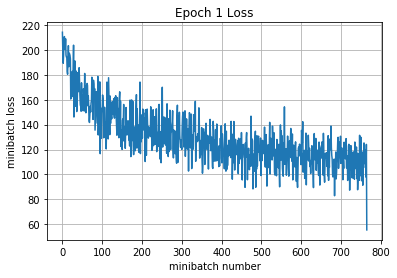

Iteration 800: with minibatch training loss = 1.54 and accuracy of 0.42
Iteration 900: with minibatch training loss = 1.73 and accuracy of 0.47
Iteration 1000: with minibatch training loss = 1.5 and accuracy of 0.41
Iteration 1100: with minibatch training loss = 1.63 and accuracy of 0.41
Iteration 1200: with minibatch training loss = 1.44 and accuracy of 0.47
Iteration 1300: with minibatch training loss = 1.38 and accuracy of 0.48
Iteration 1400: with minibatch training loss = 1.63 and accuracy of 0.55
Iteration 1500: with minibatch training loss = 1.11 and accuracy of 0.64
Epoch 2, Overall loss = 1.54 and accuracy of 0.466


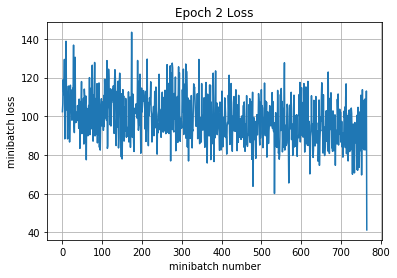

Iteration 1600: with minibatch training loss = 1.52 and accuracy of 0.48
Iteration 1700: with minibatch training loss = 1.46 and accuracy of 0.45
Iteration 1800: with minibatch training loss = 1.22 and accuracy of 0.5
Iteration 1900: with minibatch training loss = 1.09 and accuracy of 0.64
Iteration 2000: with minibatch training loss = 1.48 and accuracy of 0.45
Iteration 2100: with minibatch training loss = 1.11 and accuracy of 0.56
Iteration 2200: with minibatch training loss = 1.66 and accuracy of 0.48
Epoch 3, Overall loss = 1.36 and accuracy of 0.525


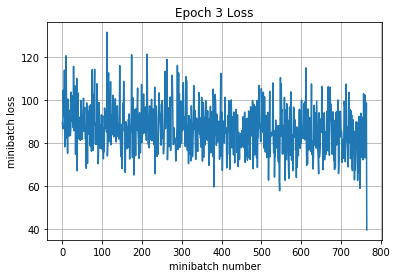

Iteration 2300: with minibatch training loss = 1.51 and accuracy of 0.48
Iteration 2400: with minibatch training loss = 0.966 and accuracy of 0.64
Iteration 2500: with minibatch training loss = 1.38 and accuracy of 0.58
Iteration 2600: with minibatch training loss = 1.43 and accuracy of 0.45
Iteration 2700: with minibatch training loss = 1.07 and accuracy of 0.56
Iteration 2800: with minibatch training loss = 1.1 and accuracy of 0.66
Iteration 2900: with minibatch training loss = 1.07 and accuracy of 0.59
Iteration 3000: with minibatch training loss = 1.14 and accuracy of 0.58
Epoch 4, Overall loss = 1.22 and accuracy of 0.572


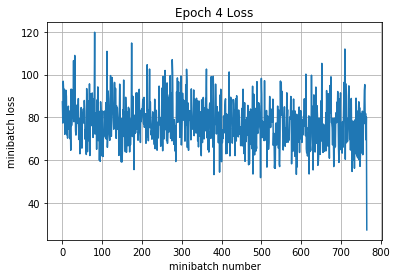

Iteration 3100: with minibatch training loss = 1.18 and accuracy of 0.61
Iteration 3200: with minibatch training loss = 1.27 and accuracy of 0.62
Iteration 3300: with minibatch training loss = 1.04 and accuracy of 0.66
Iteration 3400: with minibatch training loss = 1.12 and accuracy of 0.53
Iteration 3500: with minibatch training loss = 1.18 and accuracy of 0.61
Iteration 3600: with minibatch training loss = 1.17 and accuracy of 0.64
Iteration 3700: with minibatch training loss = 1.03 and accuracy of 0.67
Iteration 3800: with minibatch training loss = 1.13 and accuracy of 0.56
Epoch 5, Overall loss = 1.12 and accuracy of 0.611


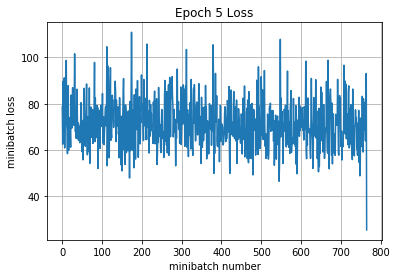

Iteration 3900: with minibatch training loss = 0.8 and accuracy of 0.72
Iteration 4000: with minibatch training loss = 1.21 and accuracy of 0.53
Iteration 4100: with minibatch training loss = 1.37 and accuracy of 0.56
Iteration 4200: with minibatch training loss = 1.12 and accuracy of 0.66
Iteration 4300: with minibatch training loss = 0.917 and accuracy of 0.72
Iteration 4400: with minibatch training loss = 0.902 and accuracy of 0.67
Iteration 4500: with minibatch training loss = 1.1 and accuracy of 0.67
Epoch 6, Overall loss = 1.04 and accuracy of 0.637


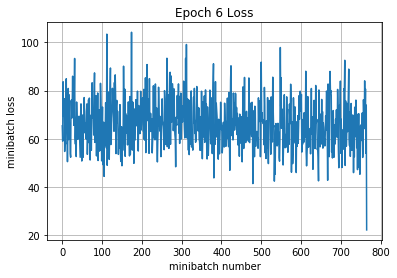

Iteration 4600: with minibatch training loss = 1.19 and accuracy of 0.62
Iteration 4700: with minibatch training loss = 0.978 and accuracy of 0.67
Iteration 4800: with minibatch training loss = 0.975 and accuracy of 0.69
Iteration 4900: with minibatch training loss = 1.13 and accuracy of 0.62
Iteration 5000: with minibatch training loss = 0.935 and accuracy of 0.62
Iteration 5100: with minibatch training loss = 0.977 and accuracy of 0.62
Iteration 5200: with minibatch training loss = 0.849 and accuracy of 0.67
Iteration 5300: with minibatch training loss = 0.769 and accuracy of 0.73
Epoch 7, Overall loss = 0.964 and accuracy of 0.66


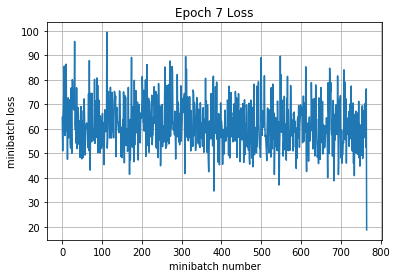

Iteration 5400: with minibatch training loss = 0.821 and accuracy of 0.7
Iteration 5500: with minibatch training loss = 1.02 and accuracy of 0.67
Iteration 5600: with minibatch training loss = 0.771 and accuracy of 0.78
Iteration 5700: with minibatch training loss = 1.05 and accuracy of 0.58
Iteration 5800: with minibatch training loss = 0.836 and accuracy of 0.7
Iteration 5900: with minibatch training loss = 0.694 and accuracy of 0.77
Iteration 6000: with minibatch training loss = 0.813 and accuracy of 0.7
Iteration 6100: with minibatch training loss = 1.04 and accuracy of 0.53
Epoch 8, Overall loss = 0.897 and accuracy of 0.682


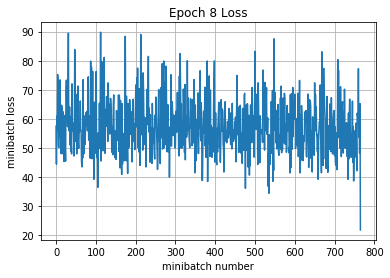

Iteration 6200: with minibatch training loss = 1.03 and accuracy of 0.64
Iteration 6300: with minibatch training loss = 0.709 and accuracy of 0.72
Iteration 6400: with minibatch training loss = 0.87 and accuracy of 0.73
Iteration 6500: with minibatch training loss = 1.04 and accuracy of 0.67
Iteration 6600: with minibatch training loss = 0.838 and accuracy of 0.75
Iteration 6700: with minibatch training loss = 0.854 and accuracy of 0.69
Iteration 6800: with minibatch training loss = 1.02 and accuracy of 0.64
Epoch 9, Overall loss = 0.85 and accuracy of 0.698


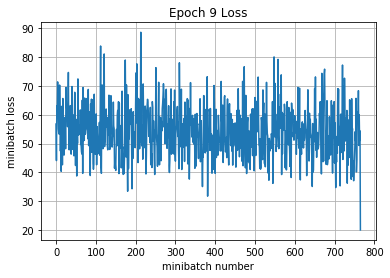

Iteration 6900: with minibatch training loss = 0.818 and accuracy of 0.69
Iteration 7000: with minibatch training loss = 0.651 and accuracy of 0.77
Iteration 7100: with minibatch training loss = 0.74 and accuracy of 0.75
Iteration 7200: with minibatch training loss = 0.844 and accuracy of 0.72
Iteration 7300: with minibatch training loss = 0.662 and accuracy of 0.75
Iteration 7400: with minibatch training loss = 0.851 and accuracy of 0.69
Iteration 7500: with minibatch training loss = 0.756 and accuracy of 0.67
Iteration 7600: with minibatch training loss = 0.674 and accuracy of 0.72
Epoch 10, Overall loss = 0.794 and accuracy of 0.719


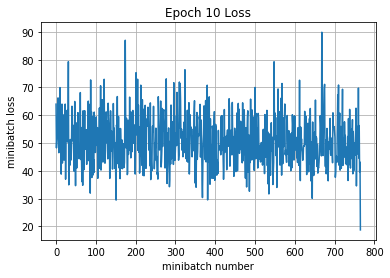

training time (seconds) 4188.307067999995
Validation
Epoch 1, Overall loss = 0.904 and accuracy of 0.708
validation time (seconds) 3.2954123999807052
predict
Epoch 1, Overall loss = 0.00151 and accuracy of 1


In [136]:
def cnn_model_5x5x32_5x5x32_5x5x64_5x5x128_with_dropout_after_each_layer_batchnorm_after_affine_valid_padding(X, y, is_training, 
                                                                               dropout=None,
                                                                               **kwargs):
    out = X

    #32
    out, [W1, b1] = cnn(idx=1, X=out, filters=32, kernel_size=(5,5), is_training=is_training, padding='VALID')
    #28
    if dropout is not None:
        out = tf.layers.dropout(out, rate=dropout, training=is_training)
    out, _ = cnn(idx=2, X=out, filters=32, kernel_size=(5,5), is_training=is_training, padding='VALID')
    #24
    out = tf.nn.max_pool(out, ksize=(1,2,2,1), strides=(1,2,2,1), padding='SAME')
    #12
    if dropout is not None:    
        out = tf.layers.dropout(out, rate=dropout, training=is_training)
    out, _ = cnn(idx=3, X=out, filters=64, kernel_size=(5,5), is_training=is_training, padding='VALID')
    #8
    if dropout is not None:    
        out = tf.layers.dropout(out, rate=dropout, training=is_training)
    out, _ = cnn(idx=4, X=out, filters=128, kernel_size=(5,5), is_training=is_training, padding='VALID')
    #4
    if dropout is not None:    
        out = tf.layers.dropout(out, rate=dropout, training=is_training)

    # Affine layer from 4x4x128 = 2,048 to 1024 outputs
    out, _ = affine(1, out, output_size=1024)

    # ReLU Activation Layer
    out = tf.nn.relu(out)

    out = tf.layers.batch_normalization(out, training=is_training)
    if dropout is not None:    
        out = tf.layers.dropout(out, rate=dropout, training=is_training)
    # 5)
    # Affine layer from 1024 input units to 10 outputs
    out, _ = affine(2, out, output_size=10)
    return out, [W1]

local_models_max_polling_long = []

local_models_max_polling_long.append(estimate_model({
    'name': 'dropout: none',
    'model_builder': cnn_model_5x5x32_5x5x32_5x5x64_5x5x128_with_dropout_after_each_layer_batchnorm_after_affine_valid_padding,
    'learning_rate': 1e-4,
    'num_of_epochs': 10,
}, X_train, y_train, X_val, y_val))

local_models_max_polling_long.append(estimate_model({
    'name': 'dropout: 0.1',
    'dropout': 0.1,
    'model_builder': cnn_model_5x5x32_5x5x32_5x5x64_5x5x128_with_dropout_after_each_layer_batchnorm_after_affine_valid_padding,
    'learning_rate': 1e-4,
    'num_of_epochs': 10,
}, X_train, y_train, X_val, y_val))

local_models_max_polling_long.append(estimate_model({
    'name': 'dropout: 0.2',
    'dropout': 0.2,
    'model_builder': cnn_model_5x5x32_5x5x32_5x5x64_5x5x128_with_dropout_after_each_layer_batchnorm_after_affine_valid_padding,
    'learning_rate': 1e-4,
    'num_of_epochs': 10,
}, X_train, y_train, X_val, y_val))

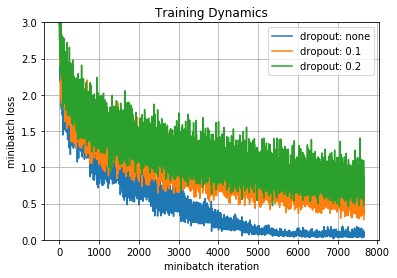

model: dropout: none


,num_of_trainable,predict,training,validation
time,2395242,0.143977,3473.13,3.09207
total_correct,2395242,NaN,0.986367,0.576
total_lost,2395242,NaN,0.0772338,1.74502


model: dropout: 0.1


,num_of_trainable,predict,training,validation
time,2395242,0.169023,3447.27,2.2612
total_correct,2395242,NaN,0.797245,0.694
total_lost,2395242,NaN,0.571811,0.946571


model: dropout: 0.2


,num_of_trainable,predict,training,validation
time,2395242,0.178912,4188.31,3.29541
total_correct,2395242,NaN,0.719082,0.708
total_lost,2395242,NaN,0.794041,0.90372


Model dropout: none


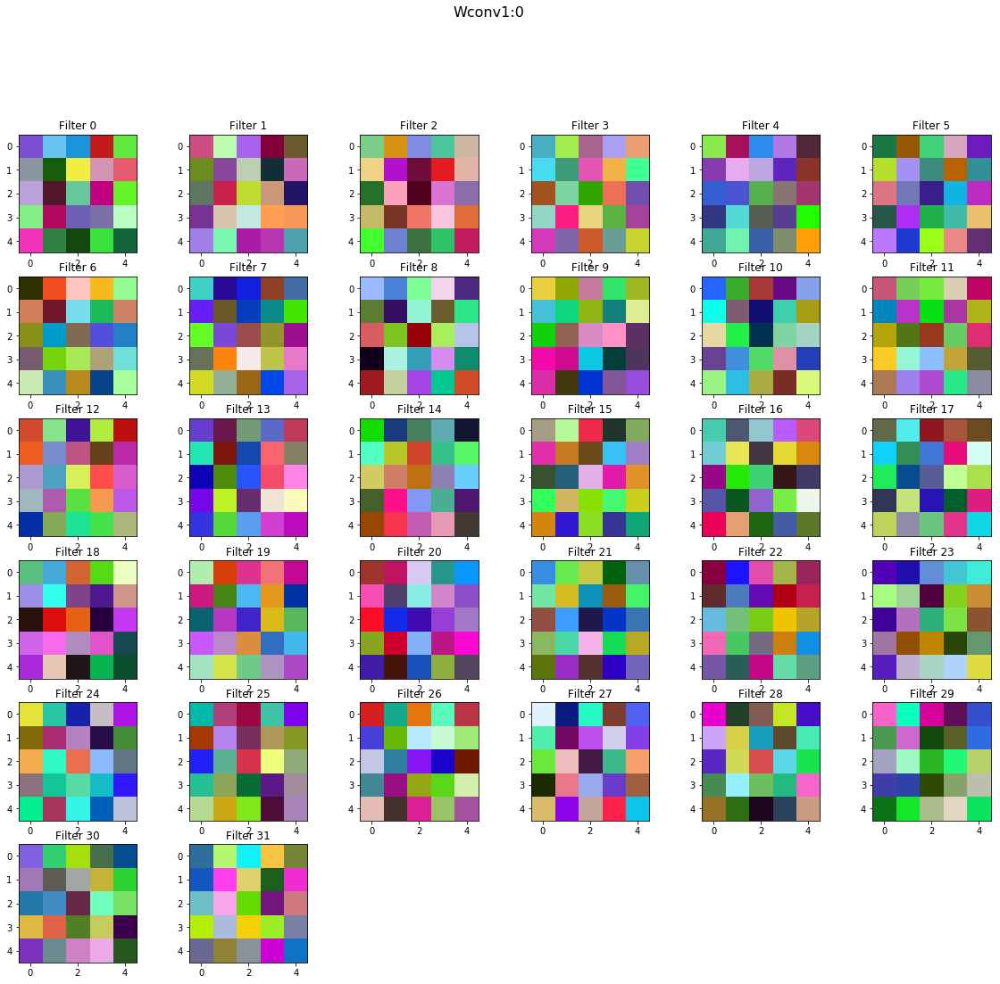

Model dropout: 0.1


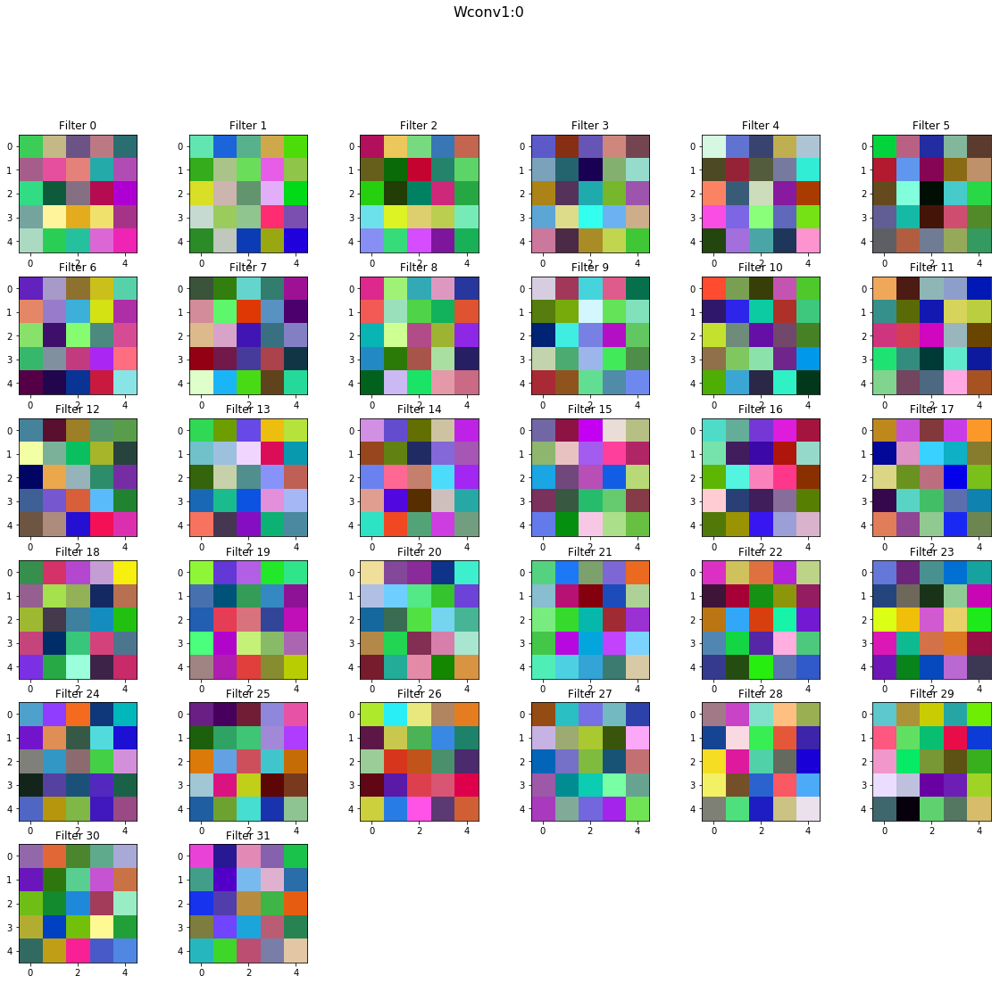

Model dropout: 0.2


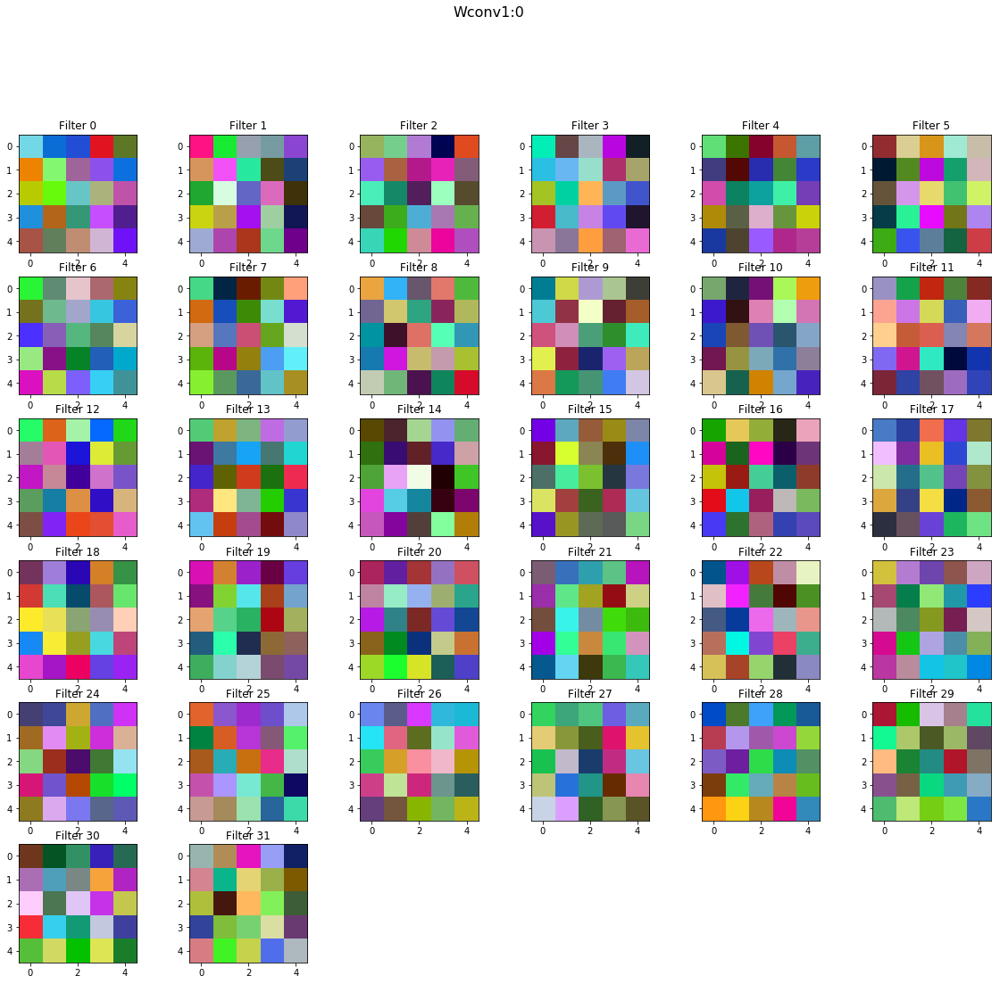

In [137]:
show_graphs(local_models_max_polling_long, ymax=3)
show_tables(local_models_max_polling_long)
draw_layers_of_models(local_models_max_polling_long)

# Find better Learning rate 
## for cnn(32,5,5)->cnn(32,5,5)->maxpoll->cnn(64,5,5)->cnn(128,5,5)->fc(1024)->fc(10)
- **options:** 5e-4, 1e-4, 5e-5
- **winner:** 5e-4

Training
Iteration 0: with minibatch training loss = 3.34 and accuracy of 0.14
Iteration 100: with minibatch training loss = 1.98 and accuracy of 0.38
Iteration 200: with minibatch training loss = 1.45 and accuracy of 0.45
Iteration 300: with minibatch training loss = 1.77 and accuracy of 0.42
Iteration 400: with minibatch training loss = 1.3 and accuracy of 0.53
Iteration 500: with minibatch training loss = 1.68 and accuracy of 0.38
Iteration 600: with minibatch training loss = 1.29 and accuracy of 0.56
Iteration 700: with minibatch training loss = 1.34 and accuracy of 0.41
Epoch 1, Overall loss = 1.74 and accuracy of 0.416


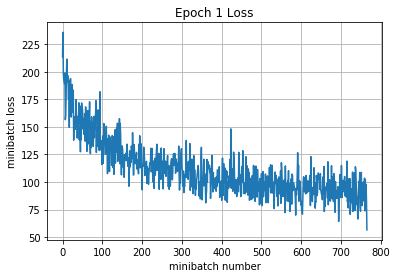

Iteration 800: with minibatch training loss = 1.18 and accuracy of 0.55
Iteration 900: with minibatch training loss = 1.42 and accuracy of 0.41
Iteration 1000: with minibatch training loss = 1.39 and accuracy of 0.55
Iteration 1100: with minibatch training loss = 0.944 and accuracy of 0.78
Iteration 1200: with minibatch training loss = 1.1 and accuracy of 0.58
Iteration 1300: with minibatch training loss = 1.46 and accuracy of 0.47
Iteration 1400: with minibatch training loss = 1.25 and accuracy of 0.44
Iteration 1500: with minibatch training loss = 1.24 and accuracy of 0.5
Epoch 2, Overall loss = 1.24 and accuracy of 0.565


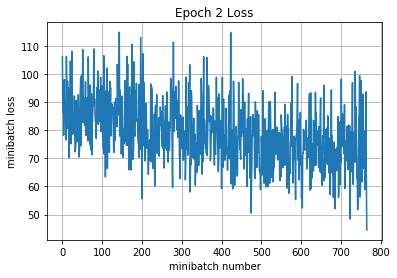

training time (seconds) 906.4174479999929
Validation
Epoch 1, Overall loss = 1.08 and accuracy of 0.62
validation time (seconds) 2.7215344999858644
predict
Epoch 1, Overall loss = 0.0688 and accuracy of 1
Training
Iteration 0: with minibatch training loss = 3.19 and accuracy of 0.078
Iteration 100: with minibatch training loss = 2.02 and accuracy of 0.38
Iteration 200: with minibatch training loss = 2.51 and accuracy of 0.19
Iteration 300: with minibatch training loss = 2.21 and accuracy of 0.3
Iteration 400: with minibatch training loss = 2.16 and accuracy of 0.31
Iteration 500: with minibatch training loss = 1.74 and accuracy of 0.39
Iteration 600: with minibatch training loss = 1.81 and accuracy of 0.36
Iteration 700: with minibatch training loss = 1.46 and accuracy of 0.53
Epoch 1, Overall loss = 2.04 and accuracy of 0.345


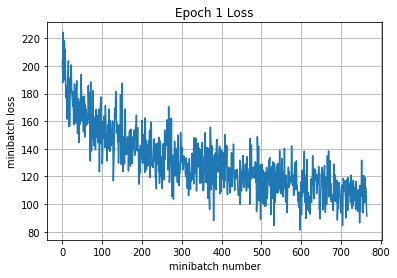

Iteration 800: with minibatch training loss = 1.62 and accuracy of 0.44
Iteration 900: with minibatch training loss = 2.13 and accuracy of 0.47
Iteration 1000: with minibatch training loss = 1.46 and accuracy of 0.53
Iteration 1100: with minibatch training loss = 1.54 and accuracy of 0.41
Iteration 1200: with minibatch training loss = 1.44 and accuracy of 0.58
Iteration 1300: with minibatch training loss = 1.46 and accuracy of 0.45
Iteration 1400: with minibatch training loss = 1.55 and accuracy of 0.47
Iteration 1500: with minibatch training loss = 1.49 and accuracy of 0.47
Epoch 2, Overall loss = 1.54 and accuracy of 0.468


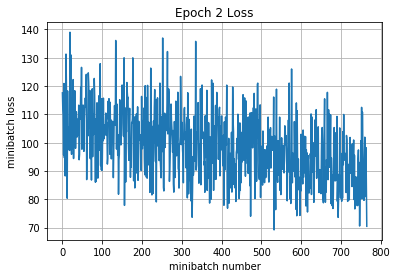

training time (seconds) 778.5040860000008
Validation
Epoch 1, Overall loss = 1.29 and accuracy of 0.544
validation time (seconds) 3.4485958000004757
predict
Epoch 1, Overall loss = 0.391 and accuracy of 1
Training
Iteration 0: with minibatch training loss = 3.28 and accuracy of 0.11
Iteration 100: with minibatch training loss = 2.58 and accuracy of 0.27
Iteration 200: with minibatch training loss = 2.26 and accuracy of 0.25
Iteration 300: with minibatch training loss = 2.6 and accuracy of 0.2
Iteration 400: with minibatch training loss = 2.07 and accuracy of 0.31
Iteration 500: with minibatch training loss = 2.22 and accuracy of 0.33
Iteration 600: with minibatch training loss = 2.29 and accuracy of 0.31
Iteration 700: with minibatch training loss = 1.64 and accuracy of 0.47
Epoch 1, Overall loss = 2.26 and accuracy of 0.297


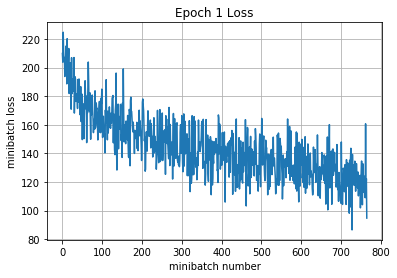

Iteration 800: with minibatch training loss = 2.09 and accuracy of 0.41
Iteration 900: with minibatch training loss = 1.91 and accuracy of 0.36
Iteration 1000: with minibatch training loss = 1.73 and accuracy of 0.38
Iteration 1100: with minibatch training loss = 1.73 and accuracy of 0.38
Iteration 1200: with minibatch training loss = 1.61 and accuracy of 0.44
Iteration 1300: with minibatch training loss = 1.69 and accuracy of 0.44
Iteration 1400: with minibatch training loss = 1.78 and accuracy of 0.34
Iteration 1500: with minibatch training loss = 1.67 and accuracy of 0.34
Epoch 2, Overall loss = 1.77 and accuracy of 0.405


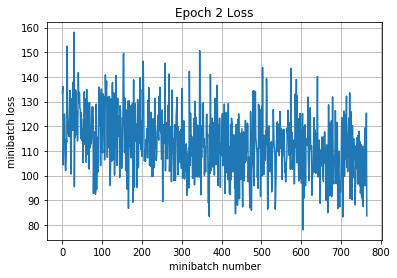

training time (seconds) 946.9310885000159
Validation
Epoch 1, Overall loss = 1.53 and accuracy of 0.468
validation time (seconds) 2.94251439999789
predict
Epoch 1, Overall loss = 0.407 and accuracy of 1


In [138]:
def different_lr(X, y, is_training, 
                                                                               dropout=None,
                                                                               **kwargs):
    out = X

    #32
    out, [W1, b1] = cnn(idx=1, X=out, filters=32, kernel_size=(5,5), is_training=is_training, padding='VALID')
    #28
    if dropout is not None:
        out = tf.layers.dropout(out, rate=dropout, training=is_training)
    out, _ = cnn(idx=2, X=out, filters=32, kernel_size=(5,5), is_training=is_training, padding='VALID')
    #24
    out = tf.nn.max_pool(out, ksize=(1,2,2,1), strides=(1,2,2,1), padding='SAME')
    #12
    if dropout is not None:    
        out = tf.layers.dropout(out, rate=dropout, training=is_training)
    out, _ = cnn(idx=3, X=out, filters=64, kernel_size=(5,5), is_training=is_training, padding='VALID')
    #8
    if dropout is not None:    
        out = tf.layers.dropout(out, rate=dropout, training=is_training)
    out, _ = cnn(idx=4, X=out, filters=128, kernel_size=(5,5), is_training=is_training, padding='VALID')
    #4
    if dropout is not None:    
        out = tf.layers.dropout(out, rate=dropout, training=is_training)

    # Affine layer from 4x4x128 = 2,048 to 1024 outputs
    out, _ = affine(1, out, output_size=1024)

    # ReLU Activation Layer
    out = tf.nn.relu(out)

    out = tf.layers.batch_normalization(out, training=is_training)
    if dropout is not None:    
        out = tf.layers.dropout(out, rate=dropout, training=is_training)
    # 5)
    # Affine layer from 1024 input units to 10 outputs
    out, _ = affine(2, out, output_size=10)
    return out, [W1]

local_models_different_lr = []

local_models_different_lr.append(estimate_model({
    'name': 'lr: 5e-4',
    'dropout': 0.2,
    'model_builder': different_lr,
    'learning_rate': 5e-4,
    'num_of_epochs': 2,
}, X_train, y_train, X_val, y_val))

local_models_different_lr.append(estimate_model({
    'name': 'lr: 1e-4',
    'dropout': 0.2,
    'model_builder': different_lr,
    'learning_rate': 1e-4,
    'num_of_epochs': 2,
}, X_train, y_train, X_val, y_val))

local_models_different_lr.append(estimate_model({
    'name': 'lr: 5e-5',
    'dropout': 0.2,
    'model_builder': different_lr,
    'learning_rate': 5e-5,
    'num_of_epochs': 2,
}, X_train, y_train, X_val, y_val))

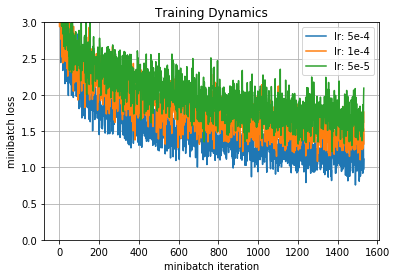

model: lr: 5e-4


,num_of_trainable,predict,training,validation
time,2395242,0.196992,906.417,2.72153
total_correct,2395242,NaN,0.564531,0.62
total_lost,2395242,NaN,1.23568,1.07744


model: lr: 1e-4


,num_of_trainable,predict,training,validation
time,2395242,0.185052,778.504,3.4486
total_correct,2395242,NaN,0.468306,0.544
total_lost,2395242,NaN,1.54474,1.28632


model: lr: 5e-5


,num_of_trainable,predict,training,validation
time,2395242,0.222172,946.931,2.94251
total_correct,2395242,NaN,0.404918,0.468
total_lost,2395242,NaN,1.77261,1.53471


Model lr: 5e-4


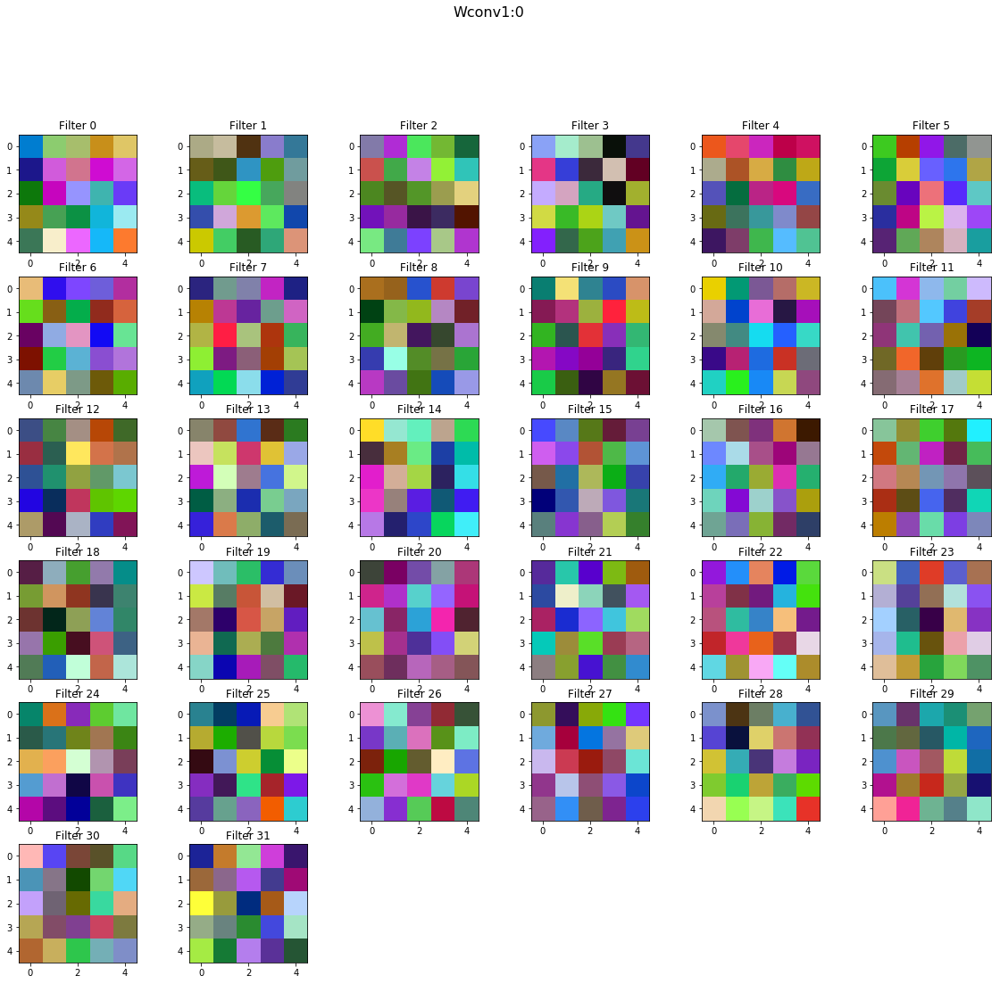

Model lr: 1e-4


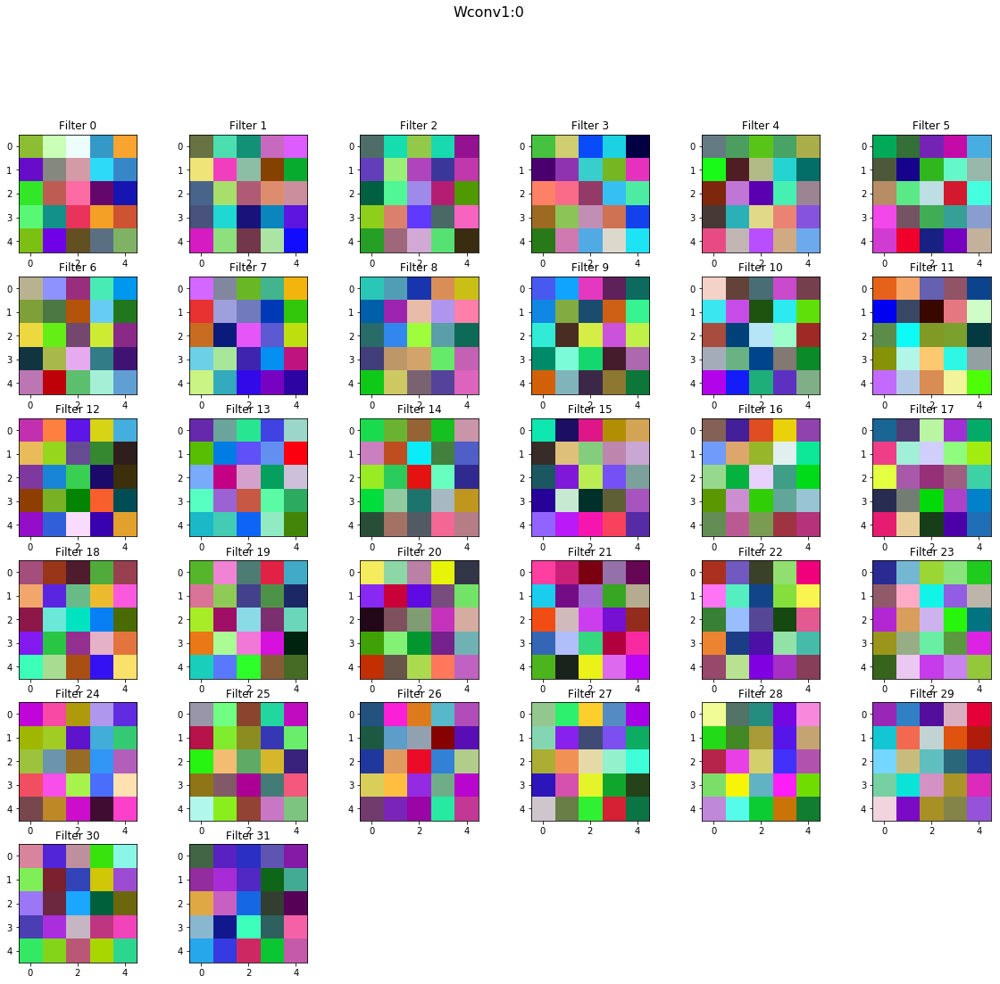

Model lr: 5e-5


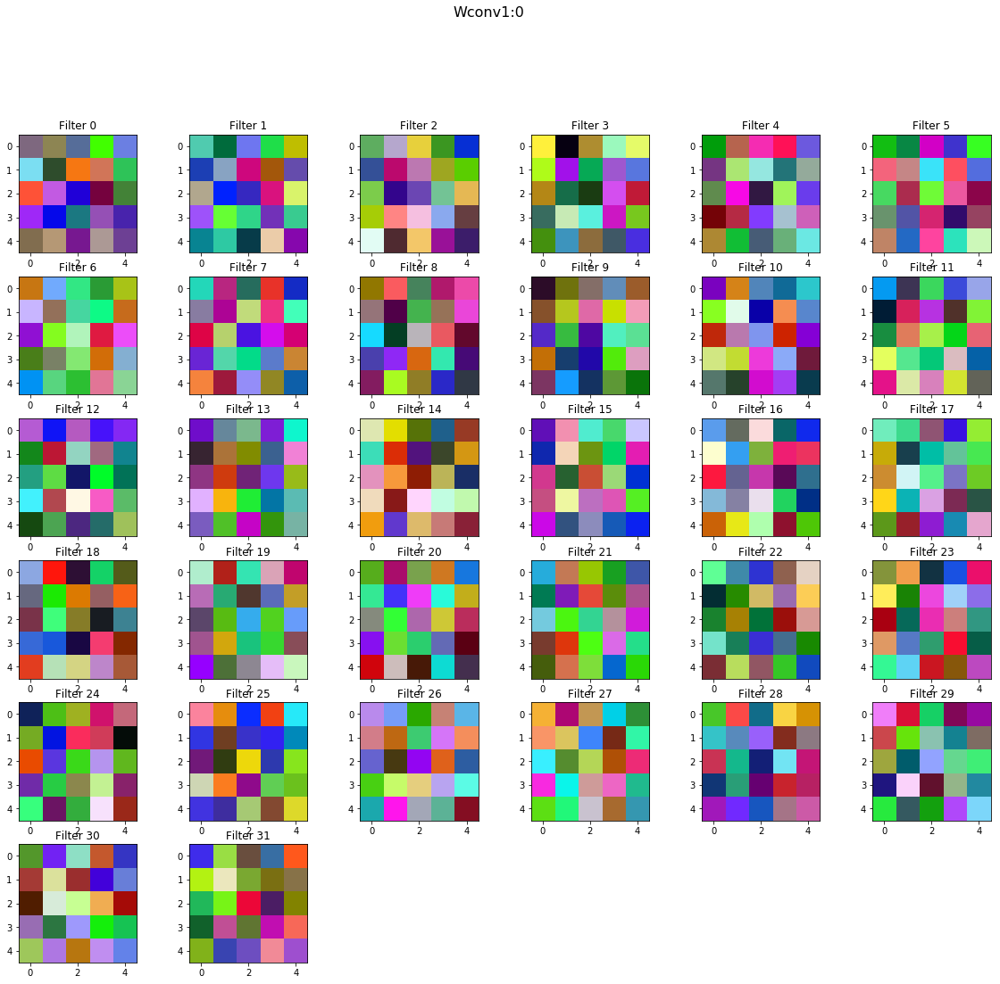

In [139]:
show_graphs(local_models_different_lr, ymax=3)
show_tables(local_models_different_lr)
draw_layers_of_models(local_models_different_lr)

Training
INFO:tensorflow:Restoring parameters from ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
haven't restore snapshot ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 0: with minibatch training loss = 3.77 and accuracy of 0.062
Iteration 100: with minibatch training loss = 2.15 and accuracy of 0.25
Iteration 200: with minibatch training loss = 2 and accuracy of 0.33
Iteration 300: with minibatch training loss = 1.72 and accuracy of 0.33
Iteration 400: with minibatch training loss = 1.81 and accuracy of 0.34
Iteration 500: with minibatch training loss = 1.87 and accuracy of 0.36
Iteration 600: with minibatch training loss = 1.48 and accuracy of 0.59
Iteration 700: with minibatch training loss = 1.25 and accuracy of 0.55
Epoch 1, Overall loss = 1.73 and accuracy of 0.417


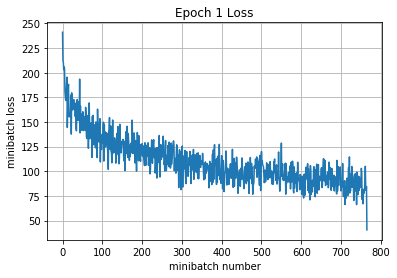

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
training time (seconds) 478.8215756520003
Validation
Epoch 1, Overall loss = 1.54 and accuracy of 0.49
validation time (seconds) 2.2917682609986514
predict
Epoch 1, Overall loss = 0.00445 and accuracy of 1
Training
INFO:tensorflow:Restoring parameters from ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-1e-4/model
haven't restore snapshot ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-1e-4/model
Iteration 0: with minibatch training loss = 3.07 and accuracy of 0.16
Iteration 100: with minibatch training loss = 2.46 and accuracy of 0.19
Iteration 200: with minibatch training loss = 2.11 and accuracy of 0.36
Iteration 300: with minibatch training loss = 1.8 and accuracy of 0.36
Iteration 400: with minibatch training loss = 1.7 and accuracy of 0.38
Iteration 500: with minibatch training loss = 1.87 and accuracy of 0.27
Iteration 600:

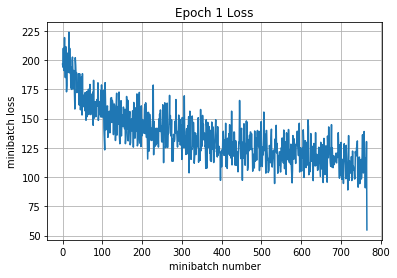

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-1e-4/model
training time (seconds) 409.3375904730001
Validation
Epoch 1, Overall loss = 2.02 and accuracy of 0.314
validation time (seconds) 2.9149044060013694
predict
Epoch 1, Overall loss = 0.0948 and accuracy of 1
Training
INFO:tensorflow:Restoring parameters from ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-5/model
haven't restore snapshot ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-5/model
Iteration 0: with minibatch training loss = 3.38 and accuracy of 0.078
Iteration 100: with minibatch training loss = 2.5 and accuracy of 0.22
Iteration 200: with minibatch training loss = 2.35 and accuracy of 0.27
Iteration 300: with minibatch training loss = 2.41 and accuracy of 0.23
Iteration 400: with minibatch training loss = 2.19 and accuracy of 0.34
Iteration 500: with minibatch training loss = 2.15 and accuracy of 0.27
Iteration 60

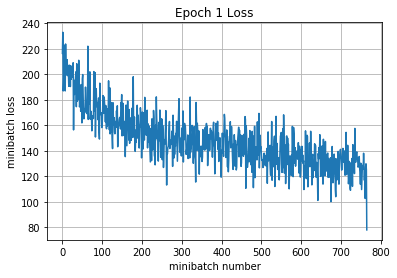

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-5/model
training time (seconds) 387.83731899600207
Validation
Epoch 1, Overall loss = 1.96 and accuracy of 0.329
validation time (seconds) 1.942634414001077
predict
Epoch 1, Overall loss = 0.234 and accuracy of 1


In [23]:
def different_lr_for_deeper_net(X, y, is_training, dropout=None, **kwargs):
    out = X

    # 32
    out, [W1, b1] = cnn(idx=1, X=out, filters=32, kernel_size=(3,3), is_training=is_training, padding='VALID',
                        dropout=dropout)
    # 30
    out, _ = cnn(idx=2, X=out, filters=32, kernel_size=(3,3), is_training=is_training, padding='VALID',
                        dropout=dropout)
    # 28
    out = tf.nn.max_pool(out, ksize=(1,2,2,1), strides=(1,2,2,1), padding='SAME')

    # 14
    out, _ = cnn(idx=3, X=out, filters=64, kernel_size=(5,5), is_training=is_training, padding='VALID',
                        dropout=dropout)
    # 10
    out, _ = cnn(idx=4, X=out, filters=64, kernel_size=(5,5), is_training=is_training, padding='VALID',
                        dropout=dropout)
    # 6
    out, _ = cnn(idx=5, X=out, filters=128, kernel_size=(5,5), is_training=is_training, padding='VALID',
                        dropout=dropout)

    # Affine layer from 6x6x128 = 4,608 to 1024 outputs
    out, _ = affine(1, out, output_size=1024)

    # ReLU Activation Layer
    out = tf.nn.relu(out)

    out = tf.layers.batch_normalization(out, training=is_training)
    if dropout is not None:    
        out = tf.layers.dropout(out, rate=dropout, training=is_training)
    # 5)
    # Affine layer from 1024 input units to 10 outputs
    out, _ = affine(2, out, output_size=10)
    return out, [W1]

local_models_different_lr_for_deeper_net = []

local_models_different_lr_for_deeper_net.append(estimate_model({
    'group': 'cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5',
    'name': 'lr: 5e-4',
    'dropout': 0.2,
    'model_builder': different_lr_for_deeper_net,
    'learning_rate': 5e-4,
    'num_of_epochs': 1,
}, X_train, y_train, X_val, y_val))

local_models_different_lr_for_deeper_net.append(estimate_model({
    'group': 'cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5',    
    'name': 'lr: 1e-4',
    'dropout': 0.2,
    'model_builder': different_lr_for_deeper_net,
    'learning_rate': 1e-4,
    'num_of_epochs': 1,
}, X_train, y_train, X_val, y_val))

local_models_different_lr_for_deeper_net.append(estimate_model({
    'group': 'cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5',    
    'name': 'lr: 5e-5',
    'dropout': 0.2,
    'model_builder': different_lr_for_deeper_net,
    'learning_rate': 5e-5,
    'num_of_epochs': 1,
}, X_train, y_train, X_val, y_val))

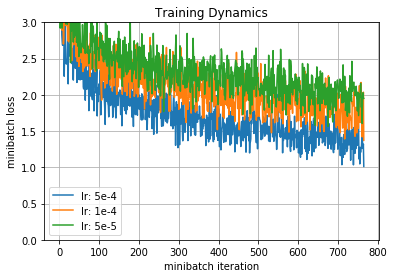

model: lr: 5e-4


,num_of_trainable,predict,training,validation
time,907050,0.319217,478.822,2.29177
total_correct,907050,NaN,0.416612,0.49
total_lost,907050,NaN,1.72669,1.53938


model: lr: 1e-4


,num_of_trainable,predict,training,validation
time,907050,0.410011,409.338,2.9149
total_correct,907050,NaN,0.304796,0.314
total_lost,907050,NaN,2.10882,2.01978


model: lr: 5e-5


,num_of_trainable,predict,training,validation
time,907050,0.269998,387.837,1.94263
total_correct,907050,NaN,0.258531,0.329
total_lost,907050,NaN,2.32621,1.95919


Model lr: 5e-4


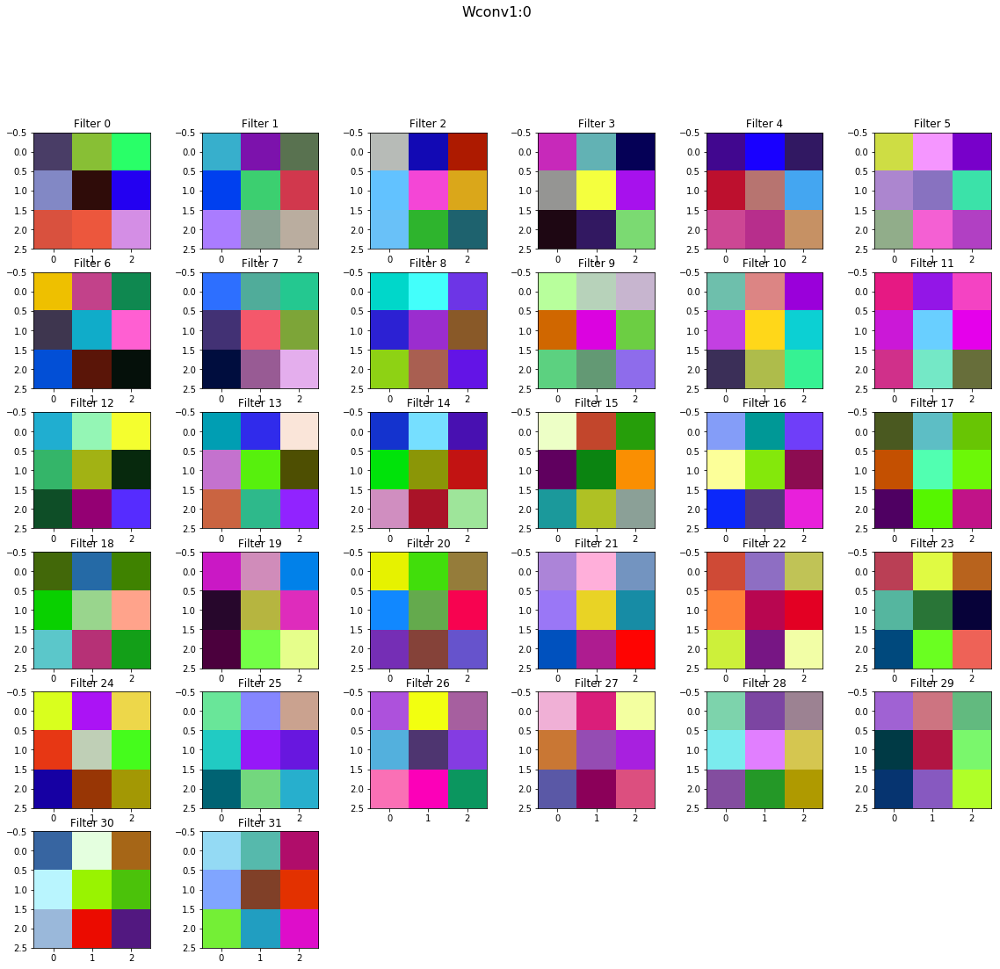

Model lr: 1e-4


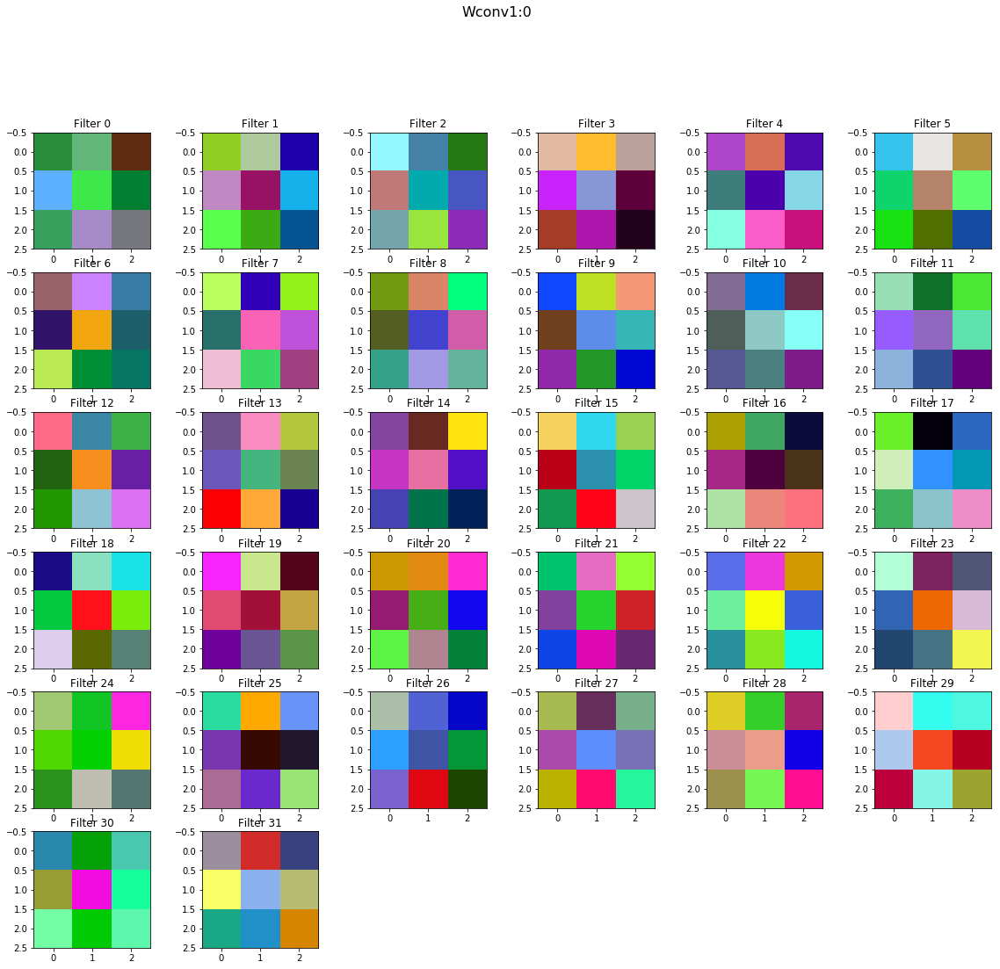

Model lr: 5e-5


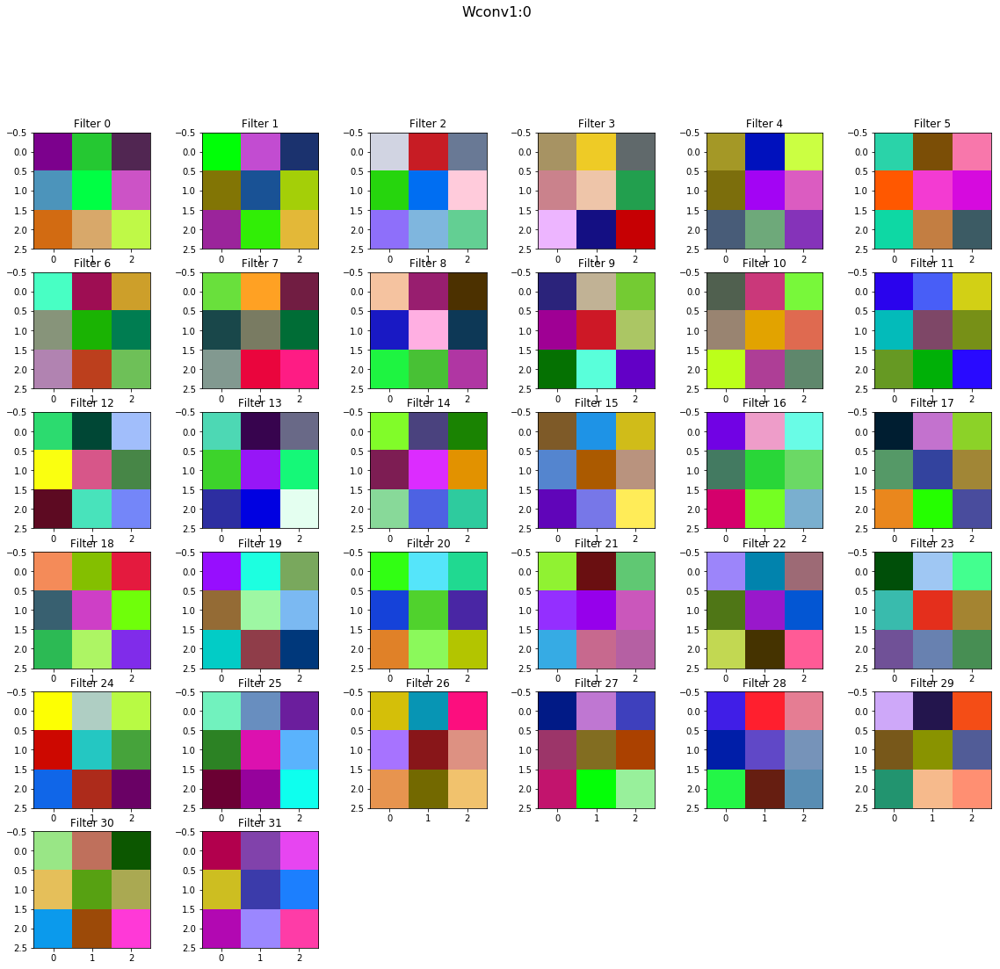

In [25]:
show_graphs(local_models_different_lr_for_deeper_net, ymax=3)
show_tables(local_models_different_lr_for_deeper_net)
draw_layers_of_models(local_models_different_lr_for_deeper_net)

Training
INFO:tensorflow:Restoring parameters from ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
restored snapshot ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 0: with minibatch training loss = 1.29 and accuracy of 0.56
Iteration 100: with minibatch training loss = 1.32 and accuracy of 0.5
Iteration 200: with minibatch training loss = 1.21 and accuracy of 0.53
Iteration 300: with minibatch training loss = 1.14 and accuracy of 0.61
Iteration 400: with minibatch training loss = 0.94 and accuracy of 0.64
Iteration 500: with minibatch training loss = 1.29 and accuracy of 0.53
Iteration 600: with minibatch training loss = 1.16 and accuracy of 0.59
Iteration 700: with minibatch training loss = 0.957 and accuracy of 0.64
Epoch 1, Overall loss = 1.22 and accuracy of 0.57


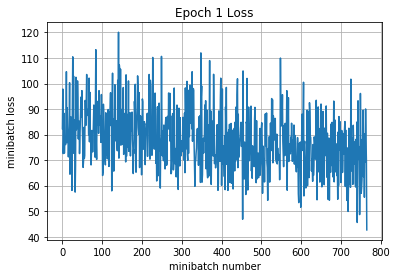

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 800: with minibatch training loss = 1.34 and accuracy of 0.53
Iteration 900: with minibatch training loss = 1.09 and accuracy of 0.64
Iteration 1000: with minibatch training loss = 1.02 and accuracy of 0.61
Iteration 1100: with minibatch training loss = 1.03 and accuracy of 0.61
Iteration 1200: with minibatch training loss = 1.04 and accuracy of 0.66
Iteration 1300: with minibatch training loss = 0.964 and accuracy of 0.67
Iteration 1400: with minibatch training loss = 1.05 and accuracy of 0.61
Iteration 1500: with minibatch training loss = 0.847 and accuracy of 0.64
Epoch 2, Overall loss = 1.01 and accuracy of 0.644


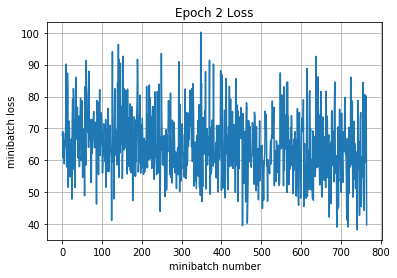

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 1600: with minibatch training loss = 0.948 and accuracy of 0.62
Iteration 1700: with minibatch training loss = 0.731 and accuracy of 0.75
Iteration 1800: with minibatch training loss = 0.915 and accuracy of 0.64
Iteration 1900: with minibatch training loss = 0.869 and accuracy of 0.66
Iteration 2000: with minibatch training loss = 1.08 and accuracy of 0.61
Iteration 2100: with minibatch training loss = 0.885 and accuracy of 0.69
Iteration 2200: with minibatch training loss = 0.763 and accuracy of 0.72
Epoch 3, Overall loss = 0.878 and accuracy of 0.691


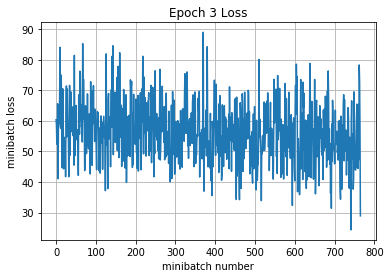

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 2300: with minibatch training loss = 0.762 and accuracy of 0.72
Iteration 2400: with minibatch training loss = 0.584 and accuracy of 0.81
Iteration 2500: with minibatch training loss = 0.721 and accuracy of 0.77
Iteration 2600: with minibatch training loss = 0.842 and accuracy of 0.73
Iteration 2700: with minibatch training loss = 0.946 and accuracy of 0.66
Iteration 2800: with minibatch training loss = 0.873 and accuracy of 0.66
Iteration 2900: with minibatch training loss = 0.865 and accuracy of 0.66
Iteration 3000: with minibatch training loss = 0.888 and accuracy of 0.69
Epoch 4, Overall loss = 0.787 and accuracy of 0.725


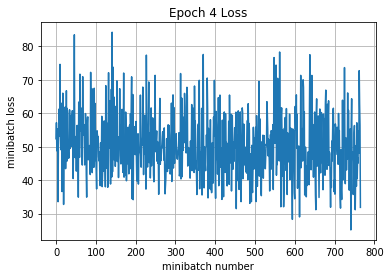

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 3100: with minibatch training loss = 0.77 and accuracy of 0.77
Iteration 3200: with minibatch training loss = 0.617 and accuracy of 0.81
Iteration 3300: with minibatch training loss = 0.764 and accuracy of 0.69
Iteration 3400: with minibatch training loss = 0.632 and accuracy of 0.77
Iteration 3500: with minibatch training loss = 0.827 and accuracy of 0.69
Iteration 3600: with minibatch training loss = 0.661 and accuracy of 0.77
Iteration 3700: with minibatch training loss = 0.629 and accuracy of 0.73
Iteration 3800: with minibatch training loss = 0.546 and accuracy of 0.78
Epoch 5, Overall loss = 0.713 and accuracy of 0.749


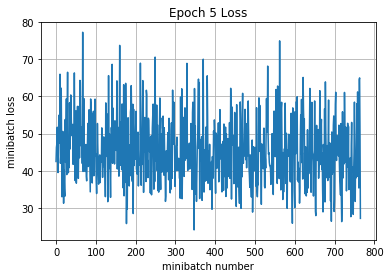

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 3900: with minibatch training loss = 0.769 and accuracy of 0.75
Iteration 4000: with minibatch training loss = 0.842 and accuracy of 0.75
Iteration 4100: with minibatch training loss = 0.657 and accuracy of 0.7
Iteration 4200: with minibatch training loss = 0.841 and accuracy of 0.69
Iteration 4300: with minibatch training loss = 0.556 and accuracy of 0.81
Iteration 4400: with minibatch training loss = 0.464 and accuracy of 0.84
Iteration 4500: with minibatch training loss = 0.677 and accuracy of 0.75
Epoch 6, Overall loss = 0.659 and accuracy of 0.769


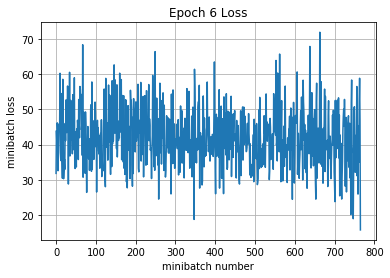

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 4600: with minibatch training loss = 0.644 and accuracy of 0.73
Iteration 4700: with minibatch training loss = 0.561 and accuracy of 0.83
Iteration 4800: with minibatch training loss = 0.634 and accuracy of 0.75
Iteration 4900: with minibatch training loss = 0.424 and accuracy of 0.83
Iteration 5000: with minibatch training loss = 0.516 and accuracy of 0.77
Iteration 5100: with minibatch training loss = 0.676 and accuracy of 0.75
Iteration 5200: with minibatch training loss = 0.857 and accuracy of 0.73
Iteration 5300: with minibatch training loss = 0.494 and accuracy of 0.84
Epoch 7, Overall loss = 0.61 and accuracy of 0.784


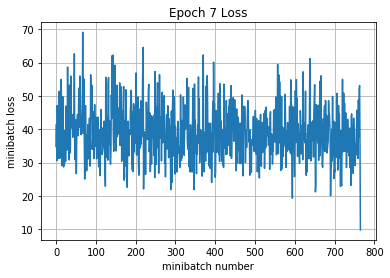

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 5400: with minibatch training loss = 0.721 and accuracy of 0.77
Iteration 5500: with minibatch training loss = 0.678 and accuracy of 0.73
Iteration 5600: with minibatch training loss = 0.636 and accuracy of 0.8
Iteration 5700: with minibatch training loss = 0.567 and accuracy of 0.73
Iteration 5800: with minibatch training loss = 0.366 and accuracy of 0.88
Iteration 5900: with minibatch training loss = 0.57 and accuracy of 0.83
Iteration 6000: with minibatch training loss = 0.898 and accuracy of 0.72
Iteration 6100: with minibatch training loss = 0.618 and accuracy of 0.78
Epoch 8, Overall loss = 0.569 and accuracy of 0.797


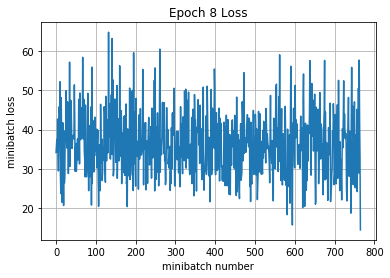

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 6200: with minibatch training loss = 0.3 and accuracy of 0.91
Iteration 6300: with minibatch training loss = 0.689 and accuracy of 0.73
Iteration 6400: with minibatch training loss = 0.776 and accuracy of 0.7
Iteration 6500: with minibatch training loss = 0.331 and accuracy of 0.86
Iteration 6600: with minibatch training loss = 0.686 and accuracy of 0.72
Iteration 6700: with minibatch training loss = 0.587 and accuracy of 0.78
Iteration 6800: with minibatch training loss = 0.578 and accuracy of 0.83
Epoch 9, Overall loss = 0.536 and accuracy of 0.812


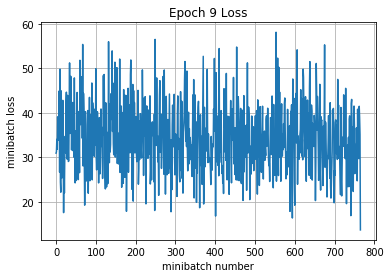

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 6900: with minibatch training loss = 0.404 and accuracy of 0.88
Iteration 7000: with minibatch training loss = 0.377 and accuracy of 0.84
Iteration 7100: with minibatch training loss = 0.663 and accuracy of 0.75
Iteration 7200: with minibatch training loss = 0.415 and accuracy of 0.86
Iteration 7300: with minibatch training loss = 0.487 and accuracy of 0.8
Iteration 7400: with minibatch training loss = 0.261 and accuracy of 0.94
Iteration 7500: with minibatch training loss = 0.477 and accuracy of 0.84
Iteration 7600: with minibatch training loss = 0.585 and accuracy of 0.83
Epoch 10, Overall loss = 0.501 and accuracy of 0.822


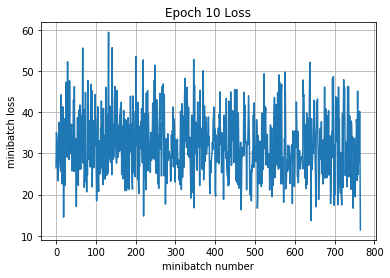

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 7700: with minibatch training loss = 0.442 and accuracy of 0.84
Iteration 7800: with minibatch training loss = 0.434 and accuracy of 0.84
Iteration 7900: with minibatch training loss = 0.385 and accuracy of 0.86
Iteration 8000: with minibatch training loss = 0.361 and accuracy of 0.83
Iteration 8100: with minibatch training loss = 0.503 and accuracy of 0.81
Iteration 8200: with minibatch training loss = 0.491 and accuracy of 0.83
Iteration 8300: with minibatch training loss = 0.294 and accuracy of 0.88
Iteration 8400: with minibatch training loss = 0.446 and accuracy of 0.84
Epoch 11, Overall loss = 0.472 and accuracy of 0.832


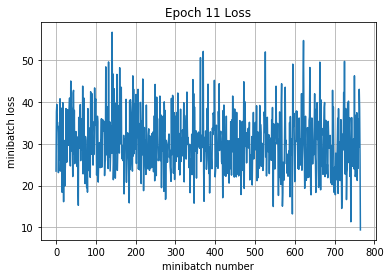

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 8500: with minibatch training loss = 0.456 and accuracy of 0.84
Iteration 8600: with minibatch training loss = 0.483 and accuracy of 0.81
Iteration 8700: with minibatch training loss = 0.327 and accuracy of 0.92
Iteration 8800: with minibatch training loss = 0.362 and accuracy of 0.84
Iteration 8900: with minibatch training loss = 0.621 and accuracy of 0.73
Iteration 9000: with minibatch training loss = 0.423 and accuracy of 0.83
Iteration 9100: with minibatch training loss = 0.373 and accuracy of 0.84
Epoch 12, Overall loss = 0.443 and accuracy of 0.842


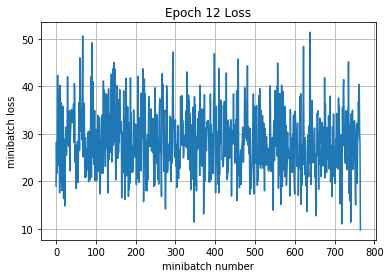

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 9200: with minibatch training loss = 0.427 and accuracy of 0.88
Iteration 9300: with minibatch training loss = 0.353 and accuracy of 0.84
Iteration 9400: with minibatch training loss = 0.298 and accuracy of 0.86
Iteration 9500: with minibatch training loss = 0.443 and accuracy of 0.88
Iteration 9600: with minibatch training loss = 0.469 and accuracy of 0.81
Iteration 9700: with minibatch training loss = 0.268 and accuracy of 0.89
Iteration 9800: with minibatch training loss = 0.407 and accuracy of 0.86
Iteration 9900: with minibatch training loss = 0.466 and accuracy of 0.81
Epoch 13, Overall loss = 0.418 and accuracy of 0.85


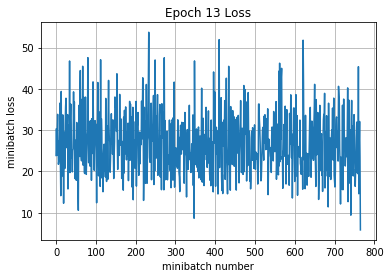

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 10000: with minibatch training loss = 0.407 and accuracy of 0.89
Iteration 10100: with minibatch training loss = 0.305 and accuracy of 0.88
Iteration 10200: with minibatch training loss = 0.361 and accuracy of 0.86
Iteration 10300: with minibatch training loss = 0.261 and accuracy of 0.92
Iteration 10400: with minibatch training loss = 0.272 and accuracy of 0.91
Iteration 10500: with minibatch training loss = 0.505 and accuracy of 0.84
Iteration 10600: with minibatch training loss = 0.506 and accuracy of 0.8
Iteration 10700: with minibatch training loss = 0.47 and accuracy of 0.83
Epoch 14, Overall loss = 0.4 and accuracy of 0.857


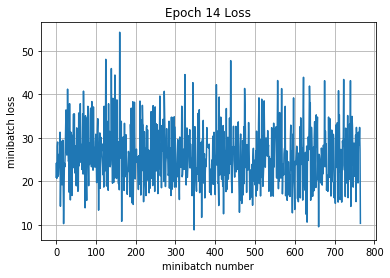

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 10800: with minibatch training loss = 0.308 and accuracy of 0.88
Iteration 10900: with minibatch training loss = 0.54 and accuracy of 0.83
Iteration 11000: with minibatch training loss = 0.222 and accuracy of 0.92
Iteration 11100: with minibatch training loss = 0.538 and accuracy of 0.84
Iteration 11200: with minibatch training loss = 0.361 and accuracy of 0.88
Iteration 11300: with minibatch training loss = 0.555 and accuracy of 0.81
Iteration 11400: with minibatch training loss = 0.329 and accuracy of 0.8
Epoch 15, Overall loss = 0.38 and accuracy of 0.863


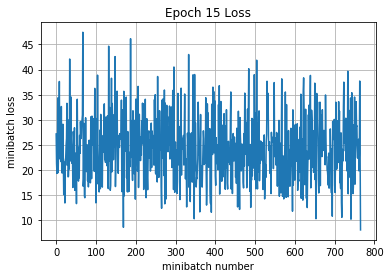

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 11500: with minibatch training loss = 0.611 and accuracy of 0.78
Iteration 11600: with minibatch training loss = 0.384 and accuracy of 0.86
Iteration 11700: with minibatch training loss = 0.226 and accuracy of 0.92
Iteration 11800: with minibatch training loss = 0.286 and accuracy of 0.91
Iteration 11900: with minibatch training loss = 0.634 and accuracy of 0.78
Iteration 12000: with minibatch training loss = 0.29 and accuracy of 0.92
Iteration 12100: with minibatch training loss = 0.299 and accuracy of 0.86
Iteration 12200: with minibatch training loss = 0.448 and accuracy of 0.83
Epoch 16, Overall loss = 0.357 and accuracy of 0.871


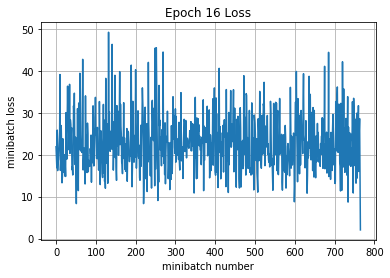

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 12300: with minibatch training loss = 0.377 and accuracy of 0.89
Iteration 12400: with minibatch training loss = 0.204 and accuracy of 0.94
Iteration 12500: with minibatch training loss = 0.354 and accuracy of 0.86
Iteration 12600: with minibatch training loss = 0.376 and accuracy of 0.89
Iteration 12700: with minibatch training loss = 0.292 and accuracy of 0.86
Iteration 12800: with minibatch training loss = 0.254 and accuracy of 0.89
Iteration 12900: with minibatch training loss = 0.328 and accuracy of 0.91
Iteration 13000: with minibatch training loss = 0.39 and accuracy of 0.89
Epoch 17, Overall loss = 0.345 and accuracy of 0.874


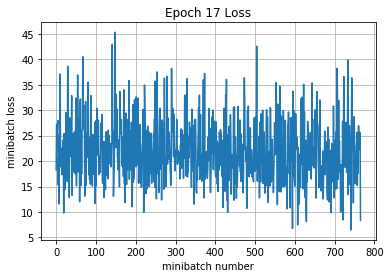

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 13100: with minibatch training loss = 0.31 and accuracy of 0.91
Iteration 13200: with minibatch training loss = 0.329 and accuracy of 0.86
Iteration 13300: with minibatch training loss = 0.366 and accuracy of 0.88
Iteration 13400: with minibatch training loss = 0.254 and accuracy of 0.89
Iteration 13500: with minibatch training loss = 0.189 and accuracy of 0.92
Iteration 13600: with minibatch training loss = 0.2 and accuracy of 0.94
Iteration 13700: with minibatch training loss = 0.27 and accuracy of 0.91
Epoch 18, Overall loss = 0.33 and accuracy of 0.881


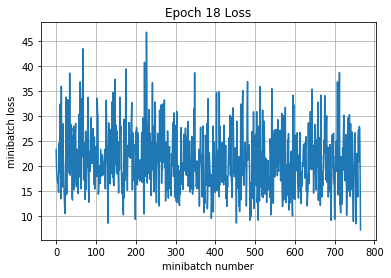

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 13800: with minibatch training loss = 0.163 and accuracy of 0.94
Iteration 13900: with minibatch training loss = 0.281 and accuracy of 0.91
Iteration 14000: with minibatch training loss = 0.245 and accuracy of 0.91
Iteration 14100: with minibatch training loss = 0.47 and accuracy of 0.84
Iteration 14200: with minibatch training loss = 0.337 and accuracy of 0.84
Iteration 14300: with minibatch training loss = 0.333 and accuracy of 0.89
Iteration 14400: with minibatch training loss = 0.213 and accuracy of 0.94
Iteration 14500: with minibatch training loss = 0.402 and accuracy of 0.89
Epoch 19, Overall loss = 0.307 and accuracy of 0.889


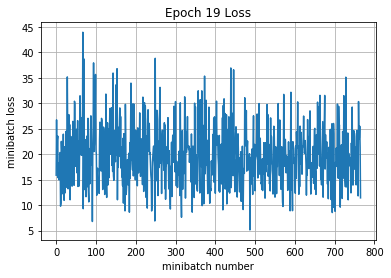

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 14600: with minibatch training loss = 0.412 and accuracy of 0.89
Iteration 14700: with minibatch training loss = 0.358 and accuracy of 0.92
Iteration 14800: with minibatch training loss = 0.245 and accuracy of 0.91
Iteration 14900: with minibatch training loss = 0.453 and accuracy of 0.84
Iteration 15000: with minibatch training loss = 0.289 and accuracy of 0.91
Iteration 15100: with minibatch training loss = 0.325 and accuracy of 0.88
Iteration 15200: with minibatch training loss = 0.265 and accuracy of 0.89
Iteration 15300: with minibatch training loss = 0.33 and accuracy of 0.88
Epoch 20, Overall loss = 0.304 and accuracy of 0.89


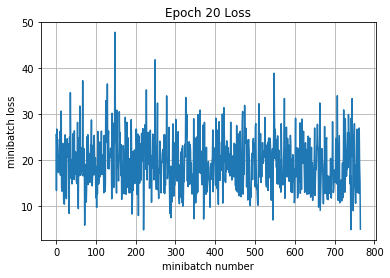

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 15400: with minibatch training loss = 0.29 and accuracy of 0.89
Iteration 15500: with minibatch training loss = 0.178 and accuracy of 0.95
Iteration 15600: with minibatch training loss = 0.354 and accuracy of 0.89
Iteration 15700: with minibatch training loss = 0.291 and accuracy of 0.86
Iteration 15800: with minibatch training loss = 0.209 and accuracy of 0.92
Iteration 15900: with minibatch training loss = 0.262 and accuracy of 0.91
Iteration 16000: with minibatch training loss = 0.311 and accuracy of 0.88
Epoch 21, Overall loss = 0.292 and accuracy of 0.895


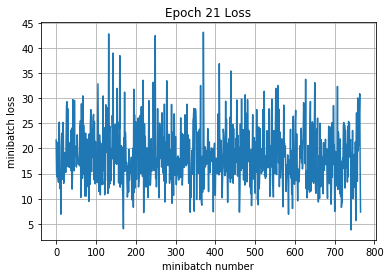

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 16100: with minibatch training loss = 0.194 and accuracy of 0.97
Iteration 16200: with minibatch training loss = 0.185 and accuracy of 0.94
Iteration 16300: with minibatch training loss = 0.158 and accuracy of 0.94
Iteration 16400: with minibatch training loss = 0.302 and accuracy of 0.83
Iteration 16500: with minibatch training loss = 0.394 and accuracy of 0.86
Iteration 16600: with minibatch training loss = 0.279 and accuracy of 0.94
Iteration 16700: with minibatch training loss = 0.214 and accuracy of 0.89
Iteration 16800: with minibatch training loss = 0.216 and accuracy of 0.89
Epoch 22, Overall loss = 0.281 and accuracy of 0.898


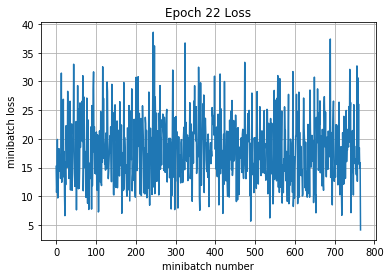

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 16900: with minibatch training loss = 0.363 and accuracy of 0.88
Iteration 17000: with minibatch training loss = 0.499 and accuracy of 0.89
Iteration 17100: with minibatch training loss = 0.204 and accuracy of 0.89
Iteration 17200: with minibatch training loss = 0.35 and accuracy of 0.89
Iteration 17300: with minibatch training loss = 0.265 and accuracy of 0.89
Iteration 17400: with minibatch training loss = 0.542 and accuracy of 0.8
Iteration 17500: with minibatch training loss = 0.241 and accuracy of 0.92
Iteration 17600: with minibatch training loss = 0.267 and accuracy of 0.92
Epoch 23, Overall loss = 0.269 and accuracy of 0.901


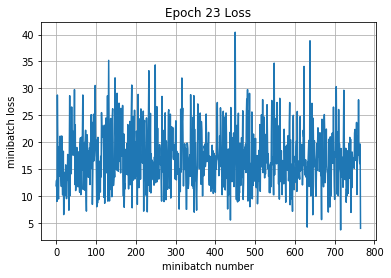

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 17700: with minibatch training loss = 0.193 and accuracy of 0.92
Iteration 17800: with minibatch training loss = 0.149 and accuracy of 0.94
Iteration 17900: with minibatch training loss = 0.171 and accuracy of 0.95
Iteration 18000: with minibatch training loss = 0.301 and accuracy of 0.89
Iteration 18100: with minibatch training loss = 0.275 and accuracy of 0.84
Iteration 18200: with minibatch training loss = 0.426 and accuracy of 0.86
Iteration 18300: with minibatch training loss = 0.139 and accuracy of 0.95
Epoch 24, Overall loss = 0.256 and accuracy of 0.907


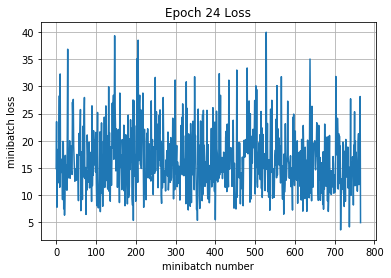

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 18400: with minibatch training loss = 0.199 and accuracy of 0.94
Iteration 18500: with minibatch training loss = 0.261 and accuracy of 0.86
Iteration 18600: with minibatch training loss = 0.229 and accuracy of 0.91
Iteration 18700: with minibatch training loss = 0.256 and accuracy of 0.92
Iteration 18800: with minibatch training loss = 0.23 and accuracy of 0.92
Iteration 18900: with minibatch training loss = 0.171 and accuracy of 0.97
Iteration 19000: with minibatch training loss = 0.302 and accuracy of 0.86
Iteration 19100: with minibatch training loss = 0.325 and accuracy of 0.89
Epoch 25, Overall loss = 0.257 and accuracy of 0.907


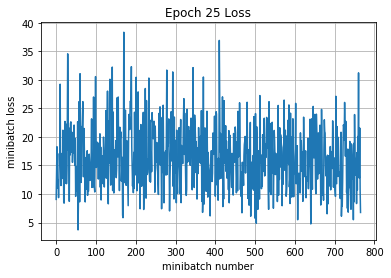

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 19200: with minibatch training loss = 0.162 and accuracy of 0.97
Iteration 19300: with minibatch training loss = 0.284 and accuracy of 0.88
Iteration 19400: with minibatch training loss = 0.322 and accuracy of 0.89
Iteration 19500: with minibatch training loss = 0.184 and accuracy of 0.94
Iteration 19600: with minibatch training loss = 0.364 and accuracy of 0.84
Iteration 19700: with minibatch training loss = 0.295 and accuracy of 0.88
Iteration 19800: with minibatch training loss = 0.36 and accuracy of 0.88
Iteration 19900: with minibatch training loss = 0.235 and accuracy of 0.94
Epoch 26, Overall loss = 0.238 and accuracy of 0.915


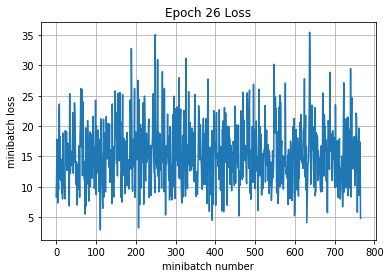

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 20000: with minibatch training loss = 0.14 and accuracy of 0.94
Iteration 20100: with minibatch training loss = 0.271 and accuracy of 0.91
Iteration 20200: with minibatch training loss = 0.26 and accuracy of 0.89
Iteration 20300: with minibatch training loss = 0.301 and accuracy of 0.92
Iteration 20400: with minibatch training loss = 0.24 and accuracy of 0.91
Iteration 20500: with minibatch training loss = 0.121 and accuracy of 0.97
Iteration 20600: with minibatch training loss = 0.284 and accuracy of 0.92
Epoch 27, Overall loss = 0.238 and accuracy of 0.914


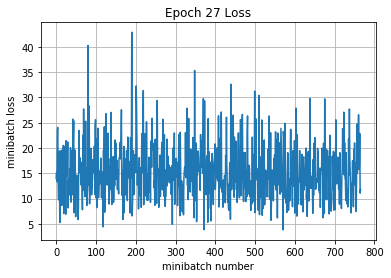

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 20700: with minibatch training loss = 0.227 and accuracy of 0.89
Iteration 20800: with minibatch training loss = 0.179 and accuracy of 0.94
Iteration 20900: with minibatch training loss = 0.205 and accuracy of 0.89
Iteration 21000: with minibatch training loss = 0.129 and accuracy of 0.98
Iteration 21100: with minibatch training loss = 0.284 and accuracy of 0.91
Iteration 21200: with minibatch training loss = 0.0909 and accuracy of 0.98
Iteration 21300: with minibatch training loss = 0.205 and accuracy of 0.95
Iteration 21400: with minibatch training loss = 0.162 and accuracy of 0.92
Epoch 28, Overall loss = 0.228 and accuracy of 0.918


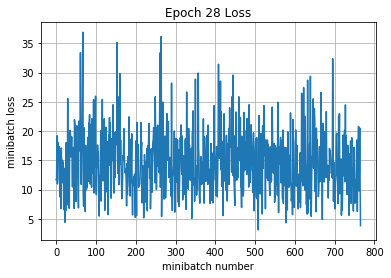

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 21500: with minibatch training loss = 0.277 and accuracy of 0.88
Iteration 21600: with minibatch training loss = 0.241 and accuracy of 0.88
Iteration 21700: with minibatch training loss = 0.221 and accuracy of 0.92
Iteration 21800: with minibatch training loss = 0.228 and accuracy of 0.95
Iteration 21900: with minibatch training loss = 0.295 and accuracy of 0.86
Iteration 22000: with minibatch training loss = 0.31 and accuracy of 0.84
Iteration 22100: with minibatch training loss = 0.168 and accuracy of 0.89
Iteration 22200: with minibatch training loss = 0.114 and accuracy of 0.98
Epoch 29, Overall loss = 0.22 and accuracy of 0.92


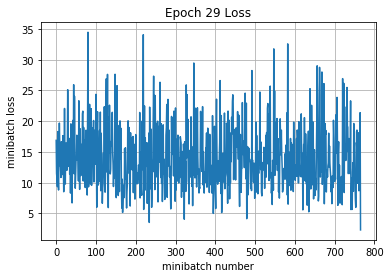

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 22300: with minibatch training loss = 0.235 and accuracy of 0.89
Iteration 22400: with minibatch training loss = 0.246 and accuracy of 0.91
Iteration 22500: with minibatch training loss = 0.116 and accuracy of 0.97
Iteration 22600: with minibatch training loss = 0.174 and accuracy of 0.94
Iteration 22700: with minibatch training loss = 0.25 and accuracy of 0.92
Iteration 22800: with minibatch training loss = 0.211 and accuracy of 0.91
Iteration 22900: with minibatch training loss = 0.241 and accuracy of 0.89
Epoch 30, Overall loss = 0.211 and accuracy of 0.924


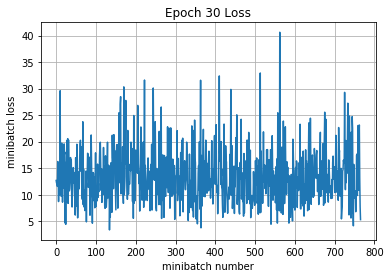

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 23000: with minibatch training loss = 0.164 and accuracy of 0.92
Iteration 23100: with minibatch training loss = 0.309 and accuracy of 0.89
Iteration 23200: with minibatch training loss = 0.197 and accuracy of 0.94
Iteration 23300: with minibatch training loss = 0.179 and accuracy of 0.91
Iteration 23400: with minibatch training loss = 0.315 and accuracy of 0.89
Iteration 23500: with minibatch training loss = 0.13 and accuracy of 0.97
Iteration 23600: with minibatch training loss = 0.0724 and accuracy of 0.97
Iteration 23700: with minibatch training loss = 0.3 and accuracy of 0.91
Epoch 31, Overall loss = 0.209 and accuracy of 0.924


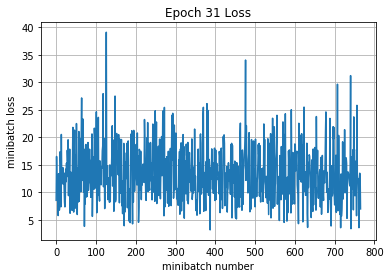

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 23800: with minibatch training loss = 0.305 and accuracy of 0.92
Iteration 23900: with minibatch training loss = 0.183 and accuracy of 0.95
Iteration 24000: with minibatch training loss = 0.326 and accuracy of 0.92
Iteration 24100: with minibatch training loss = 0.237 and accuracy of 0.92
Iteration 24200: with minibatch training loss = 0.352 and accuracy of 0.86
Iteration 24300: with minibatch training loss = 0.135 and accuracy of 0.97
Iteration 24400: with minibatch training loss = 0.167 and accuracy of 0.94
Iteration 24500: with minibatch training loss = 0.111 and accuracy of 0.97
Epoch 32, Overall loss = 0.2 and accuracy of 0.928


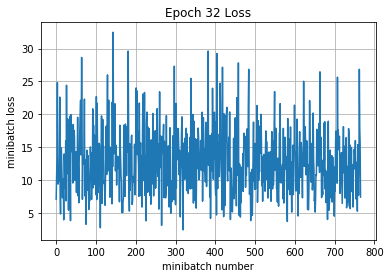

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 24600: with minibatch training loss = 0.311 and accuracy of 0.86
Iteration 24700: with minibatch training loss = 0.158 and accuracy of 0.94
Iteration 24800: with minibatch training loss = 0.134 and accuracy of 0.95
Iteration 24900: with minibatch training loss = 0.137 and accuracy of 0.94
Iteration 25000: with minibatch training loss = 0.253 and accuracy of 0.92
Iteration 25100: with minibatch training loss = 0.111 and accuracy of 0.97
Iteration 25200: with minibatch training loss = 0.175 and accuracy of 0.97
Epoch 33, Overall loss = 0.204 and accuracy of 0.926


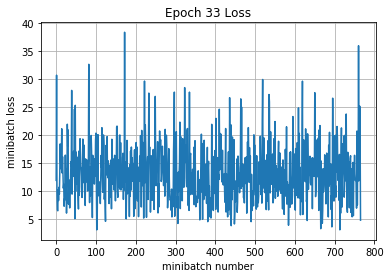

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 25300: with minibatch training loss = 0.183 and accuracy of 0.94
Iteration 25400: with minibatch training loss = 0.186 and accuracy of 0.91
Iteration 25500: with minibatch training loss = 0.312 and accuracy of 0.89
Iteration 25600: with minibatch training loss = 0.226 and accuracy of 0.94
Iteration 25700: with minibatch training loss = 0.135 and accuracy of 0.95
Iteration 25800: with minibatch training loss = 0.156 and accuracy of 0.94
Iteration 25900: with minibatch training loss = 0.338 and accuracy of 0.86
Iteration 26000: with minibatch training loss = 0.2 and accuracy of 0.94
Epoch 34, Overall loss = 0.193 and accuracy of 0.929


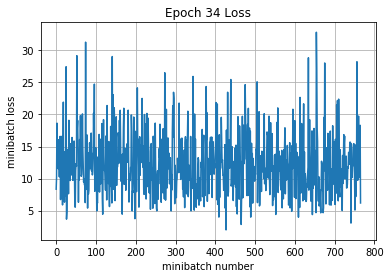

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 26100: with minibatch training loss = 0.198 and accuracy of 0.95
Iteration 26200: with minibatch training loss = 0.134 and accuracy of 0.94
Iteration 26300: with minibatch training loss = 0.108 and accuracy of 0.97
Iteration 26400: with minibatch training loss = 0.172 and accuracy of 0.92
Iteration 26500: with minibatch training loss = 0.047 and accuracy of 1
Iteration 26600: with minibatch training loss = 0.148 and accuracy of 0.91
Iteration 26700: with minibatch training loss = 0.147 and accuracy of 0.95
Iteration 26800: with minibatch training loss = 0.17 and accuracy of 0.97
Epoch 35, Overall loss = 0.193 and accuracy of 0.931


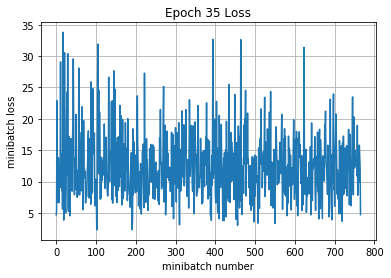

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 26900: with minibatch training loss = 0.267 and accuracy of 0.89
Iteration 27000: with minibatch training loss = 0.259 and accuracy of 0.91
Iteration 27100: with minibatch training loss = 0.0588 and accuracy of 0.98
Iteration 27200: with minibatch training loss = 0.0833 and accuracy of 0.98
Iteration 27300: with minibatch training loss = 0.178 and accuracy of 0.92
Iteration 27400: with minibatch training loss = 0.275 and accuracy of 0.89
Iteration 27500: with minibatch training loss = 0.0929 and accuracy of 0.95
Epoch 36, Overall loss = 0.185 and accuracy of 0.933


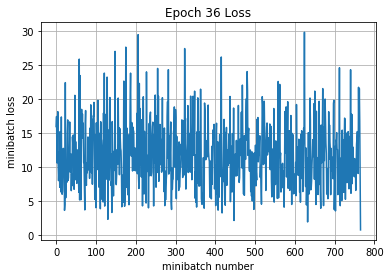

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 27600: with minibatch training loss = 0.0716 and accuracy of 0.97
Iteration 27700: with minibatch training loss = 0.0654 and accuracy of 0.97
Iteration 27800: with minibatch training loss = 0.253 and accuracy of 0.94
Iteration 27900: with minibatch training loss = 0.246 and accuracy of 0.94
Iteration 28000: with minibatch training loss = 0.132 and accuracy of 0.95
Iteration 28100: with minibatch training loss = 0.0785 and accuracy of 0.98
Iteration 28200: with minibatch training loss = 0.0901 and accuracy of 0.97
Iteration 28300: with minibatch training loss = 0.18 and accuracy of 0.94
Epoch 37, Overall loss = 0.183 and accuracy of 0.936


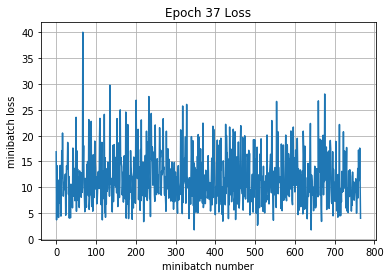

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 28400: with minibatch training loss = 0.0835 and accuracy of 0.97
Iteration 28500: with minibatch training loss = 0.163 and accuracy of 0.95
Iteration 28600: with minibatch training loss = 0.161 and accuracy of 0.94
Iteration 28700: with minibatch training loss = 0.18 and accuracy of 0.92
Iteration 28800: with minibatch training loss = 0.223 and accuracy of 0.89
Iteration 28900: with minibatch training loss = 0.251 and accuracy of 0.89
Iteration 29000: with minibatch training loss = 0.174 and accuracy of 0.91
Iteration 29100: with minibatch training loss = 0.184 and accuracy of 0.91
Epoch 38, Overall loss = 0.176 and accuracy of 0.936


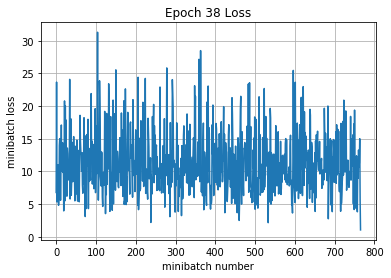

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 29200: with minibatch training loss = 0.14 and accuracy of 0.95
Iteration 29300: with minibatch training loss = 0.116 and accuracy of 0.97
Iteration 29400: with minibatch training loss = 0.114 and accuracy of 0.95
Iteration 29500: with minibatch training loss = 0.0767 and accuracy of 0.98
Iteration 29600: with minibatch training loss = 0.303 and accuracy of 0.89
Iteration 29700: with minibatch training loss = 0.164 and accuracy of 0.92
Iteration 29800: with minibatch training loss = 0.141 and accuracy of 0.94
Epoch 39, Overall loss = 0.173 and accuracy of 0.937


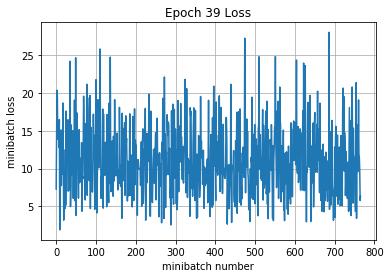

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 29900: with minibatch training loss = 0.165 and accuracy of 0.92
Iteration 30000: with minibatch training loss = 0.154 and accuracy of 0.92
Iteration 30100: with minibatch training loss = 0.14 and accuracy of 0.95
Iteration 30200: with minibatch training loss = 0.297 and accuracy of 0.92
Iteration 30300: with minibatch training loss = 0.32 and accuracy of 0.91
Iteration 30400: with minibatch training loss = 0.201 and accuracy of 0.95
Iteration 30500: with minibatch training loss = 0.272 and accuracy of 0.92
Iteration 30600: with minibatch training loss = 0.282 and accuracy of 0.92
Epoch 40, Overall loss = 0.17 and accuracy of 0.939


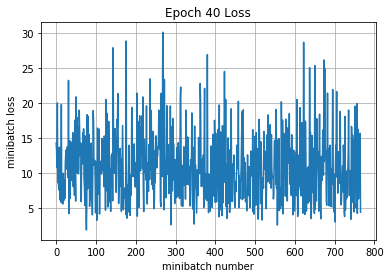

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
training time (seconds) 12718.844041099
Validation
Epoch 1, Overall loss = 1.01 and accuracy of 0.769
validation time (seconds) 2.1876400120017934
predict
Epoch 1, Overall loss = 0.000399 and accuracy of 1


In [27]:
def different_lr_for_deeper_net(X, y, is_training, dropout=None, **kwargs):
    out = X

    # 32
    out, [W1, b1] = cnn(idx=1, X=out, filters=32, kernel_size=(3,3), is_training=is_training, padding='VALID',
                        dropout=dropout)
    # 30
    out, _ = cnn(idx=2, X=out, filters=32, kernel_size=(3,3), is_training=is_training, padding='VALID',
                        dropout=dropout)
    # 28
    out = tf.nn.max_pool(out, ksize=(1,2,2,1), strides=(1,2,2,1), padding='SAME')

    # 14
    out, _ = cnn(idx=3, X=out, filters=64, kernel_size=(5,5), is_training=is_training, padding='VALID',
                        dropout=dropout)
    # 10
    out, _ = cnn(idx=4, X=out, filters=64, kernel_size=(5,5), is_training=is_training, padding='VALID',
                        dropout=dropout)
    # 6
    out, _ = cnn(idx=5, X=out, filters=128, kernel_size=(5,5), is_training=is_training, padding='VALID',
                        dropout=dropout)

    # Affine layer from 6x6x128 = 4,608 to 1024 outputs
    out, _ = affine(1, out, output_size=1024)

    # ReLU Activation Layer
    out = tf.nn.relu(out)

    out = tf.layers.batch_normalization(out, training=is_training)
    if dropout is not None:    
        out = tf.layers.dropout(out, rate=dropout, training=is_training)
    # 5)
    # Affine layer from 1024 input units to 10 outputs
    out, _ = affine(2, out, output_size=10)
    return out, [W1]

long_running_models = []

long_running_models.append(estimate_model({
    'group': 'cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5',
    'name': 'lr: 5e-4',
    'dropout': 0.2,
    'model_builder': different_lr_for_deeper_net,
    'learning_rate': 5e-4,
    'num_of_epochs': 40,
}, X_train, y_train, X_val, y_val))

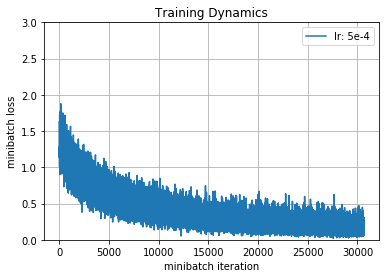

model: lr: 5e-4


,num_of_trainable,predict,training,validation
time,907050,0.238086,12718.8,2.18764
total_correct,907050,NaN,0.939224,0.769
total_lost,907050,NaN,0.169539,1.01335


Model lr: 5e-4


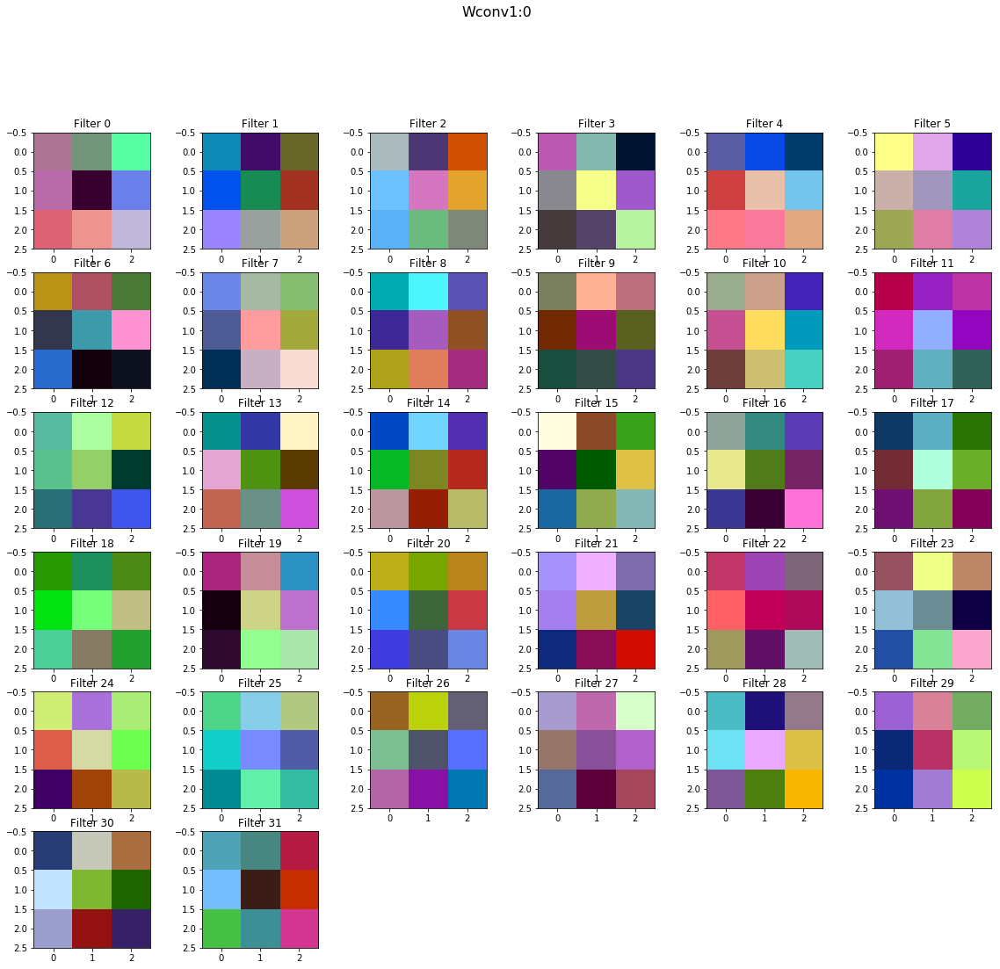

In [28]:
show_graphs(long_running_models, ymax=3)
show_tables(long_running_models)
draw_layers_of_models(long_running_models)

Training
INFO:tensorflow:Restoring parameters from ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
restored snapshot ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 0: with minibatch training loss = 0.303 and accuracy of 0.88
Iteration 100: with minibatch training loss = 0.324 and accuracy of 0.86
Iteration 200: with minibatch training loss = 0.402 and accuracy of 0.91
Iteration 300: with minibatch training loss = 0.121 and accuracy of 0.95
Iteration 400: with minibatch training loss = 0.144 and accuracy of 0.91
Iteration 500: with minibatch training loss = 0.235 and accuracy of 0.92
Iteration 600: with minibatch training loss = 0.095 and accuracy of 0.98
Iteration 700: with minibatch training loss = 0.226 and accuracy of 0.89
Epoch 1, Overall loss = 0.283 and accuracy of 0.902


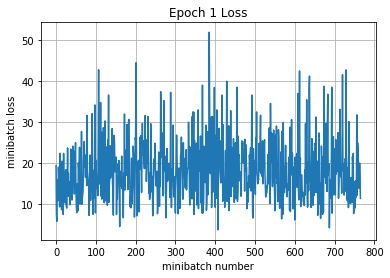

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 800: with minibatch training loss = 0.0552 and accuracy of 1
Iteration 900: with minibatch training loss = 0.276 and accuracy of 0.89
Iteration 1000: with minibatch training loss = 0.103 and accuracy of 0.95
Iteration 1100: with minibatch training loss = 0.333 and accuracy of 0.89
Iteration 1200: with minibatch training loss = 0.16 and accuracy of 0.95
Iteration 1300: with minibatch training loss = 0.174 and accuracy of 0.94
Iteration 1400: with minibatch training loss = 0.196 and accuracy of 0.92
Iteration 1500: with minibatch training loss = 0.299 and accuracy of 0.88
Epoch 2, Overall loss = 0.237 and accuracy of 0.916


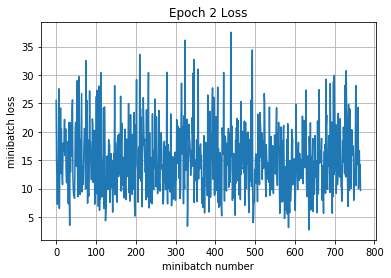

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 1600: with minibatch training loss = 0.227 and accuracy of 0.89
Iteration 1700: with minibatch training loss = 0.153 and accuracy of 0.92
Iteration 1800: with minibatch training loss = 0.26 and accuracy of 0.89
Iteration 1900: with minibatch training loss = 0.178 and accuracy of 0.95
Iteration 2000: with minibatch training loss = 0.206 and accuracy of 0.95
Iteration 2100: with minibatch training loss = 0.413 and accuracy of 0.86
Iteration 2200: with minibatch training loss = 0.2 and accuracy of 0.92
Epoch 3, Overall loss = 0.221 and accuracy of 0.92


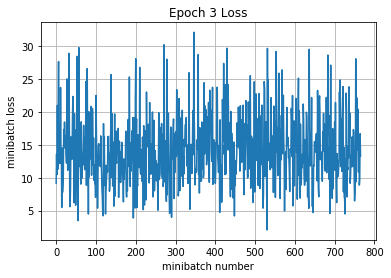

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 2300: with minibatch training loss = 0.135 and accuracy of 0.95
Iteration 2400: with minibatch training loss = 0.151 and accuracy of 0.94
Iteration 2500: with minibatch training loss = 0.22 and accuracy of 0.91
Iteration 2600: with minibatch training loss = 0.195 and accuracy of 0.94
Iteration 2700: with minibatch training loss = 0.313 and accuracy of 0.92
Iteration 2800: with minibatch training loss = 0.135 and accuracy of 0.94
Iteration 2900: with minibatch training loss = 0.256 and accuracy of 0.91
Iteration 3000: with minibatch training loss = 0.16 and accuracy of 0.94
Epoch 4, Overall loss = 0.21 and accuracy of 0.924


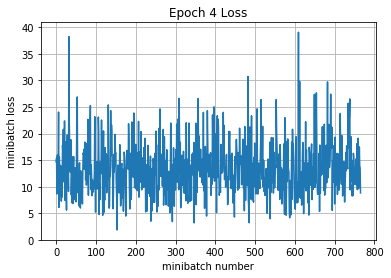

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 3100: with minibatch training loss = 0.079 and accuracy of 0.97
Iteration 3200: with minibatch training loss = 0.201 and accuracy of 0.95
Iteration 3300: with minibatch training loss = 0.159 and accuracy of 0.95
Iteration 3400: with minibatch training loss = 0.28 and accuracy of 0.86
Iteration 3500: with minibatch training loss = 0.257 and accuracy of 0.88
Iteration 3600: with minibatch training loss = 0.264 and accuracy of 0.91
Iteration 3700: with minibatch training loss = 0.263 and accuracy of 0.91
Iteration 3800: with minibatch training loss = 0.11 and accuracy of 0.98
Epoch 5, Overall loss = 0.199 and accuracy of 0.928


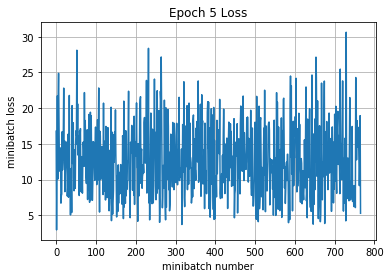

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 3900: with minibatch training loss = 0.106 and accuracy of 0.98
Iteration 4000: with minibatch training loss = 0.28 and accuracy of 0.94
Iteration 4100: with minibatch training loss = 0.0331 and accuracy of 1
Iteration 4200: with minibatch training loss = 0.258 and accuracy of 0.91
Iteration 4300: with minibatch training loss = 0.279 and accuracy of 0.88
Iteration 4400: with minibatch training loss = 0.107 and accuracy of 0.95
Iteration 4500: with minibatch training loss = 0.126 and accuracy of 0.94
Epoch 6, Overall loss = 0.194 and accuracy of 0.931


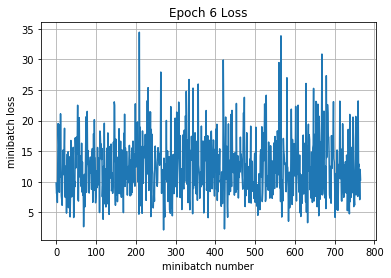

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 4600: with minibatch training loss = 0.222 and accuracy of 0.89
Iteration 4700: with minibatch training loss = 0.317 and accuracy of 0.89
Iteration 4800: with minibatch training loss = 0.188 and accuracy of 0.94
Iteration 4900: with minibatch training loss = 0.326 and accuracy of 0.88
Iteration 5000: with minibatch training loss = 0.351 and accuracy of 0.88
Iteration 5100: with minibatch training loss = 0.176 and accuracy of 0.92
Iteration 5200: with minibatch training loss = 0.226 and accuracy of 0.92
Iteration 5300: with minibatch training loss = 0.0973 and accuracy of 0.95
Epoch 7, Overall loss = 0.188 and accuracy of 0.933


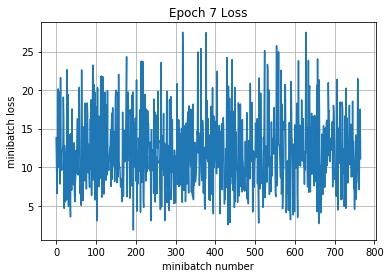

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 5400: with minibatch training loss = 0.382 and accuracy of 0.86
Iteration 5500: with minibatch training loss = 0.178 and accuracy of 0.94
Iteration 5600: with minibatch training loss = 0.105 and accuracy of 0.97
Iteration 5700: with minibatch training loss = 0.239 and accuracy of 0.92
Iteration 5800: with minibatch training loss = 0.086 and accuracy of 0.97
Iteration 5900: with minibatch training loss = 0.0613 and accuracy of 0.98
Iteration 6000: with minibatch training loss = 0.111 and accuracy of 0.97
Iteration 6100: with minibatch training loss = 0.163 and accuracy of 0.95
Epoch 8, Overall loss = 0.179 and accuracy of 0.936


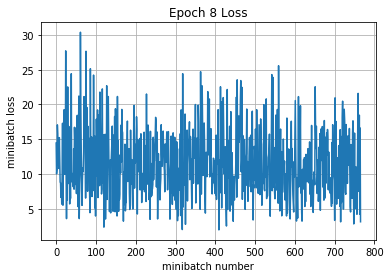

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 6200: with minibatch training loss = 0.262 and accuracy of 0.92
Iteration 6300: with minibatch training loss = 0.336 and accuracy of 0.89
Iteration 6400: with minibatch training loss = 0.238 and accuracy of 0.91
Iteration 6500: with minibatch training loss = 0.155 and accuracy of 0.92
Iteration 6600: with minibatch training loss = 0.0821 and accuracy of 0.98
Iteration 6700: with minibatch training loss = 0.172 and accuracy of 0.89
Iteration 6800: with minibatch training loss = 0.19 and accuracy of 0.95
Epoch 9, Overall loss = 0.178 and accuracy of 0.937


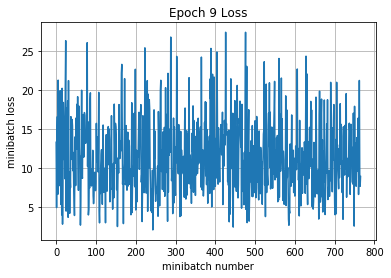

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 6900: with minibatch training loss = 0.253 and accuracy of 0.88
Iteration 7000: with minibatch training loss = 0.377 and accuracy of 0.86
Iteration 7100: with minibatch training loss = 0.289 and accuracy of 0.88
Iteration 7200: with minibatch training loss = 0.2 and accuracy of 0.92
Iteration 7300: with minibatch training loss = 0.164 and accuracy of 0.92
Iteration 7400: with minibatch training loss = 0.136 and accuracy of 0.95
Iteration 7500: with minibatch training loss = 0.117 and accuracy of 0.92
Iteration 7600: with minibatch training loss = 0.199 and accuracy of 0.91
Epoch 10, Overall loss = 0.174 and accuracy of 0.937


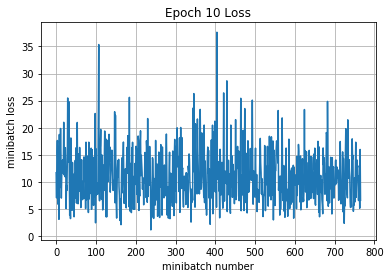

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
training time (seconds) 3315.2887963079993
Validation
Epoch 1, Overall loss = 0.889 and accuracy of 0.79
validation time (seconds) 2.012547144993732
predict
Epoch 1, Overall loss = 0.000382 and accuracy of 1


In [29]:
def different_lr_for_deeper_net(X, y, is_training, dropout=None, **kwargs):
    out = X

    # 32
    out, [W1, b1] = cnn(idx=1, X=out, filters=32, kernel_size=(3,3), is_training=is_training, padding='VALID',
                        dropout=dropout)
    # 30
    out, _ = cnn(idx=2, X=out, filters=32, kernel_size=(3,3), is_training=is_training, padding='VALID',
                        dropout=dropout)
    # 28
    out = tf.nn.max_pool(out, ksize=(1,2,2,1), strides=(1,2,2,1), padding='SAME')

    # 14
    out, _ = cnn(idx=3, X=out, filters=64, kernel_size=(5,5), is_training=is_training, padding='VALID',
                        dropout=dropout)
    # 10
    out, _ = cnn(idx=4, X=out, filters=64, kernel_size=(5,5), is_training=is_training, padding='VALID',
                        dropout=dropout)
    # 6
    out, _ = cnn(idx=5, X=out, filters=128, kernel_size=(5,5), is_training=is_training, padding='VALID',
                        dropout=dropout)

    # Affine layer from 6x6x128 = 4,608 to 1024 outputs
    out, _ = affine(1, out, output_size=1024)

    # ReLU Activation Layer
    out = tf.nn.relu(out)

    out = tf.layers.batch_normalization(out, training=is_training)
    if dropout is not None:    
        out = tf.layers.dropout(out, rate=dropout, training=is_training)
    # 5)
    # Affine layer from 1024 input units to 10 outputs
    out, _ = affine(2, out, output_size=10)
    return out, [W1]

long_running_models_2 = []

long_running_models_2.append(estimate_model({
    'group': 'cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5',
    'name': 'lr: 5e-4',
    'dropout': 0.2,
    'model_builder': different_lr_for_deeper_net,
    'learning_rate': 5e-4,
    'num_of_epochs': 10,
}, X_train, y_train, X_val, y_val))

Training
INFO:tensorflow:Restoring parameters from ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
restored snapshot ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 0: with minibatch training loss = 0.0896 and accuracy of 0.97
Iteration 100: with minibatch training loss = 0.153 and accuracy of 0.94
Iteration 200: with minibatch training loss = 0.258 and accuracy of 0.95
Iteration 300: with minibatch training loss = 0.182 and accuracy of 0.94
Iteration 400: with minibatch training loss = 0.19 and accuracy of 0.95
Iteration 500: with minibatch training loss = 0.367 and accuracy of 0.84
Iteration 600: with minibatch training loss = 0.131 and accuracy of 0.97
Iteration 700: with minibatch training loss = 0.159 and accuracy of 0.95
Epoch 1, Overall loss = 0.199 and accuracy of 0.93


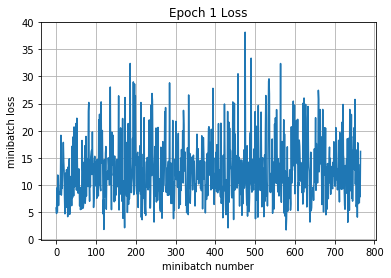

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 800: with minibatch training loss = 0.193 and accuracy of 0.94
Iteration 900: with minibatch training loss = 0.136 and accuracy of 0.97
Iteration 1000: with minibatch training loss = 0.304 and accuracy of 0.86
Iteration 1100: with minibatch training loss = 0.237 and accuracy of 0.91
Iteration 1200: with minibatch training loss = 0.101 and accuracy of 0.95
Iteration 1300: with minibatch training loss = 0.394 and accuracy of 0.89
Iteration 1400: with minibatch training loss = 0.148 and accuracy of 0.92
Iteration 1500: with minibatch training loss = 0.166 and accuracy of 0.95
Epoch 2, Overall loss = 0.179 and accuracy of 0.936


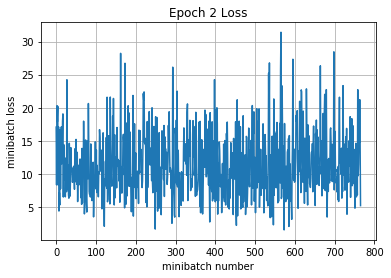

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 1600: with minibatch training loss = 0.153 and accuracy of 0.94
Iteration 1700: with minibatch training loss = 0.119 and accuracy of 0.95
Iteration 1800: with minibatch training loss = 0.0309 and accuracy of 1
Iteration 1900: with minibatch training loss = 0.0424 and accuracy of 1
Iteration 2000: with minibatch training loss = 0.143 and accuracy of 0.98
Iteration 2100: with minibatch training loss = 0.186 and accuracy of 0.94
Iteration 2200: with minibatch training loss = 0.196 and accuracy of 0.94
Epoch 3, Overall loss = 0.167 and accuracy of 0.94


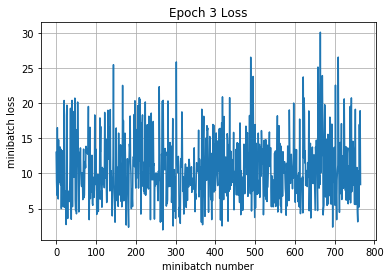

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 2300: with minibatch training loss = 0.0722 and accuracy of 0.98
Iteration 2400: with minibatch training loss = 0.164 and accuracy of 0.94
Iteration 2500: with minibatch training loss = 0.128 and accuracy of 0.97
Iteration 2600: with minibatch training loss = 0.127 and accuracy of 0.95
Iteration 2700: with minibatch training loss = 0.158 and accuracy of 0.92
Iteration 2800: with minibatch training loss = 0.379 and accuracy of 0.86
Iteration 2900: with minibatch training loss = 0.239 and accuracy of 0.92
Iteration 3000: with minibatch training loss = 0.0736 and accuracy of 0.97
Epoch 4, Overall loss = 0.164 and accuracy of 0.941


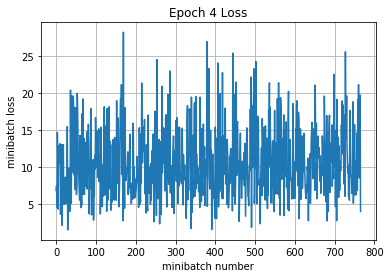

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 3100: with minibatch training loss = 0.251 and accuracy of 0.91
Iteration 3200: with minibatch training loss = 0.335 and accuracy of 0.88
Iteration 3300: with minibatch training loss = 0.0512 and accuracy of 1
Iteration 3400: with minibatch training loss = 0.169 and accuracy of 0.95
Iteration 3500: with minibatch training loss = 0.128 and accuracy of 0.94
Iteration 3600: with minibatch training loss = 0.176 and accuracy of 0.94
Iteration 3700: with minibatch training loss = 0.12 and accuracy of 0.95
Iteration 3800: with minibatch training loss = 0.215 and accuracy of 0.88
Epoch 5, Overall loss = 0.16 and accuracy of 0.943


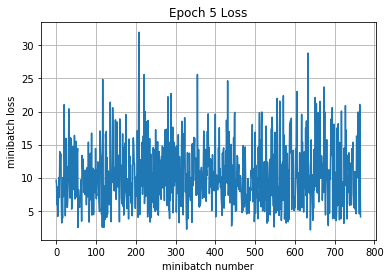

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
training time (seconds) 1902.2433751999924
Validation
Epoch 1, Overall loss = 0.888 and accuracy of 0.792
validation time (seconds) 2.4796472000016365
predict
Epoch 1, Overall loss = 2.26e-06 and accuracy of 1


In [99]:
def different_lr_for_deeper_net(X, y, is_training, dropout=None, **kwargs):
    out = X

    # 32
    out, [W1, b1] = cnn(idx=1, X=out, filters=32, kernel_size=(3,3), is_training=is_training, padding='VALID',
                        dropout=dropout)
    # 30
    out, _ = cnn(idx=2, X=out, filters=32, kernel_size=(3,3), is_training=is_training, padding='VALID',
                        dropout=dropout)
    # 28
    out = tf.nn.max_pool(out, ksize=(1,2,2,1), strides=(1,2,2,1), padding='SAME')

    # 14
    out, _ = cnn(idx=3, X=out, filters=64, kernel_size=(5,5), is_training=is_training, padding='VALID',
                        dropout=dropout)
    # 10
    out, _ = cnn(idx=4, X=out, filters=64, kernel_size=(5,5), is_training=is_training, padding='VALID',
                        dropout=dropout)
    # 6
    out, _ = cnn(idx=5, X=out, filters=128, kernel_size=(5,5), is_training=is_training, padding='VALID',
                        dropout=dropout)

    # Affine layer from 6x6x128 = 4,608 to 1024 outputs
    out, _ = affine(1, out, output_size=1024)

    # ReLU Activation Layer
    out = tf.nn.relu(out)

    out = tf.layers.batch_normalization(out, training=is_training)
    if dropout is not None:    
        out = tf.layers.dropout(out, rate=dropout, training=is_training)
    # 5)
    # Affine layer from 1024 input units to 10 outputs
    out, _ = affine(2, out, output_size=10)
    return out, [W1]

long_running_models_3 = []

long_running_models_3.append(estimate_model({
    'group': 'cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5',
    'name': 'lr: 5e-4',
    'dropout': 0.2,
    'model_builder': different_lr_for_deeper_net,
    'learning_rate': 5e-4,
    'num_of_epochs': 5,
}, X_train, y_train, X_val, y_val))

Training
INFO:tensorflow:Restoring parameters from ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
restored snapshot ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 0: with minibatch training loss = 0.107 and accuracy of 0.95
Iteration 100: with minibatch training loss = 0.0306 and accuracy of 1
Iteration 200: with minibatch training loss = 0.0472 and accuracy of 0.97
Iteration 300: with minibatch training loss = 0.246 and accuracy of 0.94
Iteration 400: with minibatch training loss = 0.181 and accuracy of 0.92
Iteration 500: with minibatch training loss = 0.12 and accuracy of 0.95
Iteration 600: with minibatch training loss = 0.0223 and accuracy of 1
Iteration 700: with minibatch training loss = 0.0433 and accuracy of 0.98
Epoch 1, Overall loss = 0.106 and accuracy of 0.962


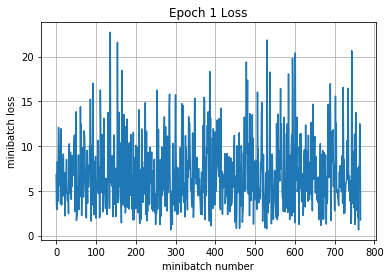

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 800: with minibatch training loss = 0.375 and accuracy of 0.91
Iteration 900: with minibatch training loss = 0.22 and accuracy of 0.91
Iteration 1000: with minibatch training loss = 0.132 and accuracy of 0.94
Iteration 1100: with minibatch training loss = 0.0221 and accuracy of 1
Iteration 1200: with minibatch training loss = 0.192 and accuracy of 0.94
Iteration 1300: with minibatch training loss = 0.0626 and accuracy of 0.98
Iteration 1400: with minibatch training loss = 0.0812 and accuracy of 0.95
Iteration 1500: with minibatch training loss = 0.118 and accuracy of 0.95
Epoch 2, Overall loss = 0.105 and accuracy of 0.963


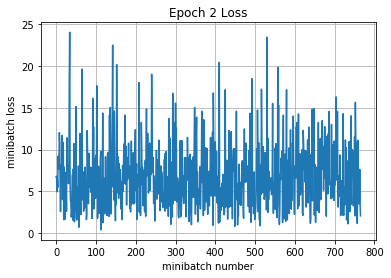

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 1600: with minibatch training loss = 0.174 and accuracy of 0.91
Iteration 1700: with minibatch training loss = 0.059 and accuracy of 0.98
Iteration 1800: with minibatch training loss = 0.0228 and accuracy of 1
Iteration 1900: with minibatch training loss = 0.168 and accuracy of 0.95
Iteration 2000: with minibatch training loss = 0.164 and accuracy of 0.94
Iteration 2100: with minibatch training loss = 0.129 and accuracy of 0.98
Iteration 2200: with minibatch training loss = 0.0526 and accuracy of 0.97
Epoch 3, Overall loss = 0.105 and accuracy of 0.963


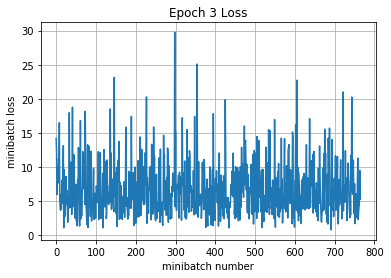

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 2300: with minibatch training loss = 0.104 and accuracy of 0.97
Iteration 2400: with minibatch training loss = 0.184 and accuracy of 0.92
Iteration 2500: with minibatch training loss = 0.13 and accuracy of 0.95
Iteration 2600: with minibatch training loss = 0.407 and accuracy of 0.89
Iteration 2700: with minibatch training loss = 0.0863 and accuracy of 0.97
Iteration 2800: with minibatch training loss = 0.133 and accuracy of 0.95
Iteration 2900: with minibatch training loss = 0.0632 and accuracy of 0.97
Iteration 3000: with minibatch training loss = 0.169 and accuracy of 0.95
Epoch 4, Overall loss = 0.105 and accuracy of 0.963


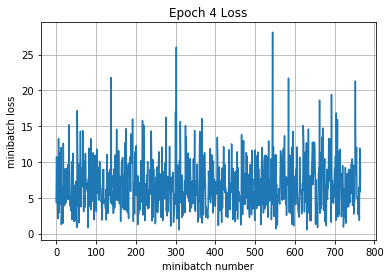

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 3100: with minibatch training loss = 0.0433 and accuracy of 0.98
Iteration 3200: with minibatch training loss = 0.15 and accuracy of 0.94
Iteration 3300: with minibatch training loss = 0.0816 and accuracy of 0.97
Iteration 3400: with minibatch training loss = 0.0769 and accuracy of 0.98
Iteration 3500: with minibatch training loss = 0.0937 and accuracy of 0.95
Iteration 3600: with minibatch training loss = 0.0629 and accuracy of 0.97
Iteration 3700: with minibatch training loss = 0.109 and accuracy of 0.94
Iteration 3800: with minibatch training loss = 0.0425 and accuracy of 0.98
Epoch 5, Overall loss = 0.106 and accuracy of 0.962


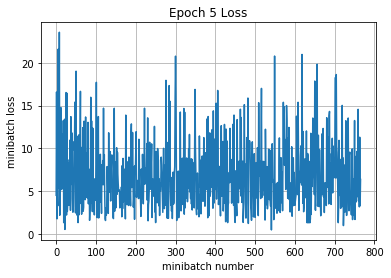

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 3900: with minibatch training loss = 0.122 and accuracy of 0.97
Iteration 4000: with minibatch training loss = 0.157 and accuracy of 0.95
Iteration 4100: with minibatch training loss = 0.181 and accuracy of 0.94
Iteration 4200: with minibatch training loss = 0.0217 and accuracy of 1
Iteration 4300: with minibatch training loss = 0.00963 and accuracy of 1
Iteration 4400: with minibatch training loss = 0.172 and accuracy of 0.92
Iteration 4500: with minibatch training loss = 0.117 and accuracy of 0.94
Epoch 6, Overall loss = 0.107 and accuracy of 0.963


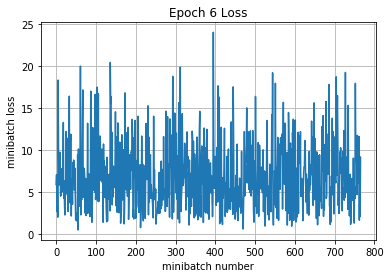

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 4600: with minibatch training loss = 0.0531 and accuracy of 0.98
Iteration 4700: with minibatch training loss = 0.0712 and accuracy of 0.97
Iteration 4800: with minibatch training loss = 0.149 and accuracy of 0.92
Iteration 4900: with minibatch training loss = 0.0359 and accuracy of 0.98
Iteration 5000: with minibatch training loss = 0.0654 and accuracy of 0.97
Iteration 5100: with minibatch training loss = 0.0411 and accuracy of 0.98
Iteration 5200: with minibatch training loss = 0.108 and accuracy of 0.95
Iteration 5300: with minibatch training loss = 0.192 and accuracy of 0.91
Epoch 7, Overall loss = 0.105 and accuracy of 0.964


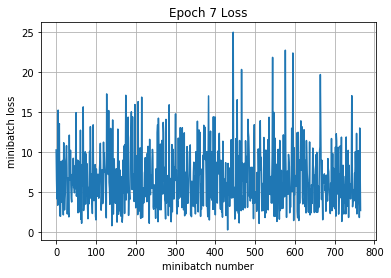

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 5400: with minibatch training loss = 0.0659 and accuracy of 0.97
Iteration 5500: with minibatch training loss = 0.094 and accuracy of 0.95
Iteration 5600: with minibatch training loss = 0.107 and accuracy of 0.95
Iteration 5700: with minibatch training loss = 0.0739 and accuracy of 0.98
Iteration 5800: with minibatch training loss = 0.0288 and accuracy of 1
Iteration 5900: with minibatch training loss = 0.13 and accuracy of 0.95
Iteration 6000: with minibatch training loss = 0.117 and accuracy of 0.98
Iteration 6100: with minibatch training loss = 0.0595 and accuracy of 0.98
Epoch 8, Overall loss = 0.105 and accuracy of 0.962


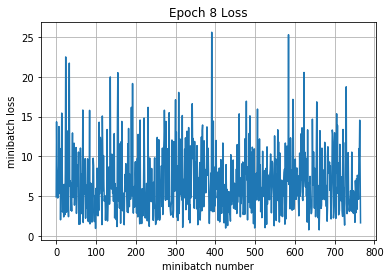

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 6200: with minibatch training loss = 0.12 and accuracy of 0.97
Iteration 6300: with minibatch training loss = 0.0486 and accuracy of 0.98
Iteration 6400: with minibatch training loss = 0.112 and accuracy of 0.98
Iteration 6500: with minibatch training loss = 0.0744 and accuracy of 0.97
Iteration 6600: with minibatch training loss = 0.173 and accuracy of 0.92
Iteration 6700: with minibatch training loss = 0.0841 and accuracy of 0.97
Iteration 6800: with minibatch training loss = 0.0118 and accuracy of 1
Epoch 9, Overall loss = 0.102 and accuracy of 0.964


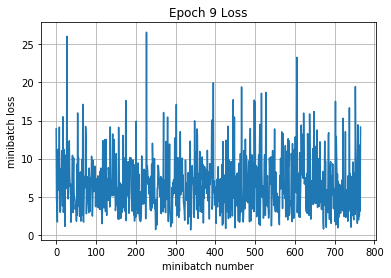

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 6900: with minibatch training loss = 0.103 and accuracy of 0.95
Iteration 7000: with minibatch training loss = 0.101 and accuracy of 0.97
Iteration 7100: with minibatch training loss = 0.15 and accuracy of 0.94
Iteration 7200: with minibatch training loss = 0.0995 and accuracy of 0.95
Iteration 7300: with minibatch training loss = 0.0688 and accuracy of 0.98
Iteration 7400: with minibatch training loss = 0.0631 and accuracy of 0.97
Iteration 7500: with minibatch training loss = 0.0223 and accuracy of 1
Iteration 7600: with minibatch training loss = 0.111 and accuracy of 0.97
Epoch 10, Overall loss = 0.105 and accuracy of 0.962


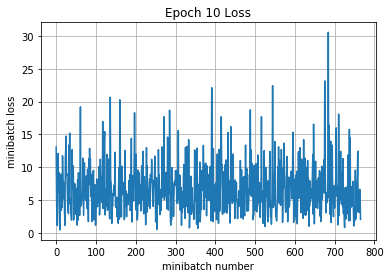

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 7700: with minibatch training loss = 0.134 and accuracy of 0.97
Iteration 7800: with minibatch training loss = 0.0933 and accuracy of 0.94
Iteration 7900: with minibatch training loss = 0.0761 and accuracy of 0.97
Iteration 8000: with minibatch training loss = 0.109 and accuracy of 0.97
Iteration 8100: with minibatch training loss = 0.218 and accuracy of 0.89
Iteration 8200: with minibatch training loss = 0.13 and accuracy of 0.97
Iteration 8300: with minibatch training loss = 0.0674 and accuracy of 0.97
Iteration 8400: with minibatch training loss = 0.0873 and accuracy of 0.98
Epoch 11, Overall loss = 0.102 and accuracy of 0.964


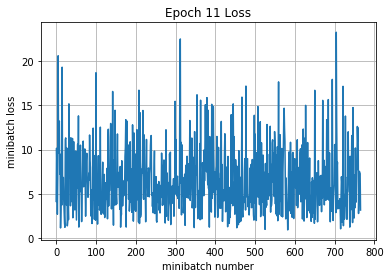

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 8500: with minibatch training loss = 0.0546 and accuracy of 0.98
Iteration 8600: with minibatch training loss = 0.0585 and accuracy of 0.97
Iteration 8700: with minibatch training loss = 0.219 and accuracy of 0.91
Iteration 8800: with minibatch training loss = 0.0908 and accuracy of 0.97
Iteration 8900: with minibatch training loss = 0.0664 and accuracy of 0.98
Iteration 9000: with minibatch training loss = 0.108 and accuracy of 0.95
Iteration 9100: with minibatch training loss = 0.147 and accuracy of 0.97
Epoch 12, Overall loss = 0.102 and accuracy of 0.964


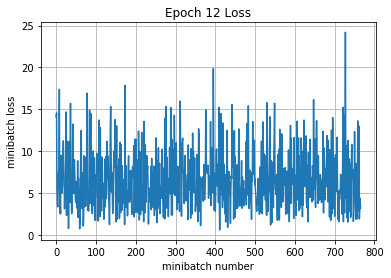

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 9200: with minibatch training loss = 0.2 and accuracy of 0.89
Iteration 9300: with minibatch training loss = 0.102 and accuracy of 0.97
Iteration 9400: with minibatch training loss = 0.0685 and accuracy of 0.97
Iteration 9500: with minibatch training loss = 0.197 and accuracy of 0.92
Iteration 9600: with minibatch training loss = 0.104 and accuracy of 0.98
Iteration 9700: with minibatch training loss = 0.202 and accuracy of 0.92
Iteration 9800: with minibatch training loss = 0.0675 and accuracy of 0.98
Iteration 9900: with minibatch training loss = 0.0765 and accuracy of 0.95
Epoch 13, Overall loss = 0.104 and accuracy of 0.963


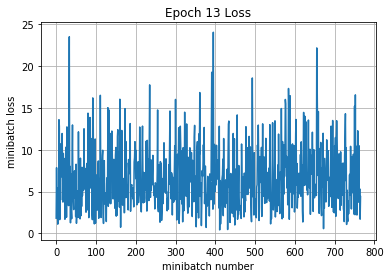

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 10000: with minibatch training loss = 0.0979 and accuracy of 0.98
Iteration 10100: with minibatch training loss = 0.136 and accuracy of 0.95
Iteration 10200: with minibatch training loss = 0.122 and accuracy of 0.97
Iteration 10300: with minibatch training loss = 0.089 and accuracy of 0.98
Iteration 10400: with minibatch training loss = 0.138 and accuracy of 0.92
Iteration 10500: with minibatch training loss = 0.0149 and accuracy of 1
Iteration 10600: with minibatch training loss = 0.15 and accuracy of 0.94
Iteration 10700: with minibatch training loss = 0.0433 and accuracy of 0.98
Epoch 14, Overall loss = 0.103 and accuracy of 0.965


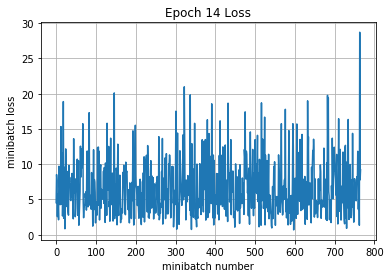

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 10800: with minibatch training loss = 0.0706 and accuracy of 0.98
Iteration 10900: with minibatch training loss = 0.147 and accuracy of 0.95
Iteration 11000: with minibatch training loss = 0.237 and accuracy of 0.94
Iteration 11100: with minibatch training loss = 0.109 and accuracy of 0.97
Iteration 11200: with minibatch training loss = 0.0957 and accuracy of 0.97
Iteration 11300: with minibatch training loss = 0.333 and accuracy of 0.89
Iteration 11400: with minibatch training loss = 0.0963 and accuracy of 0.97
Epoch 15, Overall loss = 0.102 and accuracy of 0.964


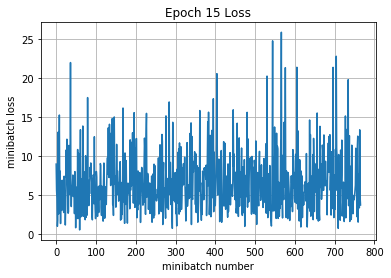

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 11500: with minibatch training loss = 0.135 and accuracy of 0.92
Iteration 11600: with minibatch training loss = 0.03 and accuracy of 1
Iteration 11700: with minibatch training loss = 0.177 and accuracy of 0.95
Iteration 11800: with minibatch training loss = 0.213 and accuracy of 0.94
Iteration 11900: with minibatch training loss = 0.0941 and accuracy of 0.98
Iteration 12000: with minibatch training loss = 0.132 and accuracy of 0.95
Iteration 12100: with minibatch training loss = 0.0501 and accuracy of 0.98
Iteration 12200: with minibatch training loss = 0.109 and accuracy of 0.97
Epoch 16, Overall loss = 0.105 and accuracy of 0.963


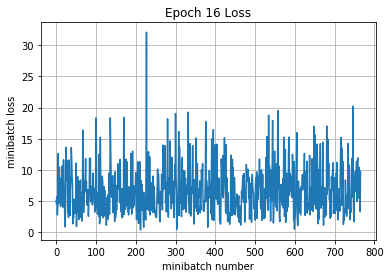

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 12300: with minibatch training loss = 0.13 and accuracy of 0.95
Iteration 12400: with minibatch training loss = 0.13 and accuracy of 0.92
Iteration 12500: with minibatch training loss = 0.00924 and accuracy of 1
Iteration 12600: with minibatch training loss = 0.113 and accuracy of 0.98
Iteration 12700: with minibatch training loss = 0.169 and accuracy of 0.94
Iteration 12800: with minibatch training loss = 0.102 and accuracy of 0.97
Iteration 12900: with minibatch training loss = 0.303 and accuracy of 0.94
Iteration 13000: with minibatch training loss = 0.0608 and accuracy of 0.98
Epoch 17, Overall loss = 0.102 and accuracy of 0.964


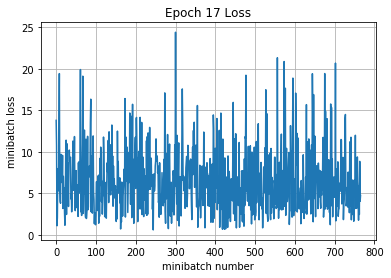

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 13100: with minibatch training loss = 0.0975 and accuracy of 0.97
Iteration 13200: with minibatch training loss = 0.098 and accuracy of 0.98
Iteration 13300: with minibatch training loss = 0.1 and accuracy of 0.97
Iteration 13400: with minibatch training loss = 0.0759 and accuracy of 0.97
Iteration 13500: with minibatch training loss = 0.241 and accuracy of 0.91
Iteration 13600: with minibatch training loss = 0.0886 and accuracy of 0.97
Iteration 13700: with minibatch training loss = 0.0284 and accuracy of 1
Epoch 18, Overall loss = 0.1 and accuracy of 0.964


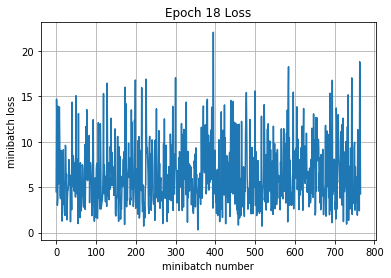

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 13800: with minibatch training loss = 0.137 and accuracy of 0.92
Iteration 13900: with minibatch training loss = 0.0904 and accuracy of 0.98
Iteration 14000: with minibatch training loss = 0.05 and accuracy of 0.98
Iteration 14100: with minibatch training loss = 0.131 and accuracy of 0.94
Iteration 14200: with minibatch training loss = 0.0807 and accuracy of 0.97
Iteration 14300: with minibatch training loss = 0.0961 and accuracy of 0.95
Iteration 14400: with minibatch training loss = 0.0486 and accuracy of 0.98
Iteration 14500: with minibatch training loss = 0.301 and accuracy of 0.92
Epoch 19, Overall loss = 0.0976 and accuracy of 0.966


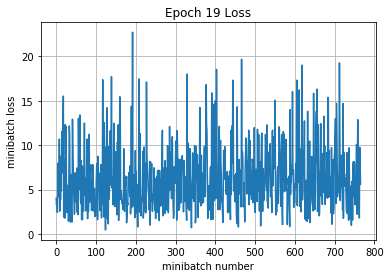

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 14600: with minibatch training loss = 0.0846 and accuracy of 0.95
Iteration 14700: with minibatch training loss = 0.294 and accuracy of 0.91
Iteration 14800: with minibatch training loss = 0.144 and accuracy of 0.95
Iteration 14900: with minibatch training loss = 0.0696 and accuracy of 0.97
Iteration 15000: with minibatch training loss = 0.0757 and accuracy of 0.98
Iteration 15100: with minibatch training loss = 0.0703 and accuracy of 0.95
Iteration 15200: with minibatch training loss = 0.0495 and accuracy of 0.98
Iteration 15300: with minibatch training loss = 0.0875 and accuracy of 0.95
Epoch 20, Overall loss = 0.104 and accuracy of 0.964


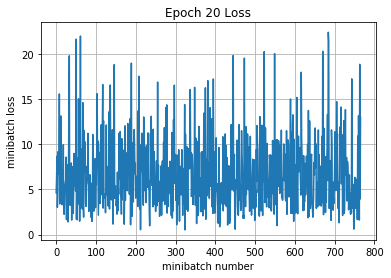

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 15400: with minibatch training loss = 0.0764 and accuracy of 0.97
Iteration 15500: with minibatch training loss = 0.0265 and accuracy of 0.98
Iteration 15600: with minibatch training loss = 0.239 and accuracy of 0.89
Iteration 15700: with minibatch training loss = 0.094 and accuracy of 0.97
Iteration 15800: with minibatch training loss = 0.163 and accuracy of 0.94
Iteration 15900: with minibatch training loss = 0.0918 and accuracy of 0.97
Iteration 16000: with minibatch training loss = 0.114 and accuracy of 0.95
Epoch 21, Overall loss = 0.101 and accuracy of 0.964


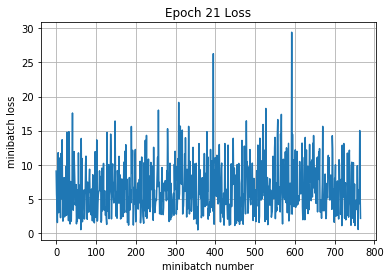

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 16100: with minibatch training loss = 0.0427 and accuracy of 0.98
Iteration 16200: with minibatch training loss = 0.0267 and accuracy of 1
Iteration 16300: with minibatch training loss = 0.0632 and accuracy of 0.98
Iteration 16400: with minibatch training loss = 0.0293 and accuracy of 1
Iteration 16500: with minibatch training loss = 0.0837 and accuracy of 0.97
Iteration 16600: with minibatch training loss = 0.0175 and accuracy of 1
Iteration 16700: with minibatch training loss = 0.0327 and accuracy of 0.98
Iteration 16800: with minibatch training loss = 0.0674 and accuracy of 0.95
Epoch 22, Overall loss = 0.0997 and accuracy of 0.964


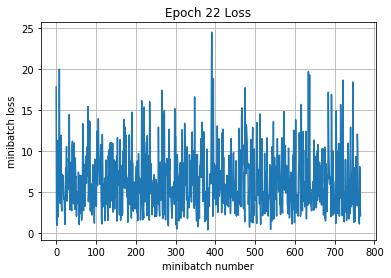

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 16900: with minibatch training loss = 0.111 and accuracy of 0.97
Iteration 17000: with minibatch training loss = 0.148 and accuracy of 0.91
Iteration 17100: with minibatch training loss = 0.069 and accuracy of 0.95
Iteration 17200: with minibatch training loss = 0.126 and accuracy of 0.94
Iteration 17300: with minibatch training loss = 0.0367 and accuracy of 0.98
Iteration 17400: with minibatch training loss = 0.153 and accuracy of 0.95
Iteration 17500: with minibatch training loss = 0.131 and accuracy of 0.94
Iteration 17600: with minibatch training loss = 0.0468 and accuracy of 0.97
Epoch 23, Overall loss = 0.0998 and accuracy of 0.965


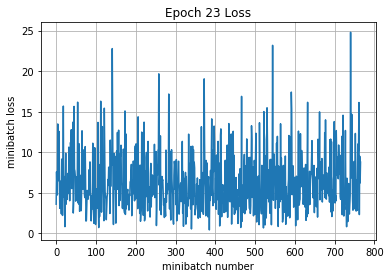

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 17700: with minibatch training loss = 0.0593 and accuracy of 0.98
Iteration 17800: with minibatch training loss = 0.0927 and accuracy of 0.98
Iteration 17900: with minibatch training loss = 0.0145 and accuracy of 1
Iteration 18000: with minibatch training loss = 0.0521 and accuracy of 0.98
Iteration 18100: with minibatch training loss = 0.0652 and accuracy of 0.97
Iteration 18200: with minibatch training loss = 0.0227 and accuracy of 1
Iteration 18300: with minibatch training loss = 0.0283 and accuracy of 1
Epoch 24, Overall loss = 0.102 and accuracy of 0.964


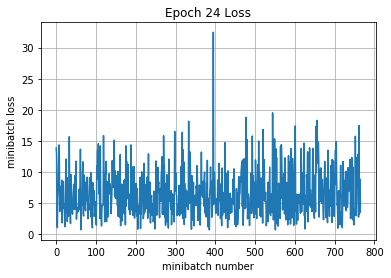

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 18400: with minibatch training loss = 0.0316 and accuracy of 1
Iteration 18500: with minibatch training loss = 0.105 and accuracy of 0.97
Iteration 18600: with minibatch training loss = 0.0591 and accuracy of 0.98
Iteration 18700: with minibatch training loss = 0.113 and accuracy of 0.97
Iteration 18800: with minibatch training loss = 0.109 and accuracy of 0.95
Iteration 18900: with minibatch training loss = 0.0972 and accuracy of 0.95
Iteration 19000: with minibatch training loss = 0.0728 and accuracy of 0.97
Iteration 19100: with minibatch training loss = 0.0516 and accuracy of 0.98
Epoch 25, Overall loss = 0.1 and accuracy of 0.964


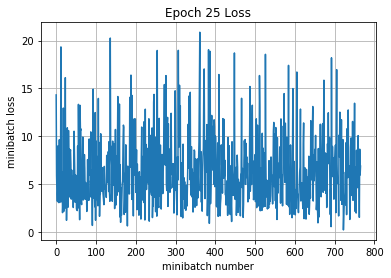

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 19200: with minibatch training loss = 0.105 and accuracy of 0.95
Iteration 19300: with minibatch training loss = 0.126 and accuracy of 0.95
Iteration 19400: with minibatch training loss = 0.0353 and accuracy of 1
Iteration 19500: with minibatch training loss = 0.0748 and accuracy of 0.97
Iteration 19600: with minibatch training loss = 0.0229 and accuracy of 1
Iteration 19700: with minibatch training loss = 0.171 and accuracy of 0.97
Iteration 19800: with minibatch training loss = 0.0417 and accuracy of 0.98
Iteration 19900: with minibatch training loss = 0.109 and accuracy of 0.92
Epoch 26, Overall loss = 0.101 and accuracy of 0.964


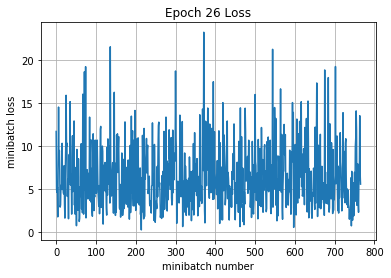

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 20000: with minibatch training loss = 0.225 and accuracy of 0.94
Iteration 20100: with minibatch training loss = 0.103 and accuracy of 0.94
Iteration 20200: with minibatch training loss = 0.0628 and accuracy of 0.97
Iteration 20300: with minibatch training loss = 0.0927 and accuracy of 0.97
Iteration 20400: with minibatch training loss = 0.274 and accuracy of 0.94
Iteration 20500: with minibatch training loss = 0.112 and accuracy of 0.95
Iteration 20600: with minibatch training loss = 0.209 and accuracy of 0.94
Epoch 27, Overall loss = 0.0978 and accuracy of 0.966


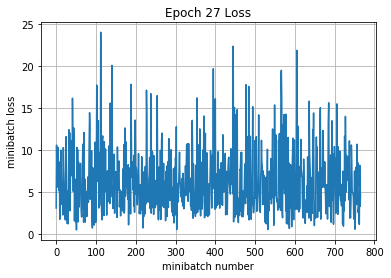

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 20700: with minibatch training loss = 0.129 and accuracy of 0.95
Iteration 20800: with minibatch training loss = 0.0445 and accuracy of 0.98
Iteration 20900: with minibatch training loss = 0.0661 and accuracy of 0.95
Iteration 21000: with minibatch training loss = 0.021 and accuracy of 1
Iteration 21100: with minibatch training loss = 0.18 and accuracy of 0.95
Iteration 21200: with minibatch training loss = 0.145 and accuracy of 0.95
Iteration 21300: with minibatch training loss = 0.049 and accuracy of 1
Iteration 21400: with minibatch training loss = 0.129 and accuracy of 0.97
Epoch 28, Overall loss = 0.101 and accuracy of 0.965


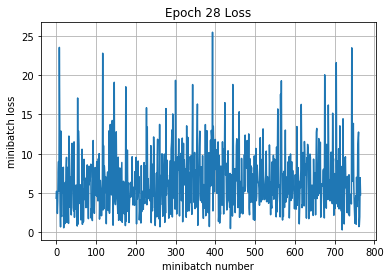

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 21500: with minibatch training loss = 0.105 and accuracy of 0.98
Iteration 21600: with minibatch training loss = 0.197 and accuracy of 0.91
Iteration 21700: with minibatch training loss = 0.045 and accuracy of 1
Iteration 21800: with minibatch training loss = 0.138 and accuracy of 0.95
Iteration 21900: with minibatch training loss = 0.0223 and accuracy of 1
Iteration 22000: with minibatch training loss = 0.131 and accuracy of 0.97
Iteration 22100: with minibatch training loss = 0.0929 and accuracy of 0.95
Iteration 22200: with minibatch training loss = 0.151 and accuracy of 0.94
Epoch 29, Overall loss = 0.0972 and accuracy of 0.966


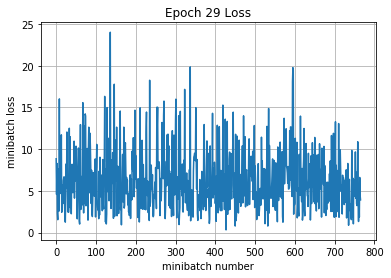

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 22300: with minibatch training loss = 0.118 and accuracy of 0.94
Iteration 22400: with minibatch training loss = 0.18 and accuracy of 0.94
Iteration 22500: with minibatch training loss = 0.0682 and accuracy of 0.98
Iteration 22600: with minibatch training loss = 0.186 and accuracy of 0.94
Iteration 22700: with minibatch training loss = 0.075 and accuracy of 0.97
Iteration 22800: with minibatch training loss = 0.178 and accuracy of 0.92
Iteration 22900: with minibatch training loss = 0.102 and accuracy of 0.95
Epoch 30, Overall loss = 0.0993 and accuracy of 0.966


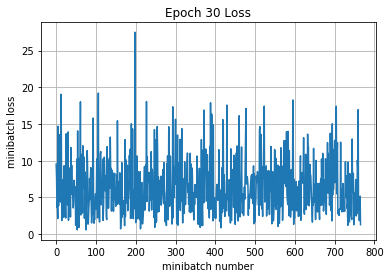

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 23000: with minibatch training loss = 0.116 and accuracy of 0.95
Iteration 23100: with minibatch training loss = 0.0371 and accuracy of 0.98
Iteration 23200: with minibatch training loss = 0.0472 and accuracy of 0.98
Iteration 23300: with minibatch training loss = 0.0317 and accuracy of 1
Iteration 23400: with minibatch training loss = 0.051 and accuracy of 1
Iteration 23500: with minibatch training loss = 0.0677 and accuracy of 0.98
Iteration 23600: with minibatch training loss = 0.102 and accuracy of 0.95
Iteration 23700: with minibatch training loss = 0.0103 and accuracy of 1
Epoch 31, Overall loss = 0.0993 and accuracy of 0.965


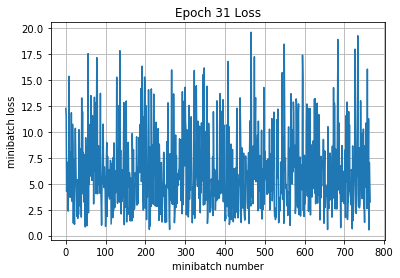

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 23800: with minibatch training loss = 0.128 and accuracy of 0.97
Iteration 23900: with minibatch training loss = 0.212 and accuracy of 0.95
Iteration 24000: with minibatch training loss = 0.131 and accuracy of 0.98
Iteration 24100: with minibatch training loss = 0.135 and accuracy of 0.97
Iteration 24200: with minibatch training loss = 0.12 and accuracy of 0.94
Iteration 24300: with minibatch training loss = 0.0623 and accuracy of 0.97
Iteration 24400: with minibatch training loss = 0.0926 and accuracy of 0.94
Iteration 24500: with minibatch training loss = 0.133 and accuracy of 0.95
Epoch 32, Overall loss = 0.0972 and accuracy of 0.965


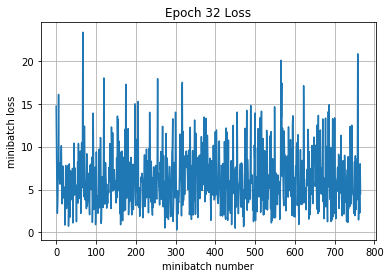

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 24600: with minibatch training loss = 0.0193 and accuracy of 1
Iteration 24700: with minibatch training loss = 0.0569 and accuracy of 0.97
Iteration 24800: with minibatch training loss = 0.0215 and accuracy of 1
Iteration 24900: with minibatch training loss = 0.161 and accuracy of 0.94
Iteration 25000: with minibatch training loss = 0.227 and accuracy of 0.94
Iteration 25100: with minibatch training loss = 0.0669 and accuracy of 0.97
Iteration 25200: with minibatch training loss = 0.103 and accuracy of 0.95
Epoch 33, Overall loss = 0.0975 and accuracy of 0.966


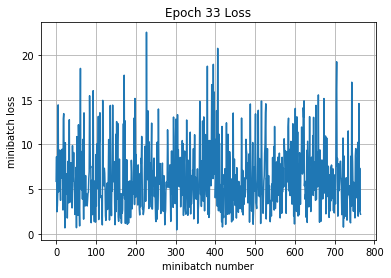

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 25300: with minibatch training loss = 0.0733 and accuracy of 0.97
Iteration 25400: with minibatch training loss = 0.111 and accuracy of 0.95
Iteration 25500: with minibatch training loss = 0.254 and accuracy of 0.91
Iteration 25600: with minibatch training loss = 0.109 and accuracy of 0.94
Iteration 25700: with minibatch training loss = 0.149 and accuracy of 0.94
Iteration 25800: with minibatch training loss = 0.153 and accuracy of 0.95
Iteration 25900: with minibatch training loss = 0.149 and accuracy of 0.94
Iteration 26000: with minibatch training loss = 0.103 and accuracy of 0.97
Epoch 34, Overall loss = 0.101 and accuracy of 0.965


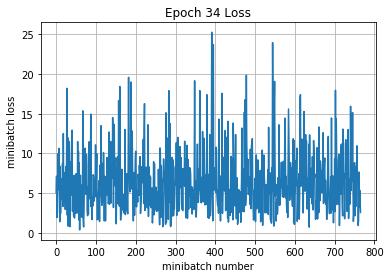

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 26100: with minibatch training loss = 0.174 and accuracy of 0.95
Iteration 26200: with minibatch training loss = 0.23 and accuracy of 0.95
Iteration 26300: with minibatch training loss = 0.05 and accuracy of 0.98
Iteration 26400: with minibatch training loss = 0.0184 and accuracy of 1
Iteration 26500: with minibatch training loss = 0.0285 and accuracy of 1
Iteration 26600: with minibatch training loss = 0.0745 and accuracy of 0.94
Iteration 26700: with minibatch training loss = 0.111 and accuracy of 0.95
Iteration 26800: with minibatch training loss = 0.0655 and accuracy of 0.98
Epoch 35, Overall loss = 0.101 and accuracy of 0.965


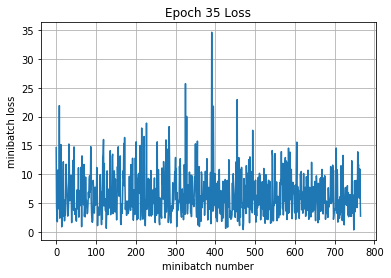

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 26900: with minibatch training loss = 0.061 and accuracy of 0.98
Iteration 27000: with minibatch training loss = 0.0289 and accuracy of 0.98
Iteration 27100: with minibatch training loss = 0.0358 and accuracy of 0.98
Iteration 27200: with minibatch training loss = 0.0766 and accuracy of 0.95
Iteration 27300: with minibatch training loss = 0.101 and accuracy of 0.95
Iteration 27400: with minibatch training loss = 0.0637 and accuracy of 0.98
Iteration 27500: with minibatch training loss = 0.0609 and accuracy of 0.98
Epoch 36, Overall loss = 0.0966 and accuracy of 0.966


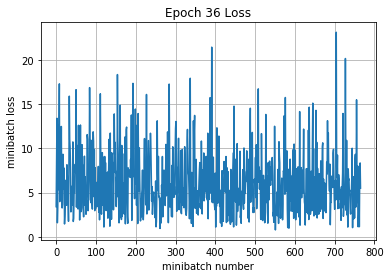

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 27600: with minibatch training loss = 0.111 and accuracy of 0.95
Iteration 27700: with minibatch training loss = 0.0847 and accuracy of 0.95
Iteration 27800: with minibatch training loss = 0.0455 and accuracy of 0.98
Iteration 27900: with minibatch training loss = 0.0577 and accuracy of 0.98
Iteration 28000: with minibatch training loss = 0.191 and accuracy of 0.95
Iteration 28100: with minibatch training loss = 0.0847 and accuracy of 0.95
Iteration 28200: with minibatch training loss = 0.087 and accuracy of 0.95
Iteration 28300: with minibatch training loss = 0.0887 and accuracy of 0.95
Epoch 37, Overall loss = 0.101 and accuracy of 0.964


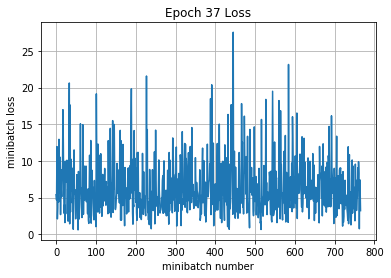

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 28400: with minibatch training loss = 0.0186 and accuracy of 0.98
Iteration 28500: with minibatch training loss = 0.092 and accuracy of 0.98
Iteration 28600: with minibatch training loss = 0.0502 and accuracy of 0.98
Iteration 28700: with minibatch training loss = 0.0456 and accuracy of 0.98
Iteration 28800: with minibatch training loss = 0.0464 and accuracy of 0.97
Iteration 28900: with minibatch training loss = 0.0774 and accuracy of 0.97
Iteration 29000: with minibatch training loss = 0.0754 and accuracy of 0.97
Iteration 29100: with minibatch training loss = 0.242 and accuracy of 0.94
Epoch 38, Overall loss = 0.097 and accuracy of 0.965


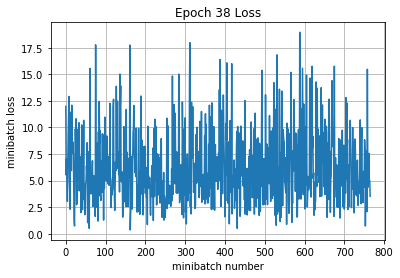

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 29200: with minibatch training loss = 0.119 and accuracy of 0.95
Iteration 29300: with minibatch training loss = 0.197 and accuracy of 0.94
Iteration 29400: with minibatch training loss = 0.0517 and accuracy of 0.98
Iteration 29500: with minibatch training loss = 0.0704 and accuracy of 0.95
Iteration 29600: with minibatch training loss = 0.0726 and accuracy of 0.98
Iteration 29700: with minibatch training loss = 0.0501 and accuracy of 0.98
Iteration 29800: with minibatch training loss = 0.0974 and accuracy of 0.97
Epoch 39, Overall loss = 0.0947 and accuracy of 0.966


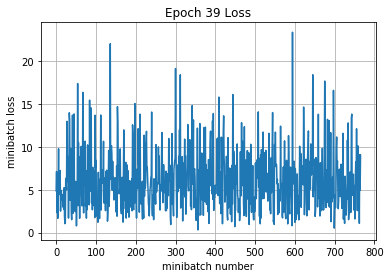

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 29900: with minibatch training loss = 0.0565 and accuracy of 0.98
Iteration 30000: with minibatch training loss = 0.0378 and accuracy of 0.97
Iteration 30100: with minibatch training loss = 0.173 and accuracy of 0.95
Iteration 30200: with minibatch training loss = 0.0793 and accuracy of 0.98
Iteration 30300: with minibatch training loss = 0.0249 and accuracy of 1
Iteration 30400: with minibatch training loss = 0.038 and accuracy of 0.98
Iteration 30500: with minibatch training loss = 0.0725 and accuracy of 0.97
Iteration 30600: with minibatch training loss = 0.0432 and accuracy of 1
Epoch 40, Overall loss = 0.0958 and accuracy of 0.967


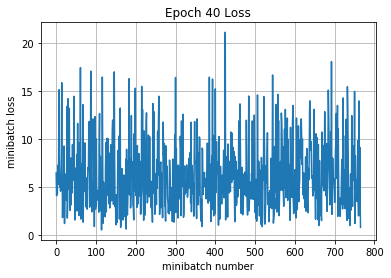

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 30700: with minibatch training loss = 0.0583 and accuracy of 0.97
Iteration 30800: with minibatch training loss = 0.135 and accuracy of 0.97
Iteration 30900: with minibatch training loss = 0.0674 and accuracy of 0.98
Iteration 31000: with minibatch training loss = 0.091 and accuracy of 0.97
Iteration 31100: with minibatch training loss = 0.119 and accuracy of 0.95
Iteration 31200: with minibatch training loss = 0.136 and accuracy of 0.94
Iteration 31300: with minibatch training loss = 0.0221 and accuracy of 1
Iteration 31400: with minibatch training loss = 0.0673 and accuracy of 0.97
Epoch 41, Overall loss = 0.0995 and accuracy of 0.964


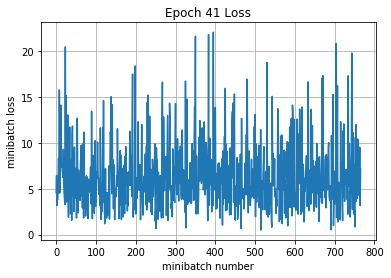

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 31500: with minibatch training loss = 0.0711 and accuracy of 0.98
Iteration 31600: with minibatch training loss = 0.0787 and accuracy of 0.97
Iteration 31700: with minibatch training loss = 0.104 and accuracy of 0.98
Iteration 31800: with minibatch training loss = 0.015 and accuracy of 1
Iteration 31900: with minibatch training loss = 0.0536 and accuracy of 0.97
Iteration 32000: with minibatch training loss = 0.0432 and accuracy of 1
Iteration 32100: with minibatch training loss = 0.146 and accuracy of 0.94
Epoch 42, Overall loss = 0.0984 and accuracy of 0.965


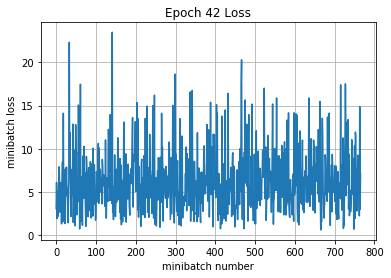

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 32200: with minibatch training loss = 0.0279 and accuracy of 0.98
Iteration 32300: with minibatch training loss = 0.112 and accuracy of 0.95
Iteration 32400: with minibatch training loss = 0.0728 and accuracy of 0.95
Iteration 32500: with minibatch training loss = 0.153 and accuracy of 0.97
Iteration 32600: with minibatch training loss = 0.073 and accuracy of 0.98
Iteration 32700: with minibatch training loss = 0.026 and accuracy of 1
Iteration 32800: with minibatch training loss = 0.0843 and accuracy of 0.97
Iteration 32900: with minibatch training loss = 0.0476 and accuracy of 0.98
Epoch 43, Overall loss = 0.0975 and accuracy of 0.965


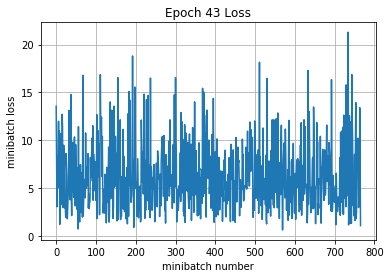

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 33000: with minibatch training loss = 0.028 and accuracy of 1
Iteration 33100: with minibatch training loss = 0.0183 and accuracy of 1
Iteration 33200: with minibatch training loss = 0.0514 and accuracy of 0.97
Iteration 33300: with minibatch training loss = 0.113 and accuracy of 0.95
Iteration 33400: with minibatch training loss = 0.0571 and accuracy of 0.97
Iteration 33500: with minibatch training loss = 0.169 and accuracy of 0.94
Iteration 33600: with minibatch training loss = 0.0635 and accuracy of 0.98
Iteration 33700: with minibatch training loss = 0.0398 and accuracy of 0.98
Epoch 44, Overall loss = 0.0976 and accuracy of 0.965


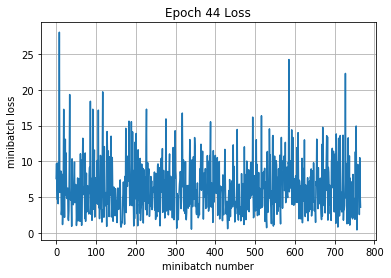

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 33800: with minibatch training loss = 0.121 and accuracy of 0.94
Iteration 33900: with minibatch training loss = 0.119 and accuracy of 0.94
Iteration 34000: with minibatch training loss = 0.0492 and accuracy of 0.97
Iteration 34100: with minibatch training loss = 0.0755 and accuracy of 0.97
Iteration 34200: with minibatch training loss = 0.0805 and accuracy of 0.95
Iteration 34300: with minibatch training loss = 0.176 and accuracy of 0.89
Iteration 34400: with minibatch training loss = 0.169 and accuracy of 0.94
Epoch 45, Overall loss = 0.0999 and accuracy of 0.963


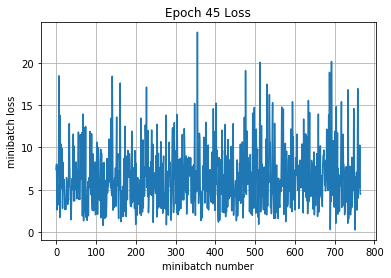

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 34500: with minibatch training loss = 0.0779 and accuracy of 0.98
Iteration 34600: with minibatch training loss = 0.101 and accuracy of 0.95
Iteration 34700: with minibatch training loss = 0.021 and accuracy of 1
Iteration 34800: with minibatch training loss = 0.12 and accuracy of 0.94
Iteration 34900: with minibatch training loss = 0.0582 and accuracy of 0.97
Iteration 35000: with minibatch training loss = 0.0941 and accuracy of 0.95
Iteration 35100: with minibatch training loss = 0.062 and accuracy of 0.97
Iteration 35200: with minibatch training loss = 0.102 and accuracy of 0.95
Epoch 46, Overall loss = 0.096 and accuracy of 0.966


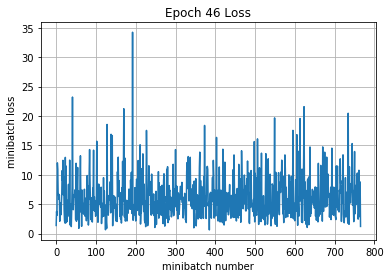

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 35300: with minibatch training loss = 0.0444 and accuracy of 0.98
Iteration 35400: with minibatch training loss = 0.0436 and accuracy of 0.98
Iteration 35500: with minibatch training loss = 0.0723 and accuracy of 0.98
Iteration 35600: with minibatch training loss = 0.0248 and accuracy of 1
Iteration 35700: with minibatch training loss = 0.00991 and accuracy of 1
Iteration 35800: with minibatch training loss = 0.128 and accuracy of 0.95
Iteration 35900: with minibatch training loss = 0.131 and accuracy of 0.95
Iteration 36000: with minibatch training loss = 0.105 and accuracy of 0.95
Epoch 47, Overall loss = 0.0943 and accuracy of 0.966


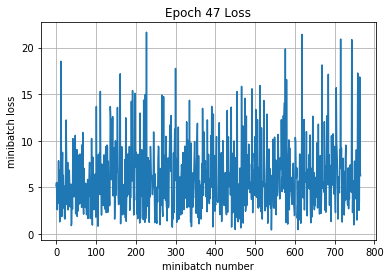

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 36100: with minibatch training loss = 0.19 and accuracy of 0.95
Iteration 36200: with minibatch training loss = 0.176 and accuracy of 0.92
Iteration 36300: with minibatch training loss = 0.143 and accuracy of 0.95
Iteration 36400: with minibatch training loss = 0.071 and accuracy of 0.97
Iteration 36500: with minibatch training loss = 0.162 and accuracy of 0.94
Iteration 36600: with minibatch training loss = 0.0508 and accuracy of 0.97
Iteration 36700: with minibatch training loss = 0.134 and accuracy of 0.97
Epoch 48, Overall loss = 0.0961 and accuracy of 0.966


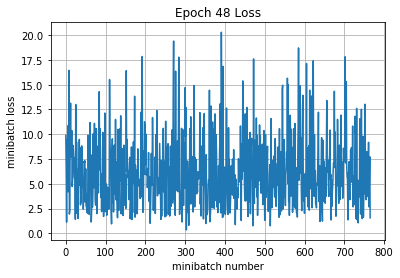

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 36800: with minibatch training loss = 0.0619 and accuracy of 0.98
Iteration 36900: with minibatch training loss = 0.0812 and accuracy of 0.95
Iteration 37000: with minibatch training loss = 0.151 and accuracy of 0.92
Iteration 37100: with minibatch training loss = 0.124 and accuracy of 0.98
Iteration 37200: with minibatch training loss = 0.175 and accuracy of 0.94
Iteration 37300: with minibatch training loss = 0.0269 and accuracy of 1
Iteration 37400: with minibatch training loss = 0.0539 and accuracy of 0.98
Iteration 37500: with minibatch training loss = 0.0981 and accuracy of 0.95
Epoch 49, Overall loss = 0.0937 and accuracy of 0.967


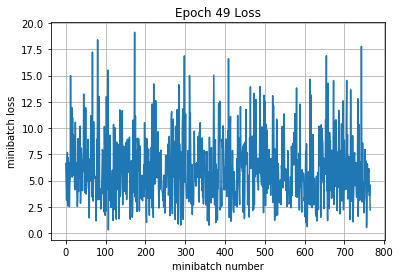

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 37600: with minibatch training loss = 0.0959 and accuracy of 0.98
Iteration 37700: with minibatch training loss = 0.0543 and accuracy of 0.98
Iteration 37800: with minibatch training loss = 0.207 and accuracy of 0.95
Iteration 37900: with minibatch training loss = 0.0353 and accuracy of 1
Iteration 38000: with minibatch training loss = 0.353 and accuracy of 0.88
Iteration 38100: with minibatch training loss = 0.084 and accuracy of 0.97
Iteration 38200: with minibatch training loss = 0.0566 and accuracy of 1
Epoch 50, Overall loss = 0.0955 and accuracy of 0.966


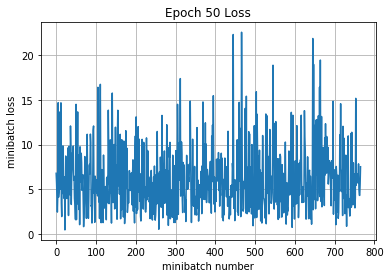

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
training time (seconds) 16950.487533999985
Validation
Epoch 1, Overall loss = 0.868 and accuracy of 0.815
validation time (seconds) 2.710885899985442
predict
Epoch 1, Overall loss = 0.000591 and accuracy of 1


In [107]:
def different_lr_for_deeper_net(X, y, is_training, dropout=None, **kwargs):
    out = X

    # 32
    out, [W1, b1] = cnn(idx=1, X=out, filters=32, kernel_size=(3,3), is_training=is_training, padding='VALID',
                        dropout=dropout)
    # 30
    out, _ = cnn(idx=2, X=out, filters=32, kernel_size=(3,3), is_training=is_training, padding='VALID',
                        dropout=dropout)
    # 28
    out = tf.nn.max_pool(out, ksize=(1,2,2,1), strides=(1,2,2,1), padding='SAME')

    # 14
    out, _ = cnn(idx=3, X=out, filters=64, kernel_size=(5,5), is_training=is_training, padding='VALID',
                        dropout=dropout)
    # 10
    out, _ = cnn(idx=4, X=out, filters=64, kernel_size=(5,5), is_training=is_training, padding='VALID',
                        dropout=dropout)
    # 6
    out, _ = cnn(idx=5, X=out, filters=128, kernel_size=(5,5), is_training=is_training, padding='VALID',
                        dropout=dropout)
    # 2
    # Affine layer from 2x2x128 = 512 (?) to 1024 outputs
    out, _ = affine(1, out, output_size=1024)

    # ReLU Activation Layer
    out = tf.nn.relu(out)

    out = tf.layers.batch_normalization(out, training=is_training)
    if dropout is not None:    
        out = tf.layers.dropout(out, rate=dropout, training=is_training)
    # 5)
    # Affine layer from 1024 input units to 10 outputs
    out, _ = affine(2, out, output_size=10)
    return out, [W1]

long_running_models_3 = []

long_running_models_3.append(estimate_model({
    'group': 'cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5',
    'name': 'lr: 5e-4',
    'dropout': 0.2,
    'model_builder': different_lr_for_deeper_net,
    'learning_rate': 1e-6,
    'num_of_epochs': 50,
}, X_train, y_train, X_val, y_val))

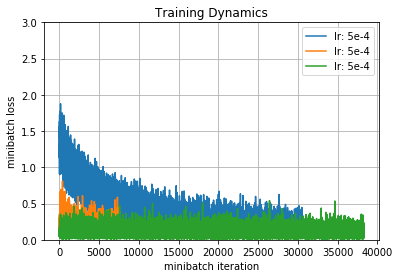

model: lr: 5e-4


,num_of_trainable,predict,training,validation
time,907050,0.238086,12718.8,2.18764
total_correct,907050,NaN,0.939224,0.769
total_lost,907050,NaN,0.169539,1.01335


model: lr: 5e-4


,num_of_trainable,predict,training,validation
time,907050,0.244091,3315.29,2.01255
total_correct,907050,NaN,0.936735,0.79
total_lost,907050,NaN,0.174325,0.88923


model: lr: 5e-4


,num_of_trainable,predict,training,validation
time,907050,0.336308,16950.5,2.71089
total_correct,907050,NaN,0.965816,0.815
total_lost,907050,NaN,0.0954719,0.868377


Model lr: 5e-4


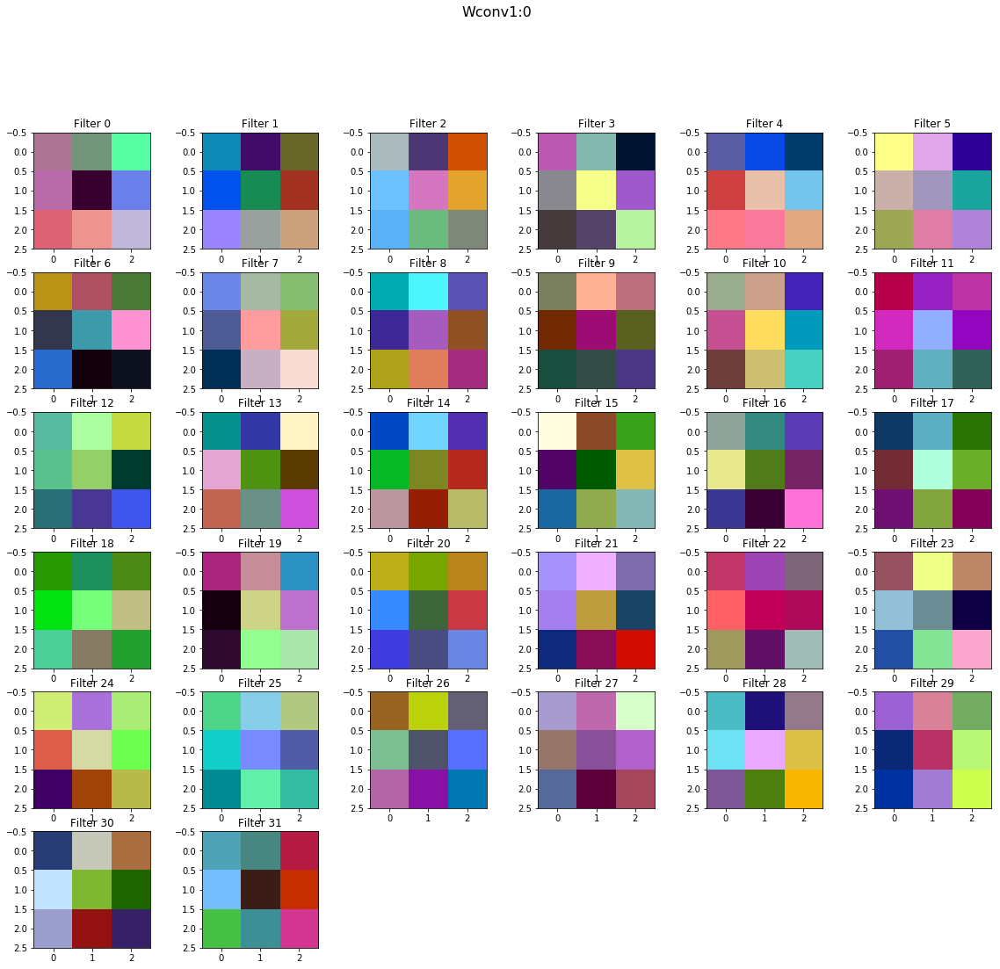

Model lr: 5e-4


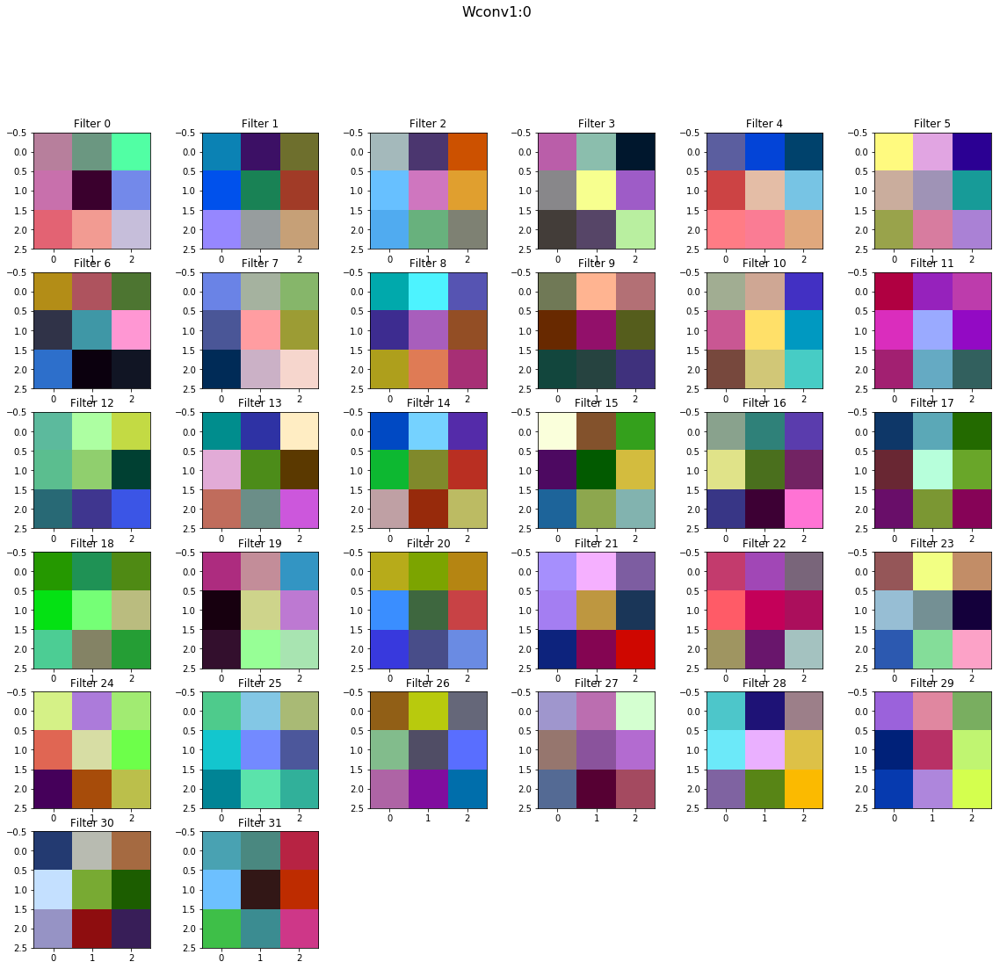

Model lr: 5e-4


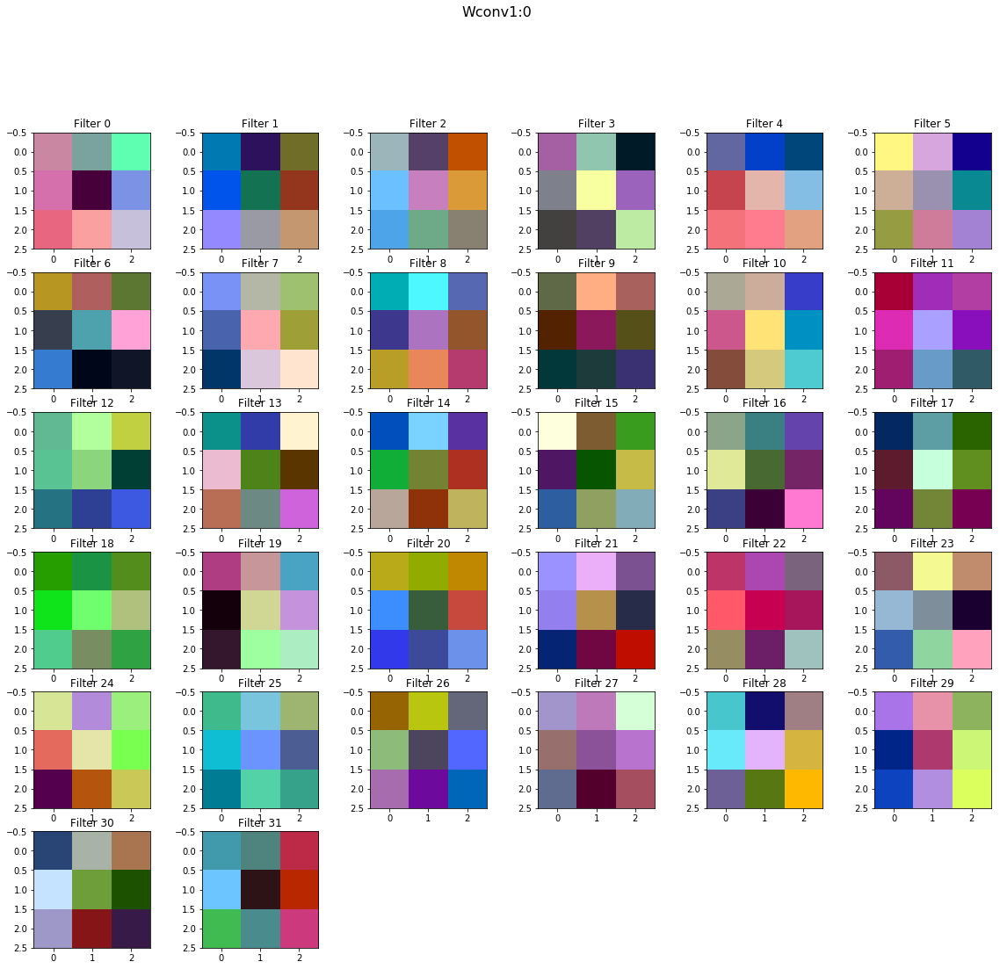

In [108]:
models = [long_running_models[0], long_running_models_2[0], long_running_models_3[0]]
show_graphs(models, ymax=3)
show_tables(models)
draw_layers_of_models(models)

Training
INFO:tensorflow:Restoring parameters from ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
restored snapshot ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 0: with minibatch training loss = 0.121 and accuracy of 0.94
Iteration 100: with minibatch training loss = 0.0549 and accuracy of 0.97
Iteration 200: with minibatch training loss = 0.026 and accuracy of 1
Iteration 300: with minibatch training loss = 0.137 and accuracy of 0.92
Iteration 400: with minibatch training loss = 0.114 and accuracy of 0.95
Iteration 500: with minibatch training loss = 0.151 and accuracy of 0.94
Iteration 600: with minibatch training loss = 0.155 and accuracy of 0.94
Iteration 700: with minibatch training loss = 0.13 and accuracy of 0.95
Epoch 1, Overall loss = 0.0981 and accuracy of 0.965


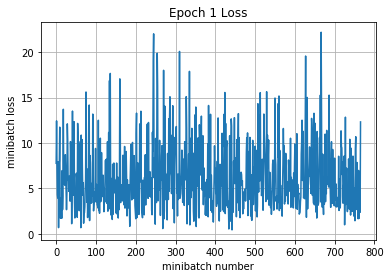

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 800: with minibatch training loss = 0.138 and accuracy of 0.98
Iteration 900: with minibatch training loss = 0.125 and accuracy of 0.92
Iteration 1000: with minibatch training loss = 0.203 and accuracy of 0.92
Iteration 1100: with minibatch training loss = 0.0416 and accuracy of 0.97
Iteration 1200: with minibatch training loss = 0.0333 and accuracy of 1
Iteration 1300: with minibatch training loss = 0.137 and accuracy of 0.95
Iteration 1400: with minibatch training loss = 0.0694 and accuracy of 0.98
Iteration 1500: with minibatch training loss = 0.0221 and accuracy of 1
Epoch 2, Overall loss = 0.0958 and accuracy of 0.965


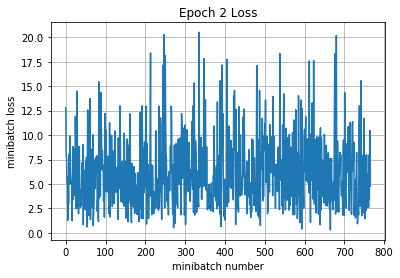

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 1600: with minibatch training loss = 0.0209 and accuracy of 1
Iteration 1700: with minibatch training loss = 0.0569 and accuracy of 0.98
Iteration 1800: with minibatch training loss = 0.0388 and accuracy of 1
Iteration 1900: with minibatch training loss = 0.0716 and accuracy of 0.97
Iteration 2000: with minibatch training loss = 0.0228 and accuracy of 1
Iteration 2100: with minibatch training loss = 0.0932 and accuracy of 0.98
Iteration 2200: with minibatch training loss = 0.245 and accuracy of 0.97
Epoch 3, Overall loss = 0.0974 and accuracy of 0.966


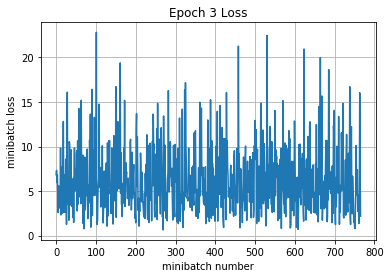

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 2300: with minibatch training loss = 0.0915 and accuracy of 0.97
Iteration 2400: with minibatch training loss = 0.0728 and accuracy of 0.97
Iteration 2500: with minibatch training loss = 0.189 and accuracy of 0.97
Iteration 2600: with minibatch training loss = 0.115 and accuracy of 0.97
Iteration 2700: with minibatch training loss = 0.0584 and accuracy of 0.98
Iteration 2800: with minibatch training loss = 0.0489 and accuracy of 1
Iteration 2900: with minibatch training loss = 0.199 and accuracy of 0.95
Iteration 3000: with minibatch training loss = 0.0591 and accuracy of 0.97
Epoch 4, Overall loss = 0.094 and accuracy of 0.968


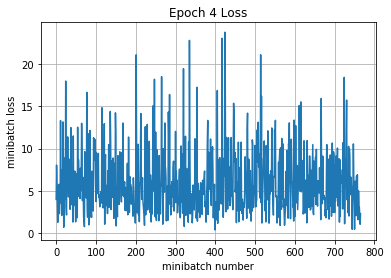

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
Iteration 3100: with minibatch training loss = 0.0443 and accuracy of 0.98
Iteration 3200: with minibatch training loss = 0.097 and accuracy of 0.98
Iteration 3300: with minibatch training loss = 0.106 and accuracy of 0.97
Iteration 3400: with minibatch training loss = 0.144 and accuracy of 0.95
Iteration 3500: with minibatch training loss = 0.163 and accuracy of 0.94
Iteration 3600: with minibatch training loss = 0.025 and accuracy of 1
Iteration 3700: with minibatch training loss = 0.173 and accuracy of 0.94
Iteration 3800: with minibatch training loss = 0.159 and accuracy of 0.94
Epoch 5, Overall loss = 0.0976 and accuracy of 0.966


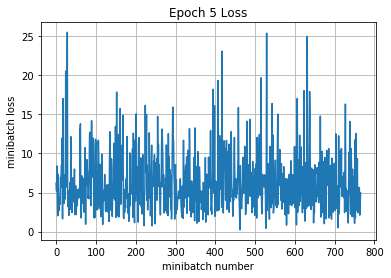

Model saved in path: ./snapshots/cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5/lr-5e-4/model
training time (seconds) 1766.4130833999952
Validation
Epoch 1, Overall loss = 0.874 and accuracy of 0.817
validation time (seconds) 2.063517300004605
predict
Epoch 1, Overall loss = 0.00056 and accuracy of 1


In [110]:
def different_lr_for_deeper_net(X, y, is_training, dropout=None, **kwargs):
    out = X

    # 32
    out, [W1, b1] = cnn(idx=1, X=out, filters=32, kernel_size=(3,3), is_training=is_training, padding='VALID',
                        dropout=dropout)
    # 30
    out, _ = cnn(idx=2, X=out, filters=32, kernel_size=(3,3), is_training=is_training, padding='VALID',
                        dropout=dropout)
    # 28
    out = tf.nn.max_pool(out, ksize=(1,2,2,1), strides=(1,2,2,1), padding='SAME')

    # 14
    out, _ = cnn(idx=3, X=out, filters=64, kernel_size=(5,5), is_training=is_training, padding='VALID',
                        dropout=dropout)
    # 10
    out, _ = cnn(idx=4, X=out, filters=64, kernel_size=(5,5), is_training=is_training, padding='VALID',
                        dropout=dropout)
    # 6
    out, _ = cnn(idx=5, X=out, filters=128, kernel_size=(5,5), is_training=is_training, padding='VALID',
                        dropout=dropout)
    # 2
    # Affine layer from 2x2x128 = 512 (?) to 1024 outputs
    out, _ = affine(1, out, output_size=1024)

    # ReLU Activation Layer
    out = tf.nn.relu(out)

    out = tf.layers.batch_normalization(out, training=is_training)
    if dropout is not None:    
        out = tf.layers.dropout(out, rate=dropout, training=is_training)
    # 5)
    # Affine layer from 1024 input units to 10 outputs
    out, _ = affine(2, out, output_size=10)
    return out, [W1]

long_running_models_4 = []

long_running_models_4.append(estimate_model({
    'group': 'cnn32x3x3-cnn32x3x3-maxpoll-cnn64x5x5-cnn64x5x5-cnn128x5x5',
    'name': 'lr: 5e-4',
    'dropout': 0.2,
    'model_builder': different_lr_for_deeper_net,
    'learning_rate': 1e-6,
    'num_of_epochs': 5,
}, X_train, y_train, X_val, y_val))

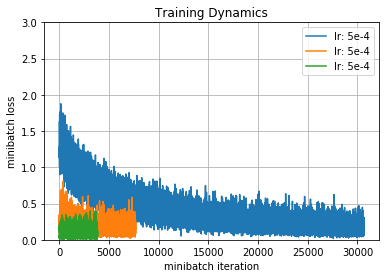

model: lr: 5e-4


,num_of_trainable,predict,training,validation
time,907050,0.238086,12718.8,2.18764
total_correct,907050,NaN,0.939224,0.769
total_lost,907050,NaN,0.169539,1.01335


model: lr: 5e-4


,num_of_trainable,predict,training,validation
time,907050,0.244091,3315.29,2.01255
total_correct,907050,NaN,0.936735,0.79
total_lost,907050,NaN,0.174325,0.88923


model: lr: 5e-4


,num_of_trainable,predict,training,validation
time,907050,0.300007,1766.41,2.06352
total_correct,907050,NaN,0.965898,0.817
total_lost,907050,NaN,0.0975853,0.873574


Model lr: 5e-4


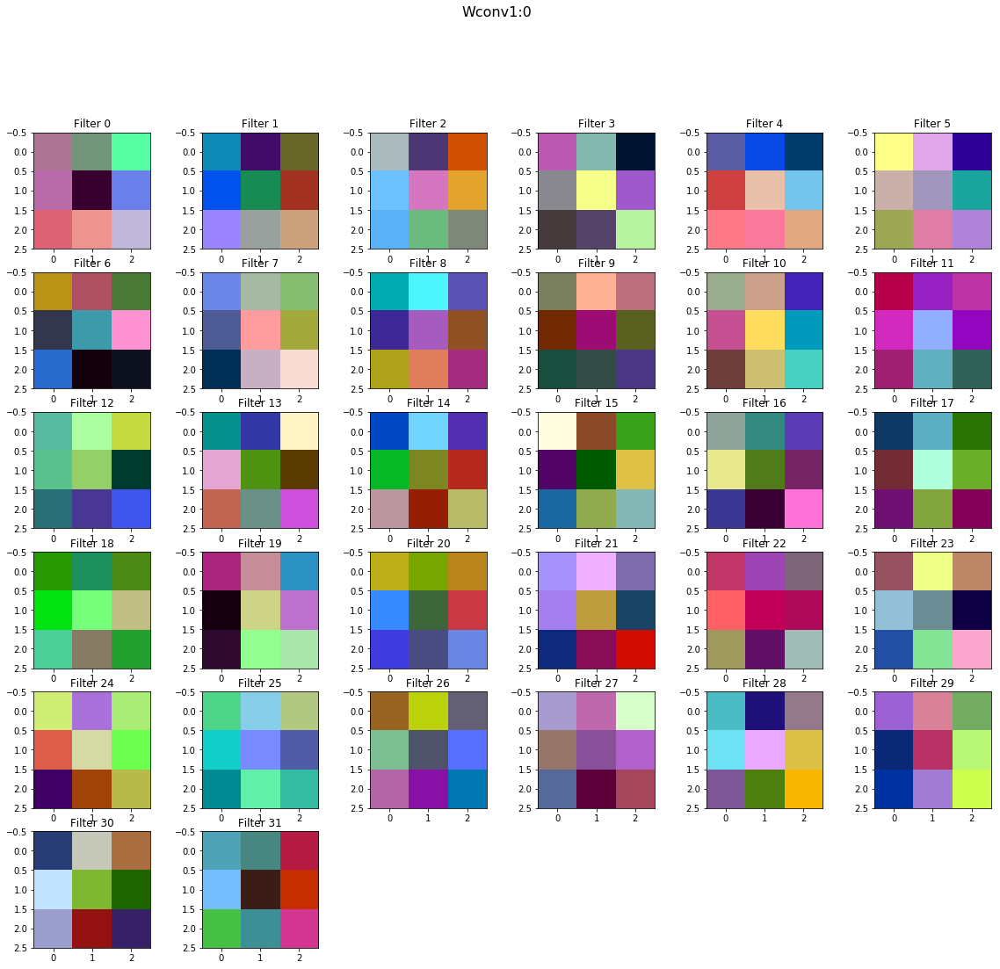

Model lr: 5e-4


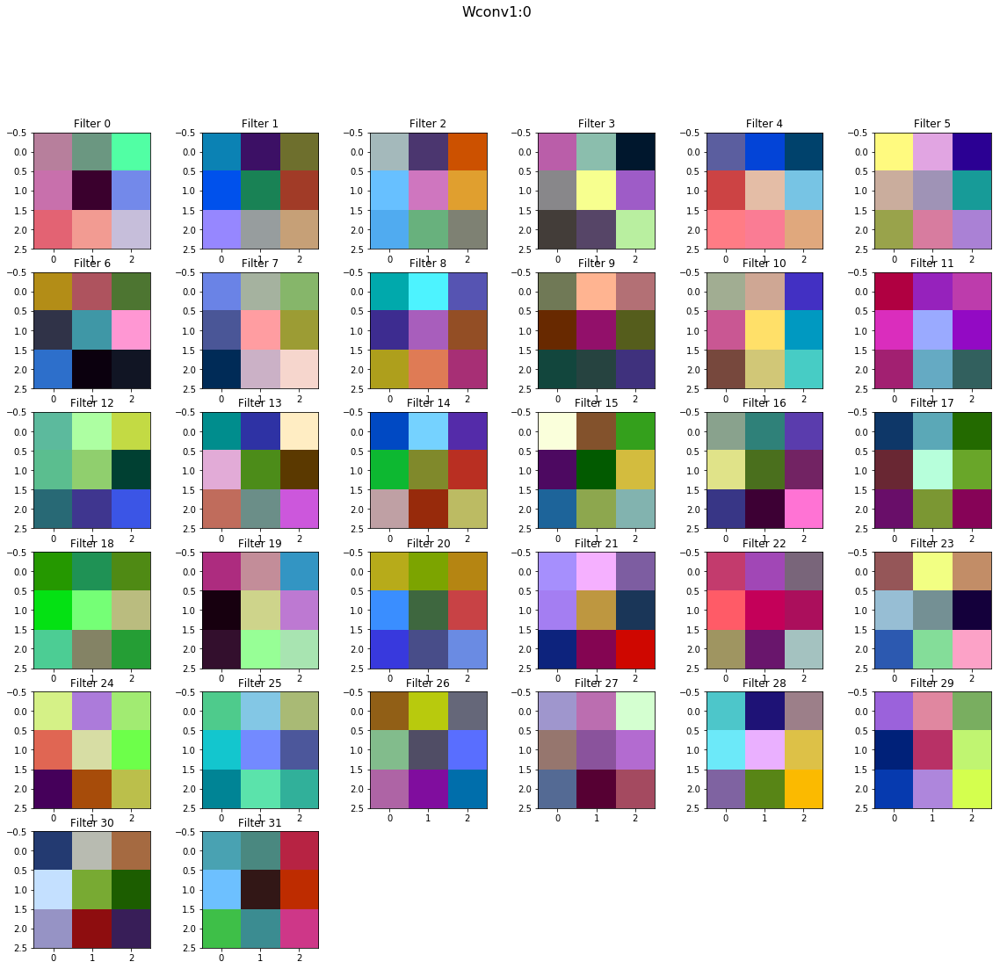

Model lr: 5e-4


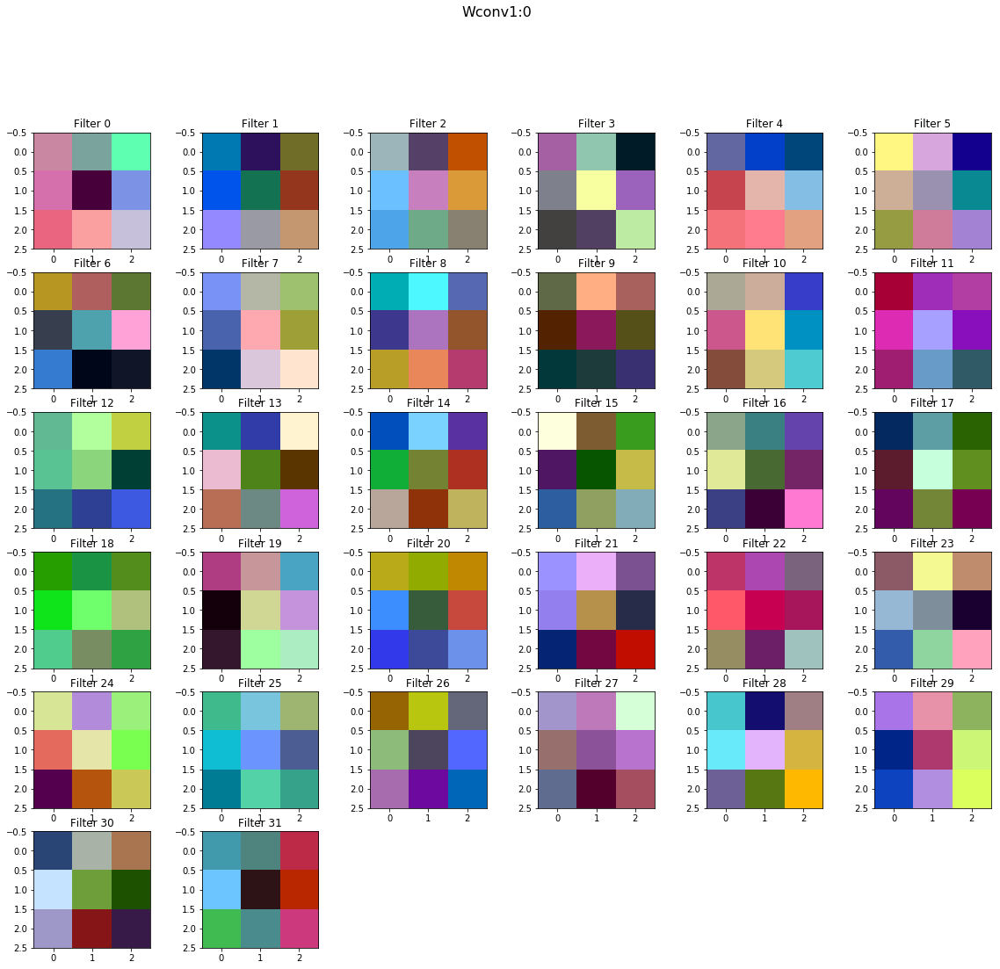

In [112]:
models = [long_running_models[0], long_running_models_2[0], long_running_models_4[0]]
show_graphs(models, ymax=3)
show_tables(models)
draw_layers_of_models(models)

Training
INFO:tensorflow:Restoring parameters from ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.2/model
restored snapshot ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.2/model
Iteration 0: with minibatch training loss = 0.668 and accuracy of 0.78
Iteration 100: with minibatch training loss = 0.831 and accuracy of 0.7
Iteration 200: with minibatch training loss = 1.22 and accuracy of 0.61
Iteration 300: with minibatch training loss = 0.78 and accuracy of 0.75
Iteration 400: with minibatch training loss = 0.878 and accuracy of 0.64
Iteration 500: with minibatch training loss = 0.669 and accuracy of 0.73
Iteration 600: with minibatch training loss = 0.788 and accuracy of 0.69
Iteration 700: with minibatch training loss = 0.913 and accuracy of 0.62
Epoch 1, Overall loss = 0.787 and accuracy of 0.724


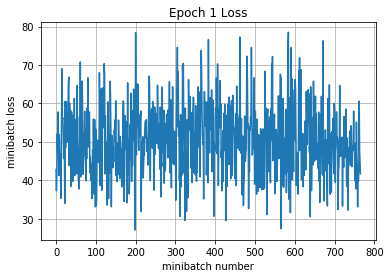

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.2/model
Iteration 800: with minibatch training loss = 0.728 and accuracy of 0.73
Iteration 900: with minibatch training loss = 0.742 and accuracy of 0.72
Iteration 1000: with minibatch training loss = 0.938 and accuracy of 0.66
Iteration 1100: with minibatch training loss = 0.747 and accuracy of 0.77
Iteration 1200: with minibatch training loss = 0.802 and accuracy of 0.73
Iteration 1300: with minibatch training loss = 0.691 and accuracy of 0.75
Iteration 1400: with minibatch training loss = 0.942 and accuracy of 0.69
Iteration 1500: with minibatch training loss = 0.423 and accuracy of 0.86
Epoch 2, Overall loss = 0.707 and accuracy of 0.753


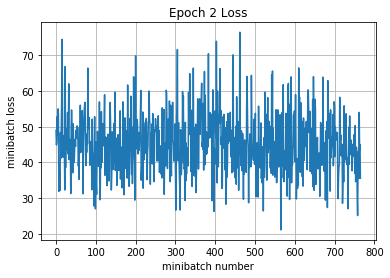

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.2/model
training time (seconds) 842.1076505000092
Validation
Epoch 1, Overall loss = 0.82 and accuracy of 0.738
validation time (seconds) 2.841937200006214
predict
Epoch 1, Overall loss = 0.0103 and accuracy of 1
Training
INFO:tensorflow:Restoring parameters from ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
restored snapshot ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 0: with minibatch training loss = 0.942 and accuracy of 0.67
Iteration 100: with minibatch training loss = 0.753 and accuracy of 0.75
Iteration 200: with minibatch training loss = 0.889 and accuracy of 0.7
Iteration 300: with minibatch training loss = 1.28 and accuracy of 0.53
Iteration 400: with minibatch training loss = 0.856 and accuracy of 0.72
Iteration 500: with minibatch training loss = 0.856 and accuracy of 0.75
Iteration 600: with minibatch training loss = 

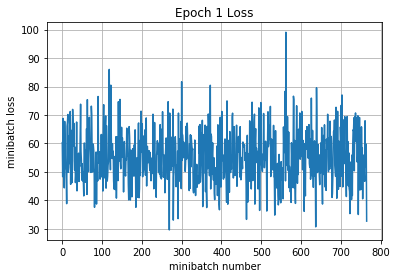

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 800: with minibatch training loss = 0.756 and accuracy of 0.73
Iteration 900: with minibatch training loss = 0.66 and accuracy of 0.78
Iteration 1000: with minibatch training loss = 0.75 and accuracy of 0.75
Iteration 1100: with minibatch training loss = 0.886 and accuracy of 0.75
Iteration 1200: with minibatch training loss = 0.778 and accuracy of 0.78
Iteration 1300: with minibatch training loss = 0.592 and accuracy of 0.84
Iteration 1400: with minibatch training loss = 0.884 and accuracy of 0.73
Iteration 1500: with minibatch training loss = 0.815 and accuracy of 0.7
Epoch 2, Overall loss = 0.791 and accuracy of 0.723


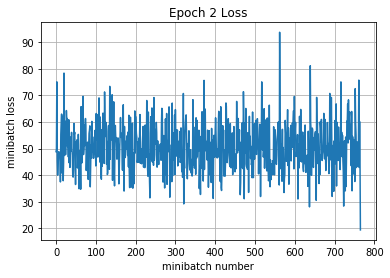

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
training time (seconds) 737.8858521999937
Validation
Epoch 1, Overall loss = 0.744 and accuracy of 0.742
validation time (seconds) 2.1622930000012275
predict
Epoch 1, Overall loss = 0.0176 and accuracy of 1


In [86]:
def cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5_model(X, y, is_training, 
                                                                               dropout=None,
                                                                               **kwargs):
    out = X

    #32
    out, [W1, b1] = cnn(idx=1, X=out, filters=32, kernel_size=(5,5), is_training=is_training, padding='VALID')
    #28
    if dropout is not None:
        out = tf.layers.dropout(out, rate=dropout, training=is_training)
    out, _ = cnn(idx=2, X=out, filters=32, kernel_size=(5,5), is_training=is_training, padding='VALID')
    #24
    out = tf.nn.max_pool(out, ksize=(1,2,2,1), strides=(1,2,2,1), padding='SAME')
    #12
    if dropout is not None:    
        out = tf.layers.dropout(out, rate=dropout, training=is_training)
    out, _ = cnn(idx=3, X=out, filters=64, kernel_size=(5,5), is_training=is_training, padding='VALID')
    #8
    if dropout is not None:    
        out = tf.layers.dropout(out, rate=dropout, training=is_training)
    out, _ = cnn(idx=4, X=out, filters=128, kernel_size=(5,5), is_training=is_training, padding='VALID')
    #4
    if dropout is not None:    
        out = tf.layers.dropout(out, rate=dropout, training=is_training)

    # Affine layer from 4x4x128 = 2,048 to 1024 outputs
    out, _ = affine(1, out, output_size=1024)

    # ReLU Activation Layer
    out = tf.nn.relu(out)

    out = tf.layers.batch_normalization(out, training=is_training)
    if dropout is not None:    
        out = tf.layers.dropout(out, rate=dropout, training=is_training)
    # 5)
    # Affine layer from 1024 input units to 10 outputs
    out, _ = affine(2, out, output_size=10)
    return out, [W1]

cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5_models = []

cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5_models.append(estimate_model({
    'group': 'cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5',
    'name': 'dropout: 0.2',
    'dropout': 0.2,
    'model_builder': cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5_model,
    'learning_rate': 5e-4,
    'num_of_epochs': 2,
}, X_train, y_train, X_val, y_val))

cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5_models.append(estimate_model({
    'group': 'cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5',    
    'name': 'dropout: 0.3',
    'dropout': 0.3,
    'model_builder': cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5_model,
    'learning_rate': 5e-4,
    'num_of_epochs': 2,
}, X_train, y_train, X_val, y_val))

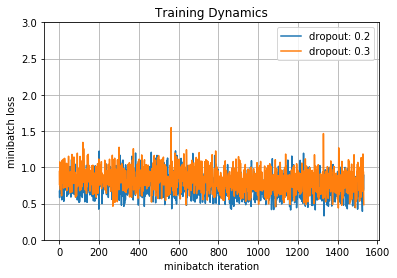

model: dropout: 0.2


,num_of_trainable,predict,training,validation
time,2395242,0.259351,842.108,2.84194
total_correct,2395242,NaN,0.75298,0.738
total_lost,2395242,NaN,0.706554,0.81988


model: dropout: 0.3


,num_of_trainable,predict,training,validation
time,2395242,0.235614,737.886,2.16229
total_correct,2395242,NaN,0.723306,0.742
total_lost,2395242,NaN,0.790806,0.744174


Model dropout: 0.2


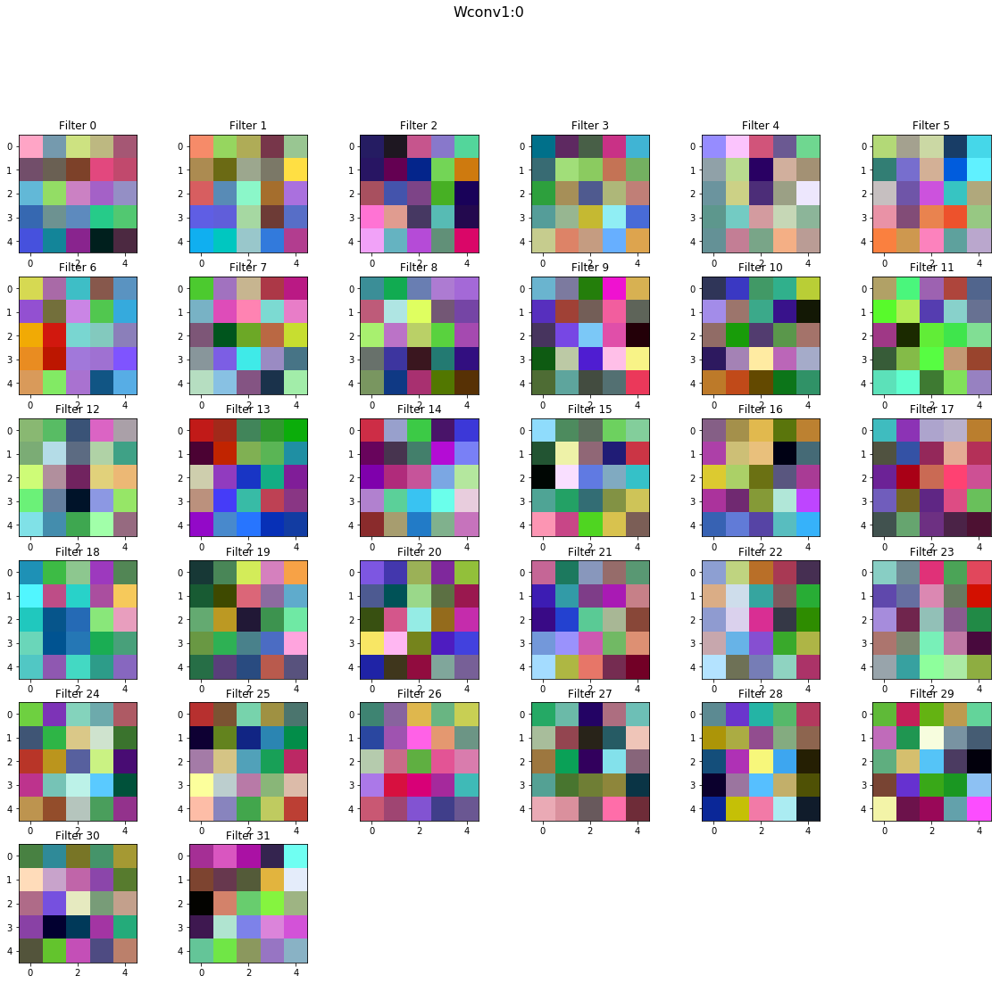

Model dropout: 0.3


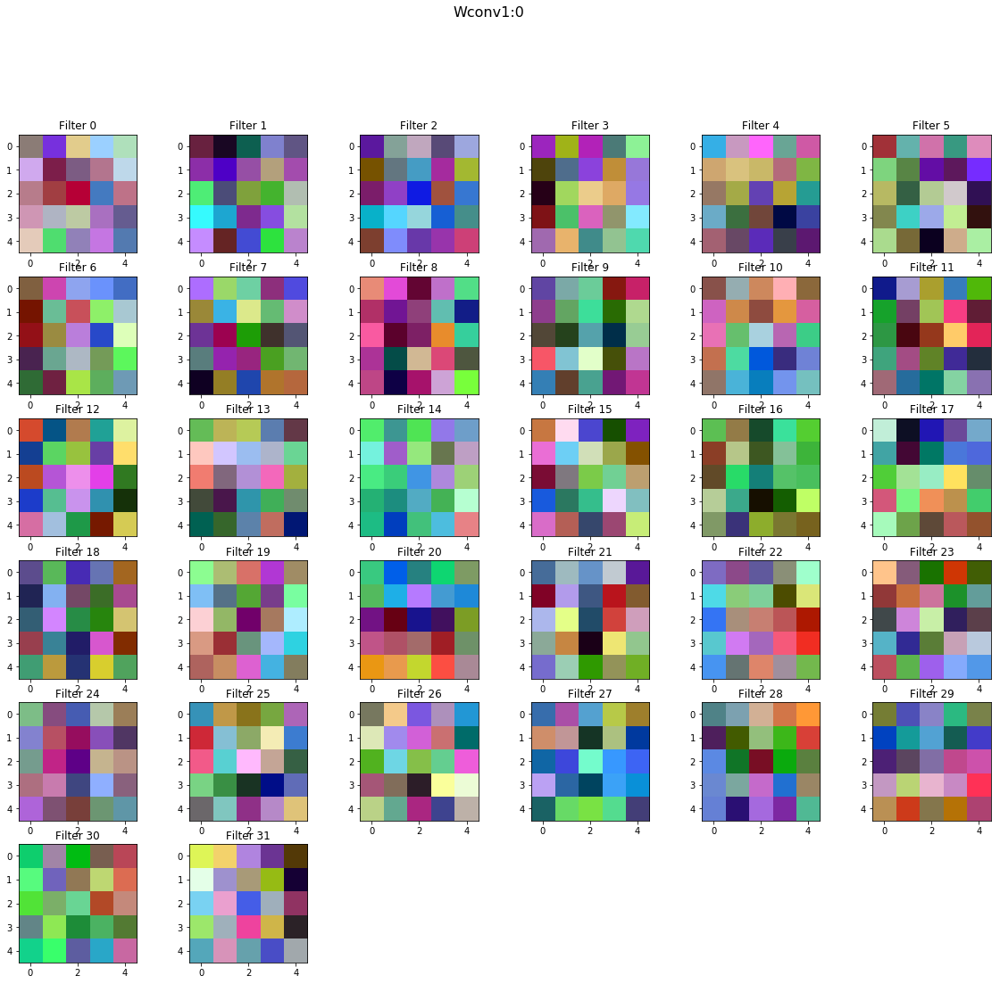

In [87]:
show_graphs(cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5_models, ymax=3)
show_tables(cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5_models)
draw_layers_of_models(cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5_models)

Training
INFO:tensorflow:Restoring parameters from ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
restored snapshot ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 0: with minibatch training loss = 0.508 and accuracy of 0.81
Iteration 100: with minibatch training loss = 0.76 and accuracy of 0.72
Iteration 200: with minibatch training loss = 0.834 and accuracy of 0.67
Iteration 300: with minibatch training loss = 0.614 and accuracy of 0.78
Iteration 400: with minibatch training loss = 0.738 and accuracy of 0.73
Iteration 500: with minibatch training loss = 1.06 and accuracy of 0.62
Iteration 600: with minibatch training loss = 0.999 and accuracy of 0.67
Iteration 700: with minibatch training loss = 0.68 and accuracy of 0.75
Epoch 1, Overall loss = 0.758 and accuracy of 0.733


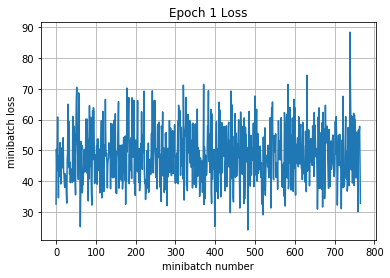

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 800: with minibatch training loss = 0.62 and accuracy of 0.81
Iteration 900: with minibatch training loss = 0.771 and accuracy of 0.73
Iteration 1000: with minibatch training loss = 0.445 and accuracy of 0.91
Iteration 1100: with minibatch training loss = 0.854 and accuracy of 0.67
Iteration 1200: with minibatch training loss = 0.936 and accuracy of 0.62
Iteration 1300: with minibatch training loss = 0.556 and accuracy of 0.78
Iteration 1400: with minibatch training loss = 0.807 and accuracy of 0.72
Iteration 1500: with minibatch training loss = 0.986 and accuracy of 0.66
Epoch 2, Overall loss = 0.705 and accuracy of 0.751


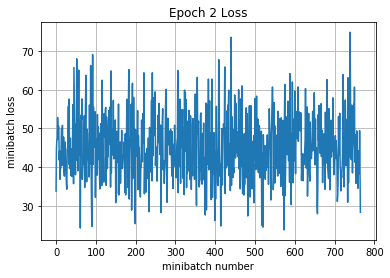

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 1600: with minibatch training loss = 0.509 and accuracy of 0.8
Iteration 1700: with minibatch training loss = 0.519 and accuracy of 0.81
Iteration 1800: with minibatch training loss = 0.807 and accuracy of 0.72
Iteration 1900: with minibatch training loss = 0.53 and accuracy of 0.83
Iteration 2000: with minibatch training loss = 0.547 and accuracy of 0.8
Iteration 2100: with minibatch training loss = 0.429 and accuracy of 0.86
Iteration 2200: with minibatch training loss = 0.811 and accuracy of 0.7
Epoch 3, Overall loss = 0.667 and accuracy of 0.765


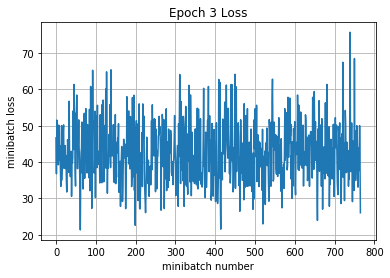

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 2300: with minibatch training loss = 0.626 and accuracy of 0.73
Iteration 2400: with minibatch training loss = 0.719 and accuracy of 0.72
Iteration 2500: with minibatch training loss = 0.678 and accuracy of 0.73
Iteration 2600: with minibatch training loss = 0.544 and accuracy of 0.83
Iteration 2700: with minibatch training loss = 0.603 and accuracy of 0.81
Iteration 2800: with minibatch training loss = 0.795 and accuracy of 0.72
Iteration 2900: with minibatch training loss = 0.373 and accuracy of 0.86
Iteration 3000: with minibatch training loss = 0.907 and accuracy of 0.72
Epoch 4, Overall loss = 0.629 and accuracy of 0.777


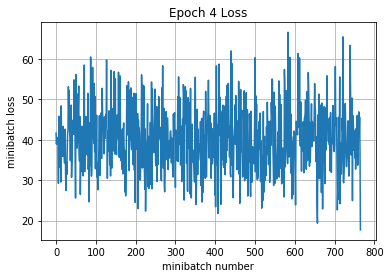

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 3100: with minibatch training loss = 0.542 and accuracy of 0.78
Iteration 3200: with minibatch training loss = 0.64 and accuracy of 0.83
Iteration 3300: with minibatch training loss = 0.665 and accuracy of 0.75
Iteration 3400: with minibatch training loss = 0.821 and accuracy of 0.7
Iteration 3500: with minibatch training loss = 0.647 and accuracy of 0.81
Iteration 3600: with minibatch training loss = 0.839 and accuracy of 0.73
Iteration 3700: with minibatch training loss = 0.675 and accuracy of 0.78
Iteration 3800: with minibatch training loss = 0.571 and accuracy of 0.73
Epoch 5, Overall loss = 0.601 and accuracy of 0.786


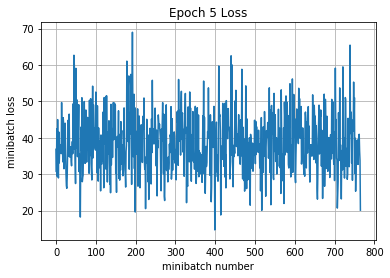

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 3900: with minibatch training loss = 0.525 and accuracy of 0.81
Iteration 4000: with minibatch training loss = 0.597 and accuracy of 0.72
Iteration 4100: with minibatch training loss = 0.447 and accuracy of 0.86
Iteration 4200: with minibatch training loss = 0.642 and accuracy of 0.78
Iteration 4300: with minibatch training loss = 0.593 and accuracy of 0.77
Iteration 4400: with minibatch training loss = 0.451 and accuracy of 0.86
Iteration 4500: with minibatch training loss = 0.335 and accuracy of 0.89
Epoch 6, Overall loss = 0.57 and accuracy of 0.798


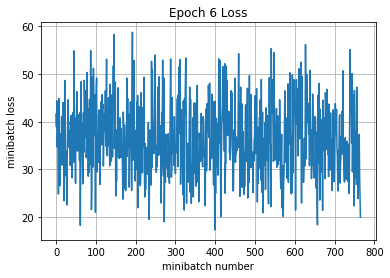

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 4600: with minibatch training loss = 0.585 and accuracy of 0.81
Iteration 4700: with minibatch training loss = 0.635 and accuracy of 0.75
Iteration 4800: with minibatch training loss = 0.513 and accuracy of 0.8
Iteration 4900: with minibatch training loss = 0.704 and accuracy of 0.77
Iteration 5000: with minibatch training loss = 0.391 and accuracy of 0.81
Iteration 5100: with minibatch training loss = 0.615 and accuracy of 0.77
Iteration 5200: with minibatch training loss = 0.481 and accuracy of 0.81
Iteration 5300: with minibatch training loss = 0.627 and accuracy of 0.8
Epoch 7, Overall loss = 0.544 and accuracy of 0.807


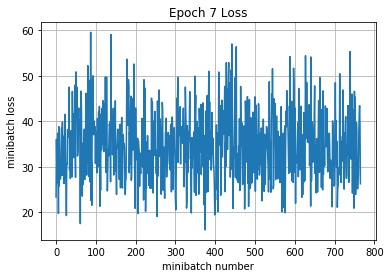

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 5400: with minibatch training loss = 0.579 and accuracy of 0.8
Iteration 5500: with minibatch training loss = 0.849 and accuracy of 0.72
Iteration 5600: with minibatch training loss = 0.454 and accuracy of 0.88
Iteration 5700: with minibatch training loss = 0.695 and accuracy of 0.77
Iteration 5800: with minibatch training loss = 0.428 and accuracy of 0.81
Iteration 5900: with minibatch training loss = 0.482 and accuracy of 0.83
Iteration 6000: with minibatch training loss = 0.491 and accuracy of 0.84
Iteration 6100: with minibatch training loss = 0.724 and accuracy of 0.72
Epoch 8, Overall loss = 0.518 and accuracy of 0.814


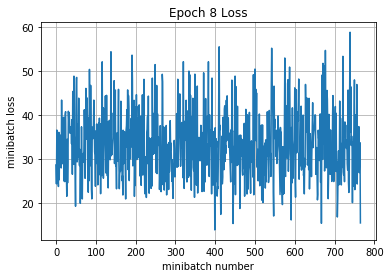

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 6200: with minibatch training loss = 0.43 and accuracy of 0.83
Iteration 6300: with minibatch training loss = 0.488 and accuracy of 0.78
Iteration 6400: with minibatch training loss = 0.357 and accuracy of 0.86
Iteration 6500: with minibatch training loss = 0.49 and accuracy of 0.78
Iteration 6600: with minibatch training loss = 0.516 and accuracy of 0.84
Iteration 6700: with minibatch training loss = 0.42 and accuracy of 0.88
Iteration 6800: with minibatch training loss = 0.412 and accuracy of 0.89
Epoch 9, Overall loss = 0.498 and accuracy of 0.821


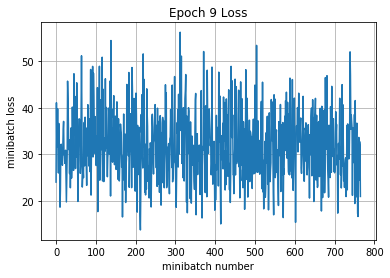

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 6900: with minibatch training loss = 0.478 and accuracy of 0.84
Iteration 7000: with minibatch training loss = 0.435 and accuracy of 0.84
Iteration 7100: with minibatch training loss = 0.364 and accuracy of 0.86
Iteration 7200: with minibatch training loss = 0.537 and accuracy of 0.78
Iteration 7300: with minibatch training loss = 0.279 and accuracy of 0.94
Iteration 7400: with minibatch training loss = 0.486 and accuracy of 0.86
Iteration 7500: with minibatch training loss = 0.584 and accuracy of 0.8
Iteration 7600: with minibatch training loss = 0.361 and accuracy of 0.88
Epoch 10, Overall loss = 0.47 and accuracy of 0.832


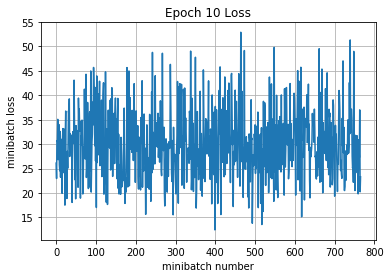

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 7700: with minibatch training loss = 0.457 and accuracy of 0.81
Iteration 7800: with minibatch training loss = 0.367 and accuracy of 0.88
Iteration 7900: with minibatch training loss = 0.617 and accuracy of 0.8
Iteration 8000: with minibatch training loss = 0.488 and accuracy of 0.86
Iteration 8100: with minibatch training loss = 0.767 and accuracy of 0.77
Iteration 8200: with minibatch training loss = 0.506 and accuracy of 0.83
Iteration 8300: with minibatch training loss = 0.544 and accuracy of 0.81
Iteration 8400: with minibatch training loss = 0.451 and accuracy of 0.84
Epoch 11, Overall loss = 0.454 and accuracy of 0.838


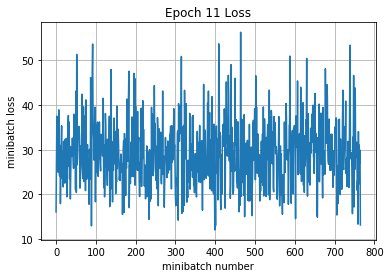

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 8500: with minibatch training loss = 0.558 and accuracy of 0.77
Iteration 8600: with minibatch training loss = 0.381 and accuracy of 0.91
Iteration 8700: with minibatch training loss = 0.396 and accuracy of 0.8
Iteration 8800: with minibatch training loss = 0.296 and accuracy of 0.91
Iteration 8900: with minibatch training loss = 0.264 and accuracy of 0.92
Iteration 9000: with minibatch training loss = 0.432 and accuracy of 0.88
Iteration 9100: with minibatch training loss = 0.485 and accuracy of 0.81
Epoch 12, Overall loss = 0.43 and accuracy of 0.844


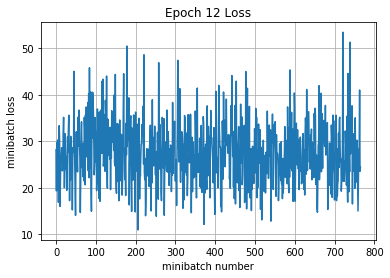

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 9200: with minibatch training loss = 0.243 and accuracy of 0.92
Iteration 9300: with minibatch training loss = 0.364 and accuracy of 0.86
Iteration 9400: with minibatch training loss = 0.387 and accuracy of 0.88
Iteration 9500: with minibatch training loss = 0.519 and accuracy of 0.83
Iteration 9600: with minibatch training loss = 0.386 and accuracy of 0.88
Iteration 9700: with minibatch training loss = 0.327 and accuracy of 0.91
Iteration 9800: with minibatch training loss = 0.527 and accuracy of 0.8
Iteration 9900: with minibatch training loss = 0.315 and accuracy of 0.81
Epoch 13, Overall loss = 0.419 and accuracy of 0.85


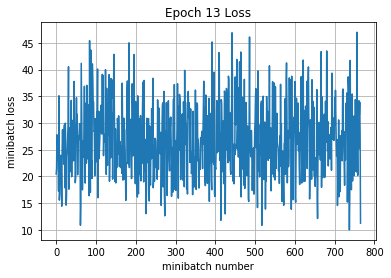

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 10000: with minibatch training loss = 0.377 and accuracy of 0.86
Iteration 10100: with minibatch training loss = 0.36 and accuracy of 0.83
Iteration 10200: with minibatch training loss = 0.619 and accuracy of 0.77
Iteration 10300: with minibatch training loss = 0.426 and accuracy of 0.86
Iteration 10400: with minibatch training loss = 0.688 and accuracy of 0.8
Iteration 10500: with minibatch training loss = 0.403 and accuracy of 0.83
Iteration 10600: with minibatch training loss = 0.372 and accuracy of 0.88
Iteration 10700: with minibatch training loss = 0.429 and accuracy of 0.86
Epoch 14, Overall loss = 0.401 and accuracy of 0.855


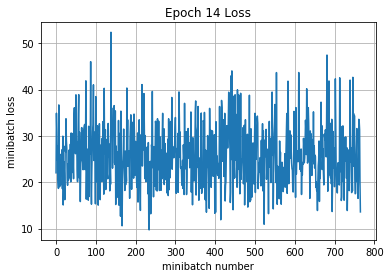

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 10800: with minibatch training loss = 0.379 and accuracy of 0.83
Iteration 10900: with minibatch training loss = 0.586 and accuracy of 0.81
Iteration 11000: with minibatch training loss = 0.445 and accuracy of 0.81
Iteration 11100: with minibatch training loss = 0.385 and accuracy of 0.86
Iteration 11200: with minibatch training loss = 0.347 and accuracy of 0.83
Iteration 11300: with minibatch training loss = 0.321 and accuracy of 0.84
Iteration 11400: with minibatch training loss = 0.486 and accuracy of 0.86
Epoch 15, Overall loss = 0.39 and accuracy of 0.86


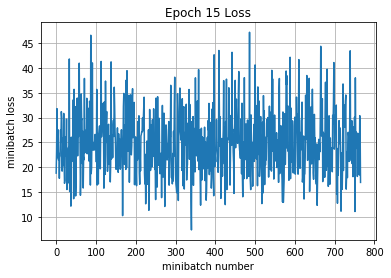

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 11500: with minibatch training loss = 0.46 and accuracy of 0.78
Iteration 11600: with minibatch training loss = 0.502 and accuracy of 0.81
Iteration 11700: with minibatch training loss = 0.371 and accuracy of 0.89
Iteration 11800: with minibatch training loss = 0.284 and accuracy of 0.92
Iteration 11900: with minibatch training loss = 0.447 and accuracy of 0.88
Iteration 12000: with minibatch training loss = 0.363 and accuracy of 0.89
Iteration 12100: with minibatch training loss = 0.382 and accuracy of 0.83
Iteration 12200: with minibatch training loss = 0.301 and accuracy of 0.86
Epoch 16, Overall loss = 0.376 and accuracy of 0.866


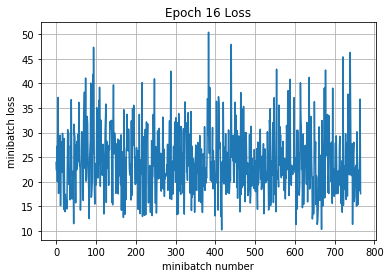

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 12300: with minibatch training loss = 0.19 and accuracy of 0.89
Iteration 12400: with minibatch training loss = 0.554 and accuracy of 0.78
Iteration 12500: with minibatch training loss = 0.336 and accuracy of 0.92
Iteration 12600: with minibatch training loss = 0.373 and accuracy of 0.83
Iteration 12700: with minibatch training loss = 0.361 and accuracy of 0.86
Iteration 12800: with minibatch training loss = 0.547 and accuracy of 0.86
Iteration 12900: with minibatch training loss = 0.39 and accuracy of 0.86
Iteration 13000: with minibatch training loss = 0.551 and accuracy of 0.81
Epoch 17, Overall loss = 0.357 and accuracy of 0.87


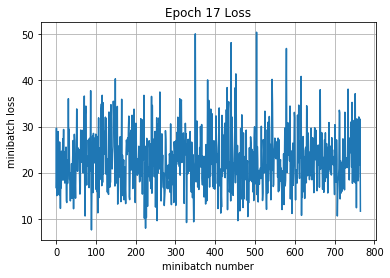

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 13100: with minibatch training loss = 0.438 and accuracy of 0.83
Iteration 13200: with minibatch training loss = 0.334 and accuracy of 0.88
Iteration 13300: with minibatch training loss = 0.346 and accuracy of 0.89
Iteration 13400: with minibatch training loss = 0.353 and accuracy of 0.86
Iteration 13500: with minibatch training loss = 0.351 and accuracy of 0.84
Iteration 13600: with minibatch training loss = 0.337 and accuracy of 0.89
Iteration 13700: with minibatch training loss = 0.425 and accuracy of 0.86
Epoch 18, Overall loss = 0.354 and accuracy of 0.873


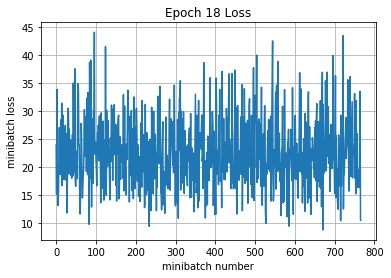

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 13800: with minibatch training loss = 0.312 and accuracy of 0.89
Iteration 13900: with minibatch training loss = 0.383 and accuracy of 0.83
Iteration 14000: with minibatch training loss = 0.387 and accuracy of 0.89
Iteration 14100: with minibatch training loss = 0.297 and accuracy of 0.86
Iteration 14200: with minibatch training loss = 0.322 and accuracy of 0.88
Iteration 14300: with minibatch training loss = 0.367 and accuracy of 0.84
Iteration 14400: with minibatch training loss = 0.348 and accuracy of 0.91
Iteration 14500: with minibatch training loss = 0.328 and accuracy of 0.84
Epoch 19, Overall loss = 0.339 and accuracy of 0.877


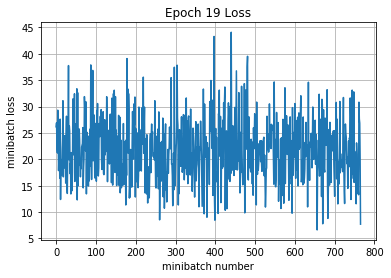

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 14600: with minibatch training loss = 0.368 and accuracy of 0.86
Iteration 14700: with minibatch training loss = 0.363 and accuracy of 0.88
Iteration 14800: with minibatch training loss = 0.515 and accuracy of 0.78
Iteration 14900: with minibatch training loss = 0.336 and accuracy of 0.89
Iteration 15000: with minibatch training loss = 0.397 and accuracy of 0.88
Iteration 15100: with minibatch training loss = 0.138 and accuracy of 0.94
Iteration 15200: with minibatch training loss = 0.468 and accuracy of 0.8
Iteration 15300: with minibatch training loss = 0.215 and accuracy of 0.92
Epoch 20, Overall loss = 0.327 and accuracy of 0.882


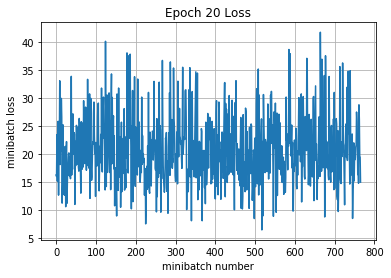

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 15400: with minibatch training loss = 0.224 and accuracy of 0.92
Iteration 15500: with minibatch training loss = 0.249 and accuracy of 0.91
Iteration 15600: with minibatch training loss = 0.303 and accuracy of 0.86
Iteration 15700: with minibatch training loss = 0.176 and accuracy of 0.94
Iteration 15800: with minibatch training loss = 0.273 and accuracy of 0.89
Iteration 15900: with minibatch training loss = 0.418 and accuracy of 0.81
Iteration 16000: with minibatch training loss = 0.454 and accuracy of 0.84
Epoch 21, Overall loss = 0.319 and accuracy of 0.884


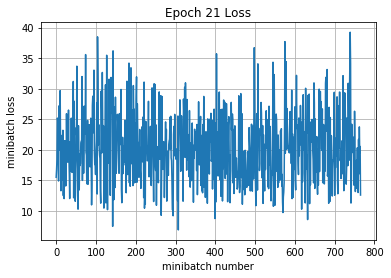

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 16100: with minibatch training loss = 0.581 and accuracy of 0.83
Iteration 16200: with minibatch training loss = 0.414 and accuracy of 0.88
Iteration 16300: with minibatch training loss = 0.442 and accuracy of 0.84
Iteration 16400: with minibatch training loss = 0.515 and accuracy of 0.84
Iteration 16500: with minibatch training loss = 0.131 and accuracy of 0.94
Iteration 16600: with minibatch training loss = 0.3 and accuracy of 0.89
Iteration 16700: with minibatch training loss = 0.233 and accuracy of 0.92
Iteration 16800: with minibatch training loss = 0.288 and accuracy of 0.91
Epoch 22, Overall loss = 0.308 and accuracy of 0.889


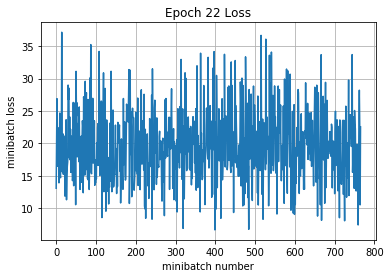

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 16900: with minibatch training loss = 0.175 and accuracy of 0.94
Iteration 17000: with minibatch training loss = 0.362 and accuracy of 0.86
Iteration 17100: with minibatch training loss = 0.315 and accuracy of 0.89
Iteration 17200: with minibatch training loss = 0.18 and accuracy of 0.97
Iteration 17300: with minibatch training loss = 0.29 and accuracy of 0.91
Iteration 17400: with minibatch training loss = 0.367 and accuracy of 0.88
Iteration 17500: with minibatch training loss = 0.331 and accuracy of 0.91
Iteration 17600: with minibatch training loss = 0.279 and accuracy of 0.94
Epoch 23, Overall loss = 0.305 and accuracy of 0.892


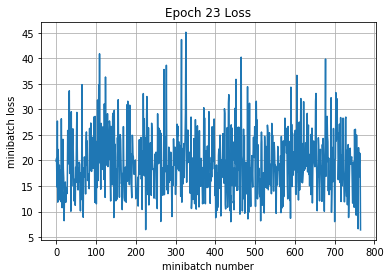

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 17700: with minibatch training loss = 0.332 and accuracy of 0.84
Iteration 17800: with minibatch training loss = 0.428 and accuracy of 0.86
Iteration 17900: with minibatch training loss = 0.286 and accuracy of 0.89
Iteration 18000: with minibatch training loss = 0.37 and accuracy of 0.88
Iteration 18100: with minibatch training loss = 0.27 and accuracy of 0.94
Iteration 18200: with minibatch training loss = 0.189 and accuracy of 0.94
Iteration 18300: with minibatch training loss = 0.368 and accuracy of 0.83
Epoch 24, Overall loss = 0.293 and accuracy of 0.894


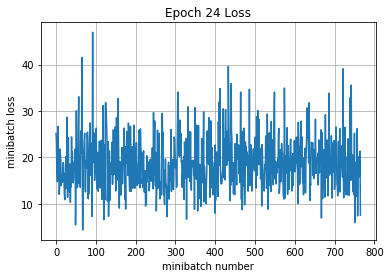

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 18400: with minibatch training loss = 0.331 and accuracy of 0.88
Iteration 18500: with minibatch training loss = 0.393 and accuracy of 0.89
Iteration 18600: with minibatch training loss = 0.261 and accuracy of 0.92
Iteration 18700: with minibatch training loss = 0.119 and accuracy of 0.98
Iteration 18800: with minibatch training loss = 0.325 and accuracy of 0.89
Iteration 18900: with minibatch training loss = 0.231 and accuracy of 0.94
Iteration 19000: with minibatch training loss = 0.291 and accuracy of 0.89
Iteration 19100: with minibatch training loss = 0.491 and accuracy of 0.83
Epoch 25, Overall loss = 0.288 and accuracy of 0.895


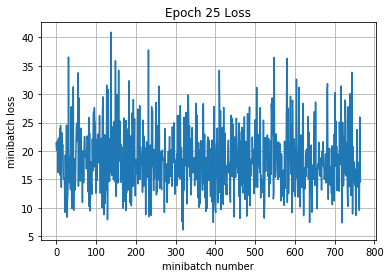

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 19200: with minibatch training loss = 0.35 and accuracy of 0.91
Iteration 19300: with minibatch training loss = 0.184 and accuracy of 0.95
Iteration 19400: with minibatch training loss = 0.259 and accuracy of 0.91
Iteration 19500: with minibatch training loss = 0.388 and accuracy of 0.84
Iteration 19600: with minibatch training loss = 0.356 and accuracy of 0.86
Iteration 19700: with minibatch training loss = 0.408 and accuracy of 0.84
Iteration 19800: with minibatch training loss = 0.358 and accuracy of 0.88
Iteration 19900: with minibatch training loss = 0.332 and accuracy of 0.89
Epoch 26, Overall loss = 0.282 and accuracy of 0.9


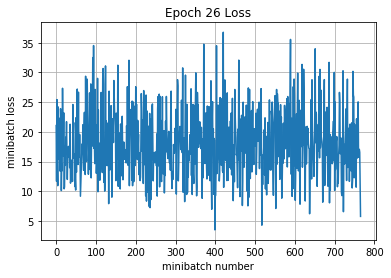

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 20000: with minibatch training loss = 0.288 and accuracy of 0.86
Iteration 20100: with minibatch training loss = 0.218 and accuracy of 0.92
Iteration 20200: with minibatch training loss = 0.307 and accuracy of 0.91
Iteration 20300: with minibatch training loss = 0.204 and accuracy of 0.94
Iteration 20400: with minibatch training loss = 0.326 and accuracy of 0.91
Iteration 20500: with minibatch training loss = 0.252 and accuracy of 0.94
Iteration 20600: with minibatch training loss = 0.143 and accuracy of 0.95
Epoch 27, Overall loss = 0.276 and accuracy of 0.9


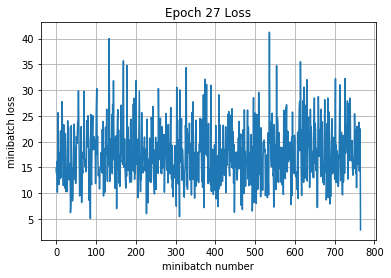

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 20700: with minibatch training loss = 0.281 and accuracy of 0.92
Iteration 20800: with minibatch training loss = 0.246 and accuracy of 0.92
Iteration 20900: with minibatch training loss = 0.45 and accuracy of 0.81
Iteration 21000: with minibatch training loss = 0.173 and accuracy of 0.95
Iteration 21100: with minibatch training loss = 0.323 and accuracy of 0.89
Iteration 21200: with minibatch training loss = 0.238 and accuracy of 0.86
Iteration 21300: with minibatch training loss = 0.297 and accuracy of 0.88
Iteration 21400: with minibatch training loss = 0.189 and accuracy of 0.95
Epoch 28, Overall loss = 0.267 and accuracy of 0.904


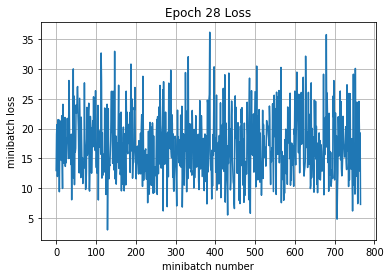

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 21500: with minibatch training loss = 0.341 and accuracy of 0.83
Iteration 21600: with minibatch training loss = 0.201 and accuracy of 0.89
Iteration 21700: with minibatch training loss = 0.381 and accuracy of 0.83
Iteration 21800: with minibatch training loss = 0.219 and accuracy of 0.92
Iteration 21900: with minibatch training loss = 0.195 and accuracy of 0.92
Iteration 22000: with minibatch training loss = 0.184 and accuracy of 0.94
Iteration 22100: with minibatch training loss = 0.153 and accuracy of 0.94
Iteration 22200: with minibatch training loss = 0.363 and accuracy of 0.88
Epoch 29, Overall loss = 0.261 and accuracy of 0.907


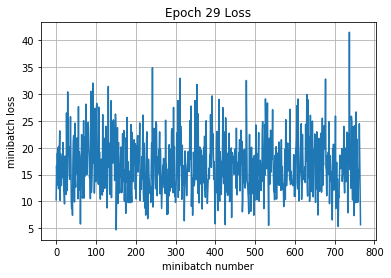

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 22300: with minibatch training loss = 0.207 and accuracy of 0.95
Iteration 22400: with minibatch training loss = 0.407 and accuracy of 0.88
Iteration 22500: with minibatch training loss = 0.378 and accuracy of 0.88
Iteration 22600: with minibatch training loss = 0.269 and accuracy of 0.91
Iteration 22700: with minibatch training loss = 0.522 and accuracy of 0.86
Iteration 22800: with minibatch training loss = 0.39 and accuracy of 0.88
Iteration 22900: with minibatch training loss = 0.33 and accuracy of 0.83
Epoch 30, Overall loss = 0.256 and accuracy of 0.908


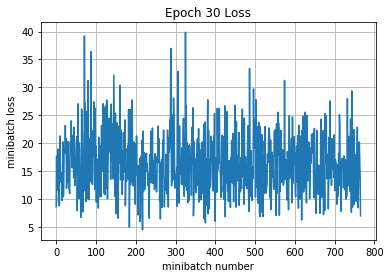

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 23000: with minibatch training loss = 0.177 and accuracy of 0.97
Iteration 23100: with minibatch training loss = 0.104 and accuracy of 0.97
Iteration 23200: with minibatch training loss = 0.33 and accuracy of 0.88
Iteration 23300: with minibatch training loss = 0.333 and accuracy of 0.84
Iteration 23400: with minibatch training loss = 0.233 and accuracy of 0.88
Iteration 23500: with minibatch training loss = 0.184 and accuracy of 0.92
Iteration 23600: with minibatch training loss = 0.255 and accuracy of 0.89
Iteration 23700: with minibatch training loss = 0.12 and accuracy of 0.92
Epoch 31, Overall loss = 0.248 and accuracy of 0.912


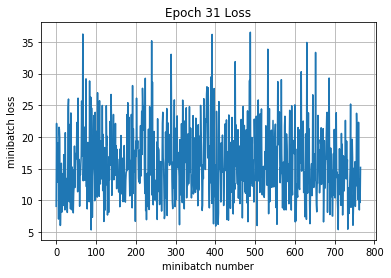

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 23800: with minibatch training loss = 0.35 and accuracy of 0.86
Iteration 23900: with minibatch training loss = 0.305 and accuracy of 0.86
Iteration 24000: with minibatch training loss = 0.214 and accuracy of 0.91
Iteration 24100: with minibatch training loss = 0.267 and accuracy of 0.92
Iteration 24200: with minibatch training loss = 0.272 and accuracy of 0.91
Iteration 24300: with minibatch training loss = 0.277 and accuracy of 0.92
Iteration 24400: with minibatch training loss = 0.419 and accuracy of 0.86
Iteration 24500: with minibatch training loss = 0.297 and accuracy of 0.89
Epoch 32, Overall loss = 0.25 and accuracy of 0.912


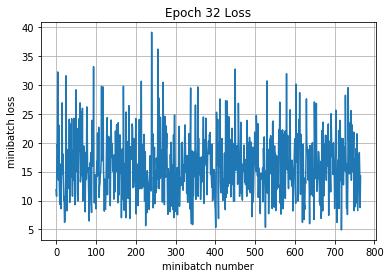

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 24600: with minibatch training loss = 0.252 and accuracy of 0.88
Iteration 24700: with minibatch training loss = 0.279 and accuracy of 0.94
Iteration 24800: with minibatch training loss = 0.45 and accuracy of 0.83
Iteration 24900: with minibatch training loss = 0.242 and accuracy of 0.94
Iteration 25000: with minibatch training loss = 0.179 and accuracy of 0.94
Iteration 25100: with minibatch training loss = 0.198 and accuracy of 0.92
Iteration 25200: with minibatch training loss = 0.18 and accuracy of 0.94
Epoch 33, Overall loss = 0.239 and accuracy of 0.915


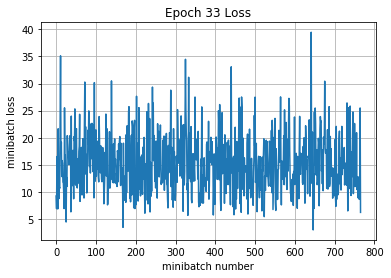

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 25300: with minibatch training loss = 0.138 and accuracy of 0.92
Iteration 25400: with minibatch training loss = 0.459 and accuracy of 0.84
Iteration 25500: with minibatch training loss = 0.173 and accuracy of 0.95
Iteration 25600: with minibatch training loss = 0.149 and accuracy of 0.97
Iteration 25700: with minibatch training loss = 0.275 and accuracy of 0.89
Iteration 25800: with minibatch training loss = 0.116 and accuracy of 0.94
Iteration 25900: with minibatch training loss = 0.175 and accuracy of 0.95
Iteration 26000: with minibatch training loss = 0.131 and accuracy of 0.95
Epoch 34, Overall loss = 0.241 and accuracy of 0.913


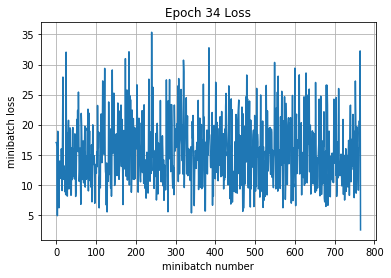

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 26100: with minibatch training loss = 0.265 and accuracy of 0.92
Iteration 26200: with minibatch training loss = 0.185 and accuracy of 0.95
Iteration 26300: with minibatch training loss = 0.259 and accuracy of 0.95
Iteration 26400: with minibatch training loss = 0.299 and accuracy of 0.89
Iteration 26500: with minibatch training loss = 0.205 and accuracy of 0.92
Iteration 26600: with minibatch training loss = 0.125 and accuracy of 0.97
Iteration 26700: with minibatch training loss = 0.192 and accuracy of 0.92
Iteration 26800: with minibatch training loss = 0.241 and accuracy of 0.91
Epoch 35, Overall loss = 0.232 and accuracy of 0.917


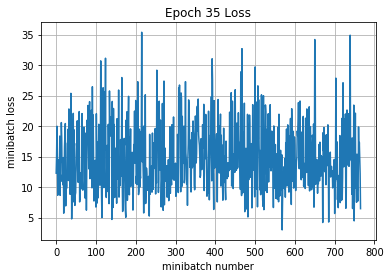

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 26900: with minibatch training loss = 0.327 and accuracy of 0.88
Iteration 27000: with minibatch training loss = 0.146 and accuracy of 0.95
Iteration 27100: with minibatch training loss = 0.332 and accuracy of 0.91
Iteration 27200: with minibatch training loss = 0.163 and accuracy of 0.94
Iteration 27300: with minibatch training loss = 0.397 and accuracy of 0.84
Iteration 27400: with minibatch training loss = 0.387 and accuracy of 0.88
Iteration 27500: with minibatch training loss = 0.176 and accuracy of 0.94
Epoch 36, Overall loss = 0.231 and accuracy of 0.918


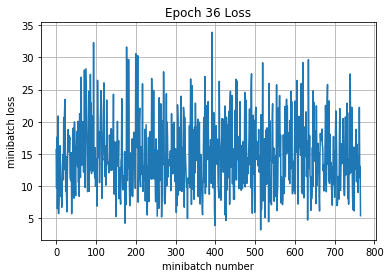

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 27600: with minibatch training loss = 0.133 and accuracy of 0.97
Iteration 27700: with minibatch training loss = 0.35 and accuracy of 0.83
Iteration 27800: with minibatch training loss = 0.34 and accuracy of 0.91
Iteration 27900: with minibatch training loss = 0.347 and accuracy of 0.88
Iteration 28000: with minibatch training loss = 0.3 and accuracy of 0.91
Iteration 28100: with minibatch training loss = 0.128 and accuracy of 0.94
Iteration 28200: with minibatch training loss = 0.169 and accuracy of 0.94
Iteration 28300: with minibatch training loss = 0.165 and accuracy of 0.94
Epoch 37, Overall loss = 0.221 and accuracy of 0.921


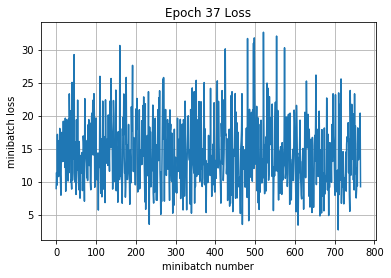

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 28400: with minibatch training loss = 0.321 and accuracy of 0.92
Iteration 28500: with minibatch training loss = 0.33 and accuracy of 0.89
Iteration 28600: with minibatch training loss = 0.178 and accuracy of 0.94
Iteration 28700: with minibatch training loss = 0.496 and accuracy of 0.88
Iteration 28800: with minibatch training loss = 0.138 and accuracy of 0.97
Iteration 28900: with minibatch training loss = 0.242 and accuracy of 0.92
Iteration 29000: with minibatch training loss = 0.119 and accuracy of 0.95
Iteration 29100: with minibatch training loss = 0.261 and accuracy of 0.89
Epoch 38, Overall loss = 0.214 and accuracy of 0.922


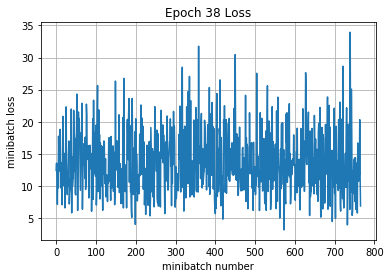

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 29200: with minibatch training loss = 0.279 and accuracy of 0.91
Iteration 29300: with minibatch training loss = 0.249 and accuracy of 0.92
Iteration 29400: with minibatch training loss = 0.175 and accuracy of 0.94
Iteration 29500: with minibatch training loss = 0.303 and accuracy of 0.92
Iteration 29600: with minibatch training loss = 0.114 and accuracy of 0.97
Iteration 29700: with minibatch training loss = 0.189 and accuracy of 0.95
Iteration 29800: with minibatch training loss = 0.215 and accuracy of 0.94
Epoch 39, Overall loss = 0.219 and accuracy of 0.922


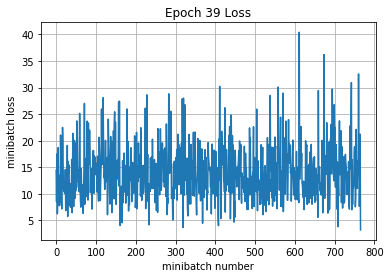

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 29900: with minibatch training loss = 0.0748 and accuracy of 0.97
Iteration 30000: with minibatch training loss = 0.265 and accuracy of 0.89
Iteration 30100: with minibatch training loss = 0.257 and accuracy of 0.92
Iteration 30200: with minibatch training loss = 0.457 and accuracy of 0.83
Iteration 30300: with minibatch training loss = 0.229 and accuracy of 0.94
Iteration 30400: with minibatch training loss = 0.215 and accuracy of 0.94
Iteration 30500: with minibatch training loss = 0.221 and accuracy of 0.94
Iteration 30600: with minibatch training loss = 0.141 and accuracy of 0.97
Epoch 40, Overall loss = 0.211 and accuracy of 0.924


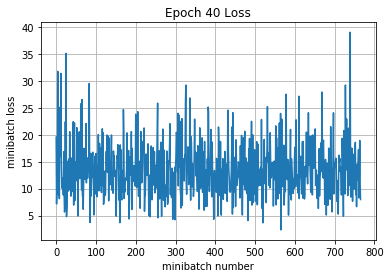

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 30700: with minibatch training loss = 0.177 and accuracy of 0.95
Iteration 30800: with minibatch training loss = 0.217 and accuracy of 0.94
Iteration 30900: with minibatch training loss = 0.241 and accuracy of 0.94
Iteration 31000: with minibatch training loss = 0.162 and accuracy of 0.94
Iteration 31100: with minibatch training loss = 0.316 and accuracy of 0.92
Iteration 31200: with minibatch training loss = 0.259 and accuracy of 0.92
Iteration 31300: with minibatch training loss = 0.303 and accuracy of 0.86
Iteration 31400: with minibatch training loss = 0.122 and accuracy of 0.95
Epoch 41, Overall loss = 0.213 and accuracy of 0.925


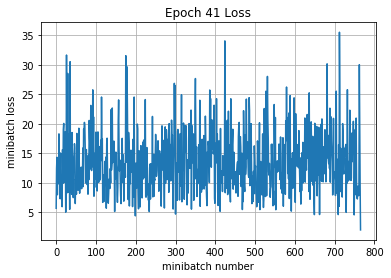

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 31500: with minibatch training loss = 0.17 and accuracy of 0.92
Iteration 31600: with minibatch training loss = 0.231 and accuracy of 0.94
Iteration 31700: with minibatch training loss = 0.32 and accuracy of 0.92
Iteration 31800: with minibatch training loss = 0.263 and accuracy of 0.94
Iteration 31900: with minibatch training loss = 0.0848 and accuracy of 0.97
Iteration 32000: with minibatch training loss = 0.255 and accuracy of 0.92
Iteration 32100: with minibatch training loss = 0.0729 and accuracy of 0.98
Epoch 42, Overall loss = 0.207 and accuracy of 0.927


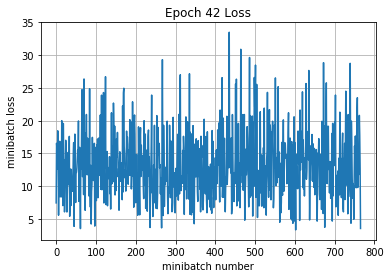

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 32200: with minibatch training loss = 0.294 and accuracy of 0.89
Iteration 32300: with minibatch training loss = 0.243 and accuracy of 0.89
Iteration 32400: with minibatch training loss = 0.328 and accuracy of 0.88
Iteration 32500: with minibatch training loss = 0.0941 and accuracy of 0.95
Iteration 32600: with minibatch training loss = 0.278 and accuracy of 0.89
Iteration 32700: with minibatch training loss = 0.193 and accuracy of 0.94
Iteration 32800: with minibatch training loss = 0.19 and accuracy of 0.92
Iteration 32900: with minibatch training loss = 0.157 and accuracy of 0.94
Epoch 43, Overall loss = 0.208 and accuracy of 0.927


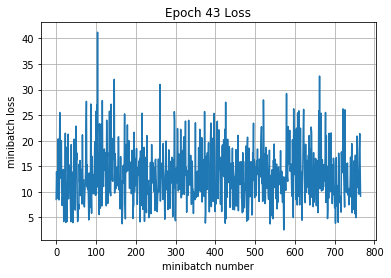

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 33000: with minibatch training loss = 0.211 and accuracy of 0.94
Iteration 33100: with minibatch training loss = 0.0776 and accuracy of 0.98
Iteration 33200: with minibatch training loss = 0.313 and accuracy of 0.88
Iteration 33300: with minibatch training loss = 0.177 and accuracy of 0.95
Iteration 33400: with minibatch training loss = 0.148 and accuracy of 0.95
Iteration 33500: with minibatch training loss = 0.198 and accuracy of 0.91
Iteration 33600: with minibatch training loss = 0.133 and accuracy of 0.95
Iteration 33700: with minibatch training loss = 0.244 and accuracy of 0.92
Epoch 44, Overall loss = 0.2 and accuracy of 0.93


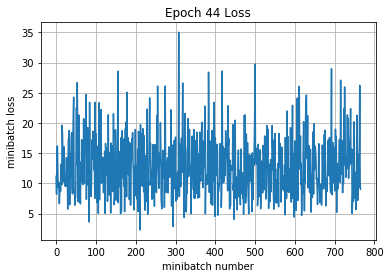

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 33800: with minibatch training loss = 0.178 and accuracy of 0.91
Iteration 33900: with minibatch training loss = 0.191 and accuracy of 0.92
Iteration 34000: with minibatch training loss = 0.138 and accuracy of 0.95
Iteration 34100: with minibatch training loss = 0.204 and accuracy of 0.91
Iteration 34200: with minibatch training loss = 0.217 and accuracy of 0.94
Iteration 34300: with minibatch training loss = 0.108 and accuracy of 0.97
Iteration 34400: with minibatch training loss = 0.228 and accuracy of 0.92
Epoch 45, Overall loss = 0.202 and accuracy of 0.927


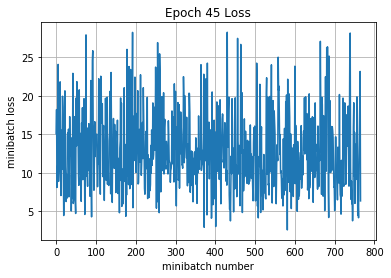

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 34500: with minibatch training loss = 0.407 and accuracy of 0.88
Iteration 34600: with minibatch training loss = 0.234 and accuracy of 0.91
Iteration 34700: with minibatch training loss = 0.187 and accuracy of 0.97
Iteration 34800: with minibatch training loss = 0.114 and accuracy of 0.97
Iteration 34900: with minibatch training loss = 0.28 and accuracy of 0.94
Iteration 35000: with minibatch training loss = 0.285 and accuracy of 0.89
Iteration 35100: with minibatch training loss = 0.162 and accuracy of 0.92
Iteration 35200: with minibatch training loss = 0.148 and accuracy of 0.94
Epoch 46, Overall loss = 0.198 and accuracy of 0.93


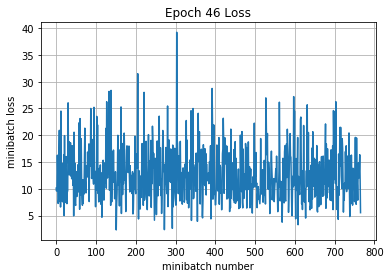

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 35300: with minibatch training loss = 0.375 and accuracy of 0.86
Iteration 35400: with minibatch training loss = 0.245 and accuracy of 0.92
Iteration 35500: with minibatch training loss = 0.0373 and accuracy of 1
Iteration 35600: with minibatch training loss = 0.142 and accuracy of 0.94
Iteration 35700: with minibatch training loss = 0.096 and accuracy of 0.97
Iteration 35800: with minibatch training loss = 0.155 and accuracy of 0.94
Iteration 35900: with minibatch training loss = 0.195 and accuracy of 0.92
Iteration 36000: with minibatch training loss = 0.222 and accuracy of 0.89
Epoch 47, Overall loss = 0.193 and accuracy of 0.932


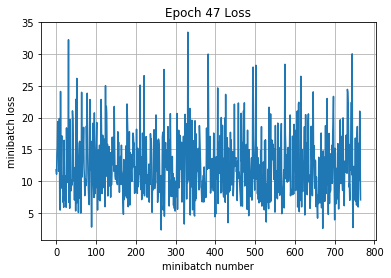

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 36100: with minibatch training loss = 0.228 and accuracy of 0.92
Iteration 36200: with minibatch training loss = 0.158 and accuracy of 0.92
Iteration 36300: with minibatch training loss = 0.175 and accuracy of 0.95
Iteration 36400: with minibatch training loss = 0.283 and accuracy of 0.92
Iteration 36500: with minibatch training loss = 0.134 and accuracy of 0.94
Iteration 36600: with minibatch training loss = 0.194 and accuracy of 0.97
Iteration 36700: with minibatch training loss = 0.112 and accuracy of 0.97
Epoch 48, Overall loss = 0.194 and accuracy of 0.931


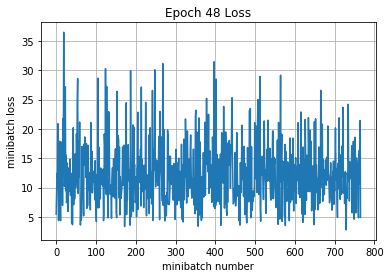

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 36800: with minibatch training loss = 0.159 and accuracy of 0.94
Iteration 36900: with minibatch training loss = 0.173 and accuracy of 0.95
Iteration 37000: with minibatch training loss = 0.337 and accuracy of 0.91
Iteration 37100: with minibatch training loss = 0.215 and accuracy of 0.92
Iteration 37200: with minibatch training loss = 0.147 and accuracy of 0.95
Iteration 37300: with minibatch training loss = 0.236 and accuracy of 0.92
Iteration 37400: with minibatch training loss = 0.123 and accuracy of 0.97
Iteration 37500: with minibatch training loss = 0.159 and accuracy of 0.95
Epoch 49, Overall loss = 0.185 and accuracy of 0.934


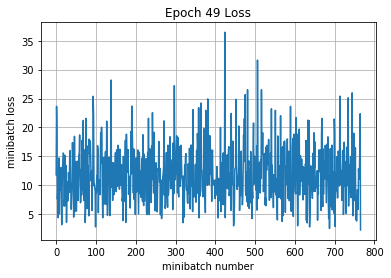

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 37600: with minibatch training loss = 0.131 and accuracy of 0.95
Iteration 37700: with minibatch training loss = 0.204 and accuracy of 0.89
Iteration 37800: with minibatch training loss = 0.15 and accuracy of 0.94
Iteration 37900: with minibatch training loss = 0.168 and accuracy of 0.94
Iteration 38000: with minibatch training loss = 0.0843 and accuracy of 0.97
Iteration 38100: with minibatch training loss = 0.0908 and accuracy of 0.95
Iteration 38200: with minibatch training loss = 0.11 and accuracy of 0.95
Epoch 50, Overall loss = 0.186 and accuracy of 0.935


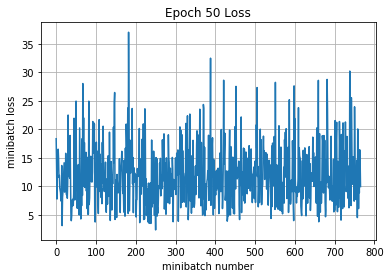

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 38300: with minibatch training loss = 0.284 and accuracy of 0.94
Iteration 38400: with minibatch training loss = 0.23 and accuracy of 0.91
Iteration 38500: with minibatch training loss = 0.227 and accuracy of 0.91
Iteration 38600: with minibatch training loss = 0.0865 and accuracy of 0.98
Iteration 38700: with minibatch training loss = 0.0991 and accuracy of 0.97
Iteration 38800: with minibatch training loss = 0.286 and accuracy of 0.91
Iteration 38900: with minibatch training loss = 0.184 and accuracy of 0.92
Iteration 39000: with minibatch training loss = 0.15 and accuracy of 0.94
Epoch 51, Overall loss = 0.183 and accuracy of 0.935


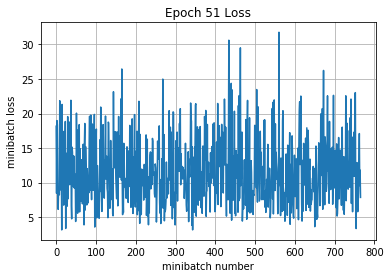

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 39100: with minibatch training loss = 0.189 and accuracy of 0.95
Iteration 39200: with minibatch training loss = 0.134 and accuracy of 0.95
Iteration 39300: with minibatch training loss = 0.157 and accuracy of 0.95
Iteration 39400: with minibatch training loss = 0.177 and accuracy of 0.95
Iteration 39500: with minibatch training loss = 0.154 and accuracy of 0.97
Iteration 39600: with minibatch training loss = 0.223 and accuracy of 0.91
Iteration 39700: with minibatch training loss = 0.163 and accuracy of 0.95
Iteration 39800: with minibatch training loss = 0.24 and accuracy of 0.89
Epoch 52, Overall loss = 0.18 and accuracy of 0.936


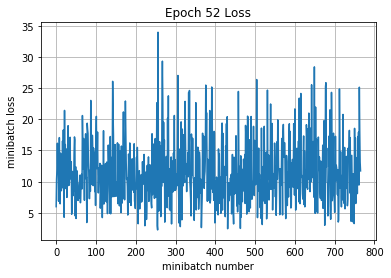

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 39900: with minibatch training loss = 0.0677 and accuracy of 0.98
Iteration 40000: with minibatch training loss = 0.132 and accuracy of 0.94
Iteration 40100: with minibatch training loss = 0.254 and accuracy of 0.91
Iteration 40200: with minibatch training loss = 0.115 and accuracy of 0.98
Iteration 40300: with minibatch training loss = 0.0751 and accuracy of 0.97
Iteration 40400: with minibatch training loss = 0.1 and accuracy of 0.95
Iteration 40500: with minibatch training loss = 0.171 and accuracy of 0.97
Epoch 53, Overall loss = 0.179 and accuracy of 0.937


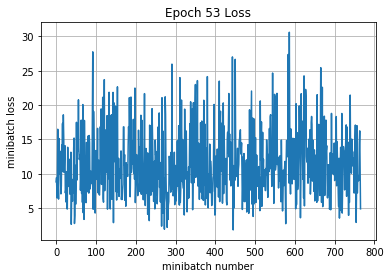

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 40600: with minibatch training loss = 0.0814 and accuracy of 0.98
Iteration 40700: with minibatch training loss = 0.239 and accuracy of 0.92
Iteration 40800: with minibatch training loss = 0.155 and accuracy of 0.94
Iteration 40900: with minibatch training loss = 0.172 and accuracy of 0.94
Iteration 41000: with minibatch training loss = 0.192 and accuracy of 0.95
Iteration 41100: with minibatch training loss = 0.192 and accuracy of 0.92
Iteration 41200: with minibatch training loss = 0.176 and accuracy of 0.91
Iteration 41300: with minibatch training loss = 0.359 and accuracy of 0.92
Epoch 54, Overall loss = 0.177 and accuracy of 0.937


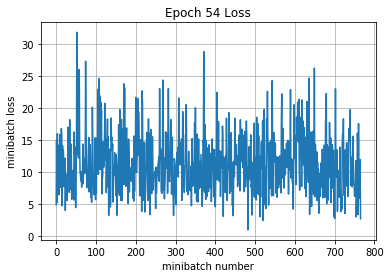

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 41400: with minibatch training loss = 0.113 and accuracy of 0.97
Iteration 41500: with minibatch training loss = 0.253 and accuracy of 0.92
Iteration 41600: with minibatch training loss = 0.197 and accuracy of 0.94
Iteration 41700: with minibatch training loss = 0.197 and accuracy of 0.94
Iteration 41800: with minibatch training loss = 0.14 and accuracy of 0.95
Iteration 41900: with minibatch training loss = 0.104 and accuracy of 0.98
Iteration 42000: with minibatch training loss = 0.137 and accuracy of 0.94
Iteration 42100: with minibatch training loss = 0.182 and accuracy of 0.92
Epoch 55, Overall loss = 0.175 and accuracy of 0.939


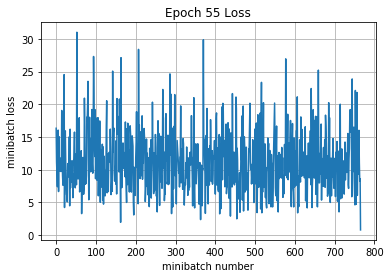

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 42200: with minibatch training loss = 0.14 and accuracy of 0.95
Iteration 42300: with minibatch training loss = 0.0866 and accuracy of 0.97
Iteration 42400: with minibatch training loss = 0.0928 and accuracy of 0.97
Iteration 42500: with minibatch training loss = 0.253 and accuracy of 0.95
Iteration 42600: with minibatch training loss = 0.306 and accuracy of 0.91
Iteration 42700: with minibatch training loss = 0.147 and accuracy of 0.94
Iteration 42800: with minibatch training loss = 0.0933 and accuracy of 0.95
Epoch 56, Overall loss = 0.171 and accuracy of 0.94


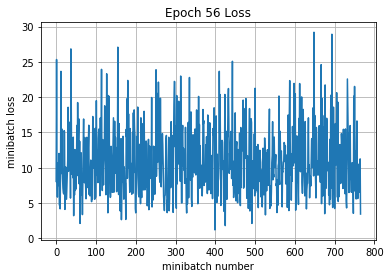

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 42900: with minibatch training loss = 0.3 and accuracy of 0.94
Iteration 43000: with minibatch training loss = 0.257 and accuracy of 0.89
Iteration 43100: with minibatch training loss = 0.166 and accuracy of 0.94
Iteration 43200: with minibatch training loss = 0.319 and accuracy of 0.89
Iteration 43300: with minibatch training loss = 0.133 and accuracy of 0.97
Iteration 43400: with minibatch training loss = 0.216 and accuracy of 0.92
Iteration 43500: with minibatch training loss = 0.15 and accuracy of 0.94
Iteration 43600: with minibatch training loss = 0.175 and accuracy of 0.94
Epoch 57, Overall loss = 0.169 and accuracy of 0.941


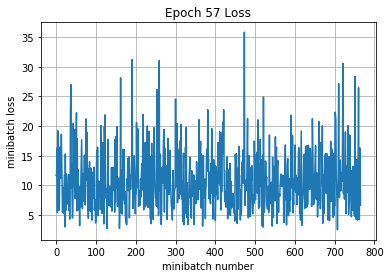

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 43700: with minibatch training loss = 0.161 and accuracy of 0.94
Iteration 43800: with minibatch training loss = 0.194 and accuracy of 0.91
Iteration 43900: with minibatch training loss = 0.118 and accuracy of 0.98
Iteration 44000: with minibatch training loss = 0.0682 and accuracy of 0.98
Iteration 44100: with minibatch training loss = 0.2 and accuracy of 0.92
Iteration 44200: with minibatch training loss = 0.106 and accuracy of 0.97
Iteration 44300: with minibatch training loss = 0.134 and accuracy of 0.97
Iteration 44400: with minibatch training loss = 0.269 and accuracy of 0.89
Epoch 58, Overall loss = 0.167 and accuracy of 0.941


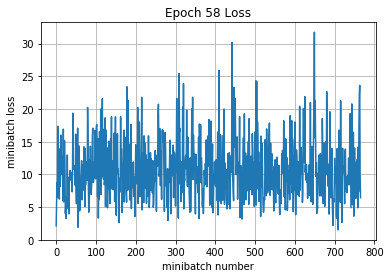

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 44500: with minibatch training loss = 0.109 and accuracy of 0.97
Iteration 44600: with minibatch training loss = 0.0459 and accuracy of 1
Iteration 44700: with minibatch training loss = 0.147 and accuracy of 0.95
Iteration 44800: with minibatch training loss = 0.123 and accuracy of 0.97
Iteration 44900: with minibatch training loss = 0.108 and accuracy of 0.95
Iteration 45000: with minibatch training loss = 0.2 and accuracy of 0.92
Iteration 45100: with minibatch training loss = 0.296 and accuracy of 0.91
Epoch 59, Overall loss = 0.171 and accuracy of 0.94


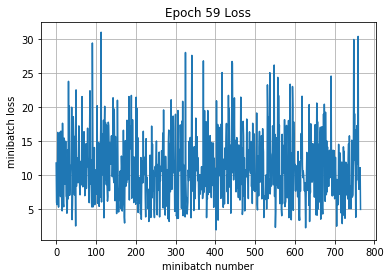

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 45200: with minibatch training loss = 0.0625 and accuracy of 0.97
Iteration 45300: with minibatch training loss = 0.305 and accuracy of 0.89
Iteration 45400: with minibatch training loss = 0.138 and accuracy of 0.94
Iteration 45500: with minibatch training loss = 0.109 and accuracy of 0.95
Iteration 45600: with minibatch training loss = 0.189 and accuracy of 0.92
Iteration 45700: with minibatch training loss = 0.0657 and accuracy of 0.97
Iteration 45800: with minibatch training loss = 0.184 and accuracy of 0.94
Iteration 45900: with minibatch training loss = 0.221 and accuracy of 0.89
Epoch 60, Overall loss = 0.165 and accuracy of 0.943


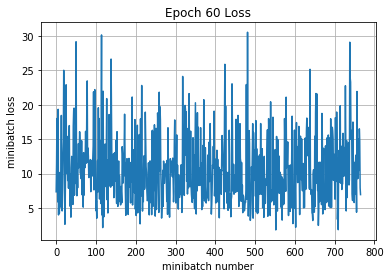

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 46000: with minibatch training loss = 0.191 and accuracy of 0.95
Iteration 46100: with minibatch training loss = 0.0535 and accuracy of 0.98
Iteration 46200: with minibatch training loss = 0.0768 and accuracy of 0.98
Iteration 46300: with minibatch training loss = 0.112 and accuracy of 0.94
Iteration 46400: with minibatch training loss = 0.321 and accuracy of 0.86
Iteration 46500: with minibatch training loss = 0.0588 and accuracy of 0.98
Iteration 46600: with minibatch training loss = 0.033 and accuracy of 1
Iteration 46700: with minibatch training loss = 0.165 and accuracy of 0.97
Epoch 61, Overall loss = 0.167 and accuracy of 0.941


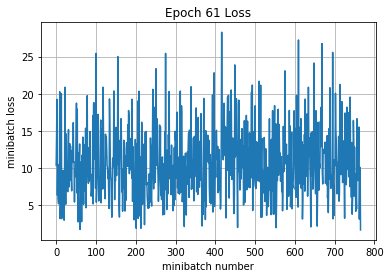

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 46800: with minibatch training loss = 0.0958 and accuracy of 0.97
Iteration 46900: with minibatch training loss = 0.126 and accuracy of 0.95
Iteration 47000: with minibatch training loss = 0.12 and accuracy of 0.92
Iteration 47100: with minibatch training loss = 0.183 and accuracy of 0.92
Iteration 47200: with minibatch training loss = 0.0989 and accuracy of 0.98
Iteration 47300: with minibatch training loss = 0.179 and accuracy of 0.92
Iteration 47400: with minibatch training loss = 0.273 and accuracy of 0.89
Epoch 62, Overall loss = 0.16 and accuracy of 0.943


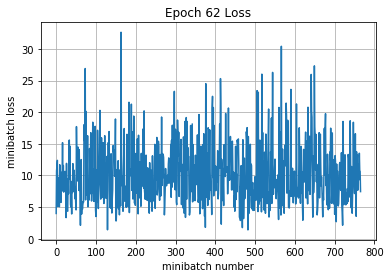

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 47500: with minibatch training loss = 0.112 and accuracy of 0.97
Iteration 47600: with minibatch training loss = 0.137 and accuracy of 0.92
Iteration 47700: with minibatch training loss = 0.151 and accuracy of 0.95
Iteration 47800: with minibatch training loss = 0.265 and accuracy of 0.89
Iteration 47900: with minibatch training loss = 0.283 and accuracy of 0.92
Iteration 48000: with minibatch training loss = 0.129 and accuracy of 0.97
Iteration 48100: with minibatch training loss = 0.0962 and accuracy of 0.97
Iteration 48200: with minibatch training loss = 0.0873 and accuracy of 0.97
Epoch 63, Overall loss = 0.158 and accuracy of 0.945


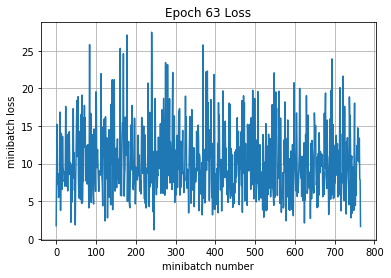

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 48300: with minibatch training loss = 0.0962 and accuracy of 0.98
Iteration 48400: with minibatch training loss = 0.32 and accuracy of 0.91
Iteration 48500: with minibatch training loss = 0.287 and accuracy of 0.92
Iteration 48600: with minibatch training loss = 0.218 and accuracy of 0.92
Iteration 48700: with minibatch training loss = 0.148 and accuracy of 0.94
Iteration 48800: with minibatch training loss = 0.147 and accuracy of 0.92
Iteration 48900: with minibatch training loss = 0.156 and accuracy of 0.95
Iteration 49000: with minibatch training loss = 0.139 and accuracy of 0.95
Epoch 64, Overall loss = 0.156 and accuracy of 0.944


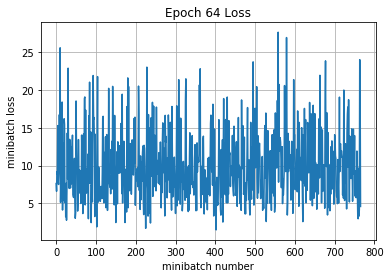

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
Iteration 49100: with minibatch training loss = 0.0631 and accuracy of 0.98
Iteration 49200: with minibatch training loss = 0.273 and accuracy of 0.91
Iteration 49300: with minibatch training loss = 0.127 and accuracy of 0.94
Iteration 49400: with minibatch training loss = 0.235 and accuracy of 0.91
Iteration 49500: with minibatch training loss = 0.0717 and accuracy of 0.98
Iteration 49600: with minibatch training loss = 0.0764 and accuracy of 0.95
Iteration 49700: with minibatch training loss = 0.103 and accuracy of 0.98
Epoch 65, Overall loss = 0.162 and accuracy of 0.943


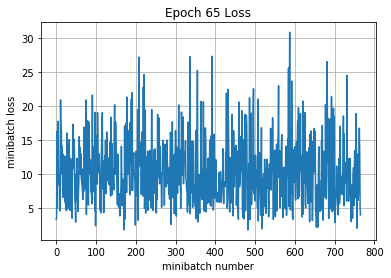

Model saved in path: ./snapshots/cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5/dropout-0.3/model
training time (seconds) 21728.249586000005
Validation
Epoch 1, Overall loss = 0.822 and accuracy of 0.8
validation time (seconds) 3.011521199994604
predict
Epoch 1, Overall loss = 1.79e-06 and accuracy of 1


In [97]:
def cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5_model(X, y, is_training, 
                                                                               dropout=None,
                                                                               **kwargs):
    out = X

    #32
    out, [W1, b1] = cnn(idx=1, X=out, filters=32, kernel_size=(5,5), is_training=is_training, padding='VALID')
    #28
    if dropout is not None:
        out = tf.layers.dropout(out, rate=dropout, training=is_training)
    out, _ = cnn(idx=2, X=out, filters=32, kernel_size=(5,5), is_training=is_training, padding='VALID')
    #24
    out = tf.nn.max_pool(out, ksize=(1,2,2,1), strides=(1,2,2,1), padding='SAME')
    #12
    if dropout is not None:    
        out = tf.layers.dropout(out, rate=dropout, training=is_training)
    out, _ = cnn(idx=3, X=out, filters=64, kernel_size=(5,5), is_training=is_training, padding='VALID')
    #8
    if dropout is not None:    
        out = tf.layers.dropout(out, rate=dropout, training=is_training)
    out, _ = cnn(idx=4, X=out, filters=128, kernel_size=(5,5), is_training=is_training, padding='VALID')
    #4
    if dropout is not None:    
        out = tf.layers.dropout(out, rate=dropout, training=is_training)

    # Affine layer from 4x4x128 = 2,048 to 1024 outputs
    out, _ = affine(1, out, output_size=1024)

    # ReLU Activation Layer
    out = tf.nn.relu(out)

    out = tf.layers.batch_normalization(out, training=is_training)
    if dropout is not None:    
        out = tf.layers.dropout(out, rate=dropout, training=is_training)
    # 5)
    # Affine layer from 1024 input units to 10 outputs
    out, _ = affine(2, out, output_size=10)
    return out, [W1]

cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5_models = []

cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5_models.append(estimate_model({
    'group': 'cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5',    
    'name': 'dropout: 0.3',
    'dropout': 0.3,
    'model_builder': cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5_model,
    'learning_rate': 5e-4,
    'num_of_epochs': 65,
}, X_train, y_train, X_val, y_val))

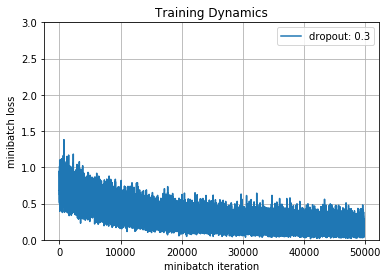

model: dropout: 0.3


,num_of_trainable,predict,training,validation
time,2395242,0.295702,21728.2,3.01152
total_correct,2395242,NaN,0.943265,0.8
total_lost,2395242,NaN,0.161721,0.821776


Model dropout: 0.3


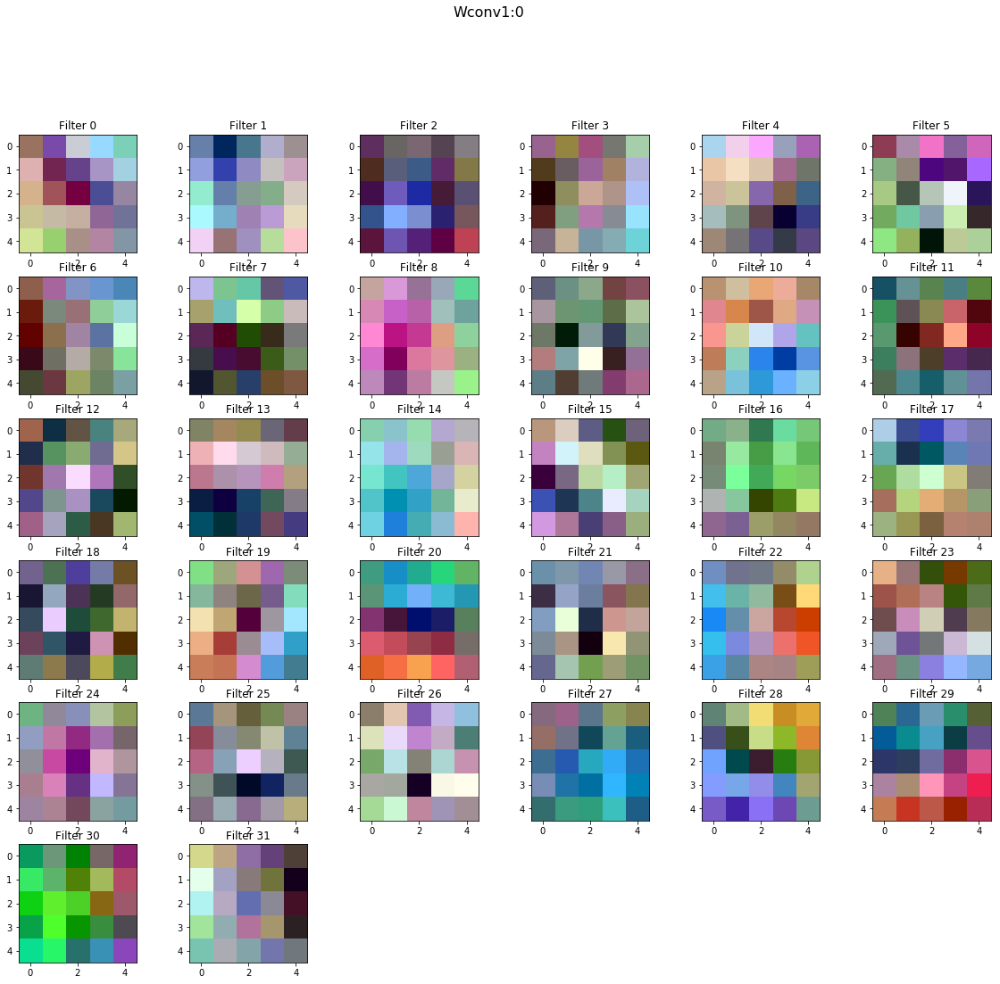

In [98]:
show_graphs(cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5_models, ymax=3)
show_tables(cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5_models)
draw_layers_of_models(cnn_32x5x5_cnn_32x5x5_cnn_64x5x5_cnn_128x5x5_models)